## OpenLane Colab

This Google Colab notebook will:
* Install OpenLane and its dependencies
* Run a simple design, namely a serial-parallel multiplier, through the flow
  and targeting the [open source sky130 PDK](https://github.com/google/skywater-pdk/)
  by Google and Skywater.

In [ ]:
# @title Setup Nix {display-mode: "form"}
# @markdown <img src="https://raw.githubusercontent.com/NixOS/nixos-artwork/master/logo/nix-snowflake.svg" width="32"/>
# @markdown
# @markdown Nix is a package manager with an emphasis on reproducible builds,
# @markdown and it is the primary method for installing OpenLane 2.
# @markdown
# @markdown This step installs the Nix package manager and enables the
# @markdown experimental "flakes" feature.
# @markdown
# @markdown If you're not in a Colab, this just sets the environment variables.
# @markdown You will need to install Nix and enable flakes on your own following
# @markdown [this guide](https://openlane2.readthedocs.io/en/stable/getting_started/common/nix_installation/index.html).
import os
import sys
import shutil

os.environ["LOCALE_ARCHIVE"] = "/usr/lib/locale/locale-archive"

if "google.colab" in sys.modules:
    if shutil.which("nix-env") is None:
        !curl -L https://nixos.org/nix/install | bash -s -- --daemon --yes
        !echo "extra-experimental-features = nix-command flakes" >> /etc/nix/nix.conf
        !killall nix-daemon
else:
    if shutil.which("nix-env") is None:
        raise RuntimeError("Nix is not installed!")

os.environ["PATH"] = f"/nix/var/nix/profiles/default/bin/:{os.getenv('PATH')}"

In [ ]:
# @title Get OpenLane {display-mode: "form"}
# @markdown Click the ▷ button to download and install OpenLane.
# @markdown
# @markdown This will install OpenLane's tool dependencies using Nix,
# @markdown and OpenLane itself using PIP.
# @markdown
# @markdown Note that `python3-tk` may need to be installed using your OS's
# @markdown package manager.
import os
import subprocess
import IPython

openlane_version = "version-2.1"  # @param {key:"OpenLane Version", type:"string"}

if openlane_version == "latest":
    openlane_version = "main"

pdk_root = "~/.volare"  # @param {key:"PDK Root", type:"string"}

pdk_root = os.path.expanduser(pdk_root)

pdk = "sky130"  # @param {key:"PDK (without the variant)", type:"string"}

openlane_ipynb_path = os.path.join(os.getcwd(), "openlane_ipynb")

display(IPython.display.HTML("<h3>Downloading OpenLane…</a>"))


TESTING_LOCALLY = False
!rm -rf {openlane_ipynb_path}
!mkdir -p {openlane_ipynb_path}
if TESTING_LOCALLY:
    !ln -s {os.getcwd()} {openlane_ipynb_path}
else:
    !curl -L "https://github.com/efabless/openlane2/tarball/{openlane_version}" | tar -xzC {openlane_ipynb_path} --strip-components 1

try:
    import tkinter
except ImportError:
    if "google.colab" in sys.modules:
        !sudo apt-get install python-tk

try:
    import tkinter
except ImportError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to import the <code>tkinter</code> library for Python, which is required to load PDK configuration values. Make sure <code>python3-tk</code> or equivalent is installed on your system.</a>'
        )
    )
    raise e from None


display(IPython.display.HTML("<h3>Downloading OpenLane's dependencies…</a>"))
try:
    subprocess.check_call(
        ["nix", "profile", "install", ".#colab-env", "--accept-flake-config"],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install binary dependencies using Nix…</h3>'
        )
    )

display(IPython.display.HTML("<h3>Downloading Python dependencies using PIP…</a>"))
try:
    subprocess.check_call(
        ["pip3", "install", "."],
        cwd=openlane_ipynb_path,
    )
except subprocess.CalledProcessError as e:
    display(
        IPython.display.HTML(
            '<h3 style="color: #800020";>❌ Failed to install Python dependencies using PIP…</h3>'
        )
    )
    raise e from None

display(IPython.display.HTML("<h3>Downloading PDK…</a>"))
import volare

volare.enable(
    volare.get_volare_home(pdk_root),
    pdk,
    open(
        os.path.join(openlane_ipynb_path, "openlane", "open_pdks_rev"),
        encoding="utf8",
    )
    .read()
    .strip(),
)

sys.path.insert(0, openlane_ipynb_path)
display(IPython.display.HTML("<h3>⭕️ Done.</a>"))

import logging

# Remove the stupid default colab logging handler
logging.getLogger().handlers.clear()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9491k    0 9491k    0     0  12.3M      0 --:--:-- --:--:-- --:--:-- 20.2M


Version bdc9412b3e468c102d01b7cf6337be06ec6e9c9a enabled for the sky130 PDK.

In [ ]:
import openlane

print(openlane.__version__)

2.1.11


### Creating the design

Now that OpenLane is set up, we can write a Verilog file as follows:

In [ ]:
%%writefile final.v
// final.v
// All modules converted to Verilog-2001/2005 style with flattened I/O
// and function-based constants where applicable.

`timescale 1ns/1ps

// ============================================================================
// Module: relu_module (Verilog-2005 Style)
// ============================================================================
module relu_module #(
    parameter NUM_CHANNELS = 4,
    parameter FRAMES_PER_CHANNEL = 1,
    parameter DATA_WIDTH = 16
) (
    clk,
    rst_n,
    i_start,
    i_data_flat,
    o_done_tick,
    o_result_flat
);

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(NUM_CHANNELS * FRAMES_PER_CHANNEL * DATA_WIDTH)-1:0] i_data_flat;
    output reg o_done_tick;
    output wire signed [(NUM_CHANNELS * FRAMES_PER_CHANNEL * DATA_WIDTH)-1:0] o_result_flat;

    wire signed [DATA_WIDTH-1:0] i_data_unpacked [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL-1];
    reg signed [DATA_WIDTH-1:0] temp_result_comb [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL-1];
    reg signed [DATA_WIDTH-1:0] o_result_internal [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL-1];

    localparam STATE_IDLE = 1'b0;
    localparam STATE_APPLY_RELU = 1'b1;
    reg current_state, next_state;

    genvar ch_unpack_relu, fr_unpack_relu;
    generate
        for (ch_unpack_relu = 0; ch_unpack_relu < NUM_CHANNELS; ch_unpack_relu = ch_unpack_relu + 1) begin : unpack_ch_relu
            for (fr_unpack_relu = 0; fr_unpack_relu < FRAMES_PER_CHANNEL; fr_unpack_relu = fr_unpack_relu + 1) begin : unpack_fr_relu
                localparam base_idx = (ch_unpack_relu * FRAMES_PER_CHANNEL + fr_unpack_relu) * DATA_WIDTH;
                assign i_data_unpacked[ch_unpack_relu][fr_unpack_relu] = i_data_flat[base_idx + DATA_WIDTH - 1 : base_idx];
            end
        end
    endgenerate

    always @(posedge clk or negedge rst_n) begin
        if (!rst_n) current_state <= STATE_IDLE;
        else current_state <= next_state;
    end

    always @(*) begin
        next_state = current_state;
        o_done_tick = 1'b0;
        case (current_state)
            STATE_IDLE: if (i_start) next_state = STATE_APPLY_RELU;
            STATE_APPLY_RELU: begin
                o_done_tick = 1'b1;
                next_state = STATE_IDLE;
            end
            default: next_state = STATE_IDLE;
        endcase
    end

    always @(*) begin
        integer ch, fr;
        for (ch = 0; ch < NUM_CHANNELS; ch = ch + 1) begin
            for (fr = 0; fr < FRAMES_PER_CHANNEL; fr = fr + 1) begin
                if (i_data_unpacked[ch][fr] < 0)
                    temp_result_comb[ch][fr] = {DATA_WIDTH{1'b0}};
                else
                    temp_result_comb[ch][fr] = i_data_unpacked[ch][fr];
            end
        end
    end

    always @(posedge clk or negedge rst_n) begin
        integer ch_reg, fr_reg;
        if (!rst_n) begin
            for (ch_reg = 0; ch_reg < NUM_CHANNELS; ch_reg = ch_reg + 1) begin
                for (fr_reg = 0; fr_reg < FRAMES_PER_CHANNEL; fr_reg = fr_reg + 1) begin
                    o_result_internal[ch_reg][fr_reg] <= {DATA_WIDTH{1'b0}};
                end
            end
        end else if (o_done_tick) begin
            for (ch_reg = 0; ch_reg < NUM_CHANNELS; ch_reg = ch_reg + 1) begin
                for (fr_reg = 0; fr_reg < FRAMES_PER_CHANNEL; fr_reg = fr_reg + 1) begin
                    o_result_internal[ch_reg][fr_reg] <= temp_result_comb[ch_reg][fr_reg];
                end
            end
        end
    end

    genvar ch_pack_relu, fr_pack_relu;
    generate
        for (ch_pack_relu = 0; ch_pack_relu < NUM_CHANNELS; ch_pack_relu = ch_pack_relu + 1) begin : pack_ch_relu
            for (fr_pack_relu = 0; fr_pack_relu < FRAMES_PER_CHANNEL; fr_pack_relu = fr_pack_relu + 1) begin : pack_fr_relu
                localparam base_idx_pack = (ch_pack_relu * FRAMES_PER_CHANNEL + fr_pack_relu) * DATA_WIDTH;
                assign o_result_flat[base_idx_pack + DATA_WIDTH - 1 : base_idx_pack] = o_result_internal[ch_pack_relu][fr_pack_relu];
            end
        end
    endgenerate
endmodule


// ============================================================================
// Module: upsample_module (Verilog-2005 Style)
// ============================================================================
module upsample_module #(
    parameter NUM_CHANNELS = 4,
    parameter FRAMES_PER_CHANNEL_IN = 1,
    parameter SCALE_FACTOR = 2,
    parameter DATA_WIDTH = 16
) (
    clk,
    rst_n,
    i_start,
    i_data_flat,
    o_done_tick,
    o_result_flat
);

    localparam FRAMES_PER_CHANNEL_OUT = FRAMES_PER_CHANNEL_IN * SCALE_FACTOR;

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(NUM_CHANNELS * FRAMES_PER_CHANNEL_IN * DATA_WIDTH)-1:0] i_data_flat;
    output reg o_done_tick;
    output wire signed [(NUM_CHANNELS * FRAMES_PER_CHANNEL_OUT * DATA_WIDTH)-1:0] o_result_flat;

    wire signed [DATA_WIDTH-1:0] i_data_unpacked [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL_IN-1];
    reg signed [DATA_WIDTH-1:0] temp_result_comb [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL_OUT-1];
    reg signed [DATA_WIDTH-1:0] o_result_internal [0:NUM_CHANNELS-1][0:FRAMES_PER_CHANNEL_OUT-1];

    localparam STATE_IDLE = 1'b0;
    localparam STATE_UPSAMPLE_DATA = 1'b1;
    reg current_state, next_state;

    genvar ch_unpack_up, fr_unpack_up;
    generate
        for (ch_unpack_up = 0; ch_unpack_up < NUM_CHANNELS; ch_unpack_up = ch_unpack_up + 1) begin : unpack_ch_upsample
            for (fr_unpack_up = 0; fr_unpack_up < FRAMES_PER_CHANNEL_IN; fr_unpack_up = fr_unpack_up + 1) begin : unpack_fr_upsample
                localparam base_idx_up = (ch_unpack_up * FRAMES_PER_CHANNEL_IN + fr_unpack_up) * DATA_WIDTH;
                assign i_data_unpacked[ch_unpack_up][fr_unpack_up] = i_data_flat[base_idx_up + DATA_WIDTH - 1 : base_idx_up];
            end
        end
    endgenerate

    always @(posedge clk or negedge rst_n) begin
        if (!rst_n) current_state <= STATE_IDLE;
        else current_state <= next_state;
    end

    always @(*) begin
        next_state = current_state;
        o_done_tick = 1'b0;
        case (current_state)
            STATE_IDLE: if (i_start) next_state = STATE_UPSAMPLE_DATA;
            STATE_UPSAMPLE_DATA: begin
                o_done_tick = 1'b1;
                next_state = STATE_IDLE;
            end
            default: next_state = STATE_IDLE;
        endcase
    end

    always @(*) begin
        integer ch, out_fr, in_fr_idx;
        for (ch = 0; ch < NUM_CHANNELS; ch = ch + 1) begin
            for (out_fr = 0; out_fr < FRAMES_PER_CHANNEL_OUT; out_fr = out_fr + 1) begin
                in_fr_idx = out_fr / SCALE_FACTOR;
                if (in_fr_idx >= 0 && in_fr_idx < FRAMES_PER_CHANNEL_IN) begin
                    temp_result_comb[ch][out_fr] = i_data_unpacked[ch][in_fr_idx];
                end else begin
                    temp_result_comb[ch][out_fr] = {DATA_WIDTH{1'b0}};
                end
            end
        end
    end

    always @(posedge clk or negedge rst_n) begin
        integer ch_reg, out_fr_reg;
        if (!rst_n) begin
            for (ch_reg = 0; ch_reg < NUM_CHANNELS; ch_reg = ch_reg + 1) begin
                for (out_fr_reg = 0; out_fr_reg < FRAMES_PER_CHANNEL_OUT; out_fr_reg = out_fr_reg + 1) begin
                    o_result_internal[ch_reg][out_fr_reg] <= {DATA_WIDTH{1'b0}};
                end
            end
        end else if (o_done_tick) begin
            for (ch_reg = 0; ch_reg < NUM_CHANNELS; ch_reg = ch_reg + 1) begin
                for (out_fr_reg = 0; out_fr_reg < FRAMES_PER_CHANNEL_OUT; out_fr_reg = out_fr_reg + 1) begin
                    o_result_internal[ch_reg][out_fr_reg] <= temp_result_comb[ch_reg][out_fr_reg];
                end
            end
        end
    end

    genvar ch_pack_up, fr_pack_up;
    generate
        for (ch_pack_up = 0; ch_pack_up < NUM_CHANNELS; ch_pack_up = ch_pack_up + 1) begin : pack_ch_upsample
            for (fr_pack_up = 0; fr_pack_up < FRAMES_PER_CHANNEL_OUT; fr_pack_up = fr_pack_up + 1) begin : pack_fr_upsample
                localparam base_idx_pack_up = (ch_pack_up * FRAMES_PER_CHANNEL_OUT + fr_pack_up) * DATA_WIDTH;
                assign o_result_flat[base_idx_pack_up + DATA_WIDTH - 1 : base_idx_pack_up] = o_result_internal[ch_pack_up][fr_pack_up];
            end
        end
    endgenerate
endmodule


// ============================================================================
// Module: fc_with_relu_layer (Verilog-2005 Style)
// ============================================================================
module fc_with_relu_layer #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8,
    parameter LATENT_DIM_FC = 4,
    parameter NUM_OUT_CHANNELS_FC = 4,
    parameter NUM_OUT_FRAMES_FC = 1
) (
    clk, rst_n, i_start, i_z_flat,
    o_busy, o_done_tick, o_fc_relu_result_flat
);

    input   clk;
    input   rst_n;
    input   i_start;
    input signed [(DATA_WIDTH*LATENT_DIM_FC)-1:0] i_z_flat;
    output  o_busy;
    output reg o_done_tick;
    output signed [(DATA_WIDTH*NUM_OUT_CHANNELS_FC*NUM_OUT_FRAMES_FC)-1:0] o_fc_relu_result_flat;

    localparam signed [DATA_WIDTH-1:0] S16_MAX_VAL = (1<<(DATA_WIDTH-1))-1;
    localparam signed [DATA_WIDTH-1:0] S16_MIN_VAL = -(1<<(DATA_WIDTH-1));
    localparam signed [31:0] ROUND_CONST = (FRACTIONAL_BITS > 0) ? (1 << (FRACTIONAL_BITS - 1)) : 32'sd0;
    localparam [0:0] IDLE_STATE    = 1'b0;
    localparam [0:0] COMPUTE_STATE = 1'b1;

    reg signed [DATA_WIDTH-1:0] temp_fc_relu_result_comb [0:NUM_OUT_CHANNELS_FC-1];
    reg [0:0] current_state, next_state;
    wire signed [DATA_WIDTH-1:0] i_z_unpacked [0:LATENT_DIM_FC-1];
    reg signed [DATA_WIDTH-1:0] o_fc_relu_result_internal [0:NUM_OUT_CHANNELS_FC-1];

    function signed [DATA_WIDTH-1:0] get_bias_fc (input integer channel_idx);
        begin
            case (channel_idx)
                0: get_bias_fc = 16'sd3; 1: get_bias_fc = 16'sd5;
                2: get_bias_fc = 16'sd8; 3: get_bias_fc = 16'sd10;
                default: get_bias_fc = {DATA_WIDTH{1'b0}};
            endcase
        end
    endfunction

    function signed [DATA_WIDTH-1:0] get_weights_fc (input integer out_ch_idx, input integer latent_idx);
        begin
            case (out_ch_idx)
                0: case (latent_idx) 0: get_weights_fc = 16'sd26; 1: get_weights_fc = 16'sd51; 2: get_weights_fc = 16'sd77; 3: get_weights_fc = 16'sd102; default: get_weights_fc = {DATA_WIDTH{1'b0}}; endcase
                1: case (latent_idx) 0: get_weights_fc = 16'sd128; 1: get_weights_fc = 16'sd154; 2: get_weights_fc = 16'sd179; 3: get_weights_fc = 16'sd205; default: get_weights_fc = {DATA_WIDTH{1'b0}}; endcase
                2: case (latent_idx) 0: get_weights_fc = 16'sd51;  1: get_weights_fc = 16'sd102; 2: get_weights_fc = 16'sd154; 3: get_weights_fc = 16'sd205; default: get_weights_fc = {DATA_WIDTH{1'b0}}; endcase
                3: case (latent_idx) 0: get_weights_fc = 16'sd26;  1: get_weights_fc = 16'sd77; 2: get_weights_fc = 16'sd128; 3: get_weights_fc = 16'sd179; default: get_weights_fc = {DATA_WIDTH{1'b0}}; endcase
                default: get_weights_fc = {DATA_WIDTH{1'b0}};
            endcase
        end
    endfunction

    genvar idx_unpack_iz_fc;
    generate
        for (idx_unpack_iz_fc = 0; idx_unpack_iz_fc < LATENT_DIM_FC; idx_unpack_iz_fc = idx_unpack_iz_fc + 1) begin : unpack_iz_fc
            assign i_z_unpacked[idx_unpack_iz_fc] = i_z_flat[((idx_unpack_iz_fc+1)*DATA_WIDTH)-1 -: DATA_WIDTH];
        end
    endgenerate

    always @(posedge clk or negedge rst_n) begin if (!rst_n) current_state <= IDLE_STATE; else current_state <= next_state; end
    always @(*) begin next_state = current_state; o_done_tick = 1'b0; case (current_state) IDLE_STATE: if (i_start) next_state = COMPUTE_STATE; COMPUTE_STATE: begin o_done_tick = 1'b1; next_state = IDLE_STATE; end default: next_state = IDLE_STATE; endcase end
    assign o_busy = (current_state == COMPUTE_STATE);

    always @(*) begin
        integer i, j; reg signed [31:0] acc, prod, temp_sum_for_shift; reg signed [DATA_WIDTH-1:0] fc_intermediate_val;
        for (i = 0; i < NUM_OUT_CHANNELS_FC; i = i + 1) temp_fc_relu_result_comb[i] = 16'sd0; // Default
        if (current_state == COMPUTE_STATE) begin
            for (i = 0; i < NUM_OUT_CHANNELS_FC; i = i + 1) begin
                acc = 32'sd0;
                for (j = 0; j < LATENT_DIM_FC; j = j + 1) begin
                    prod = i_z_unpacked[j] * get_weights_fc(i, j);
                    temp_sum_for_shift = prod + ROUND_CONST;
                    acc = acc + (temp_sum_for_shift >> FRACTIONAL_BITS);
                end
                acc = acc + get_bias_fc(i);
                if (acc > S16_MAX_VAL) fc_intermediate_val = S16_MAX_VAL;
                else if (acc < S16_MIN_VAL) fc_intermediate_val = S16_MIN_VAL;
                else fc_intermediate_val = acc[DATA_WIDTH-1:0];
                if (fc_intermediate_val < 0) temp_fc_relu_result_comb[i] = 16'sd0;
                else temp_fc_relu_result_comb[i] = fc_intermediate_val;
            end
        end
    end

    always @(posedge clk or negedge rst_n) begin
        integer i_ff;
        if (!rst_n) for (i_ff = 0; i_ff < NUM_OUT_CHANNELS_FC; i_ff = i_ff + 1) o_fc_relu_result_internal[i_ff] <= {DATA_WIDTH{1'b0}};
        else if (o_done_tick) for (i_ff = 0; i_ff < NUM_OUT_CHANNELS_FC; i_ff = i_ff + 1) o_fc_relu_result_internal[i_ff] <= temp_fc_relu_result_comb[i_ff];
    end

    genvar idx_pack_ofc_fc;
    generate // Assuming NUM_OUT_FRAMES_FC is 1
        for (idx_pack_ofc_fc = 0; idx_pack_ofc_fc < NUM_OUT_CHANNELS_FC; idx_pack_ofc_fc = idx_pack_ofc_fc + 1) begin : pack_ofc_fc
            assign o_fc_relu_result_flat[((idx_pack_ofc_fc+1)*DATA_WIDTH)-1 -: DATA_WIDTH] = o_fc_relu_result_internal[idx_pack_ofc_fc];
        end
    endgenerate
endmodule


// ============================================================================
// Module: conv_layer_template (Verilog-2005 Style Base for conv1, conv2, conv3)
// This is a generic template I'll use and then specialize
// ============================================================================
module conv_layer_template #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8,
    parameter NUM_IN_CHANNELS  = 4, // To be overridden
    parameter NUM_OUT_CHANNELS = 2, // To be overridden
    parameter KERNEL_SIZE      = 3, // To be overridden
    parameter PADDING          = 1, // To be overridden
    parameter STRIDE           = 1, // To be overridden
    parameter NUM_IN_FRAMES    = 2, // To be overridden
    // Function names for kernels and biases will be passed or specialized
    // For this generic template, we can't define them directly
    // Instead, the specialized modules will define their own get_kernels/get_biases
    parameter IS_CONV1 = 0, // Flags to select kernel/bias functions
    parameter IS_CONV2 = 0,
    parameter IS_CONV3 = 0
) (
    clk, rst_n, i_start, i_data_flat,
    o_busy, o_done_tick, o_result_flat
);

    localparam NUM_IN_FRAMES_PADDED = NUM_IN_FRAMES + 2 * PADDING;
    localparam NUM_OUT_FRAMES = ((NUM_IN_FRAMES + 2 * PADDING) - KERNEL_SIZE) / STRIDE + 1;

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(NUM_IN_CHANNELS * NUM_IN_FRAMES * DATA_WIDTH)-1:0] i_data_flat;

    output wire o_busy; // From assign
    output reg o_done_tick;
    output wire signed [(NUM_OUT_CHANNELS * NUM_OUT_FRAMES * DATA_WIDTH)-1:0] o_result_flat;

    localparam signed [DATA_WIDTH-1:0] S16_MAX_VAL = (1<<(DATA_WIDTH-1))-1;
    localparam signed [DATA_WIDTH-1:0] S16_MIN_VAL = -(1<<(DATA_WIDTH-1));
    localparam signed [31:0] ROUND_CONST = (FRACTIONAL_BITS > 0) ? (1<<(FRACTIONAL_BITS-1)) : 32'sd0;

    wire signed [DATA_WIDTH-1:0] i_data_unpacked [0:NUM_IN_CHANNELS-1][0:NUM_IN_FRAMES-1];
    reg signed [DATA_WIDTH-1:0] padded_input_data [0:NUM_IN_CHANNELS-1][0:NUM_IN_FRAMES_PADDED-1];
    reg signed [DATA_WIDTH-1:0] temp_o_result_comb [0:NUM_OUT_CHANNELS-1][0:NUM_OUT_FRAMES-1];
    reg signed [DATA_WIDTH-1:0] o_result_internal [0:NUM_OUT_CHANNELS-1][0:NUM_OUT_FRAMES-1];

    localparam STATE_IDLE = 1'b0;
    localparam STATE_COMPUTE = 1'b1;
    reg current_state, next_state;

    // --- Functions for KERNELS and BIASES will be defined in specialized modules ---
    // This template relies on parameters IS_CONV1, IS_CONV2, IS_CONV3 to select
    // the correct hardcoded values within a single set of get_kernels/get_biases functions.

    function signed [DATA_WIDTH-1:0] get_kernels (input integer oc, input integer ic, input integer k);
        begin
            if (IS_CONV1 == 1) begin
                // CONV1 KERNELS
                case (oc)
                    0: case (ic)
                            0: case (k) 0: get_kernels = 16'sd26; 1: get_kernels = 16'sd51; 2: get_kernels = 16'sd26; default: get_kernels=0; endcase
                            1: case (k) 0: get_kernels = 16'sd77; 1: get_kernels = 16'sd26; 2: get_kernels = 16'sd51; default: get_kernels=0; endcase
                            2: case (k) 0: get_kernels = 16'sd51; 1: get_kernels = 16'sd77; 2: get_kernels = 16'sd26; default: get_kernels=0; endcase
                            3: case (k) 0: get_kernels = 16'sd26; 1: get_kernels = 16'sd26; 2: get_kernels = 16'sd77; default: get_kernels=0; endcase
                            default: get_kernels = 0;
                        endcase
                    1: case (ic)
                            0: case (k) 0: get_kernels = 16'sd102; 1: get_kernels = 16'sd51; 2: get_kernels = 16'sd26; default: get_kernels=0; endcase
                            1: case (k) 0: get_kernels = 16'sd26; 1: get_kernels = 16'sd77; 2: get_kernels = 16'sd102; default: get_kernels=0; endcase
                            2: case (k) 0: get_kernels = 16'sd77; 1: get_kernels = 16'sd51; 2: get_kernels = 16'sd51; default: get_kernels=0; endcase
                            3: case (k) 0: get_kernels = 16'sd51; 1: get_kernels = 16'sd102; 2: get_kernels = 16'sd26; default: get_kernels=0; endcase
                            default: get_kernels = 0;
                        endcase
                    default: get_kernels = 0;
                endcase
            end else if (IS_CONV2 == 1) begin
                // CONV2 KERNELS (NUM_IN_CHANNELS=2, NUM_OUT_CHANNELS=1, KERNEL_SIZE=3)
                // '{ '{ {16'sd128,16'sd26,16'sd51}, {16'sd51,16'sd77,16'sd128} } };
                if (oc == 0) begin
                    case (ic)
                        0: case (k) 0: get_kernels = 16'sd128; 1: get_kernels = 16'sd26; 2: get_kernels = 16'sd51; default: get_kernels=0; endcase
                        1: case (k) 0: get_kernels = 16'sd51; 1: get_kernels = 16'sd77; 2: get_kernels = 16'sd128; default: get_kernels=0; endcase
                        default: get_kernels = 0;
                    endcase
                end else begin get_kernels = 0; end
            end else if (IS_CONV3 == 1) begin
                // CONV3 KERNELS (NUM_IN_CHANNELS=1, NUM_OUT_CHANNELS=2, KERNEL_SIZE=1)
                // '{ '{ '{16'sd205} }, '{ '{16'sd230} } };
                if (ic == 0 && k == 0) begin
                    case (oc)
                        0: get_kernels = 16'sd205;
                        1: get_kernels = 16'sd230;
                        default: get_kernels = 0;
                    endcase
                end else begin get_kernels = 0; end
            end else begin
                get_kernels = 0; // Default
            end
        end
    endfunction

    function signed [DATA_WIDTH-1:0] get_biases (input integer oc);
        begin
            if (IS_CONV1 == 1) begin // CONV1 BIASES: '{ 16'sd13, 16'sd15 };
                case (oc) 0: get_biases = 16'sd13; 1: get_biases = 16'sd15; default: get_biases = 0; endcase
            end else if (IS_CONV2 == 1) begin // CONV2 BIASES: '{ 16'sd18 };
                if (oc == 0) get_biases = 16'sd18; else get_biases = 0;
            end else if (IS_CONV3 == 1) begin // CONV3 BIASES: '{ 16'sd20, 16'sd23 };
                case (oc) 0: get_biases = 16'sd20; 1: get_biases = 16'sd23; default: get_biases = 0; endcase
            end else begin
                get_biases = 0; // Default
            end
        end
    endfunction

    genvar idx_unpack_conv_in_ch, idx_unpack_conv_in_fr;
    generate
        for (idx_unpack_conv_in_ch = 0; idx_unpack_conv_in_ch < NUM_IN_CHANNELS; idx_unpack_conv_in_ch = idx_unpack_conv_in_ch + 1) begin : unpack_ch_conv
            for (idx_unpack_conv_in_fr = 0; idx_unpack_conv_in_fr < NUM_IN_FRAMES; idx_unpack_conv_in_fr = idx_unpack_conv_in_fr + 1) begin : unpack_fr_conv
                localparam base_idx = (idx_unpack_conv_in_ch * NUM_IN_FRAMES + idx_unpack_conv_in_fr) * DATA_WIDTH;
                assign i_data_unpacked[idx_unpack_conv_in_ch][idx_unpack_conv_in_fr] = i_data_flat[base_idx + DATA_WIDTH-1 : base_idx];
            end
        end
    endgenerate

    always @(posedge clk or negedge rst_n) begin
        if (!rst_n) current_state <= STATE_IDLE;
        else current_state <= next_state;
    end

    always @(*) begin
        next_state = current_state;
        o_done_tick = 1'b0;
        case (current_state)
            STATE_IDLE: if (i_start) next_state = STATE_COMPUTE;
            STATE_COMPUTE: begin o_done_tick = 1'b1; next_state = STATE_IDLE; end
            default: next_state = STATE_IDLE;
        endcase
    end
    assign o_busy = (current_state == STATE_COMPUTE);

    always @(*) begin // Combinational padding
        integer ic_pad, f_pad;
        for(ic_pad=0; ic_pad<NUM_IN_CHANNELS; ic_pad=ic_pad+1) begin
            for(f_pad=0; f_pad<NUM_IN_FRAMES_PADDED; f_pad=f_pad+1) begin
                if(PADDING==0) begin
                    if (f_pad < NUM_IN_FRAMES)
                        padded_input_data[ic_pad][f_pad]=i_data_unpacked[ic_pad][f_pad];
                    else
                        padded_input_data[ic_pad][f_pad]={DATA_WIDTH{1'b0}};
                end else if(f_pad<PADDING || f_pad>=(NUM_IN_FRAMES+PADDING)) begin
                    padded_input_data[ic_pad][f_pad]={DATA_WIDTH{1'b0}};
                end else begin
                    padded_input_data[ic_pad][f_pad]=i_data_unpacked[ic_pad][f_pad-PADDING];
                end
            end
        end
    end

    always @(*) begin // Parallel computation
        integer oc, of, ic_m, k_m;
        reg signed[31:0] acc_mac_local;
        reg signed[31:0] prod_mac_local, scaled_prod_mac_local;
        integer rfs_m_local_calc, ifi_m_local_calc;

        for (oc = 0; oc < NUM_OUT_CHANNELS; oc = oc + 1) begin
            for (of = 0; of < NUM_OUT_FRAMES; of = of + 1) begin
                acc_mac_local = 32'sd0;
                for(ic_m = 0; ic_m < NUM_IN_CHANNELS; ic_m = ic_m + 1) begin
                    for(k_m = 0; k_m < KERNEL_SIZE; k_m = k_m + 1) begin
                        rfs_m_local_calc = of * STRIDE;
                        ifi_m_local_calc = rfs_m_local_calc + k_m;
                        if (ifi_m_local_calc >= 0 && ifi_m_local_calc < NUM_IN_FRAMES_PADDED) begin
                            prod_mac_local = padded_input_data[ic_m][ifi_m_local_calc] * get_kernels(oc, ic_m, k_m);
                            scaled_prod_mac_local = (prod_mac_local + ROUND_CONST) >> FRACTIONAL_BITS; // Use >>
                            acc_mac_local = acc_mac_local + scaled_prod_mac_local;
                        end
                    end
                end
                acc_mac_local = acc_mac_local + get_biases(oc);
                if(acc_mac_local > S16_MAX_VAL) temp_o_result_comb[oc][of] = S16_MAX_VAL;
                else if(acc_mac_local < S16_MIN_VAL) temp_o_result_comb[oc][of] = S16_MIN_VAL;
                else temp_o_result_comb[oc][of] = acc_mac_local[DATA_WIDTH-1:0];
            end
        end
    end

    always @(posedge clk or negedge rst_n) begin
        integer ocl_ff, ofl_ff;
        if(!rst_n) begin
            for(ocl_ff=0; ocl_ff<NUM_OUT_CHANNELS; ocl_ff=ocl_ff+1) begin
                for(ofl_ff=0; ofl_ff<NUM_OUT_FRAMES; ofl_ff=ofl_ff+1) begin
                    o_result_internal[ocl_ff][ofl_ff] <= {DATA_WIDTH{1'b0}};
                end
            end
        end else if (o_done_tick) begin
            for(ocl_ff = 0; ocl_ff < NUM_OUT_CHANNELS; ocl_ff = ocl_ff + 1) begin
                for(ofl_ff = 0; ofl_ff < NUM_OUT_FRAMES; ofl_ff = ofl_ff + 1) begin
                    o_result_internal[ocl_ff][ofl_ff] <= temp_o_result_comb[ocl_ff][ofl_ff];
                end
            end
        end
    end

    genvar idx_pack_conv_out_ch, idx_pack_conv_out_fr;
    generate
        for (idx_pack_conv_out_ch = 0; idx_pack_conv_out_ch < NUM_OUT_CHANNELS; idx_pack_conv_out_ch = idx_pack_conv_out_ch + 1) begin : pack_ch_conv
            for (idx_pack_conv_out_fr = 0; idx_pack_conv_out_fr < NUM_OUT_FRAMES; idx_pack_conv_out_fr = idx_pack_conv_out_fr + 1) begin : pack_fr_conv
                localparam base_idx_pack = (idx_pack_conv_out_ch * NUM_OUT_FRAMES + idx_pack_conv_out_fr) * DATA_WIDTH;
                assign o_result_flat[base_idx_pack + DATA_WIDTH-1 : base_idx_pack] = o_result_internal[idx_pack_conv_out_ch][idx_pack_conv_out_fr];
            end
        end
    endgenerate
endmodule

// ============================================================================
// Specialized Conv Modules
// ============================================================================

// --- conv1_module ---
module conv1_module #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8
    // Specific parameters for conv1
    // NUM_IN_CHANNELS  = 4, NUM_OUT_CHANNELS = 2, KERNEL_SIZE = 3,
    // PADDING = 1, STRIDE = 1, NUM_IN_FRAMES = 2
) (
    clk, rst_n, i_start, i_data_flat,
    o_busy, o_done_tick, o_result_flat
);
    // conv1 specific parameters
    localparam C1_NUM_IN_CHANNELS  = 4;
    localparam C1_NUM_OUT_CHANNELS = 2;
    localparam C1_KERNEL_SIZE      = 3;
    localparam C1_PADDING          = 1;
    localparam C1_STRIDE           = 1;
    localparam C1_NUM_IN_FRAMES    = 2;
    localparam C1_NUM_OUT_FRAMES = ((C1_NUM_IN_FRAMES + 2 * C1_PADDING) - C1_KERNEL_SIZE) / C1_STRIDE + 1;

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(C1_NUM_IN_CHANNELS * C1_NUM_IN_FRAMES * DATA_WIDTH)-1:0] i_data_flat;
    output wire o_busy;
    output reg o_done_tick;
    output wire signed [(C1_NUM_OUT_CHANNELS * C1_NUM_OUT_FRAMES * DATA_WIDTH)-1:0] o_result_flat;

    conv_layer_template #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS),
        .NUM_IN_CHANNELS(C1_NUM_IN_CHANNELS), .NUM_OUT_CHANNELS(C1_NUM_OUT_CHANNELS),
        .KERNEL_SIZE(C1_KERNEL_SIZE), .PADDING(C1_PADDING), .STRIDE(C1_STRIDE),
        .NUM_IN_FRAMES(C1_NUM_IN_FRAMES),
        .IS_CONV1(1), .IS_CONV2(0), .IS_CONV3(0)
    ) conv1_inst (
        .clk(clk), .rst_n(rst_n), .i_start(i_start), .i_data_flat(i_data_flat),
        .o_busy(o_busy), .o_done_tick(o_done_tick), .o_result_flat(o_result_flat)
    );
endmodule

// --- conv2_module ---
module conv2_module #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8
    // NUM_IN_CHANNELS  = 2, NUM_OUT_CHANNELS = 1, KERNEL_SIZE = 3,
    // PADDING = 1, STRIDE = 1, NUM_IN_FRAMES = 4
) (
    clk, rst_n, i_start, i_data_flat,
    o_busy, o_done_tick, o_result_flat
);
    localparam C2_NUM_IN_CHANNELS  = 2;
    localparam C2_NUM_OUT_CHANNELS = 1;
    localparam C2_KERNEL_SIZE      = 3;
    localparam C2_PADDING          = 1;
    localparam C2_STRIDE           = 1;
    localparam C2_NUM_IN_FRAMES    = 4;
    localparam C2_NUM_OUT_FRAMES = ((C2_NUM_IN_FRAMES + 2 * C2_PADDING) - C2_KERNEL_SIZE) / C2_STRIDE + 1;

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(C2_NUM_IN_CHANNELS * C2_NUM_IN_FRAMES * DATA_WIDTH)-1:0] i_data_flat;
    output wire o_busy;
    output reg o_done_tick;
    output wire signed [(C2_NUM_OUT_CHANNELS * C2_NUM_OUT_FRAMES * DATA_WIDTH)-1:0] o_result_flat;

    conv_layer_template #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS),
        .NUM_IN_CHANNELS(C2_NUM_IN_CHANNELS), .NUM_OUT_CHANNELS(C2_NUM_OUT_CHANNELS),
        .KERNEL_SIZE(C2_KERNEL_SIZE), .PADDING(C2_PADDING), .STRIDE(C2_STRIDE),
        .NUM_IN_FRAMES(C2_NUM_IN_FRAMES),
        .IS_CONV1(0), .IS_CONV2(1), .IS_CONV3(0)
    ) conv2_inst (
        .clk(clk), .rst_n(rst_n), .i_start(i_start), .i_data_flat(i_data_flat),
        .o_busy(o_busy), .o_done_tick(o_done_tick), .o_result_flat(o_result_flat)
    );
endmodule

// --- conv3_output_module ---
module conv3_output_module #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8
    // NUM_IN_CHANNELS  = 1, NUM_OUT_CHANNELS = 2, KERNEL_SIZE = 1,
    // PADDING = 0, STRIDE = 1, NUM_IN_FRAMES = 4
) (
    clk, rst_n, i_start, i_data_flat,
    o_busy, o_done_tick, o_result_flat
);
    localparam C3_NUM_IN_CHANNELS  = 1;
    localparam C3_NUM_OUT_CHANNELS = 2;
    localparam C3_KERNEL_SIZE      = 1;
    localparam C3_PADDING          = 0;
    localparam C3_STRIDE           = 1;
    localparam C3_NUM_IN_FRAMES    = 4;
    localparam C3_NUM_OUT_FRAMES = ((C3_NUM_IN_FRAMES + 2 * C3_PADDING) - C3_KERNEL_SIZE) / C3_STRIDE + 1;

    input wire clk;
    input wire rst_n;
    input wire i_start;
    input wire signed [(C3_NUM_IN_CHANNELS * C3_NUM_IN_FRAMES * DATA_WIDTH)-1:0] i_data_flat;
    output wire o_busy;
    output reg o_done_tick;
    output wire signed [(C3_NUM_OUT_CHANNELS * C3_NUM_OUT_FRAMES * DATA_WIDTH)-1:0] o_result_flat;

    conv_layer_template #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS),
        .NUM_IN_CHANNELS(C3_NUM_IN_CHANNELS), .NUM_OUT_CHANNELS(C3_NUM_OUT_CHANNELS),
        .KERNEL_SIZE(C3_KERNEL_SIZE), .PADDING(C3_PADDING), .STRIDE(C3_STRIDE),
        .NUM_IN_FRAMES(C3_NUM_IN_FRAMES),
        .IS_CONV1(0), .IS_CONV2(0), .IS_CONV3(1)
    ) conv3_inst (
        .clk(clk), .rst_n(rst_n), .i_start(i_start), .i_data_flat(i_data_flat),
        .o_busy(o_busy), .o_done_tick(o_done_tick), .o_result_flat(o_result_flat)
    );
endmodule


// ============================================================================
// Module: full_chain_stage4 (Verilog-2005 Style)
// ============================================================================
module full_chain_stage4 #(
    parameter DATA_WIDTH = 16,
    parameter FRACTIONAL_BITS = 8,
    parameter LATENT_DIM = 4,
    parameter FC_RELU_OUT_CH = 4,
    parameter FC_RELU_OUT_FR = 1,
    parameter UP0_SCALE_FACTOR = 2,
    parameter C1_OUT_CH = 2,
    parameter C1_K = 3,
    parameter C1_P = 1,
    parameter C1_S = 1,
    parameter UP1_SCALE_FACTOR = 2,
    parameter C2_OUT_CH = 1,
    parameter C2_K = 3,
    parameter C2_P = 1,
    parameter C2_S = 1,
    parameter UP2_SCALE_FACTOR = 2,
    parameter C3_OUT_CH = 2,
    parameter C3_K = 1,
    parameter C3_P = 0,
    parameter C3_S = 1,
    parameter P_CHAIN_FINAL_OUT_FRAMES = 8
) (
    clk, rst_n, i_top_start, i_z_top_flat,
    o_top_busy, o_top_done_tick, o_chain_result_flat
);

    input wire clk;
    input wire rst_n;
    input wire i_top_start;
    input wire signed [(LATENT_DIM * DATA_WIDTH)-1:0] i_z_top_flat;

    output wire o_top_busy;
    output reg o_top_done_tick;
    output wire signed [(C3_OUT_CH * P_CHAIN_FINAL_OUT_FRAMES * DATA_WIDTH)-1:0] o_chain_result_flat;

    // --- Calculated Dimensions (as in original SV) ---
    localparam UP0_OUT_FR_calc = FC_RELU_OUT_FR * UP0_SCALE_FACTOR; // 1*2=2
    localparam C1_IN_CH_calc = FC_RELU_OUT_CH; // 4
    localparam C1_IN_FR_calc = UP0_OUT_FR_calc; // 2
    localparam C1_OUT_FR_calc = (((C1_IN_FR_calc + (2 * C1_P)) - C1_K) / C1_S) + 1; // ((2+2)-3)/1+1 = 2

    localparam UP1_IN_CH_calc = C1_OUT_CH; // 2
    localparam UP1_IN_FR_calc = C1_OUT_FR_calc; // 2
    localparam UP1_OUT_FR_calc = UP1_IN_FR_calc * UP1_SCALE_FACTOR; // 2*2=4

    localparam C2_IN_CH_calc = UP1_IN_CH_calc; // 2
    localparam C2_IN_FR_calc = UP1_OUT_FR_calc; // 4
    localparam C2_OUT_FR_calc = (((C2_IN_FR_calc + (2 * C2_P)) - C2_K) / C2_S) + 1; // ((4+2)-3)/1+1 = 4

    localparam RELU2_IN_CH_calc = C2_OUT_CH; // 1
    localparam RELU2_IN_FR_calc = C2_OUT_FR_calc; // 4

    localparam UP2_IN_CH_calc = RELU2_IN_CH_calc; // 1
    localparam UP2_IN_FR_calc = RELU2_IN_FR_calc; // 4
    localparam UP2_OUT_FR_calc = UP2_IN_FR_calc * UP2_SCALE_FACTOR; // 4*2=8

    localparam C3_IN_CH_calc = UP2_IN_CH_calc; // 1
    localparam C3_IN_FR_calc = UP2_OUT_FR_calc; // 8
    localparam C3_OUT_FR_INTERNAL_CALC = (((C3_IN_FR_calc + (2 * C3_P)) - C3_K) / C3_S) + 1; // ((8+0)-1)/1+1 = 8

    localparam RELU3_IN_CH_calc = C3_OUT_CH; // 2
    localparam RELU3_IN_FR_calc = C3_OUT_FR_INTERNAL_CALC; // 8

    // --- Flattened Wire Widths ---
    localparam FC_RELU_FLAT_WIDTH = FC_RELU_OUT_CH * FC_RELU_OUT_FR * DATA_WIDTH;
    localparam UP0_OUT_FLAT_WIDTH = C1_IN_CH_calc * C1_IN_FR_calc * DATA_WIDTH;
    localparam C1_OUT_FLAT_WIDTH  = C1_OUT_CH * C1_OUT_FR_calc * DATA_WIDTH;
    localparam RL1_OUT_FLAT_WIDTH = UP1_IN_CH_calc * UP1_IN_FR_calc * DATA_WIDTH; // Same as C1_OUT
    localparam UP1_OUT_FLAT_WIDTH = C2_IN_CH_calc * C2_IN_FR_calc * DATA_WIDTH;
    localparam C2_OUT_FLAT_WIDTH  = RELU2_IN_CH_calc * RELU2_IN_FR_calc * DATA_WIDTH;
    localparam RL2_OUT_FLAT_WIDTH = UP2_IN_CH_calc * UP2_IN_FR_calc * DATA_WIDTH; // Same as C2_OUT
    localparam UP2_OUT_FLAT_WIDTH = C3_IN_CH_calc * C3_IN_FR_calc * DATA_WIDTH;
    localparam C3_OUT_FLAT_WIDTH  = RELU3_IN_CH_calc * RELU3_IN_FR_calc * DATA_WIDTH;
    // Final output width matches o_chain_result_flat declaration

    // --- Done Signals from Sub-modules ---
    wire fc_relu_done_sig, upsample0_done_sig, conv1_done_sig, relu1_done_sig;
    wire upsample1_done_sig, conv2_done_sig, relu2_done_sig, upsample2_done_sig;
    wire conv3_done_sig, relu3_done_sig;

    // --- Start Signals for Sub-modules ---
    reg fc_relu_start_sig, upsample0_start_sig, conv1_start_sig, relu1_start_sig;
    reg upsample1_start_sig, conv2_start_sig, relu2_start_sig, upsample2_start_sig;
    reg conv3_start_sig, relu3_start_sig;

    // --- Flattened Wires for Interconnections ---
    wire signed [FC_RELU_FLAT_WIDTH-1:0] data_fc_relu_out_flat;
    wire signed [UP0_OUT_FLAT_WIDTH-1:0] data_upsample0_out_flat;
    wire signed [C1_OUT_FLAT_WIDTH-1:0]  data_conv1_out_flat;
    wire signed [RL1_OUT_FLAT_WIDTH-1:0] data_relu1_out_flat;
    wire signed [UP1_OUT_FLAT_WIDTH-1:0] data_upsample1_out_flat;
    wire signed [C2_OUT_FLAT_WIDTH-1:0]  data_conv2_out_flat;
    wire signed [RL2_OUT_FLAT_WIDTH-1:0] data_relu2_out_flat;
    wire signed [UP2_OUT_FLAT_WIDTH-1:0] data_upsample2_out_flat;
    wire signed [C3_OUT_FLAT_WIDTH-1:0]  data_conv3_out_flat;
    // Final output o_chain_result_flat is a port

    // Instantiate Modules with Flattened Ports
    fc_with_relu_layer #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS), .LATENT_DIM_FC(LATENT_DIM),
        .NUM_OUT_CHANNELS_FC(FC_RELU_OUT_CH), .NUM_OUT_FRAMES_FC(FC_RELU_OUT_FR)
    ) fc_relu_inst (
        .clk(clk), .rst_n(rst_n), .i_start(fc_relu_start_sig), .i_z_flat(i_z_top_flat),
        .o_busy(), .o_done_tick(fc_relu_done_sig), .o_fc_relu_result_flat(data_fc_relu_out_flat)
    );

    upsample_module #(
        .NUM_CHANNELS(FC_RELU_OUT_CH), .FRAMES_PER_CHANNEL_IN(FC_RELU_OUT_FR),
        .SCALE_FACTOR(UP0_SCALE_FACTOR), .DATA_WIDTH(DATA_WIDTH)
    ) upsample0_inst (
        .clk(clk), .rst_n(rst_n), .i_start(upsample0_start_sig), .i_data_flat(data_fc_relu_out_flat),
        .o_done_tick(upsample0_done_sig), .o_result_flat(data_upsample0_out_flat)
    );

    conv1_module #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS)
        // Internal parameters like C1_NUM_IN_CHANNELS are set within conv1_module wrapper now
    ) conv1_inst (
        .clk(clk), .rst_n(rst_n), .i_start(conv1_start_sig), .i_data_flat(data_upsample0_out_flat),
        .o_busy(), .o_done_tick(conv1_done_sig), .o_result_flat(data_conv1_out_flat)
    );

    relu_module #(
        .NUM_CHANNELS(C1_OUT_CH), .FRAMES_PER_CHANNEL(C1_OUT_FR_calc), .DATA_WIDTH(DATA_WIDTH)
    ) relu1_inst (
        .clk(clk), .rst_n(rst_n), .i_start(relu1_start_sig), .i_data_flat(data_conv1_out_flat),
        .o_done_tick(relu1_done_sig), .o_result_flat(data_relu1_out_flat)
    );

    upsample_module #(
        .NUM_CHANNELS(UP1_IN_CH_calc), .FRAMES_PER_CHANNEL_IN(UP1_IN_FR_calc),
        .SCALE_FACTOR(UP1_SCALE_FACTOR), .DATA_WIDTH(DATA_WIDTH)
    ) upsample1_inst (
        .clk(clk), .rst_n(rst_n), .i_start(upsample1_start_sig), .i_data_flat(data_relu1_out_flat),
        .o_done_tick(upsample1_done_sig), .o_result_flat(data_upsample1_out_flat)
    );

    conv2_module #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS)
    ) conv2_inst (
        .clk(clk), .rst_n(rst_n), .i_start(conv2_start_sig), .i_data_flat(data_upsample1_out_flat),
        .o_busy(), .o_done_tick(conv2_done_sig), .o_result_flat(data_conv2_out_flat)
    );

    relu_module #(
        .NUM_CHANNELS(RELU2_IN_CH_calc), .FRAMES_PER_CHANNEL(RELU2_IN_FR_calc), .DATA_WIDTH(DATA_WIDTH)
    ) relu2_inst (
        .clk(clk), .rst_n(rst_n), .i_start(relu2_start_sig), .i_data_flat(data_conv2_out_flat),
        .o_done_tick(relu2_done_sig), .o_result_flat(data_relu2_out_flat)
    );

    upsample_module #(
        .NUM_CHANNELS(UP2_IN_CH_calc), .FRAMES_PER_CHANNEL_IN(UP2_IN_FR_calc),
        .SCALE_FACTOR(UP2_SCALE_FACTOR), .DATA_WIDTH(DATA_WIDTH)
    ) upsample2_inst (
        .clk(clk), .rst_n(rst_n), .i_start(upsample2_start_sig), .i_data_flat(data_relu2_out_flat),
        .o_done_tick(upsample2_done_sig), .o_result_flat(data_upsample2_out_flat)
    );

    conv3_output_module #(
        .DATA_WIDTH(DATA_WIDTH), .FRACTIONAL_BITS(FRACTIONAL_BITS)
    ) conv3_inst (
        .clk(clk), .rst_n(rst_n), .i_start(conv3_start_sig), .i_data_flat(data_upsample2_out_flat),
        .o_busy(), .o_done_tick(conv3_done_sig), .o_result_flat(data_conv3_out_flat)
    );

    relu_module #(
        .NUM_CHANNELS(RELU3_IN_CH_calc), .FRAMES_PER_CHANNEL(RELU3_IN_FR_calc), .DATA_WIDTH(DATA_WIDTH)
    ) relu3_inst (
        .clk(clk), .rst_n(rst_n), .i_start(relu3_start_sig), .i_data_flat(data_conv3_out_flat),
        .o_done_tick(relu3_done_sig), .o_result_flat(o_chain_result_flat) // Final output
    );

    // State Machine (converted from SystemVerilog enum)
    localparam FSM_WIDTH = 5; // To accommodate up to 2^5 = 32 states
    localparam [FSM_WIDTH-1:0]
        S_IDLE      = 5'd0, S_FCR_START = 5'd1, S_FCR_WAIT  = 5'd2,
        S_UP0_START = 5'd3, S_UP0_WAIT  = 5'd4, S_C1_START  = 5'd5, S_C1_WAIT   = 5'd6,
        S_RL1_START = 5'd7, S_RL1_WAIT  = 5'd8, S_UP1_START = 5'd9, S_UP1_WAIT  = 5'd10,
        S_C2_START  = 5'd11,S_C2_WAIT   = 5'd12,S_RL2_START = 5'd13,S_RL2_WAIT  = 5'd14,
        S_UP2_START = 5'd15,S_UP2_WAIT  = 5'd16,S_C3_START  = 5'd17,S_C3_WAIT   = 5'd18,
        S_RL3_START = 5'd19,S_RL3_WAIT  = 5'd20,S_ALL_DONE  = 5'd21;
        // Add more states if needed, up to 31

    reg [FSM_WIDTH-1:0] current_fsm_state, next_fsm_state;

    // Initial block for parameter checking (Yosys might ignore $error/$finish for synthesis)
    // Verilog-2001 allows initial blocks in modules.
    initial begin
        if (P_CHAIN_FINAL_OUT_FRAMES != C3_OUT_FR_INTERNAL_CALC) begin
            $display("full_chain_stage4 ERROR: Mismatch P_CHAIN_FINAL_OUT_FRAMES (%0d) != C3_OUT_FR_INTERNAL_CALC (%0d).",
                       P_CHAIN_FINAL_OUT_FRAMES, C3_OUT_FR_INTERNAL_CALC);
            // $finish; // Might not be synthesizable or desired in synthesis
        end
        if (P_CHAIN_FINAL_OUT_FRAMES != RELU3_IN_FR_calc) begin
             $display("full_chain_stage4 ERROR: Mismatch P_CHAIN_FINAL_OUT_FRAMES (%0d) != RELU3_IN_FR_calc (%0d).",
                       P_CHAIN_FINAL_OUT_FRAMES, RELU3_IN_FR_calc);
            // $finish;
        end
    end

    always @(posedge clk or negedge rst_n) begin
        if (!rst_n) current_fsm_state <= S_IDLE;
        else current_fsm_state <= next_fsm_state;
    end

    always @(*) begin
        next_fsm_state = current_fsm_state;
        // Default all start signals to 0
        fc_relu_start_sig = 1'b0; upsample0_start_sig = 1'b0; conv1_start_sig = 1'b0; relu1_start_sig = 1'b0;
        upsample1_start_sig = 1'b0; conv2_start_sig = 1'b0; relu2_start_sig = 1'b0; upsample2_start_sig = 1'b0;
        conv3_start_sig = 1'b0; relu3_start_sig = 1'b0;

        o_top_done_tick = 1'b0;
        // o_top_busy is an output wire, driven by assign below

        case (current_fsm_state)
            S_IDLE:      if (i_top_start) next_fsm_state = S_FCR_START;
            S_FCR_START: begin fc_relu_start_sig   = 1'b1; next_fsm_state = S_FCR_WAIT;  end
            S_FCR_WAIT:  if (fc_relu_done_sig)   next_fsm_state = S_UP0_START;
            S_UP0_START: begin upsample0_start_sig = 1'b1; next_fsm_state = S_UP0_WAIT;  end
            S_UP0_WAIT:  if (upsample0_done_sig) next_fsm_state = S_C1_START;
            S_C1_START:  begin conv1_start_sig     = 1'b1; next_fsm_state = S_C1_WAIT;   end
            S_C1_WAIT:   if (conv1_done_sig)     next_fsm_state = S_RL1_START;
            S_RL1_START: begin relu1_start_sig     = 1'b1; next_fsm_state = S_RL1_WAIT;  end
            S_RL1_WAIT:  if (relu1_done_sig)     next_fsm_state = S_UP1_START;
            S_UP1_START: begin upsample1_start_sig = 1'b1; next_fsm_state = S_UP1_WAIT;  end
            S_UP1_WAIT:  if (upsample1_done_sig) next_fsm_state = S_C2_START;
            S_C2_START:  begin conv2_start_sig     = 1'b1; next_fsm_state = S_C2_WAIT;   end
            S_C2_WAIT:   if (conv2_done_sig)     next_fsm_state = S_RL2_START;
            S_RL2_START: begin relu2_start_sig     = 1'b1; next_fsm_state = S_RL2_WAIT;  end
            S_RL2_WAIT:  if (relu2_done_sig)     next_fsm_state = S_UP2_START;
            S_UP2_START: begin upsample2_start_sig = 1'b1; next_fsm_state = S_UP2_WAIT;  end
            S_UP2_WAIT:  if (upsample2_done_sig) next_fsm_state = S_C3_START;
            S_C3_START:  begin conv3_start_sig     = 1'b1; next_fsm_state = S_C3_WAIT;   end
            S_C3_WAIT:   if (conv3_done_sig)     next_fsm_state = S_RL3_START;
            S_RL3_START: begin relu3_start_sig     = 1'b1; next_fsm_state = S_RL3_WAIT;  end
            S_RL3_WAIT:  if (relu3_done_sig)     next_fsm_state = S_ALL_DONE;
            S_ALL_DONE:  begin o_top_done_tick = 1'b1; next_fsm_state = S_IDLE; end
            default:     begin next_fsm_state = S_IDLE; end
        endcase
    end

    assign o_top_busy = (current_fsm_state != S_IDLE && current_fsm_state != S_ALL_DONE);

endmodule


Overwriting final.v


### Setting up the configuration

OpenLane requries you to configure any Flow before using it. This is done using
the `config` module.

For colaboratories, REPLs and other interactive environments where there is no
concrete Flow object, the Configuration may be initialized using `Config.interactive`,
which will automatically propagate the configuration to any future steps.

You can find the documentation for `Config.interactive` [here](https://openlane2.readthedocs.io/en/latest/reference/api/config/index.html#openlane.config.Config.interactive).



In [ ]:
from openlane.config import Config

Config.interactive(
    "full_chain_stage4",      # MODIFIED: Set to the new top-level test module
    PDK="sky130A",
    CLOCK_PORT="clk",
    CLOCK_NET="clk",      # This should match the clock port name in test_fc_layer
    CLOCK_PERIOD=100,
    # You may need to define VERILOG_FILES here if it's not picked up by the Synthesis step
    #VERILOG_FILES=["./final.sv"], # Usually set in the Synthesis step itself
    # Define PRIMARY_GDSII_STREAMOUT_TOOL if you run the full flow
    PRIMARY_GDSII_STREAMOUT_TOOL="klayout"
)


### Interactive Configuration
#### Initial Values

<br />

```yaml
CELL_BB_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd__blackbox_pp.v
CELL_GDS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/gds/sky130_fd_sc_hd.gds
CELL_LEFS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef
CELL_PAD_EXCLUDE:
- sky130_fd_sc_hd__tap*
- sky130_fd_sc_hd__decap*
- sky130_ef_sc_hd__decap*
- sky130_fd_sc_hd__fill*
CELL_SPICE_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice
CELL_VERILOG_MODELS:
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/primitives.v
- /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/verilog/sky130_fd_sc_hd.v
CLOCK_NET: clk
CLOCK_PERIOD: 100
CLOCK_PORT: clk
CLOCK_TRANSITION_CONSTRAINT: 0.15
CLOCK_UNCERTAINTY_CONSTRAINT: 0.25
CLOCK_WIRE_RC_LAYERS: null
DECAP_CELL:
- sky130_ef_sc_hd__decap_12
- sky130_fd_sc_hd__decap_8
- sky130_fd_sc_hd__decap_6
- sky130_fd_sc_hd__decap_4
- sky130_fd_sc_hd__decap_3
DEFAULT_CORNER: nom_tt_025C_1v80
DEFAULT_MAX_TRAN: null
DESIGN_DIR: .
DESIGN_NAME: full_chain_stage4
DIE_AREA: null
DIODE_CELL: sky130_fd_sc_hd__diode_2/DIODE
ENDCAP_CELL: sky130_fd_sc_hd__decap_3
EXTRA_EXCLUDED_CELLS: null
EXTRA_GDS_FILES: null
EXTRA_LEFS: null
EXTRA_LIBS: null
EXTRA_SPICE_MODELS: null
EXTRA_VERILOG_MODELS: null
FALLBACK_SDC_FILE: /content/openlane_ipynb/openlane/scripts/base.sdc
FILL_CELL:
- sky130_fd_sc_hd__fill*
FP_IO_HLAYER: met3
FP_IO_VLAYER: met2
FP_TAPCELL_DIST: 13
FP_TRACKS_INFO: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tracks.info
GND_NETS: null
GND_PIN: VGND
GPIO_PADS_LEF:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_fd_io.lef
- /root/.volare/sky130A/libs.ref/sky130_fd_io/lef/sky130_ef_io.lef
GPIO_PADS_LEF_CORE_SIDE:
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_fd_io_core.lef
- /root/.volare/sky130A/libs.tech/openlane/custom_cells/lef/sky130_ef_io_core.lef
GPIO_PADS_VERILOG:
- /root/.volare/sky130A/libs.ref/sky130_fd_io/verilog/sky130_ef_io.v
GPIO_PAD_CELLS:
- sky130_fd_io*
- sky130_ef_io*
IO_DELAY_CONSTRAINT: 20
LIB:
  '*_ff_n40C_1v95':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib
  '*_ss_100C_1v60':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib
  '*_tt_025C_1v80':
  - /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib
MACROS: null
MAX_CAPACITANCE_CONSTRAINT: 0.2
MAX_FANOUT_CONSTRAINT: 10
MAX_TRANSITION_CONSTRAINT: 0.75
OUTPUT_CAP_LOAD: 33.442
PDK: sky130A
PDK_ROOT: /root/.volare
PLACE_SITE: unithd
PNR_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/drc_exclude.cells
PRIMARY_GDSII_STREAMOUT_TOOL: klayout
RT_MAX_LAYER: met5
RT_MIN_LAYER: met1
SCL_GROUND_PINS:
- VGND
- VNB
SCL_POWER_PINS:
- VPWR
- VPB
SIGNAL_WIRE_RC_LAYERS: null
STA_CORNERS:
- nom_tt_025C_1v80
- nom_ss_100C_1v60
- nom_ff_n40C_1v95
- min_tt_025C_1v80
- min_ss_100C_1v60
- min_ff_n40C_1v95
- max_tt_025C_1v80
- max_ss_100C_1v60
- max_ff_n40C_1v95
STD_CELL_LIBRARY: sky130_fd_sc_hd
SYNTH_BUFFER_CELL: sky130_fd_sc_hd__buf_2/A/X
SYNTH_CLK_DRIVING_CELL: null
SYNTH_DRIVING_CELL: sky130_fd_sc_hd__inv_2/Y
SYNTH_EXCLUDED_CELL_FILE: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/no_synth.cells
SYNTH_TIEHI_CELL: sky130_fd_sc_hd__conb_1/HI
SYNTH_TIELO_CELL: sky130_fd_sc_hd__conb_1/LO
TECH_LEFS:
  max_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__max.tlef
  min_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__min.tlef
  nom_*: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef
TIME_DERATING_CONSTRAINT: 5
TRISTATE_CELLS:
- sky130_fd_sc_hd__ebuf*
VDD_NETS: null
VDD_PIN: VPWR
VDD_PIN_VOLTAGE: 1.8
WELLTAP_CELL: sky130_fd_sc_hd__tapvpwrvgnd_1
WIRE_LENGTH_THRESHOLD: null
meta:
  flow: null
  openlane_version: 2.1.11
  step: null
  substituting_steps: null
  version: 1

```


### Running implementation steps

There are two ways to obtain OpenLane's built-in implementation steps:

* via directly importing from the `steps` module using its category:
    * `from openlane.steps import Yosys` then `Synthesis = Yosys.Synthesis`
* by using the step's id from the registry:
    * `from openlane.steps import Step` then `Synthesis = Step.factory.get("Yosys.Synthesis")`

You can find a full list of included steps here: https://openlane2.readthedocs.io/en/latest/reference/step_config_vars.html

In [ ]:
from openlane.steps import Step

* First, get the step (and display its help)...

In [ ]:
Synthesis = Step.factory.get("Yosys.Synthesis")

Synthesis.display_help()


(step-yosys-synthesis)=
### Synthesis

```{eval-rst}

Performs synthesis and technology mapping on Verilog RTL files
using Yosys and ABC, emitting a netlist.

Some metrics will also be extracted and updated, namely:

* ``design__instance__count``
* ``design__instance_unmapped__count``
* ``design__instance__area``

```

#### Importing
```python
from openlane.steps.yosys import Synthesis

# or

from openlane.steps import Step

Synthesis = Step.factory.get("Yosys.Synthesis")
```


#### Inputs and Outputs

| Inputs | Outputs |
| - | - |
|  | Verilog Netlist (.nl.v) |

(yosys.synthesis-configuration-variables)=
#### Configuration Variables

| Variable Name | Type | Description | Default | Units |
| - | - | - | - | - |
| `SYNTH_LATCH_MAP`{#var-yosys-synthesis-synth_latch_map}<sup>PDK</sup> | Path? | A path to a file containing the latch mapping for Yosys. | `None` |  |
| `SYNTH_TRISTATE_MAP`{#var-yosys-synthesis-synth_tristate_map}<sup>PDK</sup> | Path? | A path to a file containing the tri-state buffer mapping for Yosys. | `None` |  |
| `SYNTH_CSA_MAP`{#var-yosys-synthesis-synth_csa_map}<sup>PDK</sup> | Path? | A path to a file containing the carry-select adder mapping for Yosys. | `None` |  |
| `SYNTH_RCA_MAP`{#var-yosys-synthesis-synth_rca_map}<sup>PDK</sup> | Path? | A path to a file containing the ripple-carry adder mapping for Yosys. | `None` |  |
| `SYNTH_FA_MAP`{#var-yosys-synthesis-synth_fa_map}<sup>PDK</sup> | Path? | A path to a file containing the full adder mapping for Yosys. | `None` |  |
| `SYNTH_MUX_MAP`{#var-yosys-synthesis-synth_mux_map}<sup>PDK</sup> | Path? | A path to a file containing the mux mapping for Yosys. | `None` |  |
| `SYNTH_MUX4_MAP`{#var-yosys-synthesis-synth_mux4_map}<sup>PDK</sup> | Path? | A path to a file containing the mux4 mapping for Yosys. | `None` |  |
| `USE_LIGHTER`{#var-yosys-synthesis-use_lighter} | bool | Activates Lighter, an experimental plugin that attempts to optimize clock-gated flip-flops. | `False` |  |
| `LIGHTER_DFF_MAP`{#var-yosys-synthesis-lighter_dff_map} | Path? | An override to the custom DFF map file provided for the given SCL by Lighter. | `None` |  |
| `YOSYS_LOG_LEVEL`{#var-yosys-synthesis-yosys_log_level} | 'ALL'｜<br />'WARNING'｜<br />'ERROR' | Which log level for Yosys. At WARNING or higher, the initialization splash is also disabled. | `ALL` |  |
| `SYNTH_CHECKS_ALLOW_TRISTATE`{#var-yosys-synthesis-synth_checks_allow_tristate} | bool | Ignore multiple-driver warnings if they are connected to tri-state buffers on a best-effort basis. | `True` |  |
| `SYNTH_AUTONAME`{#var-yosys-synthesis-synth_autoname} | bool | Generates names for netlist instances. This results in instance names that can be extremely long, but are more human-readable. | `False` |  |
| `SYNTH_STRATEGY`{#var-yosys-synthesis-synth_strategy} | 'AREA 0'｜<br />'AREA 1'｜<br />'AREA 2'｜<br />'AREA 3'｜<br />'DELAY 0'｜<br />'DELAY 1'｜<br />'DELAY 2'｜<br />'DELAY 3'｜<br />'DELAY 4' | Strategies for abc logic synthesis and technology mapping. AREA strategies usually result in a more compact design, while DELAY strategies usually result in a design that runs at a higher frequency. Please note that there is no way to know which strategy is the best before trying them. | `AREA 0` |  |
| `SYNTH_ABC_BUFFERING`{#var-yosys-synthesis-synth_abc_buffering} | bool | Enables `abc` cell buffering. | `False` |  |
| `SYNTH_ABC_LEGACY_REFACTOR`{#var-yosys-synthesis-synth_abc_legacy_refactor} | bool | Replaces the ABC command `drf -l` with `refactor` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_ABC_LEGACY_REWRITE`{#var-yosys-synthesis-synth_abc_legacy_rewrite} | bool | Replaces the ABC command `drw -l` with `rewrite` which matches older versions of OpenLane but is more unstable. | `False` |  |
| `SYNTH_DIRECT_WIRE_BUFFERING`{#var-yosys-synthesis-synth_direct_wire_buffering} | bool | Enables inserting buffer cells for directly connected wires. | `True` |  |
| `SYNTH_SPLITNETS`{#var-yosys-synthesis-synth_splitnets} | bool | Splits multi-bit nets into single-bit nets. Easier to trace but may not be supported by all tools. | `True` |  |
| `SYNTH_SIZING`{#var-yosys-synthesis-synth_sizing} | bool | Enables `abc` cell sizing (instead of buffering). | `False` |  |
| `SYNTH_NO_FLAT`{#var-yosys-synthesis-synth_no_flat} | bool | A flag that disables flattening the hierarchy during synthesis, only flattening it after synthesis, mapping and optimizations. | `False` |  |
| `SYNTH_SHARE_RESOURCES`{#var-yosys-synthesis-synth_share_resources} | bool | A flag that enables yosys to reduce the number of cells by determining shareable resources and merging them. | `True` |  |
| `SYNTH_ADDER_TYPE`{#var-yosys-synthesis-synth_adder_type} | 'YOSYS'｜<br />'FA'｜<br />'RCA'｜<br />'CSA' | Adder type to which the $add and $sub operators are mapped to.  Possible values are `YOSYS/FA/RCA/CSA`; where `YOSYS` refers to using Yosys internal adder definition, `FA` refers to full-adder structure, `RCA` refers to ripple carry adder structure, and `CSA` refers to carry select adder. | `YOSYS` |  |
| `SYNTH_EXTRA_MAPPING_FILE`{#var-yosys-synthesis-synth_extra_mapping_file} | Path? | Points to an extra techmap file for yosys that runs right after yosys `synth` before generic techmap. | `None` |  |
| `SYNTH_PARAMETERS`{#var-yosys-synthesis-synth_parameters} | List[str]? | Key-value pairs to be `chparam`ed in Yosys, in the format `key1=value1`. | `None` |  |
| `SYNTH_ELABORATE_ONLY`{#var-yosys-synthesis-synth_elaborate_only} | bool | "Elaborate" the design only without attempting any logic mapping. Useful when dealing with structural Verilog netlists. | `False` |  |
| `SYNTH_ELABORATE_FLATTEN`{#var-yosys-synthesis-synth_elaborate_flatten} | bool | If `SYNTH_ELABORATE_ONLY` is specified, this variable controls whether or not the top level should be flattened. | `True` |  |
| `VERILOG_FILES`{#var-yosys-synthesis-verilog_files} | List[Path] | The paths of the design's Verilog files. | `None` |  |
| `VERILOG_DEFINES`{#var-yosys-synthesis-verilog_defines} | List[str]? | Preprocessor defines for input Verilog files. | `None` |  |
| `VERILOG_POWER_DEFINE`{#var-yosys-synthesis-verilog_power_define} | str | Specifies the name of the define used to guard power and ground connections in the input RTL. | `USE_POWER_PINS` |  |
| `VERILOG_INCLUDE_DIRS`{#var-yosys-synthesis-verilog_include_dirs} | List[str]? | Specifies the Verilog `include` directories. | `None` |  |
| `USE_SYNLIG`{#var-yosys-synthesis-use_synlig} | bool | Use the Synlig plugin to process files, which has better SystemVerilog parsing capabilities but may not be compatible with all Yosys commands and attributes. | `False` |  |
| `SYNLIG_DEFER`{#var-yosys-synthesis-synlig_defer} | bool | Uses -defer flag when reading files the Synlig plugin, which may improve performance by reading each file separately, but is experimental. | `False` |  |



* Then run it. Note you can pass step-specific configs using Python keyword
  arguments.

### Synthesis

We need to start by converting our high-level Verilog to one that just shows
the connections between small silicon patterns called "standard cells" in process
called Synthesis. We can do this by passing the Verilog files as a configuration
variable to `Yosys.Synthesis` as follows, then running it.

As this is the first step, we need to create an empty state and pass it to it.

In [ ]:
from openlane.steps import Step
from openlane.state import State

Synthesis = Step.factory.get("Yosys.Synthesis")

synthesis_step = Synthesis(
    VERILOG_FILES=["./final.v"], # MODIFIED: Point to the new file
    # The top module is now taken from Config.interactive's first argument
    state_in=State(),
)
synthesis_step.start()

──────────────────────────────────────────────────── Synthesis ────────────────────────────────────────────────────

[21:21:02] VERBOSE  Running 'Yosys.Synthesis'…                                                         ]8;id=112336;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=600210;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:21:02] VERBOSE  Logging subprocess to ]8;id=890685;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\openlane_run/]8;;\]8;id=846774;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\18]8;;\]8;id=890685;file:///content/openlane_run/18-yosys-synthesis/yosys-synthesis.log\-yosys-synthesis/yosys-synthesis.log]8;;\…         ]8;id=937283;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=909697;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

/----------------------------------------------------------------------------\

|                                                                            |

|  yosys -- Yosys Open SYnthesis Suite                                       |

|                                                                            |

|  Copyright (C) 2012 - 2020  Claire Xenia Wolf <claire@yosyshq.com>         |

|                                                                            |

|  Permission to use, copy, modify, and/or distribute this software for any  |

|  purpose with or without fee is hereby granted, provided that the above    |

|  copyright notice and this permission notice appear in all copies.         |

|                                                                            |

|  THE SOFTWARE IS PROVIDED "AS IS" AND THE AUTHOR DISCLAIMS ALL WARRANTIES  |

|  WITH REGARD TO THIS SOFTWARE INCLUDING ALL IMPLIED WARRANTIES OF          |

|  MERCHANTABILITY AND FITNESS. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR   |

|  ANY SPECIAL, DIRECT, INDIRECT, OR CONSEQUENTIAL DAMAGES OR ANY DAMAGES    |

|  WHATSOEVER RESULTING FROM LOSS OF USE, DATA OR PROFITS, WHETHER IN AN     |

|  ACTION OF CONTRACT, NEGLIGENCE OR OTHER TORTIOUS ACTION, ARISING OUT OF   |

|  OR IN CONNECTION WITH THE USE OR PERFORMANCE OF THIS SOFTWARE.            |

|                                                                            |

\----------------------------------------------------------------------------/

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Loaded SDC plugin

[TCL: yosys -import] Command name collision: found pre-existing command `cd' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `eval' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `exec' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `read' -> skip.

[TCL: yosys -import] Command name collision: found pre-existing command `trace' -> skip.

1. Executing Liberty frontend: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib

Imported 428 cell types from liberty file.

2. Executing Verilog-2005 frontend: ./final.v

Parsing SystemVerilog input from `./final.v' to AST representation.

Generating RTLIL representation for module `\relu_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:83

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:71

Generating RTLIL representation for module `\upsample_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:188

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:175

Generating RTLIL representation for module `\fc_with_relu_layer'.

Warning: Replacing memory \o_fc_relu_result_internal with list of registers. See ./final.v:301

Warning: Replacing memory \temp_fc_relu_result_comb with list of registers. See ./final.v:280

Generating RTLIL representation for module `\conv_layer_template'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:505

Warning: Replacing memory \temp_o_result_comb with list of registers. See ./final.v:493

Warning: Replacing memory \padded_input_data with list of registers. See ./final.v:464

Generating RTLIL representation for module `\conv1_module'.

Generating RTLIL representation for module `\conv2_module'.

Generating RTLIL representation for module `\conv3_output_module'.

Generating RTLIL representation for module `\full_chain_stage4'.

Successfully finished Verilog frontend.

3. Executing HIERARCHY pass (managing design hierarchy).

3.1. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     \relu_module

Used module:     \conv3_output_module

Used module:         \conv_layer_template

Used module:     \upsample_module

Used module:     \conv2_module

Used module:     \conv1_module

Used module:     \fc_with_relu_layer

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 4

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 2

Parameter \IS_CONV1 = 1

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 0

3.2. Executing AST frontend in derive mode using pre-parsed AST for module `\conv_layer_template'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 4

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 2

Parameter \IS_CONV1 = 1

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 0

Generating RTLIL representation for module `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:505

Warning: Replacing memory \temp_o_result_comb with list of registers. See ./final.v:493

Warning: Replacing memory \padded_input_data with list of registers. See ./final.v:464

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 2

Parameter \NUM_OUT_CHANNELS = 1

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 1

Parameter \IS_CONV3 = 0

3.3. Executing AST frontend in derive mode using pre-parsed AST for module `\conv_layer_template'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 2

Parameter \NUM_OUT_CHANNELS = 1

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 1

Parameter \IS_CONV3 = 0

Generating RTLIL representation for module `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:505

Warning: Replacing memory \temp_o_result_comb with list of registers. See ./final.v:493

Warning: Replacing memory \padded_input_data with list of registers. See ./final.v:464

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 1

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 1

Parameter \PADDING = 0

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 1

3.4. Executing AST frontend in derive mode using pre-parsed AST for module `\conv_layer_template'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 1

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 1

Parameter \PADDING = 0

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 1

Generating RTLIL representation for module `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:505

Warning: Replacing memory \temp_o_result_comb with list of registers. See ./final.v:493

Warning: Replacing memory \padded_input_data with list of registers. See ./final.v:460

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL = 8

Parameter \DATA_WIDTH = 16

3.5. Executing AST frontend in derive mode using pre-parsed AST for module `\relu_module'.

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL = 8

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:83

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:71

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

3.6. Executing AST frontend in derive mode using pre-parsed AST for module `\conv3_output_module'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Generating RTLIL representation for module `$paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module'.

Parameter \NUM_CHANNELS = 1

Parameter \FRAMES_PER_CHANNEL_IN = 4

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

3.7. Executing AST frontend in derive mode using pre-parsed AST for module `\upsample_module'.

Parameter \NUM_CHANNELS = 1

Parameter \FRAMES_PER_CHANNEL_IN = 4

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:188

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:175

Parameter \NUM_CHANNELS = 1

Parameter \FRAMES_PER_CHANNEL = 4

Parameter \DATA_WIDTH = 16

3.8. Executing AST frontend in derive mode using pre-parsed AST for module `\relu_module'.

Parameter \NUM_CHANNELS = 1

Parameter \FRAMES_PER_CHANNEL = 4

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:83

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:71

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

3.9. Executing AST frontend in derive mode using pre-parsed AST for module `\conv2_module'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Generating RTLIL representation for module `$paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module'.

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL_IN = 2

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

3.10. Executing AST frontend in derive mode using pre-parsed AST for module `\upsample_module'.

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL_IN = 2

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:188

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:175

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL = 2

Parameter \DATA_WIDTH = 16

3.11. Executing AST frontend in derive mode using pre-parsed AST for module `\relu_module'.

Parameter \NUM_CHANNELS = 2

Parameter \FRAMES_PER_CHANNEL = 2

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:83

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:71

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

3.12. Executing AST frontend in derive mode using pre-parsed AST for module `\conv1_module'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Generating RTLIL representation for module `$paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module'.

Parameter \NUM_CHANNELS = 4

Parameter \FRAMES_PER_CHANNEL_IN = 1

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

3.13. Executing AST frontend in derive mode using pre-parsed AST for module `\upsample_module'.

Parameter \NUM_CHANNELS = 4

Parameter \FRAMES_PER_CHANNEL_IN = 1

Parameter \SCALE_FACTOR = 2

Parameter \DATA_WIDTH = 16

Generating RTLIL representation for module `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module'.

Warning: Replacing memory \o_result_internal with list of registers. See ./final.v:188

Warning: Replacing memory \temp_result_comb with list of registers. See ./final.v:175

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \LATENT_DIM_FC = 4

Parameter \NUM_OUT_CHANNELS_FC = 4

Parameter \NUM_OUT_FRAMES_FC = 1

3.14. Executing AST frontend in derive mode using pre-parsed AST for module `\fc_with_relu_layer'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \LATENT_DIM_FC = 4

Parameter \NUM_OUT_CHANNELS_FC = 4

Parameter \NUM_OUT_FRAMES_FC = 1

Generating RTLIL representation for module `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer'.

Warning: Replacing memory \o_fc_relu_result_internal with list of registers. See ./final.v:301

Warning: Replacing memory \temp_fc_relu_result_comb with list of registers. See ./final.v:280

3.15. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module

Used module:         \conv_layer_template

Used module:     $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module

Used module:     $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module

Used module:     $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module

Used module:     $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module

Used module:     $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module

Used module:     $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 1

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 1

Parameter \PADDING = 0

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 1

Found cached RTLIL representation for module                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 2

Parameter \NUM_OUT_CHANNELS = 1

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 4

Parameter \IS_CONV1 = 0

Parameter \IS_CONV2 = 1

Parameter \IS_CONV3 = 0

Found cached RTLIL representation for module                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template'.

Parameter \DATA_WIDTH = 16

Parameter \FRACTIONAL_BITS = 8

Parameter \NUM_IN_CHANNELS = 4

Parameter \NUM_OUT_CHANNELS = 2

Parameter \KERNEL_SIZE = 3

Parameter \PADDING = 1

Parameter \STRIDE = 1

Parameter \NUM_IN_FRAMES = 2

Parameter \IS_CONV1 = 1

Parameter \IS_CONV2 = 0

Parameter \IS_CONV3 = 0

Found cached RTLIL representation for module                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template'.

3.16. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module

Used module:         $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template

Used module:     $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module

Used module:     $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module

Used module:         $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template

Used module:     $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module

Used module:     $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module

Used module:         $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template

Used module:     $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module

Used module:     $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer

3.17. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module

Used module:         $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template

Used module:     $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module

Used module:     $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module

Used module:         $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template

Used module:     $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module

Used module:     $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module

Used module:         $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template

Used module:     $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module

Used module:     $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer

Removing unused module `\conv3_output_module'.

Removing unused module `\conv2_module'.

Removing unused module `\conv1_module'.

Removing unused module `\conv_layer_template'.

Removing unused module `\fc_with_relu_layer'.

Removing unused module `\upsample_module'.

Removing unused module `\relu_module'.

Removed 7 unused modules.

Warning: Resizing cell port full_chain_stage4.conv3_inst.o_result_flat from 256 bits to 128 bits.

Warning: Resizing cell port full_chain_stage4.conv3_inst.i_data_flat from 128 bits to 64 bits.

Renaming module full_chain_stage4 to full_chain_stage4.

4. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/18-yosys-synthesis/hierarchy.dot'.

Dumping module full_chain_stage4 to page 1.

5. Executing TRIBUF pass.

6. Executing HIERARCHY pass (managing design hierarchy).

6.1. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module

Used module:         $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template

Used module:     $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module

Used module:     $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module

Used module:         $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template

Used module:     $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module

Used module:     $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module

Used module:         $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template

Used module:     $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module

Used module:     $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer

6.2. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Used module:     $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module

Used module:         $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template

Used module:     $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module

Used module:     $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module

Used module:         $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template

Used module:     $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module

Used module:     $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module

Used module:     $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module

Used module:         $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template

Used module:     $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module

Used module:     $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer

Removed 0 unused modules.

7. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 2 empty switches in `\full_chain_stage4.$proc$./final.v:0$1244'.

Removing empty process `full_chain_stage4.$proc$./final.v:0$1244'.

Found and cleaned up 8 empty switches in                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

Found and cleaned up 24 empty switches in                                                                          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

Found and cleaned up 32 empty switches in                                                                          
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

Cleaned up 66 empty switches.

8. Executing PROC_RMDEAD pass (remove dead branches from decision trees).

Marked 12 switch rules as full_case in process $proc$./final.v:859$1240 in module full_chain_stage4.

Marked 1 switch rules as full_case in process $proc$./final.v:854$1238 in module full_chain_stage4.

Marked 2 switch rules as full_case in process $proc$./final.v:78$2929 in module                                    
$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Marked 16 switch rules as full_case in process $proc$./final.v:66$2910 in module                                   
$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Removed 1 dead cases from process $proc$./final.v:53$2909 in module                                                
$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Marked 2 switch rules as full_case in process $proc$./final.v:53$2909 in module                                    
$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Marked 1 switch rules as full_case in process $proc$./final.v:48$2907 in module                                    
$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Marked 2 switch rules as full_case in process $proc$./final.v:500$2898 in module                                   
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Removed 8 dead cases from process $proc$./final.v:472$2728 in module                                               
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Marked 32 switch rules as full_case in process $proc$./final.v:472$2728 in module                                  
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Removed 1 dead cases from process $proc$./final.v:443$2723 in module                                               
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:443$2723 in module                                   
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Marked 1 switch rules as full_case in process $proc$./final.v:438$2721 in module                                   
$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:500$2688 in module                                   
$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Marked 56 switch rules as full_case in process $proc$./final.v:472$2258 in module                                  
$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Removed 1 dead cases from process $proc$./final.v:443$2253 in module                                               
$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:443$2253 in module                                   
$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Marked 1 switch rules as full_case in process $proc$./final.v:438$2251 in module                                   
$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:500$2190 in module                                   
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Removed 48 dead cases from process $proc$./final.v:472$1352 in module                                              
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Marked 104 switch rules as full_case in process $proc$./final.v:472$1352 in module                                 
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Removed 1 dead cases from process $proc$./final.v:443$1347 in module                                               
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:443$1347 in module                                   
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Marked 1 switch rules as full_case in process $proc$./final.v:438$1345 in module                                   
$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Marked 2 switch rules as full_case in process $proc$./final.v:183$3025 in module                                   
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Removed 8 dead cases from process $proc$./final.v:169$2949 in module                                               
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Marked 16 switch rules as full_case in process $proc$./final.v:169$2949 in module                                  
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Removed 1 dead cases from process $proc$./final.v:156$2948 in module                                               
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:156$2948 in module                                   
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Marked 1 switch rules as full_case in process $proc$./final.v:151$2946 in module                                   
$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:299$3390 in module                                   
$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Marked 13 switch rules as full_case in process $proc$./final.v:278$3288 in module                                  
$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Removed 1 dead cases from process $proc$./final.v:275$3286 in module                                               
$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Marked 2 switch rules as full_case in process $proc$./final.v:275$3286 in module                                   
$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Marked 1 switch rules as full_case in process $proc$./final.v:274$3284 in module                                   
$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Marked 2 switch rules as full_case in process $proc$./final.v:183$3255 in module                                   
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Removed 8 dead cases from process $proc$./final.v:169$3179 in module                                               
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Marked 16 switch rules as full_case in process $proc$./final.v:169$3179 in module                                  
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Removed 1 dead cases from process $proc$./final.v:156$3178 in module                                               
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:156$3178 in module                                   
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Marked 1 switch rules as full_case in process $proc$./final.v:151$3176 in module                                   
$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:78$3159 in module                                    
$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Marked 4 switch rules as full_case in process $proc$./final.v:66$3152 in module                                    
$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Removed 1 dead cases from process $proc$./final.v:53$3151 in module                                                
$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Marked 2 switch rules as full_case in process $proc$./final.v:53$3151 in module                                    
$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Marked 1 switch rules as full_case in process $proc$./final.v:48$3149 in module                                    
$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Marked 2 switch rules as full_case in process $proc$./final.v:183$3140 in module                                   
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Removed 8 dead cases from process $proc$./final.v:169$3064 in module                                               
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Marked 16 switch rules as full_case in process $proc$./final.v:169$3064 in module                                  
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Removed 1 dead cases from process $proc$./final.v:156$3063 in module                                               
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:156$3063 in module                                   
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Marked 1 switch rules as full_case in process $proc$./final.v:151$3061 in module                                   
$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Marked 2 switch rules as full_case in process $proc$./final.v:78$3044 in module                                    
$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

Marked 4 switch rules as full_case in process $proc$./final.v:66$3037 in module                                    
$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

Removed 1 dead cases from process $proc$./final.v:53$3036 in module                                                
$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

Marked 2 switch rules as full_case in process $proc$./final.v:53$3036 in module                                    
$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

Marked 1 switch rules as full_case in process $proc$./final.v:48$3034 in module                                    
$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

Removed a total of 90 dead cases.

9. Executing PROC_PRUNE pass (remove redundant assignments in processes).

Removed 11 redundant assignments.

Promoted 537 assignments to connections.

10. Executing PROC_INIT pass (extract init attributes).

11. Executing PROC_ARST pass (detect async resets in processes).

Found async reset \rst_n in `\full_chain_stage4.$proc$./final.v:854$1238'.

Found async reset \rst_n in                                                                                        
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

Found async reset \rst_n in                                                                                        
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:48$2907'.

Found async reset \rst_n in                                                                                        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

Found async reset \rst_n in                                                                                        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:438$2721'.

Found async reset \rst_n in                                                                                        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

Found async reset \rst_n in                                                                                        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:438$2251'.

Found async reset \rst_n in                                                                                        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

Found async reset \rst_n in                                                                                        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:438$1345'.

Found async reset \rst_n in                                                                                        
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

Found async reset \rst_n in                                                                                        
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:151$2946'.

Found async reset \rst_n in                                                                                        
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

Found async reset \rst_n in                                                                                        
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:274$3284'.

Found async reset \rst_n in                                                                                        
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

Found async reset \rst_n in                                                                                        
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:151$3176'.

Found async reset \rst_n in                                                                                        
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

Found async reset \rst_n in                                                                                        
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:48$3149'.

Found async reset \rst_n in                                                                                        
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

Found async reset \rst_n in                                                                                        
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:151$3061'.

Found async reset \rst_n in                                                                                        
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

Found async reset \rst_n in                                                                                        
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:48$3034'.

12. Executing PROC_ROM pass (convert switches to ROMs).

Converted 0 switches.

<suppressed ~319 debug messages>

13. Executing PROC_MUX pass (convert decision trees to multiplexers).

Creating decoders for process `\full_chain_stage4.$proc$./final.v:859$1240'.

1/23: $12\next_fsm_state[4:0]

2/23: $11\next_fsm_state[4:0]

3/23: $10\next_fsm_state[4:0]

4/23: $9\next_fsm_state[4:0]

5/23: $8\next_fsm_state[4:0]

6/23: $7\next_fsm_state[4:0]

7/23: $6\next_fsm_state[4:0]

8/23: $5\next_fsm_state[4:0]

9/23: $4\next_fsm_state[4:0]

10/23: $3\next_fsm_state[4:0]

11/23: $2\next_fsm_state[4:0]

12/23: $1\next_fsm_state[4:0]

13/23: $1\relu3_start_sig[0:0]

14/23: $1\conv3_start_sig[0:0]

15/23: $1\upsample2_start_sig[0:0]

16/23: $1\relu2_start_sig[0:0]

17/23: $1\conv2_start_sig[0:0]

18/23: $1\upsample1_start_sig[0:0]

19/23: $1\relu1_start_sig[0:0]

20/23: $1\conv1_start_sig[0:0]

21/23: $1\upsample0_start_sig[0:0]

22/23: $1\fc_relu_start_sig[0:0]

23/23: $1\o_top_done_tick[0:0]

Creating decoders for process `\full_chain_stage4.$proc$./final.v:854$1238'.

1/1: $0\current_fsm_state[4:0]

Creating decoders for process                                                                                      
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

Creating decoders for process                                                                                      
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

1/20: $2$unnamed_block$8.ch_reg[31:0]$2935

2/20: $2$unnamed_block$8.fr_reg[31:0]$2936

3/20: $1$unnamed_block$8.fr_reg[31:0]$2934

4/20: $1$unnamed_block$8.ch_reg[31:0]$2933

5/20: $0\o_result_internal[15][15:0]

6/20: $0\o_result_internal[14][15:0]

7/20: $0\o_result_internal[13][15:0]

8/20: $0\o_result_internal[12][15:0]

9/20: $0\o_result_internal[11][15:0]

10/20: $0\o_result_internal[10][15:0]

11/20: $0\o_result_internal[9][15:0]

12/20: $0\o_result_internal[8][15:0]

13/20: $0\o_result_internal[7][15:0]

14/20: $0\o_result_internal[6][15:0]

15/20: $0\o_result_internal[5][15:0]

16/20: $0\o_result_internal[4][15:0]

17/20: $0\o_result_internal[3][15:0]

18/20: $0\o_result_internal[2][15:0]

19/20: $0\o_result_internal[1][15:0]

20/20: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

1/16: $1\temp_result_comb[15][15:0]

2/16: $1\temp_result_comb[14][15:0]

3/16: $1\temp_result_comb[13][15:0]

4/16: $1\temp_result_comb[12][15:0]

5/16: $1\temp_result_comb[11][15:0]

6/16: $1\temp_result_comb[10][15:0]

7/16: $1\temp_result_comb[9][15:0]

8/16: $1\temp_result_comb[8][15:0]

9/16: $1\temp_result_comb[7][15:0]

10/16: $1\temp_result_comb[6][15:0]

11/16: $1\temp_result_comb[5][15:0]

12/16: $1\temp_result_comb[4][15:0]

13/16: $1\temp_result_comb[3][15:0]

14/16: $1\temp_result_comb[2][15:0]

15/16: $1\temp_result_comb[1][15:0]

16/16: $1\temp_result_comb[0][15:0]

Creating decoders for process                                                                                      
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:53$2909'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:48$2907'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

1/12: $2$unnamed_block$36.ocl_ff[31:0]$2904

2/12: $2$unnamed_block$36.ofl_ff[31:0]$2905

3/12: $1$unnamed_block$36.ofl_ff[31:0]$2903

4/12: $1$unnamed_block$36.ocl_ff[31:0]$2902

5/12: $0\o_result_internal[7][15:0]

6/12: $0\o_result_internal[6][15:0]

7/12: $0\o_result_internal[5][15:0]

8/12: $0\o_result_internal[4][15:0]

9/12: $0\o_result_internal[3][15:0]

10/12: $0\o_result_internal[2][15:0]

11/12: $0\o_result_internal[1][15:0]

12/12: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

1/64: $2\temp_o_result_comb[7][15:0]

2/64: $1\temp_o_result_comb[7][15:0]

3/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2720_DATA[15:0]$2890

4/64: $8$unnamed_block$31.acc_mac_local[31:0]$2884

5/64: $8$unnamed_block$31.scaled_prod_mac_local[31:0]$2886

6/64: $8$unnamed_block$31.prod_mac_local[31:0]$2885

7/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2720_DATA[15:0]$2888

8/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2720_ADDR[1:0]$2887

9/64: $2\temp_o_result_comb[6][15:0]

10/64: $1\temp_o_result_comb[6][15:0]

11/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2719_DATA[15:0]$2872

12/64: $7$unnamed_block$31.acc_mac_local[31:0]$2866

13/64: $7$unnamed_block$31.scaled_prod_mac_local[31:0]$2868

14/64: $7$unnamed_block$31.prod_mac_local[31:0]$2867

15/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2719_DATA[15:0]$2870

16/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2719_ADDR[1:0]$2869

17/64: $2\temp_o_result_comb[5][15:0]

18/64: $1\temp_o_result_comb[5][15:0]

19/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2718_DATA[15:0]$2854

20/64: $6$unnamed_block$31.acc_mac_local[31:0]$2848

21/64: $6$unnamed_block$31.scaled_prod_mac_local[31:0]$2850

22/64: $6$unnamed_block$31.prod_mac_local[31:0]$2849

23/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2718_DATA[15:0]$2852

24/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2718_ADDR[1:0]$2851

25/64: $2\temp_o_result_comb[4][15:0]

26/64: $1\temp_o_result_comb[4][15:0]

27/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2717_DATA[15:0]$2836

28/64: $5$unnamed_block$31.acc_mac_local[31:0]$2830

29/64: $5$unnamed_block$31.scaled_prod_mac_local[31:0]$2832

30/64: $5$unnamed_block$31.prod_mac_local[31:0]$2831

31/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2717_DATA[15:0]$2834

32/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2717_ADDR[1:0]$2833

33/64: $2\temp_o_result_comb[3][15:0]

34/64: $1\temp_o_result_comb[3][15:0]

35/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2716_DATA[15:0]$2818

36/64: $4$unnamed_block$31.acc_mac_local[31:0]$2812

37/64: $4$unnamed_block$31.scaled_prod_mac_local[31:0]$2814

38/64: $4$unnamed_block$31.prod_mac_local[31:0]$2813

39/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2716_DATA[15:0]$2816

40/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2716_ADDR[1:0]$2815

41/64: $2\temp_o_result_comb[2][15:0]

42/64: $1\temp_o_result_comb[2][15:0]

43/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2715_DATA[15:0]$2800

44/64: $3$unnamed_block$31.acc_mac_local[31:0]$2794

45/64: $3$unnamed_block$31.scaled_prod_mac_local[31:0]$2796

46/64: $3$unnamed_block$31.prod_mac_local[31:0]$2795

47/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2715_DATA[15:0]$2798

48/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2715_ADDR[1:0]$2797

49/64: $2\temp_o_result_comb[1][15:0]

50/64: $1\temp_o_result_comb[1][15:0]

51/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2714_DATA[15:0]$2782

52/64: $2$unnamed_block$31.acc_mac_local[31:0]$2776

53/64: $2$unnamed_block$31.scaled_prod_mac_local[31:0]$2778

54/64: $2$unnamed_block$31.prod_mac_local[31:0]$2777

55/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2714_DATA[15:0]$2780

56/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2714_ADDR[1:0]$2779

57/64: $2\temp_o_result_comb[0][15:0]

58/64: $1\temp_o_result_comb[0][15:0]

59/64: $2$mem2reg_rd$\padded_input_data$./final.v:486$2713_DATA[15:0]$2764

60/64: $1$unnamed_block$31.acc_mac_local[31:0]$2758

61/64: $1$unnamed_block$31.scaled_prod_mac_local[31:0]$2760

62/64: $1$unnamed_block$31.prod_mac_local[31:0]$2759

63/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2713_DATA[15:0]$2762

64/64: $1$mem2reg_rd$\padded_input_data$./final.v:486$2713_ADDR[1:0]$2761

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:443$2723'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:438$2721'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

1/8: $2$unnamed_block$36.ocl_ff[31:0]$2694

2/8: $2$unnamed_block$36.ofl_ff[31:0]$2695

3/8: $1$unnamed_block$36.ofl_ff[31:0]$2693

4/8: $1$unnamed_block$36.ocl_ff[31:0]$2692

5/8: $0\o_result_internal[3][15:0]

6/8: $0\o_result_internal[2][15:0]

7/8: $0\o_result_internal[1][15:0]

8/8: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

1/152: $2\temp_o_result_comb[3][15:0]

2/152: $1\temp_o_result_comb[3][15:0]

3/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2250_DATA[15:0]$2680

4/152: $24$unnamed_block$31.acc_mac_local[31:0]$2674

5/152: $24$unnamed_block$31.scaled_prod_mac_local[31:0]$2676

6/152: $24$unnamed_block$31.prod_mac_local[31:0]$2675

7/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2250_DATA[15:0]$2678

8/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2250_ADDR[3:0]$2677

9/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2249_DATA[15:0]$2665

10/152: $23$unnamed_block$31.acc_mac_local[31:0]$2659

11/152: $23$unnamed_block$31.scaled_prod_mac_local[31:0]$2661

12/152: $23$unnamed_block$31.prod_mac_local[31:0]$2660

13/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2249_DATA[15:0]$2663

14/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2249_ADDR[3:0]$2662

15/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2248_DATA[15:0]$2650

16/152: $22$unnamed_block$31.acc_mac_local[31:0]$2644

17/152: $22$unnamed_block$31.scaled_prod_mac_local[31:0]$2646

18/152: $22$unnamed_block$31.prod_mac_local[31:0]$2645

19/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2248_DATA[15:0]$2648

20/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2248_ADDR[3:0]$2647

21/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2247_DATA[15:0]$2635

22/152: $21$unnamed_block$31.acc_mac_local[31:0]$2629

23/152: $21$unnamed_block$31.scaled_prod_mac_local[31:0]$2631

24/152: $21$unnamed_block$31.prod_mac_local[31:0]$2630

25/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2247_DATA[15:0]$2633

26/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2247_ADDR[3:0]$2632

27/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2246_DATA[15:0]$2620

28/152: $20$unnamed_block$31.acc_mac_local[31:0]$2614

29/152: $20$unnamed_block$31.scaled_prod_mac_local[31:0]$2616

30/152: $20$unnamed_block$31.prod_mac_local[31:0]$2615

31/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2246_DATA[15:0]$2618

32/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2246_ADDR[3:0]$2617

33/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2245_DATA[15:0]$2605

34/152: $19$unnamed_block$31.acc_mac_local[31:0]$2599

35/152: $19$unnamed_block$31.scaled_prod_mac_local[31:0]$2601

36/152: $19$unnamed_block$31.prod_mac_local[31:0]$2600

37/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2245_DATA[15:0]$2603

38/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2245_ADDR[3:0]$2602

39/152: $2\temp_o_result_comb[2][15:0]

40/152: $1\temp_o_result_comb[2][15:0]

41/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2244_DATA[15:0]$2587

42/152: $18$unnamed_block$31.acc_mac_local[31:0]$2581

43/152: $18$unnamed_block$31.scaled_prod_mac_local[31:0]$2583

44/152: $18$unnamed_block$31.prod_mac_local[31:0]$2582

45/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2244_DATA[15:0]$2585

46/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2244_ADDR[3:0]$2584

47/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2243_DATA[15:0]$2572

48/152: $17$unnamed_block$31.acc_mac_local[31:0]$2566

49/152: $17$unnamed_block$31.scaled_prod_mac_local[31:0]$2568

50/152: $17$unnamed_block$31.prod_mac_local[31:0]$2567

51/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2243_DATA[15:0]$2570

52/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2243_ADDR[3:0]$2569

53/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2242_DATA[15:0]$2557

54/152: $16$unnamed_block$31.acc_mac_local[31:0]$2551

55/152: $16$unnamed_block$31.scaled_prod_mac_local[31:0]$2553

56/152: $16$unnamed_block$31.prod_mac_local[31:0]$2552

57/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2242_DATA[15:0]$2555

58/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2242_ADDR[3:0]$2554

59/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2241_DATA[15:0]$2542

60/152: $15$unnamed_block$31.acc_mac_local[31:0]$2536

61/152: $15$unnamed_block$31.scaled_prod_mac_local[31:0]$2538

62/152: $15$unnamed_block$31.prod_mac_local[31:0]$2537

63/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2241_DATA[15:0]$2540

64/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2241_ADDR[3:0]$2539

65/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2240_DATA[15:0]$2527

66/152: $14$unnamed_block$31.acc_mac_local[31:0]$2521

67/152: $14$unnamed_block$31.scaled_prod_mac_local[31:0]$2523

68/152: $14$unnamed_block$31.prod_mac_local[31:0]$2522

69/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2240_DATA[15:0]$2525

70/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2240_ADDR[3:0]$2524

71/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2239_DATA[15:0]$2512

72/152: $13$unnamed_block$31.acc_mac_local[31:0]$2506

73/152: $13$unnamed_block$31.scaled_prod_mac_local[31:0]$2508

74/152: $13$unnamed_block$31.prod_mac_local[31:0]$2507

75/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2239_DATA[15:0]$2510

76/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2239_ADDR[3:0]$2509

77/152: $2\temp_o_result_comb[1][15:0]

78/152: $1\temp_o_result_comb[1][15:0]

79/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2238_DATA[15:0]$2494

80/152: $12$unnamed_block$31.acc_mac_local[31:0]$2488

81/152: $12$unnamed_block$31.scaled_prod_mac_local[31:0]$2490

82/152: $12$unnamed_block$31.prod_mac_local[31:0]$2489

83/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2238_DATA[15:0]$2492

84/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2238_ADDR[3:0]$2491

85/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2237_DATA[15:0]$2479

86/152: $11$unnamed_block$31.acc_mac_local[31:0]$2473

87/152: $11$unnamed_block$31.scaled_prod_mac_local[31:0]$2475

88/152: $11$unnamed_block$31.prod_mac_local[31:0]$2474

89/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2237_DATA[15:0]$2477

90/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2237_ADDR[3:0]$2476

91/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2236_DATA[15:0]$2464

92/152: $10$unnamed_block$31.acc_mac_local[31:0]$2458

93/152: $10$unnamed_block$31.scaled_prod_mac_local[31:0]$2460

94/152: $10$unnamed_block$31.prod_mac_local[31:0]$2459

95/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2236_DATA[15:0]$2462

96/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2236_ADDR[3:0]$2461

97/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2235_DATA[15:0]$2449

98/152: $9$unnamed_block$31.acc_mac_local[31:0]$2443

99/152: $9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445

100/152: $9$unnamed_block$31.prod_mac_local[31:0]$2444

101/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2235_DATA[15:0]$2447

102/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2235_ADDR[3:0]$2446

103/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2234_DATA[15:0]$2434

104/152: $8$unnamed_block$31.acc_mac_local[31:0]$2428

105/152: $8$unnamed_block$31.scaled_prod_mac_local[31:0]$2430

106/152: $8$unnamed_block$31.prod_mac_local[31:0]$2429

107/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2234_DATA[15:0]$2432

108/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2234_ADDR[3:0]$2431

109/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2233_DATA[15:0]$2419

110/152: $7$unnamed_block$31.acc_mac_local[31:0]$2413

111/152: $7$unnamed_block$31.scaled_prod_mac_local[31:0]$2415

112/152: $7$unnamed_block$31.prod_mac_local[31:0]$2414

113/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2233_DATA[15:0]$2417

114/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2233_ADDR[3:0]$2416

115/152: $2\temp_o_result_comb[0][15:0]

116/152: $1\temp_o_result_comb[0][15:0]

117/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2232_DATA[15:0]$2401

118/152: $6$unnamed_block$31.acc_mac_local[31:0]$2395

119/152: $6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397

120/152: $6$unnamed_block$31.prod_mac_local[31:0]$2396

121/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2232_DATA[15:0]$2399

122/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2232_ADDR[3:0]$2398

123/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2231_DATA[15:0]$2386

124/152: $5$unnamed_block$31.acc_mac_local[31:0]$2380

125/152: $5$unnamed_block$31.scaled_prod_mac_local[31:0]$2382

126/152: $5$unnamed_block$31.prod_mac_local[31:0]$2381

127/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2231_DATA[15:0]$2384

128/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2231_ADDR[3:0]$2383

129/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2230_DATA[15:0]$2371

130/152: $4$unnamed_block$31.acc_mac_local[31:0]$2365

131/152: $4$unnamed_block$31.scaled_prod_mac_local[31:0]$2367

132/152: $4$unnamed_block$31.prod_mac_local[31:0]$2366

133/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2230_DATA[15:0]$2369

134/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2230_ADDR[3:0]$2368

135/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2229_DATA[15:0]$2356

136/152: $3$unnamed_block$31.acc_mac_local[31:0]$2350

137/152: $3$unnamed_block$31.scaled_prod_mac_local[31:0]$2352

138/152: $3$unnamed_block$31.prod_mac_local[31:0]$2351

139/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2229_DATA[15:0]$2354

140/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2229_ADDR[3:0]$2353

141/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2228_DATA[15:0]$2341

142/152: $2$unnamed_block$31.acc_mac_local[31:0]$2335

143/152: $2$unnamed_block$31.scaled_prod_mac_local[31:0]$2337

144/152: $2$unnamed_block$31.prod_mac_local[31:0]$2336

145/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2228_DATA[15:0]$2339

146/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2228_ADDR[3:0]$2338

147/152: $2$mem2reg_rd$\padded_input_data$./final.v:486$2227_DATA[15:0]$2326

148/152: $1$unnamed_block$31.acc_mac_local[31:0]$2320

149/152: $1$unnamed_block$31.scaled_prod_mac_local[31:0]$2322

150/152: $1$unnamed_block$31.prod_mac_local[31:0]$2321

151/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2227_DATA[15:0]$2324

152/152: $1$mem2reg_rd$\padded_input_data$./final.v:486$2227_ADDR[3:0]$2323

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:443$2253'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:438$2251'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

1/8: $2$unnamed_block$36.ocl_ff[31:0]$2196

2/8: $2$unnamed_block$36.ofl_ff[31:0]$2197

3/8: $1$unnamed_block$36.ofl_ff[31:0]$2195

4/8: $1$unnamed_block$36.ocl_ff[31:0]$2194

5/8: $0\o_result_internal[3][15:0]

6/8: $0\o_result_internal[2][15:0]

7/8: $0\o_result_internal[1][15:0]

8/8: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

1/296: $2\temp_o_result_comb[3][15:0]

2/296: $1\temp_o_result_comb[3][15:0]

3/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1344_DATA[15:0]$2182

4/296: $48$unnamed_block$31.acc_mac_local[31:0]$2176

5/296: $48$unnamed_block$31.scaled_prod_mac_local[31:0]$2178

6/296: $48$unnamed_block$31.prod_mac_local[31:0]$2177

7/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1344_DATA[15:0]$2180

8/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1344_ADDR[3:0]$2179

9/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1343_DATA[15:0]$2167

10/296: $47$unnamed_block$31.acc_mac_local[31:0]$2161

11/296: $47$unnamed_block$31.scaled_prod_mac_local[31:0]$2163

12/296: $47$unnamed_block$31.prod_mac_local[31:0]$2162

13/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1343_DATA[15:0]$2165

14/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1343_ADDR[3:0]$2164

15/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1342_DATA[15:0]$2152

16/296: $46$unnamed_block$31.acc_mac_local[31:0]$2146

17/296: $46$unnamed_block$31.scaled_prod_mac_local[31:0]$2148

18/296: $46$unnamed_block$31.prod_mac_local[31:0]$2147

19/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1342_DATA[15:0]$2150

20/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1342_ADDR[3:0]$2149

21/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1341_DATA[15:0]$2137

22/296: $45$unnamed_block$31.acc_mac_local[31:0]$2131

23/296: $45$unnamed_block$31.scaled_prod_mac_local[31:0]$2133

24/296: $45$unnamed_block$31.prod_mac_local[31:0]$2132

25/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1341_DATA[15:0]$2135

26/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1341_ADDR[3:0]$2134

27/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1340_DATA[15:0]$2122

28/296: $44$unnamed_block$31.acc_mac_local[31:0]$2116

29/296: $44$unnamed_block$31.scaled_prod_mac_local[31:0]$2118

30/296: $44$unnamed_block$31.prod_mac_local[31:0]$2117

31/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1340_DATA[15:0]$2120

32/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1340_ADDR[3:0]$2119

33/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1339_DATA[15:0]$2107

34/296: $43$unnamed_block$31.acc_mac_local[31:0]$2101

35/296: $43$unnamed_block$31.scaled_prod_mac_local[31:0]$2103

36/296: $43$unnamed_block$31.prod_mac_local[31:0]$2102

37/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1339_DATA[15:0]$2105

38/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1339_ADDR[3:0]$2104

39/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1338_DATA[15:0]$2092

40/296: $42$unnamed_block$31.acc_mac_local[31:0]$2086

41/296: $42$unnamed_block$31.scaled_prod_mac_local[31:0]$2088

42/296: $42$unnamed_block$31.prod_mac_local[31:0]$2087

43/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1338_DATA[15:0]$2090

44/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1338_ADDR[3:0]$2089

45/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1337_DATA[15:0]$2077

46/296: $41$unnamed_block$31.acc_mac_local[31:0]$2071

47/296: $41$unnamed_block$31.scaled_prod_mac_local[31:0]$2073

48/296: $41$unnamed_block$31.prod_mac_local[31:0]$2072

49/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1337_DATA[15:0]$2075

50/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1337_ADDR[3:0]$2074

51/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1336_DATA[15:0]$2062

52/296: $40$unnamed_block$31.acc_mac_local[31:0]$2056

53/296: $40$unnamed_block$31.scaled_prod_mac_local[31:0]$2058

54/296: $40$unnamed_block$31.prod_mac_local[31:0]$2057

55/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1336_DATA[15:0]$2060

56/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1336_ADDR[3:0]$2059

57/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1335_DATA[15:0]$2047

58/296: $39$unnamed_block$31.acc_mac_local[31:0]$2041

59/296: $39$unnamed_block$31.scaled_prod_mac_local[31:0]$2043

60/296: $39$unnamed_block$31.prod_mac_local[31:0]$2042

61/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1335_DATA[15:0]$2045

62/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1335_ADDR[3:0]$2044

63/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1334_DATA[15:0]$2032

64/296: $38$unnamed_block$31.acc_mac_local[31:0]$2026

65/296: $38$unnamed_block$31.scaled_prod_mac_local[31:0]$2028

66/296: $38$unnamed_block$31.prod_mac_local[31:0]$2027

67/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1334_DATA[15:0]$2030

68/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1334_ADDR[3:0]$2029

69/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1333_DATA[15:0]$2017

70/296: $37$unnamed_block$31.acc_mac_local[31:0]$2011

71/296: $37$unnamed_block$31.scaled_prod_mac_local[31:0]$2013

72/296: $37$unnamed_block$31.prod_mac_local[31:0]$2012

73/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1333_DATA[15:0]$2015

74/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1333_ADDR[3:0]$2014

75/296: $2\temp_o_result_comb[2][15:0]

76/296: $1\temp_o_result_comb[2][15:0]

77/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1332_DATA[15:0]$1999

78/296: $36$unnamed_block$31.acc_mac_local[31:0]$1993

79/296: $36$unnamed_block$31.scaled_prod_mac_local[31:0]$1995

80/296: $36$unnamed_block$31.prod_mac_local[31:0]$1994

81/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1332_DATA[15:0]$1997

82/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1332_ADDR[3:0]$1996

83/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1331_DATA[15:0]$1984

84/296: $35$unnamed_block$31.acc_mac_local[31:0]$1978

85/296: $35$unnamed_block$31.scaled_prod_mac_local[31:0]$1980

86/296: $35$unnamed_block$31.prod_mac_local[31:0]$1979

87/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1331_DATA[15:0]$1982

88/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1331_ADDR[3:0]$1981

89/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1330_DATA[15:0]$1969

90/296: $34$unnamed_block$31.acc_mac_local[31:0]$1963

91/296: $34$unnamed_block$31.scaled_prod_mac_local[31:0]$1965

92/296: $34$unnamed_block$31.prod_mac_local[31:0]$1964

93/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1330_DATA[15:0]$1967

94/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1330_ADDR[3:0]$1966

95/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1329_DATA[15:0]$1954

96/296: $33$unnamed_block$31.acc_mac_local[31:0]$1948

97/296: $33$unnamed_block$31.scaled_prod_mac_local[31:0]$1950

98/296: $33$unnamed_block$31.prod_mac_local[31:0]$1949

99/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1329_DATA[15:0]$1952

100/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1329_ADDR[3:0]$1951

101/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1328_DATA[15:0]$1939

102/296: $32$unnamed_block$31.acc_mac_local[31:0]$1933

103/296: $32$unnamed_block$31.scaled_prod_mac_local[31:0]$1935

104/296: $32$unnamed_block$31.prod_mac_local[31:0]$1934

105/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1328_DATA[15:0]$1937

106/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1328_ADDR[3:0]$1936

107/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1327_DATA[15:0]$1924

108/296: $31$unnamed_block$31.acc_mac_local[31:0]$1918

109/296: $31$unnamed_block$31.scaled_prod_mac_local[31:0]$1920

110/296: $31$unnamed_block$31.prod_mac_local[31:0]$1919

111/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1327_DATA[15:0]$1922

112/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1327_ADDR[3:0]$1921

113/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1326_DATA[15:0]$1909

114/296: $30$unnamed_block$31.acc_mac_local[31:0]$1903

115/296: $30$unnamed_block$31.scaled_prod_mac_local[31:0]$1905

116/296: $30$unnamed_block$31.prod_mac_local[31:0]$1904

117/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1326_DATA[15:0]$1907

118/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1326_ADDR[3:0]$1906

119/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1325_DATA[15:0]$1894

120/296: $29$unnamed_block$31.acc_mac_local[31:0]$1888

121/296: $29$unnamed_block$31.scaled_prod_mac_local[31:0]$1890

122/296: $29$unnamed_block$31.prod_mac_local[31:0]$1889

123/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1325_DATA[15:0]$1892

124/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1325_ADDR[3:0]$1891

125/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1324_DATA[15:0]$1879

126/296: $28$unnamed_block$31.acc_mac_local[31:0]$1873

127/296: $28$unnamed_block$31.scaled_prod_mac_local[31:0]$1875

128/296: $28$unnamed_block$31.prod_mac_local[31:0]$1874

129/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1324_DATA[15:0]$1877

130/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1324_ADDR[3:0]$1876

131/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1323_DATA[15:0]$1864

132/296: $27$unnamed_block$31.acc_mac_local[31:0]$1858

133/296: $27$unnamed_block$31.scaled_prod_mac_local[31:0]$1860

134/296: $27$unnamed_block$31.prod_mac_local[31:0]$1859

135/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1323_DATA[15:0]$1862

136/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1323_ADDR[3:0]$1861

137/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1322_DATA[15:0]$1849

138/296: $26$unnamed_block$31.acc_mac_local[31:0]$1843

139/296: $26$unnamed_block$31.scaled_prod_mac_local[31:0]$1845

140/296: $26$unnamed_block$31.prod_mac_local[31:0]$1844

141/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1322_DATA[15:0]$1847

142/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1322_ADDR[3:0]$1846

143/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1321_DATA[15:0]$1834

144/296: $25$unnamed_block$31.acc_mac_local[31:0]$1828

145/296: $25$unnamed_block$31.scaled_prod_mac_local[31:0]$1830

146/296: $25$unnamed_block$31.prod_mac_local[31:0]$1829

147/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1321_DATA[15:0]$1832

148/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1321_ADDR[3:0]$1831

149/296: $2\temp_o_result_comb[1][15:0]

150/296: $1\temp_o_result_comb[1][15:0]

151/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1320_DATA[15:0]$1816

152/296: $24$unnamed_block$31.acc_mac_local[31:0]$1810

153/296: $24$unnamed_block$31.scaled_prod_mac_local[31:0]$1812

154/296: $24$unnamed_block$31.prod_mac_local[31:0]$1811

155/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1320_DATA[15:0]$1814

156/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1320_ADDR[3:0]$1813

157/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1319_DATA[15:0]$1801

158/296: $23$unnamed_block$31.acc_mac_local[31:0]$1795

159/296: $23$unnamed_block$31.scaled_prod_mac_local[31:0]$1797

160/296: $23$unnamed_block$31.prod_mac_local[31:0]$1796

161/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1319_DATA[15:0]$1799

162/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1319_ADDR[3:0]$1798

163/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1318_DATA[15:0]$1786

164/296: $22$unnamed_block$31.acc_mac_local[31:0]$1780

165/296: $22$unnamed_block$31.scaled_prod_mac_local[31:0]$1782

166/296: $22$unnamed_block$31.prod_mac_local[31:0]$1781

167/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1318_DATA[15:0]$1784

168/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1318_ADDR[3:0]$1783

169/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1317_DATA[15:0]$1771

170/296: $21$unnamed_block$31.acc_mac_local[31:0]$1765

171/296: $21$unnamed_block$31.scaled_prod_mac_local[31:0]$1767

172/296: $21$unnamed_block$31.prod_mac_local[31:0]$1766

173/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1317_DATA[15:0]$1769

174/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1317_ADDR[3:0]$1768

175/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1316_DATA[15:0]$1756

176/296: $20$unnamed_block$31.acc_mac_local[31:0]$1750

177/296: $20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752

178/296: $20$unnamed_block$31.prod_mac_local[31:0]$1751

179/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1316_DATA[15:0]$1754

180/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1316_ADDR[3:0]$1753

181/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1315_DATA[15:0]$1741

182/296: $19$unnamed_block$31.acc_mac_local[31:0]$1735

183/296: $19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737

184/296: $19$unnamed_block$31.prod_mac_local[31:0]$1736

185/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1315_DATA[15:0]$1739

186/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1315_ADDR[3:0]$1738

187/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1314_DATA[15:0]$1726

188/296: $18$unnamed_block$31.acc_mac_local[31:0]$1720

189/296: $18$unnamed_block$31.scaled_prod_mac_local[31:0]$1722

190/296: $18$unnamed_block$31.prod_mac_local[31:0]$1721

191/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1314_DATA[15:0]$1724

192/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1314_ADDR[3:0]$1723

193/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1313_DATA[15:0]$1711

194/296: $17$unnamed_block$31.acc_mac_local[31:0]$1705

195/296: $17$unnamed_block$31.scaled_prod_mac_local[31:0]$1707

196/296: $17$unnamed_block$31.prod_mac_local[31:0]$1706

197/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1313_DATA[15:0]$1709

198/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1313_ADDR[3:0]$1708

199/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1312_DATA[15:0]$1696

200/296: $16$unnamed_block$31.acc_mac_local[31:0]$1690

201/296: $16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692

202/296: $16$unnamed_block$31.prod_mac_local[31:0]$1691

203/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1312_DATA[15:0]$1694

204/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1312_ADDR[3:0]$1693

205/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1311_DATA[15:0]$1681

206/296: $15$unnamed_block$31.acc_mac_local[31:0]$1675

207/296: $15$unnamed_block$31.scaled_prod_mac_local[31:0]$1677

208/296: $15$unnamed_block$31.prod_mac_local[31:0]$1676

209/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1311_DATA[15:0]$1679

210/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1311_ADDR[3:0]$1678

211/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1310_DATA[15:0]$1666

212/296: $14$unnamed_block$31.acc_mac_local[31:0]$1660

213/296: $14$unnamed_block$31.scaled_prod_mac_local[31:0]$1662

214/296: $14$unnamed_block$31.prod_mac_local[31:0]$1661

215/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1310_DATA[15:0]$1664

216/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1310_ADDR[3:0]$1663

217/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1309_DATA[15:0]$1651

218/296: $13$unnamed_block$31.acc_mac_local[31:0]$1645

219/296: $13$unnamed_block$31.scaled_prod_mac_local[31:0]$1647

220/296: $13$unnamed_block$31.prod_mac_local[31:0]$1646

221/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1309_DATA[15:0]$1649

222/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1309_ADDR[3:0]$1648

223/296: $2\temp_o_result_comb[0][15:0]

224/296: $1\temp_o_result_comb[0][15:0]

225/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1308_DATA[15:0]$1633

226/296: $12$unnamed_block$31.acc_mac_local[31:0]$1627

227/296: $12$unnamed_block$31.scaled_prod_mac_local[31:0]$1629

228/296: $12$unnamed_block$31.prod_mac_local[31:0]$1628

229/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1308_DATA[15:0]$1631

230/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1308_ADDR[3:0]$1630

231/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1307_DATA[15:0]$1618

232/296: $11$unnamed_block$31.acc_mac_local[31:0]$1612

233/296: $11$unnamed_block$31.scaled_prod_mac_local[31:0]$1614

234/296: $11$unnamed_block$31.prod_mac_local[31:0]$1613

235/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1307_DATA[15:0]$1616

236/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1307_ADDR[3:0]$1615

237/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1306_DATA[15:0]$1603

238/296: $10$unnamed_block$31.acc_mac_local[31:0]$1597

239/296: $10$unnamed_block$31.scaled_prod_mac_local[31:0]$1599

240/296: $10$unnamed_block$31.prod_mac_local[31:0]$1598

241/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1306_DATA[15:0]$1601

242/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1306_ADDR[3:0]$1600

243/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1305_DATA[15:0]$1588

244/296: $9$unnamed_block$31.acc_mac_local[31:0]$1582

245/296: $9$unnamed_block$31.scaled_prod_mac_local[31:0]$1584

246/296: $9$unnamed_block$31.prod_mac_local[31:0]$1583

247/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1305_DATA[15:0]$1586

248/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1305_ADDR[3:0]$1585

249/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1304_DATA[15:0]$1573

250/296: $8$unnamed_block$31.acc_mac_local[31:0]$1567

251/296: $8$unnamed_block$31.scaled_prod_mac_local[31:0]$1569

252/296: $8$unnamed_block$31.prod_mac_local[31:0]$1568

253/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1304_DATA[15:0]$1571

254/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1304_ADDR[3:0]$1570

255/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1303_DATA[15:0]$1558

256/296: $7$unnamed_block$31.acc_mac_local[31:0]$1552

257/296: $7$unnamed_block$31.scaled_prod_mac_local[31:0]$1554

258/296: $7$unnamed_block$31.prod_mac_local[31:0]$1553

259/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1303_DATA[15:0]$1556

260/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1303_ADDR[3:0]$1555

261/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1302_DATA[15:0]$1543

262/296: $6$unnamed_block$31.acc_mac_local[31:0]$1537

263/296: $6$unnamed_block$31.scaled_prod_mac_local[31:0]$1539

264/296: $6$unnamed_block$31.prod_mac_local[31:0]$1538

265/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1302_DATA[15:0]$1541

266/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1302_ADDR[3:0]$1540

267/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1301_DATA[15:0]$1528

268/296: $5$unnamed_block$31.acc_mac_local[31:0]$1522

269/296: $5$unnamed_block$31.scaled_prod_mac_local[31:0]$1524

270/296: $5$unnamed_block$31.prod_mac_local[31:0]$1523

271/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1301_DATA[15:0]$1526

272/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1301_ADDR[3:0]$1525

273/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1300_DATA[15:0]$1513

274/296: $4$unnamed_block$31.acc_mac_local[31:0]$1507

275/296: $4$unnamed_block$31.scaled_prod_mac_local[31:0]$1509

276/296: $4$unnamed_block$31.prod_mac_local[31:0]$1508

277/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1300_DATA[15:0]$1511

278/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1300_ADDR[3:0]$1510

279/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1299_DATA[15:0]$1498

280/296: $3$unnamed_block$31.acc_mac_local[31:0]$1492

281/296: $3$unnamed_block$31.scaled_prod_mac_local[31:0]$1494

282/296: $3$unnamed_block$31.prod_mac_local[31:0]$1493

283/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1299_DATA[15:0]$1496

284/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1299_ADDR[3:0]$1495

285/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1298_DATA[15:0]$1483

286/296: $2$unnamed_block$31.acc_mac_local[31:0]$1477

287/296: $2$unnamed_block$31.scaled_prod_mac_local[31:0]$1479

288/296: $2$unnamed_block$31.prod_mac_local[31:0]$1478

289/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1298_DATA[15:0]$1481

290/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1298_ADDR[3:0]$1480

291/296: $2$mem2reg_rd$\padded_input_data$./final.v:486$1297_DATA[15:0]$1468

292/296: $1$unnamed_block$31.acc_mac_local[31:0]$1462

293/296: $1$unnamed_block$31.scaled_prod_mac_local[31:0]$1464

294/296: $1$unnamed_block$31.prod_mac_local[31:0]$1463

295/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1297_DATA[15:0]$1466

296/296: $1$mem2reg_rd$\padded_input_data$./final.v:486$1297_ADDR[3:0]$1465

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:443$1347'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:438$1345'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

Creating decoders for process                                                                                      
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

1/12: $2$unnamed_block$16.ch_reg[31:0]$3031

2/12: $2$unnamed_block$16.out_fr_reg[31:0]$3032

3/12: $1$unnamed_block$16.out_fr_reg[31:0]$3030

4/12: $1$unnamed_block$16.ch_reg[31:0]$3029

5/12: $0\o_result_internal[7][15:0]

6/12: $0\o_result_internal[6][15:0]

7/12: $0\o_result_internal[5][15:0]

8/12: $0\o_result_internal[4][15:0]

9/12: $0\o_result_internal[3][15:0]

10/12: $0\o_result_internal[2][15:0]

11/12: $0\o_result_internal[1][15:0]

12/12: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

1/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2945_DATA[15:0]$3024

2/32: $1\temp_result_comb[7][15:0]

3/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2945_DATA[15:0]$3022

4/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2945_ADDR[1:0]$3021

5/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2944_DATA[15:0]$3017

6/32: $1\temp_result_comb[6][15:0]

7/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2944_DATA[15:0]$3015

8/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2944_ADDR[1:0]$3014

9/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2943_DATA[15:0]$3010

10/32: $1\temp_result_comb[5][15:0]

11/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2943_DATA[15:0]$3008

12/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2943_ADDR[1:0]$3007

13/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2942_DATA[15:0]$3003

14/32: $1\temp_result_comb[4][15:0]

15/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2942_DATA[15:0]$3001

16/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2942_ADDR[1:0]$3000

17/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2941_DATA[15:0]$2996

18/32: $1\temp_result_comb[3][15:0]

19/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2941_DATA[15:0]$2994

20/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2941_ADDR[1:0]$2993

21/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2940_DATA[15:0]$2989

22/32: $1\temp_result_comb[2][15:0]

23/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2940_DATA[15:0]$2987

24/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2940_ADDR[1:0]$2986

25/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2939_DATA[15:0]$2982

26/32: $1\temp_result_comb[1][15:0]

27/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2939_DATA[15:0]$2980

28/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2939_ADDR[1:0]$2979

29/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$2938_DATA[15:0]$2975

30/32: $1\temp_result_comb[0][15:0]

31/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2938_DATA[15:0]$2973

32/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$2938_ADDR[1:0]$2972

Creating decoders for process                                                                                      
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:156$2948'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:151$2946'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

Creating decoders for process                                                                                      
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

1/6: $2$unnamed_block$23.i_ff[31:0]$3394

2/6: $1$unnamed_block$23.i_ff[31:0]$3393

3/6: $0\o_fc_relu_result_internal[3][15:0]

4/6: $0\o_fc_relu_result_internal[2][15:0]

5/6: $0\o_fc_relu_result_internal[1][15:0]

6/6: $0\o_fc_relu_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

1/22: $2\temp_fc_relu_result_comb[3][15:0]

2/22: $9$unnamed_block$20.fc_intermediate_val[15:0]$3388

3/22: $8$unnamed_block$20.fc_intermediate_val[15:0]$3386

4/22: $2\temp_fc_relu_result_comb[2][15:0]

5/22: $7$unnamed_block$20.fc_intermediate_val[15:0]$3366

6/22: $6$unnamed_block$20.fc_intermediate_val[15:0]$3364

7/22: $2\temp_fc_relu_result_comb[1][15:0]

8/22: $5$unnamed_block$20.fc_intermediate_val[15:0]$3344

9/22: $4$unnamed_block$20.fc_intermediate_val[15:0]$3342

10/22: $2\temp_fc_relu_result_comb[0][15:0]

11/22: $3$unnamed_block$20.fc_intermediate_val[15:0]$3322

12/22: $2$unnamed_block$20.fc_intermediate_val[15:0]$3320

13/22: $1$unnamed_block$20.i[31:0]$3296

14/22: $1\temp_fc_relu_result_comb[3][15:0]

15/22: $1$unnamed_block$20.fc_intermediate_val[15:0]$3301

16/22: $1$unnamed_block$20.acc[31:0]$3298

17/22: $1$unnamed_block$20.j[31:0]$3297

18/22: $1$unnamed_block$20.temp_sum_for_shift[31:0]$3300

19/22: $1$unnamed_block$20.prod[31:0]$3299

20/22: $1\temp_fc_relu_result_comb[2][15:0]

21/22: $1\temp_fc_relu_result_comb[1][15:0]

22/22: $1\temp_fc_relu_result_comb[0][15:0]

Creating decoders for process                                                                                      
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:275$3286'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:274$3284'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

Creating decoders for process                                                                                      
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

1/12: $2$unnamed_block$16.ch_reg[31:0]$3261

2/12: $2$unnamed_block$16.out_fr_reg[31:0]$3262

3/12: $1$unnamed_block$16.out_fr_reg[31:0]$3260

4/12: $1$unnamed_block$16.ch_reg[31:0]$3259

5/12: $0\o_result_internal[7][15:0]

6/12: $0\o_result_internal[6][15:0]

7/12: $0\o_result_internal[5][15:0]

8/12: $0\o_result_internal[4][15:0]

9/12: $0\o_result_internal[3][15:0]

10/12: $0\o_result_internal[2][15:0]

11/12: $0\o_result_internal[1][15:0]

12/12: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

1/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3175_DATA[15:0]$3254

2/32: $1\temp_result_comb[7][15:0]

3/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3175_DATA[15:0]$3252

4/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3175_ADDR[1:0]$3251

5/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3174_DATA[15:0]$3247

6/32: $1\temp_result_comb[6][15:0]

7/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3174_DATA[15:0]$3245

8/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3174_ADDR[1:0]$3244

9/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3173_DATA[15:0]$3240

10/32: $1\temp_result_comb[5][15:0]

11/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3173_DATA[15:0]$3238

12/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3173_ADDR[1:0]$3237

13/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3172_DATA[15:0]$3233

14/32: $1\temp_result_comb[4][15:0]

15/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3172_DATA[15:0]$3231

16/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3172_ADDR[1:0]$3230

17/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3171_DATA[15:0]$3226

18/32: $1\temp_result_comb[3][15:0]

19/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3171_DATA[15:0]$3224

20/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3171_ADDR[1:0]$3223

21/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3170_DATA[15:0]$3219

22/32: $1\temp_result_comb[2][15:0]

23/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3170_DATA[15:0]$3217

24/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3170_ADDR[1:0]$3216

25/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3169_DATA[15:0]$3212

26/32: $1\temp_result_comb[1][15:0]

27/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3169_DATA[15:0]$3210

28/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3169_ADDR[1:0]$3209

29/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3168_DATA[15:0]$3205

30/32: $1\temp_result_comb[0][15:0]

31/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3168_DATA[15:0]$3203

32/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3168_ADDR[1:0]$3202

Creating decoders for process                                                                                      
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:156$3178'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:151$3176'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

Creating decoders for process                                                                                      
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

1/8: $2$unnamed_block$8.ch_reg[31:0]$3165

2/8: $2$unnamed_block$8.fr_reg[31:0]$3166

3/8: $1$unnamed_block$8.fr_reg[31:0]$3164

4/8: $1$unnamed_block$8.ch_reg[31:0]$3163

5/8: $0\o_result_internal[3][15:0]

6/8: $0\o_result_internal[2][15:0]

7/8: $0\o_result_internal[1][15:0]

8/8: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

1/4: $1\temp_result_comb[3][15:0]

2/4: $1\temp_result_comb[2][15:0]

3/4: $1\temp_result_comb[1][15:0]

4/4: $1\temp_result_comb[0][15:0]

Creating decoders for process                                                                                      
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:53$3151'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:48$3149'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

Creating decoders for process                                                                                      
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

1/12: $2$unnamed_block$16.ch_reg[31:0]$3146

2/12: $2$unnamed_block$16.out_fr_reg[31:0]$3147

3/12: $1$unnamed_block$16.out_fr_reg[31:0]$3145

4/12: $1$unnamed_block$16.ch_reg[31:0]$3144

5/12: $0\o_result_internal[7][15:0]

6/12: $0\o_result_internal[6][15:0]

7/12: $0\o_result_internal[5][15:0]

8/12: $0\o_result_internal[4][15:0]

9/12: $0\o_result_internal[3][15:0]

10/12: $0\o_result_internal[2][15:0]

11/12: $0\o_result_internal[1][15:0]

12/12: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

1/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3060_DATA[15:0]$3139

2/32: $1\temp_result_comb[7][15:0]

3/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3060_DATA[15:0]$3137

4/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3060_ADDR[1:0]$3136

5/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3059_DATA[15:0]$3132

6/32: $1\temp_result_comb[6][15:0]

7/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3059_DATA[15:0]$3130

8/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3059_ADDR[1:0]$3129

9/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3058_DATA[15:0]$3125

10/32: $1\temp_result_comb[5][15:0]

11/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3058_DATA[15:0]$3123

12/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3058_ADDR[1:0]$3122

13/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3057_DATA[15:0]$3118

14/32: $1\temp_result_comb[4][15:0]

15/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3057_DATA[15:0]$3116

16/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3057_ADDR[1:0]$3115

17/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3056_DATA[15:0]$3111

18/32: $1\temp_result_comb[3][15:0]

19/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3056_DATA[15:0]$3109

20/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3056_ADDR[1:0]$3108

21/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3055_DATA[15:0]$3104

22/32: $1\temp_result_comb[2][15:0]

23/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3055_DATA[15:0]$3102

24/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3055_ADDR[1:0]$3101

25/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3054_DATA[15:0]$3097

26/32: $1\temp_result_comb[1][15:0]

27/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3054_DATA[15:0]$3095

28/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3054_ADDR[1:0]$3094

29/32: $2$mem2reg_rd$\i_data_unpacked$./final.v:175$3053_DATA[15:0]$3090

30/32: $1\temp_result_comb[0][15:0]

31/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3053_DATA[15:0]$3088

32/32: $1$mem2reg_rd$\i_data_unpacked$./final.v:175$3053_ADDR[1:0]$3087

Creating decoders for process                                                                                      
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:156$3063'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:151$3061'.

1/1: $0\current_state[0:0]

Creating decoders for process                                                                                      
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

Creating decoders for process                                                                                      
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

1/8: $2$unnamed_block$8.ch_reg[31:0]$3050

2/8: $2$unnamed_block$8.fr_reg[31:0]$3051

3/8: $1$unnamed_block$8.fr_reg[31:0]$3049

4/8: $1$unnamed_block$8.ch_reg[31:0]$3048

5/8: $0\o_result_internal[3][15:0]

6/8: $0\o_result_internal[2][15:0]

7/8: $0\o_result_internal[1][15:0]

8/8: $0\o_result_internal[0][15:0]

Creating decoders for process                                                                                      
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

1/4: $1\temp_result_comb[3][15:0]

2/4: $1\temp_result_comb[2][15:0]

3/4: $1\temp_result_comb[1][15:0]

4/4: $1\temp_result_comb[0][15:0]

Creating decoders for process                                                                                      
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:53$3036'.

1/3: $2\next_state[0:0]

2/3: $1\next_state[0:0]

3/3: $1\o_done_tick[0:0]

Creating decoders for process                                                                                      
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:48$3034'.

1/1: $0\current_state[0:0]

14. Executing PROC_DLATCH pass (convert process syncs to latches).

No latch inferred for signal `\full_chain_stage4.\o_top_done_tick' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\fc_relu_start_sig' from process                                  
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\upsample0_start_sig' from process                                
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\conv1_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\relu1_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\upsample1_start_sig' from process                                
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\conv2_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\relu2_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\upsample2_start_sig' from process                                
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\conv3_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\relu3_start_sig' from process                                    
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `\full_chain_stage4.\next_fsm_state' from process                                     
`\full_chain_stage4.$proc$./final.v:859$1240'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[0]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[1]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[2]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[3]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[4]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[5]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[6]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[7]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[8]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[9]'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[10]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[11]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[12]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[13]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[14]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\i_data_unpacked[15]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$unnamed_block$3.ch'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$unnamed_block$3.fr'   
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[0]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[1]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[2]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[3]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[4]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[5]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[6]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[7]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[8]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[9]'  
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[10]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[11]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[12]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[13]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[14]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\temp_result_comb[15]' 
from process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_done_tick' from     
process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:53$2909'.

No latch inferred for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\next_state' from      
process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:53$2909'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\i_data_unpacked[0]' from process           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\i_data_unpacked[1]' from process           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\i_data_unpacked[2]' from process           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\i_data_unpacked[3]' from process           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.oc' from process          
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.of' from process          
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.ic_m' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.k_m' from process         
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.acc_mac_local' from       
process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.rfs_m_local_calc' from    
process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.ifi_m_local_calc' from    
process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[0]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[1]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[2]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[3]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[4]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[5]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[6]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\temp_o_result_comb[7]' from process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2713_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2713_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2714_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2714_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2715_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2715_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2716_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2716_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2717_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2717_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2718_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2718_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2719_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2719_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2720_ADDR' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2720_DATA' from process                                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

Latch inferred for signal                                                                                          
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.prod_mac_local' from      
process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728':          
$auto$proc_dlatch.cc:427:proc_dlatch$7500

Latch inferred for signal                                                                                          
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$31.scaled_prod_mac_local'    
from process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728':     
$auto$proc_dlatch.cc:427:proc_dlatch$7567

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$26.ic_pad' from process      
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$26.f_pad' from process       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\padded_input_data[0]' from process         
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\padded_input_data[1]' from process         
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\padded_input_data[2]' from process         
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\padded_input_data[3]' from process         
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

No latch inferred for signal `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_done_tick'  
from process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:443$2723'.

No latch inferred for signal `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\next_state'   
from process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:443$2723'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[0]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[1]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[2]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[3]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[4]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[5]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[6]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\i_data_unpacked[7]' from process           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.oc' from process          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.of' from process          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.ic_m' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.k_m' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.acc_mac_local' from       
process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.rfs_m_local_calc' from    
process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.ifi_m_local_calc' from    
process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\temp_o_result_comb[0]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\temp_o_result_comb[1]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\temp_o_result_comb[2]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\temp_o_result_comb[3]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2227_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2227_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2228_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2228_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2229_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2229_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2230_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2230_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2231_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2231_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2232_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2232_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2233_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2233_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2234_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2234_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2235_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2235_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2236_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2236_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2237_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2237_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2238_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2238_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2239_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2239_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2240_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2240_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2241_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2241_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2242_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2242_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2243_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2243_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2244_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2244_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2245_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2245_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2246_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2246_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2247_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2247_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2248_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2248_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2249_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2249_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2250_ADDR' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$2250_DATA' from process                                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

Latch inferred for signal                                                                                          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.prod_mac_local' from      
process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258':          
$auto$proc_dlatch.cc:427:proc_dlatch$7570

Latch inferred for signal                                                                                          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$31.scaled_prod_mac_local'    
from process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258':     
$auto$proc_dlatch.cc:427:proc_dlatch$7765

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$26.ic_pad' from process      
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$26.f_pad' from process       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[0]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[1]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[2]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[3]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[4]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[5]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[6]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[7]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[8]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[9]' from process         
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[10]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\padded_input_data[11]' from process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

No latch inferred for signal `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\o_done_tick'  
from process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:443$2253'.

No latch inferred for signal `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\next_state'   
from process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:443$2253'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[0]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[1]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[2]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[3]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[4]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[5]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[6]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\i_data_unpacked[7]' from process           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.oc' from process          
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.of' from process          
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.ic_m' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.k_m' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.acc_mac_local' from       
process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.rfs_m_local_calc' from    
process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.ifi_m_local_calc' from    
process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\temp_o_result_comb[0]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\temp_o_result_comb[1]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\temp_o_result_comb[2]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\temp_o_result_comb[3]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1297_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1297_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1298_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1298_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1299_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1299_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1300_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1300_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1301_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1301_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1302_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1302_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1303_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1303_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1304_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1304_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1305_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1305_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1306_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1306_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1307_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1307_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1308_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1308_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1309_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1309_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1310_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1310_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1311_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1311_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1312_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1312_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1313_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1313_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1314_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1314_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1315_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1315_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1316_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1316_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1317_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1317_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1318_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1318_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1319_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1319_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1320_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1320_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1321_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1321_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1322_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1322_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1323_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1323_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1324_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1324_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1325_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1325_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1326_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1326_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1327_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1327_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1328_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1328_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1329_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1329_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1330_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1330_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1331_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1331_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1332_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1332_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1333_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1333_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1334_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1334_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1335_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1335_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1336_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1336_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1337_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1337_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1338_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1338_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1339_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1339_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1340_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1340_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1341_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1341_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1342_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1342_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1343_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1343_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1344_ADDR' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$mem2reg_rd$\padded_input_data$./final.v:486
$1344_DATA' from process                                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

Latch inferred for signal                                                                                          
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.prod_mac_local' from      
process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352':          
$auto$proc_dlatch.cc:427:proc_dlatch$7768

Latch inferred for signal                                                                                          
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$31.scaled_prod_mac_local'    
from process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352':     
$auto$proc_dlatch.cc:427:proc_dlatch$8155

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$26.ic_pad' from process      
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$26.f_pad' from process       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[0]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[1]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[2]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[3]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[4]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[5]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[6]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[7]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[8]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[9]' from process         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[10]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[11]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[12]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[13]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[14]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\padded_input_data[15]' from process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

No latch inferred for signal `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\o_done_tick'  
from process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:443$1347'.

No latch inferred for signal `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\next_state'   
from process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:443$1347'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\i_data_unpacked[0]' from process               
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\i_data_unpacked[1]' from process               
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\i_data_unpacked[2]' from process               
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\i_data_unpacked[3]' from process               
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[0]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[1]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[2]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[3]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$unnamed_block$11.ch' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$unnamed_block$11.out_fr' from process          
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$unnamed_block$11.in_fr_idx' from process       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[4]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[5]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[6]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\temp_result_comb[7]' from process              
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2938_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2938_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2939_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2939_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2940_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2940_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2941_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2941_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2942_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2942_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2943_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2943_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2944_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2944_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2945_
ADDR' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$2945_
DATA' from process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

No latch inferred for signal `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_done_tick' from 
process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:156$2948'.

No latch inferred for signal `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\next_state' from  
process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:156$2948'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\i_z_unpacked[0]' from process               
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\i_z_unpacked[1]' from process               
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\i_z_unpacked[2]' from process               
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\i_z_unpacked[3]' from process               
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.i' from process            
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\temp_fc_relu_result_comb[0]' from process   
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\temp_fc_relu_result_comb[1]' from process   
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\temp_fc_relu_result_comb[2]' from process   
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

No latch inferred for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\temp_fc_relu_result_comb[3]' from process   
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

Latch inferred for signal                                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.j' from process            
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288':                   
$auto$proc_dlatch.cc:427:proc_dlatch$8158

Latch inferred for signal                                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.acc' from process          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288':                   
$auto$proc_dlatch.cc:427:proc_dlatch$8169

Latch inferred for signal                                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.prod' from process         
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288':                   
$auto$proc_dlatch.cc:427:proc_dlatch$8172

Latch inferred for signal                                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.temp_sum_for_shift' from   
process `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288':           
$auto$proc_dlatch.cc:427:proc_dlatch$8175

Latch inferred for signal                                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$20.fc_intermediate_val' from  
process `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288':           
$auto$proc_dlatch.cc:427:proc_dlatch$8178

No latch inferred for signal `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\o_done_tick'   
from process `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:275$3286'.

No latch inferred for signal `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\next_state'    
from process `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:275$3286'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\i_data_unpacked[0]' from process               
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\i_data_unpacked[1]' from process               
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\i_data_unpacked[2]' from process               
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\i_data_unpacked[3]' from process               
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[0]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[1]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[2]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[3]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$unnamed_block$11.ch' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$unnamed_block$11.out_fr' from process          
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$unnamed_block$11.in_fr_idx' from process       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[4]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[5]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[6]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\temp_result_comb[7]' from process              
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3168_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3168_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3169_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3169_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3170_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3170_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3171_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3171_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3172_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3172_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3173_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3173_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3174_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3174_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3175_
ADDR' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3175_
DATA' from process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

No latch inferred for signal `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_done_tick' from 
process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:156$3178'.

No latch inferred for signal `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\next_state' from  
process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:156$3178'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\i_data_unpacked[0]'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\i_data_unpacked[1]'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\i_data_unpacked[2]'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\i_data_unpacked[3]'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$unnamed_block$3.ch'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$unnamed_block$3.fr'   
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\temp_result_comb[0]'  
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\temp_result_comb[1]'  
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\temp_result_comb[2]'  
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\temp_result_comb[3]'  
from process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\o_done_tick' from     
process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:53$3151'.

No latch inferred for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\next_state' from      
process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:53$3151'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\i_data_unpacked[0]' from process               
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\i_data_unpacked[1]' from process               
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\i_data_unpacked[2]' from process               
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\i_data_unpacked[3]' from process               
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[0]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[1]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[2]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[3]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$unnamed_block$11.ch' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$unnamed_block$11.out_fr' from process          
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$unnamed_block$11.in_fr_idx' from process       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[4]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[5]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[6]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\temp_result_comb[7]' from process              
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3053_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3053_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3054_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3054_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3055_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3055_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3056_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3056_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3057_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3057_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3058_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3058_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3059_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3059_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3060_
ADDR' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$mem2reg_rd$\i_data_unpacked$./final.v:175$3060_
DATA' from process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

No latch inferred for signal `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_done_tick' from 
process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:156$3063'.

No latch inferred for signal `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\next_state' from  
process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:156$3063'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\i_data_unpacked[0]'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\i_data_unpacked[1]'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\i_data_unpacked[2]'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\i_data_unpacked[3]'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$unnamed_block$3.ch'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$unnamed_block$3.fr'   
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\temp_result_comb[0]'  
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\temp_result_comb[1]'  
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\temp_result_comb[2]'  
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\temp_result_comb[3]'  
from process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\o_done_tick' from     
process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:53$3036'.

No latch inferred for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\next_state' from      
process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:53$3036'.

15. Executing PROC_DFF pass (convert process syncs to FFs).

Creating register for signal `\full_chain_stage4.\current_fsm_state' using process                                 
`\full_chain_stage4.$proc$./final.v:854$1238'.

created $adff cell `$procdff$8181' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$unnamed_block$8.ch_reg' using process              
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8182' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$unnamed_block$8.fr_reg' using process              
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8183' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[0]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8184' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[1]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8185' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[2]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8186' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[3]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8187' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[4]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8188' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[5]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8189' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[6]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8190' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[7]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8191' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[8]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8192' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[9]' 
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8193' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[10]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8194' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[11]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8195' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[12]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8196' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[13]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8197' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[14]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8198' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\o_result_internal[15]'
using process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

created $adff cell `$procdff$8199' with positive edge clock and negative level reset.

Creating register for signal `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.\current_state' using  
process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:48$2907'.

created $adff cell `$procdff$8200' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[0]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8201' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[1]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8202' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[2]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8203' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[3]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8204' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[4]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8205' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[5]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8206' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[6]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8207' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\o_result_internal[7]' using process        
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8208' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$36.ocl_ff' using process     
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8209' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$unnamed_block$36.ofl_ff' using process     
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

created $adff cell `$procdff$8210' with positive edge clock and negative level reset.

Creating register for signal `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.\current_state'
using process `$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:438$2721'.

created $adff cell `$procdff$8211' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\o_result_internal[0]' using process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8212' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\o_result_internal[1]' using process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8213' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\o_result_internal[2]' using process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8214' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\o_result_internal[3]' using process        
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8215' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$36.ocl_ff' using process     
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8216' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$unnamed_block$36.ofl_ff' using process     
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

created $adff cell `$procdff$8217' with positive edge clock and negative level reset.

Creating register for signal `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.\current_state'
using process `$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:438$2251'.

created $adff cell `$procdff$8218' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\o_result_internal[0]' using process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8219' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\o_result_internal[1]' using process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8220' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\o_result_internal[2]' using process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8221' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\o_result_internal[3]' using process        
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8222' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$36.ocl_ff' using process     
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8223' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$unnamed_block$36.ofl_ff' using process     
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

created $adff cell `$procdff$8224' with positive edge clock and negative level reset.

Creating register for signal `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.\current_state'
using process `$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:438$1345'.

created $adff cell `$procdff$8225' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[0]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8226' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[1]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8227' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[2]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8228' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[3]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8229' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$unnamed_block$16.ch_reg' using process         
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8230' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$unnamed_block$16.out_fr_reg' using process     
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8231' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[4]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8232' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[5]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8233' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[6]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8234' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\o_result_internal[7]' using process            
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

created $adff cell `$procdff$8235' with positive edge clock and negative level reset.

Creating register for signal `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.\current_state'    
using process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:151$2946'.

created $adff cell `$procdff$8236' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$unnamed_block$23.i_ff' using process        
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

created $adff cell `$procdff$8237' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\o_fc_relu_result_internal[0]' using process 
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

created $adff cell `$procdff$8238' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\o_fc_relu_result_internal[1]' using process 
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

created $adff cell `$procdff$8239' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\o_fc_relu_result_internal[2]' using process 
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

created $adff cell `$procdff$8240' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\o_fc_relu_result_internal[3]' using process 
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

created $adff cell `$procdff$8241' with positive edge clock and negative level reset.

Creating register for signal `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.\current_state' 
using process `$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:274$3284'.

created $adff cell `$procdff$8242' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[0]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8243' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[1]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8244' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[2]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8245' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[3]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8246' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$unnamed_block$16.ch_reg' using process         
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8247' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$unnamed_block$16.out_fr_reg' using process     
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8248' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[4]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8249' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[5]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8250' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[6]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8251' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\o_result_internal[7]' using process            
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

created $adff cell `$procdff$8252' with positive edge clock and negative level reset.

Creating register for signal `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.\current_state'    
using process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:151$3176'.

created $adff cell `$procdff$8253' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$unnamed_block$8.ch_reg' using process              
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8254' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$unnamed_block$8.fr_reg' using process              
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8255' with positive edge clock and negative level reset.

Creating register for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\o_result_internal[0]' 
using process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8256' with positive edge clock and negative level reset.

Creating register for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\o_result_internal[1]' 
using process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8257' with positive edge clock and negative level reset.

Creating register for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\o_result_internal[2]' 
using process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8258' with positive edge clock and negative level reset.

Creating register for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\o_result_internal[3]' 
using process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

created $adff cell `$procdff$8259' with positive edge clock and negative level reset.

Creating register for signal `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.\current_state' using  
process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:48$3149'.

created $adff cell `$procdff$8260' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[0]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8261' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[1]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8262' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[2]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8263' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[3]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8264' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$unnamed_block$16.ch_reg' using process         
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8265' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$unnamed_block$16.out_fr_reg' using process     
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8266' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[4]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8267' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[5]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8268' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[6]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8269' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\o_result_internal[7]' using process            
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

created $adff cell `$procdff$8270' with positive edge clock and negative level reset.

Creating register for signal `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.\current_state'    
using process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:151$3061'.

created $adff cell `$procdff$8271' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$unnamed_block$8.ch_reg' using process              
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8272' with positive edge clock and negative level reset.

Creating register for signal                                                                                       
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$unnamed_block$8.fr_reg' using process              
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8273' with positive edge clock and negative level reset.

Creating register for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\o_result_internal[0]' 
using process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8274' with positive edge clock and negative level reset.

Creating register for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\o_result_internal[1]' 
using process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8275' with positive edge clock and negative level reset.

Creating register for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\o_result_internal[2]' 
using process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8276' with positive edge clock and negative level reset.

Creating register for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\o_result_internal[3]' 
using process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

created $adff cell `$procdff$8277' with positive edge clock and negative level reset.

Creating register for signal `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.\current_state' using  
process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:48$3034'.

created $adff cell `$procdff$8278' with positive edge clock and negative level reset.

16. Executing PROC_MEMWR pass (convert process memory writes to cells).

17. Executing PROC_CLEAN pass (remove empty switches from decision trees).

Found and cleaned up 12 empty switches in `\full_chain_stage4.$proc$./final.v:859$1240'.

Removing empty process `full_chain_stage4.$proc$./final.v:859$1240'.

Removing empty process `full_chain_stage4.$proc$./final.v:854$1238'.

Removing empty process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:0$2937'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

Removing empty process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:78$2929'.

Found and cleaned up 16 empty switches in                                                                          
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

Removing empty process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:66$2910'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:53$2909'.

Removing empty process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:53$2909'.

Removing empty process `$paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.$proc$./final.v:48$2907'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:0$2906'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:500$2898'.

Found and cleaned up 32 empty switches in                                                                          
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:472$2728'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:454$2725'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:443$2723'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:443$2723'.

Removing empty process                                                                                             
`$paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.$proc$./final.v:438$2721'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:0$2696'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:500$2688'.

Found and cleaned up 56 empty switches in                                                                          
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:472$2258'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:454$2255'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:443$2253'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:443$2253'.

Removing empty process                                                                                             
`$paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.$proc$./final.v:438$2251'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:0$2198'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:500$2190'.

Found and cleaned up 104 empty switches in                                                                         
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:472$1352'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:454$1349'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:443$1347'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:443$1347'.

Removing empty process                                                                                             
`$paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.$proc$./final.v:438$1345'.

Removing empty process `$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:0$3033'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

Removing empty process                                                                                             
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:183$3025'.

Found and cleaned up 16 empty switches in                                                                          
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

Removing empty process                                                                                             
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:169$2949'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:156$2948'.

Removing empty process                                                                                             
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:156$2948'.

Removing empty process                                                                                             
`$paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.$proc$./final.v:151$2946'.

Removing empty process                                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:0$3395'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

Removing empty process                                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:299$3390'.

Found and cleaned up 13 empty switches in                                                                          
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

Removing empty process                                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:278$3288'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:275$3286'.

Removing empty process                                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:275$3286'.

Removing empty process                                                                                             
`$paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.$proc$./final.v:274$3284'.

Removing empty process `$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:0$3263'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

Removing empty process                                                                                             
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:183$3255'.

Found and cleaned up 16 empty switches in                                                                          
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

Removing empty process                                                                                             
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:169$3179'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:156$3178'.

Removing empty process                                                                                             
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:156$3178'.

Removing empty process                                                                                             
`$paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.$proc$./final.v:151$3176'.

Removing empty process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:0$3167'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

Removing empty process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:78$3159'.

Found and cleaned up 4 empty switches in                                                                           
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

Removing empty process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:66$3152'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:53$3151'.

Removing empty process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:53$3151'.

Removing empty process `$paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.$proc$./final.v:48$3149'.

Removing empty process `$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:0$3148'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

Removing empty process                                                                                             
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:183$3140'.

Found and cleaned up 16 empty switches in                                                                          
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

Removing empty process                                                                                             
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:169$3064'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:156$3063'.

Removing empty process                                                                                             
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:156$3063'.

Removing empty process                                                                                             
`$paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.$proc$./final.v:151$3061'.

Removing empty process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:0$3052'.

Found and cleaned up 1 empty switch in                                                                             
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

Removing empty process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:78$3044'.

Found and cleaned up 4 empty switches in                                                                           
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

Removing empty process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:66$3037'.

Found and cleaned up 2 empty switches in                                                                           
`$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:53$3036'.

Removing empty process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:53$3036'.

Removing empty process `$paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.$proc$./final.v:48$3034'.

Cleaned up 319 empty switches.

18. Executing CHECK pass (checking for obvious problems).

Checking module full_chain_stage4...

Checking module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module...

Checking module $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module...

Checking module $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template...

Checking module $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template...

Checking module $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template...

Checking module $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module...

Checking module $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer...

Checking module $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module...

Checking module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module...

Checking module $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module...

Checking module $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module...

Checking module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module...

Checking module $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module...

Found and reported 0 problems.

19. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~3 debug messages>

Optimizing module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module.

Optimizing module $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

<suppressed ~4 debug messages>

Optimizing module $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

<suppressed ~195 debug messages>

Optimizing module $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

<suppressed ~740 debug messages>

Optimizing module $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

<suppressed ~1651 debug messages>

Optimizing module $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

<suppressed ~114 debug messages>

Optimizing module $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

<suppressed ~62 debug messages>

Optimizing module $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

<suppressed ~114 debug messages>

Optimizing module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module.

Optimizing module $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

<suppressed ~4 debug messages>

Optimizing module $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

<suppressed ~114 debug messages>

Optimizing module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module.

Optimizing module $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

<suppressed ~4 debug messages>

20. Executing FLATTEN pass (flatten design).

Deleting now unused module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv3_output_module.

Deleting now unused module $paramod$aba2811a216a2b026ec17fb80f4bf146702c0803\relu_module.

Deleting now unused module $paramod$44353f059952e0f37f856d93c73cd7ba695688a9\conv_layer_template.

Deleting now unused module $paramod$734d1fb7ce4aeadafe3c5867ad0e891de3a3bb46\conv_layer_template.

Deleting now unused module $paramod$189855ed5ce7c1b64d2497d341d17d996f1cb67d\conv_layer_template.

Deleting now unused module $paramod$777c704b8d202999bdb30c29198637f09893d44f\upsample_module.

Deleting now unused module $paramod$60384be26c35f144ab9be14d30904fff8220ab0d\fc_with_relu_layer.

Deleting now unused module $paramod$a35e5c9b3b9f81f72fd54c816ab60ccdaf54142f\upsample_module.

Deleting now unused module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv1_module.

Deleting now unused module $paramod$2d1be9ed579d23534b37659e3651ee480750a959\relu_module.

Deleting now unused module $paramod$cf8d1ef6d3a6531c566d37b18100a7b32a9c958a\upsample_module.

Deleting now unused module $paramod$933bae9b9e6a1bc2c42256bc9e2d14f1c08d345d\conv2_module.

Deleting now unused module $paramod$1203856ef4637ba5c3ff25add8bbf9fbdf96488b\relu_module.

<suppressed ~13 debug messages>

21. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

22. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 93 unused cells and 5264 unused wires.

<suppressed ~118 debug messages>

23. Executing OPT pass (performing simple optimizations).

23.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

23.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~126 debug messages>

Removed a total of 42 cells.

23.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Replacing known input bits on port A of cell $flatten\conv1_inst.\conv1_inst.$procmux$6732:                        
\conv1_inst.conv1_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\conv2_inst.\conv2_inst.$procmux$4986:                        
\conv2_inst.conv2_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\conv3_inst.\conv3_inst.$procmux$4152:                        
\conv3_inst.conv3_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\fc_relu_inst.$procmux$7050: \fc_relu_inst.current_state ->   
1'0

Replacing known input bits on port A of cell $flatten\relu1_inst.$procmux$7270: \relu1_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\relu2_inst.$procmux$7490: \relu2_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\relu3_inst.$procmux$3854: \relu3_inst.current_state -> 1'0

Replacing known input bits on port A of cell $flatten\upsample0_inst.$procmux$7228: \upsample0_inst.current_state  
-> 1'0

Replacing known input bits on port A of cell $flatten\upsample1_inst.$procmux$7448: \upsample1_inst.current_state  
-> 1'0

Replacing known input bits on port A of cell $flatten\upsample2_inst.$procmux$6910: \upsample2_inst.current_state  
-> 1'0

Analyzing evaluation results.

dead port 1/2 on $mux $flatten\conv1_inst.\conv1_inst.$procmux$5018.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5024.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5059.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5094.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5129.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5164.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5199.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5234.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5269.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5304.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5339.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5374.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5409.

dead port 1/2 on $mux $flatten\conv1_inst.\conv1_inst.$procmux$5447.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5453.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5488.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5523.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5558.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5593.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5628.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5663.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5698.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5733.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5768.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5803.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5838.

dead port 1/2 on $mux $flatten\conv1_inst.\conv1_inst.$procmux$5876.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5882.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5917.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5952.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$5987.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6022.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6057.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6092.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6127.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6162.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6197.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6232.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6267.

dead port 1/2 on $mux $flatten\conv1_inst.\conv1_inst.$procmux$6305.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6311.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6346.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6381.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6416.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6451.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6486.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6521.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6556.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6591.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6626.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 16/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6661.

dead port 1/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 2/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 3/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 4/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 5/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 6/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 7/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 8/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 9/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 10/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 11/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 12/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 13/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 14/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 15/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 17/17 on $pmux $flatten\conv1_inst.\conv1_inst.$procmux$6696.

dead port 1/2 on $mux $flatten\conv1_inst.\conv1_inst.$procmux$6734.

dead port 1/2 on $mux $flatten\conv2_inst.\conv2_inst.$procmux$4184.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4191.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4223.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4255.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4287.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4319.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4351.

dead port 1/2 on $mux $flatten\conv2_inst.\conv2_inst.$procmux$4385.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4392.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4424.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4456.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4488.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4520.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4552.

dead port 1/2 on $mux $flatten\conv2_inst.\conv2_inst.$procmux$4586.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4593.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4625.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4657.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4689.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4721.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4753.

dead port 1/2 on $mux $flatten\conv2_inst.\conv2_inst.$procmux$4787.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4794.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4826.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4858.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4890.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 12/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4922.

dead port 1/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 2/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 3/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 4/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 5/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 6/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 7/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 8/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 9/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 10/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 11/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 13/13 on $pmux $flatten\conv2_inst.\conv2_inst.$procmux$4954.

dead port 1/2 on $mux $flatten\conv2_inst.\conv2_inst.$procmux$4988.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$3898.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3904.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3904.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3904.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3904.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$3930.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3936.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3936.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3936.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3936.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$3962.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3968.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3968.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3968.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$3968.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$3994.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4000.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4000.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4000.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4000.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$4026.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4032.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4032.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4032.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4032.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$4058.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4064.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4064.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4064.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4064.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$4090.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4096.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4096.

dead port 4/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4096.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4096.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$4122.

dead port 1/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4128.

dead port 2/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4128.

dead port 3/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4128.

dead port 5/5 on $pmux $flatten\conv3_inst.\conv3_inst.$procmux$4128.

dead port 1/2 on $mux $flatten\conv3_inst.\conv3_inst.$procmux$4154.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$6939.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$6960.

dead port 1/2 on $mux $flatten\fc_relu_inst.$procmux$6967.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$6969.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$6981.

dead port 1/2 on $mux $flatten\fc_relu_inst.$procmux$6988.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$6990.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$7002.

dead port 1/2 on $mux $flatten\fc_relu_inst.$procmux$7009.

dead port 2/2 on $mux $flatten\fc_relu_inst.$procmux$7011.

dead port 1/2 on $mux $flatten\fc_relu_inst.$procmux$7052.

dead port 1/2 on $mux $flatten\relu1_inst.$procmux$7272.

dead port 1/2 on $mux $flatten\relu2_inst.$procmux$7492.

dead port 1/2 on $mux $flatten\relu3_inst.$procmux$3856.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7091.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7091.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7091.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7091.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7108.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7108.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7108.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7108.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7125.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7125.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7125.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7125.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7142.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7142.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7142.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7142.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7159.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7159.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7159.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7159.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7176.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7176.

dead port 4/5 on $pmux $flatten\upsample0_inst.$procmux$7176.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7176.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7193.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7193.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7193.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7193.

dead port 1/5 on $pmux $flatten\upsample0_inst.$procmux$7210.

dead port 2/5 on $pmux $flatten\upsample0_inst.$procmux$7210.

dead port 3/5 on $pmux $flatten\upsample0_inst.$procmux$7210.

dead port 5/5 on $pmux $flatten\upsample0_inst.$procmux$7210.

dead port 1/2 on $mux $flatten\upsample0_inst.$procmux$7230.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7311.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7311.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7311.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7311.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7328.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7328.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7328.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7328.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7345.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7345.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7345.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7345.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7362.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7362.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7362.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7362.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7379.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7379.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7379.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7379.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7396.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7396.

dead port 4/5 on $pmux $flatten\upsample1_inst.$procmux$7396.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7396.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7413.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7413.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7413.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7413.

dead port 1/5 on $pmux $flatten\upsample1_inst.$procmux$7430.

dead port 2/5 on $pmux $flatten\upsample1_inst.$procmux$7430.

dead port 3/5 on $pmux $flatten\upsample1_inst.$procmux$7430.

dead port 5/5 on $pmux $flatten\upsample1_inst.$procmux$7430.

dead port 1/2 on $mux $flatten\upsample1_inst.$procmux$7450.

dead port 1/5 on $pmux $flatten\upsample2_inst.$procmux$6841.

dead port 2/5 on $pmux $flatten\upsample2_inst.$procmux$6841.

dead port 4/5 on $pmux $flatten\upsample2_inst.$procmux$6841.

dead port 5/5 on $pmux $flatten\upsample2_inst.$procmux$6841.

dead port 1/5 on $pmux $flatten\upsample2_inst.$procmux$6858.

dead port 2/5 on $pmux $flatten\upsample2_inst.$procmux$6858.

dead port 4/5 on $pmux $flatten\upsample2_inst.$procmux$6858.

dead port 5/5 on $pmux $flatten\upsample2_inst.$procmux$6858.

dead port 1/5 on $pmux $flatten\upsample2_inst.$procmux$6875.

dead port 2/5 on $pmux $flatten\upsample2_inst.$procmux$6875.

dead port 3/5 on $pmux $flatten\upsample2_inst.$procmux$6875.

dead port 5/5 on $pmux $flatten\upsample2_inst.$procmux$6875.

dead port 1/5 on $pmux $flatten\upsample2_inst.$procmux$6892.

dead port 2/5 on $pmux $flatten\upsample2_inst.$procmux$6892.

dead port 3/5 on $pmux $flatten\upsample2_inst.$procmux$6892.

dead port 5/5 on $pmux $flatten\upsample2_inst.$procmux$6892.

dead port 1/2 on $mux $flatten\upsample2_inst.$procmux$6912.

dead port 2/2 on $mux $procmux$3401.

dead port 2/2 on $mux $procmux$3410.

dead port 2/2 on $mux $procmux$3421.

dead port 2/2 on $mux $procmux$3434.

dead port 2/2 on $mux $procmux$3449.

dead port 2/2 on $mux $procmux$3466.

dead port 2/2 on $mux $procmux$3485.

dead port 2/2 on $mux $procmux$3506.

dead port 2/2 on $mux $procmux$3529.

dead port 2/2 on $mux $procmux$3554.

dead port 2/2 on $mux $procmux$3581.

Removed 1215 multiplexer ports.

<suppressed ~180 debug messages>

23.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

23.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~168 debug messages>

Removed a total of 56 cells.

23.6. Executing OPT_DFF pass (perform DFF optimizations).

23.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 53 unused cells and 300 unused wires.

<suppressed ~58 debug messages>

23.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~27 debug messages>

23.9. Rerunning OPT passes. (Maybe there is more to do..)

23.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~95 debug messages>

23.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

23.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~9 debug messages>

Removed a total of 3 cells.

23.13. Executing OPT_DFF pass (perform DFF optimizations).

23.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 33 unused wires.

<suppressed ~17 debug messages>

23.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

23.16. Rerunning OPT passes. (Maybe there is more to do..)

23.17. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~95 debug messages>

23.18. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

23.19. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

23.20. Executing OPT_DFF pass (perform DFF optimizations).

23.21. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

23.22. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

23.23. Finished OPT passes. (There is nothing left to do.)

24. Executing FSM pass (extract and optimize FSM).

24.1. Executing FSM_DETECT pass (finding FSMs in design).

Not marking full_chain_stage4.current_fsm_state as FSM state register:

Users of register don't seem to benefit from recoding.

Circuit seems to be self-resetting.

24.2. Executing FSM_EXTRACT pass (extracting FSM from design).

24.3. Executing FSM_OPT pass (simple optimizations of FSMs).

24.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

24.5. Executing FSM_OPT pass (simple optimizations of FSMs).

24.6. Executing FSM_RECODE pass (re-assigning FSM state encoding).

24.7. Executing FSM_INFO pass (dumping all available information on FSM cells).

24.8. Executing FSM_MAP pass (mapping FSMs to basic logic).

25. Executing OPT pass (performing simple optimizations).

25.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

25.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

25.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~95 debug messages>

25.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

25.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

25.6. Executing OPT_DFF pass (perform DFF optimizations).

Adding EN signal on $procdff$8181 ($adff) from module full_chain_stage4 (D = \next_fsm_state, Q =                  
\current_fsm_state).

Adding EN signal on $flatten\upsample2_inst.$procdff$8229 ($adff) from module full_chain_stage4 (D =               
\relu2_inst.o_result_internal[1], Q = \upsample2_inst.o_result_internal[3]).

Adding EN signal on $flatten\upsample2_inst.$procdff$8228 ($adff) from module full_chain_stage4 (D =               
\relu2_inst.o_result_internal[1], Q = \upsample2_inst.o_result_internal[2]).

Adding EN signal on $flatten\upsample2_inst.$procdff$8227 ($adff) from module full_chain_stage4 (D =               
\relu2_inst.o_result_internal[0], Q = \upsample2_inst.o_result_internal[1]).

Adding EN signal on $flatten\upsample2_inst.$procdff$8226 ($adff) from module full_chain_stage4 (D =               
\relu2_inst.o_result_internal[0], Q = \upsample2_inst.o_result_internal[0]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8269 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[3], Q = \upsample1_inst.o_result_internal[6]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8268 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[2], Q = \upsample1_inst.o_result_internal[5]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8267 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[2], Q = \upsample1_inst.o_result_internal[4]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8263 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[1], Q = \upsample1_inst.o_result_internal[2]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8262 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[0], Q = \upsample1_inst.o_result_internal[1]).

Adding EN signal on $flatten\upsample1_inst.$procdff$8261 ($adff) from module full_chain_stage4 (D =               
\relu1_inst.o_result_internal[0], Q = \upsample1_inst.o_result_internal[0]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8252 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[3], Q = \upsample0_inst.o_result_internal[7]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8251 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[3], Q = \upsample0_inst.o_result_internal[6]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8250 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[2], Q = \upsample0_inst.o_result_internal[5]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8249 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[2], Q = \upsample0_inst.o_result_internal[4]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8246 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[1], Q = \upsample0_inst.o_result_internal[3]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8245 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[1], Q = \upsample0_inst.o_result_internal[2]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8244 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[0], Q = \upsample0_inst.o_result_internal[1]).

Adding EN signal on $flatten\upsample0_inst.$procdff$8243 ($adff) from module full_chain_stage4 (D =               
\fc_relu_inst.o_fc_relu_result_internal[0], Q = \upsample0_inst.o_result_internal[0]).

Adding EN signal on $flatten\relu3_inst.$procdff$8199 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[15]).

Adding EN signal on $flatten\relu3_inst.$procdff$8198 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[14]).

Adding EN signal on $flatten\relu3_inst.$procdff$8197 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[13]).

Adding EN signal on $flatten\relu3_inst.$procdff$8196 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[12]).

Adding EN signal on $flatten\relu3_inst.$procdff$8195 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[11]).

Adding EN signal on $flatten\relu3_inst.$procdff$8194 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[10]).

Adding EN signal on $flatten\relu3_inst.$procdff$8193 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[9]).

Adding EN signal on $flatten\relu3_inst.$procdff$8192 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[10], Q = \relu3_inst.o_result_internal[8]).

Adding EN signal on $flatten\relu3_inst.$procdff$8191 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[7], Q = \relu3_inst.o_result_internal[7]).

Adding EN signal on $flatten\relu3_inst.$procdff$8190 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[6], Q = \relu3_inst.o_result_internal[6]).

Adding EN signal on $flatten\relu3_inst.$procdff$8189 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[5], Q = \relu3_inst.o_result_internal[5]).

Adding EN signal on $flatten\relu3_inst.$procdff$8188 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[4], Q = \relu3_inst.o_result_internal[4]).

Adding EN signal on $flatten\relu3_inst.$procdff$8187 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[3], Q = \relu3_inst.o_result_internal[3]).

Adding EN signal on $flatten\relu3_inst.$procdff$8186 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[2], Q = \relu3_inst.o_result_internal[2]).

Adding EN signal on $flatten\relu3_inst.$procdff$8185 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[1], Q = \relu3_inst.o_result_internal[1]).

Adding EN signal on $flatten\relu3_inst.$procdff$8184 ($adff) from module full_chain_stage4 (D =                   
\relu3_inst.temp_result_comb[0], Q = \relu3_inst.o_result_internal[0]).

Adding EN signal on $flatten\relu2_inst.$procdff$8275 ($adff) from module full_chain_stage4 (D =                   
\relu2_inst.temp_result_comb[1], Q = \relu2_inst.o_result_internal[1]).

Adding EN signal on $flatten\relu2_inst.$procdff$8274 ($adff) from module full_chain_stage4 (D =                   
\relu2_inst.temp_result_comb[0], Q = \relu2_inst.o_result_internal[0]).

Adding EN signal on $flatten\relu1_inst.$procdff$8259 ($adff) from module full_chain_stage4 (D =                   
\relu1_inst.temp_result_comb[3], Q = \relu1_inst.o_result_internal[3]).

Adding EN signal on $flatten\relu1_inst.$procdff$8258 ($adff) from module full_chain_stage4 (D =                   
\relu1_inst.temp_result_comb[2], Q = \relu1_inst.o_result_internal[2]).

Adding EN signal on $flatten\relu1_inst.$procdff$8257 ($adff) from module full_chain_stage4 (D =                   
\relu1_inst.temp_result_comb[1], Q = \relu1_inst.o_result_internal[1]).

Adding EN signal on $flatten\relu1_inst.$procdff$8256 ($adff) from module full_chain_stage4 (D =                   
\relu1_inst.temp_result_comb[0], Q = \relu1_inst.o_result_internal[0]).

Adding EN signal on $flatten\fc_relu_inst.$procdff$8241 ($adff) from module full_chain_stage4 (D =                 
\fc_relu_inst.temp_fc_relu_result_comb[3], Q = \fc_relu_inst.o_fc_relu_result_internal[3]).

Adding EN signal on $flatten\fc_relu_inst.$procdff$8240 ($adff) from module full_chain_stage4 (D =                 
\fc_relu_inst.temp_fc_relu_result_comb[2], Q = \fc_relu_inst.o_fc_relu_result_internal[2]).

Adding EN signal on $flatten\fc_relu_inst.$procdff$8239 ($adff) from module full_chain_stage4 (D =                 
\fc_relu_inst.temp_fc_relu_result_comb[1], Q = \fc_relu_inst.o_fc_relu_result_internal[1]).

Adding EN signal on $flatten\fc_relu_inst.$procdff$8238 ($adff) from module full_chain_stage4 (D =                 
\fc_relu_inst.temp_fc_relu_result_comb[0], Q = \fc_relu_inst.o_fc_relu_result_internal[0]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8208 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[7], Q = \conv3_inst.conv3_inst.o_result_internal[7]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8207 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[6], Q = \conv3_inst.conv3_inst.o_result_internal[6]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8206 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[5], Q = \conv3_inst.conv3_inst.o_result_internal[5]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8205 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[4], Q = \conv3_inst.conv3_inst.o_result_internal[4]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8204 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[3], Q = \conv3_inst.conv3_inst.o_result_internal[3]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8203 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[2], Q = \conv3_inst.conv3_inst.o_result_internal[2]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8202 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[1], Q = \conv3_inst.conv3_inst.o_result_internal[1]).

Adding EN signal on $flatten\conv3_inst.\conv3_inst.$procdff$8201 ($adff) from module full_chain_stage4 (D =       
\conv3_inst.conv3_inst.temp_o_result_comb[0], Q = \conv3_inst.conv3_inst.o_result_internal[0]).

Adding EN signal on $flatten\conv2_inst.\conv2_inst.$procdff$8213 ($adff) from module full_chain_stage4 (D =       
\conv2_inst.conv2_inst.temp_o_result_comb[1], Q = \conv2_inst.conv2_inst.o_result_internal[1]).

Adding EN signal on $flatten\conv2_inst.\conv2_inst.$procdff$8212 ($adff) from module full_chain_stage4 (D =       
\conv2_inst.conv2_inst.temp_o_result_comb[0], Q = \conv2_inst.conv2_inst.o_result_internal[0]).

Adding EN signal on $flatten\conv1_inst.\conv1_inst.$procdff$8222 ($adff) from module full_chain_stage4 (D =       
\conv1_inst.conv1_inst.temp_o_result_comb[3], Q = \conv1_inst.conv1_inst.o_result_internal[3]).

Adding EN signal on $flatten\conv1_inst.\conv1_inst.$procdff$8221 ($adff) from module full_chain_stage4 (D =       
\conv1_inst.conv1_inst.temp_o_result_comb[2], Q = \conv1_inst.conv1_inst.o_result_internal[2]).

Adding EN signal on $flatten\conv1_inst.\conv1_inst.$procdff$8220 ($adff) from module full_chain_stage4 (D =       
\conv1_inst.conv1_inst.temp_o_result_comb[1], Q = \conv1_inst.conv1_inst.o_result_internal[1]).

Adding EN signal on $flatten\conv1_inst.\conv1_inst.$procdff$8219 ($adff) from module full_chain_stage4 (D =       
\conv1_inst.conv1_inst.temp_o_result_comb[0], Q = \conv1_inst.conv1_inst.o_result_internal[0]).

25.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 58 unused cells and 58 unused wires.

<suppressed ~59 debug messages>

25.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

25.9. Rerunning OPT passes. (Maybe there is more to do..)

25.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~69 debug messages>

25.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

25.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~243 debug messages>

Removed a total of 81 cells.

25.13. Executing OPT_DFF pass (perform DFF optimizations).

25.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 64 unused wires.

<suppressed ~1 debug messages>

25.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

25.16. Rerunning OPT passes. (Maybe there is more to do..)

25.17. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~61 debug messages>

25.18. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

25.19. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

25.20. Executing OPT_DFF pass (perform DFF optimizations).

25.21. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

25.22. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

25.23. Finished OPT passes. (There is nothing left to do.)

26. Executing WREDUCE pass (reducing word size of cells).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3435_CMP0 ($eq).

Removed top 4 bits (of 5) from port B of cell full_chain_stage4.$procmux$3605_CMP0 ($eq).

Removed top 3 bits (of 5) from port B of cell full_chain_stage4.$procmux$3603_CMP0 ($eq).

Removed top 2 bits (of 5) from port B of cell full_chain_stage4.$procmux$3601_CMP0 ($eq).

Removed top 2 bits (of 5) from port B of cell full_chain_stage4.$procmux$3599_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3597_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3595_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3593_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3591_CMP0 ($eq).

Removed top 3 bits (of 5) from port B of cell full_chain_stage4.$procmux$3555_CMP0 ($eq).

Removed top 2 bits (of 5) from port B of cell full_chain_stage4.$procmux$3530_CMP0 ($eq).

Removed top 2 bits (of 5) from port B of cell full_chain_stage4.$procmux$3507_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3486_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3467_CMP0 ($eq).

Removed top 1 bits (of 5) from port B of cell full_chain_stage4.$procmux$3450_CMP0 ($eq).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$lt$./final.v:293$3389     
($lt).

Removed top 11 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:289$3384    
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3383     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3381    
($add).

Removed top 7 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3380     
($mul).

Removed top 7 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3380     
($mul).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3379     
($add).

Removed top 9 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3377     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3377    
($add).

Removed top 8 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3377     
($add).

Removed top 7 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Converting cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375 ($add) from signed to unsigned.

Removed top 6 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Removed top 1 bits (of 25) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Removed top 1 bits (of 25) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Removed top 1 bits (of 26) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3373    
($add).

Removed top 8 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3372     
($mul).

Removed top 8 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3372     
($mul).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$lt$./final.v:293$3367     
($lt).

Removed top 11 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:289$3362    
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3361     
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3357     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3355    
($add).

Removed top 7 bits (of 15) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3354     
($mul).

Removed top 7 bits (of 31) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3354     
($mul).

Removed top 7 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Converting cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353 ($add) from signed to unsigned.

Removed top 6 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Removed top 1 bits (of 25) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Removed top 1 bits (of 25) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Removed top 1 bits (of 26) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3351    
($add).

Removed top 8 bits (of 15) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3350     
($mul).

Removed top 8 bits (of 31) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3350     
($mul).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3347    
($add).

Removed top 9 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3346     
($mul).

Removed top 9 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3346     
($mul).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$lt$./final.v:293$3345     
($lt).

Removed top 12 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:289$3340    
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3339     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3337    
($add).

Removed top 7 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3336     
($mul).

Removed top 7 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3336     
($mul).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3335     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3333    
($add).

Removed top 7 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3332     
($mul).

Removed top 7 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3332     
($mul).

Removed top 7 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Converting cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331 ($add) from signed to unsigned.

Removed top 6 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Removed top 1 bits (of 25) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Removed top 1 bits (of 25) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Removed top 1 bits (of 26) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3329    
($add).

Removed top 7 bits (of 15) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3328     
($mul).

Removed top 7 bits (of 31) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3328     
($mul).

Removed top 9 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3325     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3325    
($add).

Removed top 8 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3325     
($add).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$lt$./final.v:293$3323     
($lt).

Removed top 13 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:289$3318    
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3317     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3315    
($add).

Removed top 8 bits (of 15) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3314     
($mul).

Removed top 8 bits (of 31) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3314     
($mul).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3313     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3311    
($add).

Removed top 8 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3310     
($mul).

Removed top 8 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3310     
($mul).

Removed top 7 bits (of 32) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Removed top 7 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Converting cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309 ($add) from signed to unsigned.

Removed top 6 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Removed top 1 bits (of 25) from port A of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Removed top 1 bits (of 25) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Removed top 1 bits (of 26) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309     
($add).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3307    
($add).

Removed top 9 bits (of 16) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3306     
($mul).

Removed top 9 bits (of 32) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3306     
($mul).

Removed top 23 bits (of 32) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:286$3303    
($add).

Removed top 10 bits (of 15) from port B of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3302    
($mul).

Removed top 10 bits (of 31) from port Y of cell full_chain_stage4.$flatten\fc_relu_inst.$mul$./final.v:285$3302    
($mul).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8285      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8281      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8283      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8287      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8289      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8291      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8293      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8295      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8297      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8299      
($ne).

Removed top 1 bits (of 2) from port B of cell full_chain_stage4.$auto$opt_dff.cc:195:make_patterns_logic$8301      
($ne).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1988 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485 ($add).

Removed top 10 bits (of 15) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1499 ($mul).

Removed top 10 bits (of 31) from port Y of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1499 ($mul).

Removed top 10 bits (of 32) from port A of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500 ($add).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

Removed top 11 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187 ($add).

Removed top 10 bits (of 15) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1529 ($mul).

Removed top 10 bits (of 31) from port Y of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1529 ($mul).

Removed top 10 bits (of 32) from port A of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530 ($add).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2066 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add) from signed to    
unsigned.

Removed top 5 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Removed top 1 bits (of 27) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

Removed top 8 bits (of 15) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1985 ($mul).

Removed top 8 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1985 ($mul).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545 ($add).

Removed top 5 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add) from signed to    
unsigned.

Removed top 4 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Removed top 1 bits (of 27) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Removed top 1 bits (of 28) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

Removed top 8 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 ($mul).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 ($mul).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575 ($add).

Removed top 4 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add) from signed to    
unsigned.

Removed top 3 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Removed top 1 bits (of 28) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Removed top 1 bits (of 29) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2156 ($add).

Removed top 10 bits (of 15) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1589 ($mul).

Removed top 10 bits (of 31) from port Y of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1589 ($mul).

Removed top 10 bits (of 32) from port A of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590 ($add).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1958 ($add).

Removed top 3 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add) from signed to    
unsigned.

Removed top 2 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Removed top 1 bits (of 29) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Removed top 1 bits (of 30) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1943 ($add).

Removed top 10 bits (of 15) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1619 ($mul).

Removed top 10 bits (of 31) from port Y of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1619 ($mul).

Removed top 10 bits (of 32) from port A of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620 ($add).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2154 ($add).

Removed top 2 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add) from signed to    
unsigned.

Removed top 1 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Removed top 1 bits (of 30) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Removed top 1 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2171 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1913 ($add).

Removed top 8 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 ($mul).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 ($mul).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635 ($add).

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add) from signed to    
unsigned.

Removed top 1 bits (of 31) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

Removed top 1 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

Removed top 11 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638 ($add) from signed to    
unsigned.

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638 ($add).

Removed top 1 bits (of 5) from port B of cell                                                                      
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2003 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1911 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2126 ($add).

Removed top 8 bits (of 15) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1910 ($mul).

Removed top 8 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1910 ($mul).

Removed top 8 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 ($mul).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 ($mul).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2111 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add) from signed to    
unsigned.

Removed top 5 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Removed top 1 bits (of 27) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

Removed top 8 bits (of 15) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2018 ($mul).

Removed top 8 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2018 ($mul).

Removed top 11 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004 ($add).

Removed top 5 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add) from signed to    
unsigned.

Removed top 4 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Removed top 1 bits (of 27) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Removed top 1 bits (of 28) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743 ($add).

Removed top 4 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add) from signed to    
unsigned.

Removed top 3 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Removed top 1 bits (of 28) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Removed top 1 bits (of 29) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

Removed top 3 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add) from signed to    
unsigned.

Removed top 2 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Removed top 1 bits (of 29) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Removed top 1 bits (of 30) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2081 ($add).

Removed top 2 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add) from signed to    
unsigned.

Removed top 1 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Removed top 1 bits (of 30) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Removed top 1 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add) from signed to    
unsigned.

Removed top 1 bits (of 31) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

Removed top 1 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019 ($add).

Removed top 11 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821 ($add) from signed to    
unsigned.

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821 ($add).

Removed top 1 bits (of 5) from port B of cell                                                                      
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Converting cell full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2153 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2153 ($mul).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu1_inst.$lt$./final.v:70$3158 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu1_inst.$lt$./final.v:70$3157 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu1_inst.$lt$./final.v:70$3156 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu1_inst.$lt$./final.v:70$3155 ($lt).

Removed top 10 bits (of 15) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2342 ($mul).

Removed top 10 bits (of 31) from port Y of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2342 ($mul).

Removed top 10 bits (of 32) from port A of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343 ($add).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

Removed top 8 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 ($mul).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 ($mul).

Removed top 8 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388 ($add).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add) from signed to    
unsigned.

Removed top 5 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Removed top 1 bits (of 27) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403 ($add).

Removed top 5 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add) from signed to    
unsigned.

Removed top 4 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Removed top 1 bits (of 27) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Removed top 1 bits (of 28) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

Removed top 4 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add) from signed to    
unsigned.

Removed top 3 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Removed top 1 bits (of 28) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Removed top 1 bits (of 29) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

Removed top 3 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407 ($gt).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 29) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407 ($gt).

Removed top 3 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2408 ($lt).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add) from signed to    
unsigned.

Removed top 5 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Removed top 1 bits (of 27) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

Removed top 9 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 ($mul).

Removed top 9 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 ($mul).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466 ($add).

Removed top 5 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add) from signed to    
unsigned.

Removed top 4 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Removed top 1 bits (of 27) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Removed top 1 bits (of 28) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

Removed top 4 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add) from signed to    
unsigned.

Removed top 3 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Removed top 1 bits (of 28) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Removed top 1 bits (of 29) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

Removed top 9 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496 ($add).

Removed top 8 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496 ($add).

Removed top 3 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Removed top 7 bits (of 32) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add) from signed to    
unsigned.

Removed top 2 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Removed top 1 bits (of 29) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Removed top 1 bits (of 25) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Removed top 1 bits (of 30) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

Removed top 2 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add) from signed to    
unsigned.

Removed top 1 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Removed top 1 bits (of 30) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Removed top 1 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500 ($gt).

Converting cell full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 31) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500 ($gt).

Removed top 1 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2501 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu2_inst.$lt$./final.v:70$3041 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu2_inst.$lt$./final.v:70$3040 ($lt).

Removed top 7 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 ($mul).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 ($mul).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766 ($add).

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770 ($gt).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770 ($gt).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2771 ($lt).

Removed top 7 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 ($mul).

Removed top 7 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 ($mul).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802 ($add).

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806 ($gt).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806 ($gt).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2807 ($lt).

Removed top 7 bits (of 15) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2837 ($mul).

Removed top 7 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2837 ($mul).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838 ($add).

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842 ($gt).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842 ($gt).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2843 ($lt).

Removed top 7 bits (of 15) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2873 ($mul).

Removed top 7 bits (of 31) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2873 ($mul).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874 ($add).

Removed top 23 bits (of 32) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874 ($add).

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874 ($add).

Removed top 7 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Removed top 10 bits (of 16) from port B of cell                                                                    
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add) from signed to    
unsigned.

Removed top 6 bits (of 32) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Removed top 1 bits (of 25) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Removed top 1 bits (of 6) from port B of cell                                                                      
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Removed top 1 bits (of 26) from port Y of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878 ($gt).

Converting cell full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878 ($gt) from signed to      
unsigned.

Removed top 1 bits (of 26) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878 ($gt).

Removed top 1 bits (of 16) from port B of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878 ($gt).

Removed top 6 bits (of 32) from port A of cell                                                                     
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2879 ($lt).

Removed top 15 bits (of 16) from port A of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2921 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2921 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2919 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2917 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2915 ($lt).

Removed top 31 bits (of 32) from port B of cell full_chain_stage4.$flatten\relu3_inst.$lt$./final.v:70$2913 ($lt).

Removed top 3 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$10$unnamed_block$31.acc_mac_local[31:0]$1597.

Removed top 2 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$11$unnamed_block$31.acc_mac_local[31:0]$1612.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$11$unnamed_block$31.scaled_prod_mac_local[31:0]$1614.

Removed top 1 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$12$unnamed_block$31.acc_mac_local[31:0]$1627.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$12$unnamed_block$31.scaled_prod_mac_local[31:0]$1629.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$13$unnamed_block$31.acc_mac_local[31:0]$1645.

Removed top 7 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$14$unnamed_block$31.acc_mac_local[31:0]$1660.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$14$unnamed_block$31.scaled_prod_mac_local[31:0]$1662.

Removed top 6 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.acc_mac_local[31:0]$1690.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$35$unnamed_block$31.scaled_prod_mac_local[31:0]$1980.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$37$unnamed_block$31.acc_mac_local[31:0]$2011.

Removed top 7 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$38$unnamed_block$31.acc_mac_local[31:0]$2026.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$46$unnamed_block$31.scaled_prod_mac_local[31:0]$2148.

Removed top 6 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$5$unnamed_block$31.acc_mac_local[31:0]$1522.

Removed top 5 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$6$unnamed_block$31.acc_mac_local[31:0]$1537.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$1539.

Removed top 4 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$8$unnamed_block$31.acc_mac_local[31:0]$1567.

Removed top 31 bits (of 32) from wire                                                                              
full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$1584.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2154_Y.

Removed top 5 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$10$unnamed_block$31.acc_mac_local[31:0]$2458.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$10$unnamed_block$31.scaled_prod_mac_local[31:0]$2460.

Removed top 4 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$11$unnamed_block$31.acc_mac_local[31:0]$2473.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$11$unnamed_block$31.scaled_prod_mac_local[31:0]$2475.

Removed top 3 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$12$unnamed_block$31.acc_mac_local[31:0]$2488.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$12$unnamed_block$31.scaled_prod_mac_local[31:0]$2490.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$2$unnamed_block$31.acc_mac_local[31:0]$2335.

Removed top 7 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$3$unnamed_block$31.acc_mac_local[31:0]$2350.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$3$unnamed_block$31.scaled_prod_mac_local[31:0]$2352.

Removed top 6 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$5$unnamed_block$31.acc_mac_local[31:0]$2380.

Removed top 5 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.acc_mac_local[31:0]$2395.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$7$unnamed_block$31.acc_mac_local[31:0]$2413.

Removed top 7 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$8$unnamed_block$31.acc_mac_local[31:0]$2428.

Removed top 6 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.acc_mac_local[31:0]$2443.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358_Y.

Removed top 31 bits (of 32) from wire full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496_Y.

Removed top 2 bits (of 32) from wire full_chain_stage4.$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499_Y.

Removed top 7 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$0$unnamed_block$31.acc_mac_local[31:0]$2733.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$0$unnamed_block$31.scaled_prod_mac_local[31:0]$2735.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$1$unnamed_block$31.acc_mac_local[31:0]$2758.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$3$unnamed_block$31.acc_mac_local[31:0]$2794.

Removed top 8 bits (of 32) from wire                                                                               
full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$5$unnamed_block$31.acc_mac_local[31:0]$2830.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838_Y.

Removed top 24 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3309_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3331_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3353_Y.

Removed top 7 bits (of 32) from wire full_chain_stage4.$flatten\fc_relu_inst.$add$./final.v:287$3375_Y.

Removed top 32 bits (of 64) from wire full_chain_stage4.data_conv2_out_flat.

Removed top 32 bits (of 64) from wire full_chain_stage4.data_relu2_out_flat.

Removed top 16 bits (of 128) from wire full_chain_stage4.data_upsample1_out_flat.

27. Executing PEEPOPT pass (run peephole optimizers).

28. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 64 unused wires.

<suppressed ~1 debug messages>

29. Executing ALUMACC pass (create $alu and $macc cells).

Extracting $alu and $macc cells in module full_chain_stage4:

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1911 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2154 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1913 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1943 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1958 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1988 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2003 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2066 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2081 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2111 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2126 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2156 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2171 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187 ($add).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1499 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1529 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1589 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1619 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1910 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1985 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2018 ($mul).

creating $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2153 ($mul).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499 ($add).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2342 ($mul).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 ($mul).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 ($mul).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 ($mul).

creating $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 ($mul).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877 ($add).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 ($mul).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 ($mul).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2837 ($mul).

creating $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2873 ($mul).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3303 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3307 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3311 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3315 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3325 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3329 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3333 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3337 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3347 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3351 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3355 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3373 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3377 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:286$3381 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3309 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3313 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3317 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3331 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3335 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3339 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3353 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3357 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3361 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3375 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3379 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3383 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:289$3318 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:289$3340 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:289$3362 ($add).

creating $macc model for $flatten\fc_relu_inst.$add$./final.v:289$3384 ($add).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3302 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3306 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3310 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3314 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3328 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3332 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3336 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3346 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3350 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3354 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3372 ($mul).

creating $macc model for $flatten\fc_relu_inst.$mul$./final.v:285$3380 ($mul).

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3383 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3384.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3379 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3384.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3361 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3362.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3357 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3362.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3339 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3340.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3335 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3340.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3317 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3318.

merging $macc model for $flatten\fc_relu_inst.$add$./final.v:287$3313 into                                         
$flatten\fc_relu_inst.$add$./final.v:289$3318.

merging $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 into                               
$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802.

merging $macc model for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 into                               
$flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2498 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2483 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2468 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2453 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2438 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2405 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2390 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$add$./final.v:488$2360 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388.

merging $macc model for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 into                               
$flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2171 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2156 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2126 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2111 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2081 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2066 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2003 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1988 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1958 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1943 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1913 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1805 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1790 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1760 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1745 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1715 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1637 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1622 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1592 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1577 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1547 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1532 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545.

merging $macc model for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 into                               
$flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3355.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3373.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3377.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3381.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3311.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3315.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3325.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3329.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3333.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3337.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3347.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3351.

creating $alu model for $macc $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496.

creating $alu model for $macc $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421.

creating $alu model for $macc $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403.

creating $alu model for $macc $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:287$3309.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:287$3331.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3303.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:286$3307.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:287$3353.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841.

creating $alu model for $macc $flatten\fc_relu_inst.$add$./final.v:287$3375.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805.

creating $alu model for $macc $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2154.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1911.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530.

creating $alu model for $macc $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500.

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1499:                                   
$auto$alumacc.cc:365:replace_macc$8425

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3380: $auto$alumacc.cc:365:replace_macc$8426

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2187:                                   
$auto$alumacc.cc:365:replace_macc$8427

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$2004:                                   
$auto$alumacc.cc:365:replace_macc$8428

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1821:                                   
$auto$alumacc.cc:365:replace_macc$8429

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:492$1638:                                   
$auto$alumacc.cc:365:replace_macc$8430

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2466:                                   
$auto$alumacc.cc:365:replace_macc$8431

creating $macc cell for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2873:                                   
$auto$alumacc.cc:365:replace_macc$8432

creating $macc cell for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2837:                                   
$auto$alumacc.cc:365:replace_macc$8433

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2388:                                   
$auto$alumacc.cc:365:replace_macc$8434

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2358:                                   
$auto$alumacc.cc:365:replace_macc$8435

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2451:                                   
$auto$alumacc.cc:365:replace_macc$8436

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2153:                                   
$auto$alumacc.cc:365:replace_macc$8437

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$2018:                                   
$auto$alumacc.cc:365:replace_macc$8438

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1985:                                   
$auto$alumacc.cc:365:replace_macc$8439

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1910:                                   
$auto$alumacc.cc:365:replace_macc$8440

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3336: $auto$alumacc.cc:365:replace_macc$8441

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3346: $auto$alumacc.cc:365:replace_macc$8442

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2406:                                   
$auto$alumacc.cc:365:replace_macc$8443

creating $macc cell for $flatten\fc_relu_inst.$add$./final.v:289$3318: $auto$alumacc.cc:365:replace_macc$8444

creating $macc cell for $flatten\fc_relu_inst.$add$./final.v:289$3340: $auto$alumacc.cc:365:replace_macc$8445

creating $macc cell for $flatten\fc_relu_inst.$add$./final.v:289$3362: $auto$alumacc.cc:365:replace_macc$8446

creating $macc cell for $flatten\fc_relu_inst.$add$./final.v:289$3384: $auto$alumacc.cc:365:replace_macc$8447

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:492$2499:                                   
$auto$alumacc.cc:365:replace_macc$8448

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3302: $auto$alumacc.cc:365:replace_macc$8449

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3306: $auto$alumacc.cc:365:replace_macc$8450

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3310: $auto$alumacc.cc:365:replace_macc$8451

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3314: $auto$alumacc.cc:365:replace_macc$8452

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3328: $auto$alumacc.cc:365:replace_macc$8453

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3332: $auto$alumacc.cc:365:replace_macc$8454

creating $macc cell for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2342:                                   
$auto$alumacc.cc:365:replace_macc$8455

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3350: $auto$alumacc.cc:365:replace_macc$8456

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1619:                                   
$auto$alumacc.cc:365:replace_macc$8457

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1589:                                   
$auto$alumacc.cc:365:replace_macc$8458

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3354: $auto$alumacc.cc:365:replace_macc$8459

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1743:                                   
$auto$alumacc.cc:365:replace_macc$8460

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1698:                                   
$auto$alumacc.cc:365:replace_macc$8461

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1635:                                   
$auto$alumacc.cc:365:replace_macc$8462

creating $macc cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2766:                                   
$auto$alumacc.cc:365:replace_macc$8463

creating $macc cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2802:                                   
$auto$alumacc.cc:365:replace_macc$8464

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1575:                                   
$auto$alumacc.cc:365:replace_macc$8465

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1545:                                   
$auto$alumacc.cc:365:replace_macc$8466

creating $macc cell for $flatten\fc_relu_inst.$mul$./final.v:285$3372: $auto$alumacc.cc:365:replace_macc$8467

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1529:                                   
$auto$alumacc.cc:365:replace_macc$8468

creating $macc cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1485:                                   
$auto$alumacc.cc:365:replace_macc$8469

creating $alu model for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$1639 ($gt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$1822 ($gt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$2005 ($gt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$2188 ($gt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$1640 ($lt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$1823 ($lt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$2006 ($lt): new $alu

creating $alu model for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$2189 ($lt): new $alu

creating $alu model for $flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407 ($gt): new $alu

creating $alu model for $flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500 ($gt): new $alu

creating $alu model for $flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2408 ($lt): new $alu

creating $alu model for $flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2501 ($lt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770 ($gt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806 ($gt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842 ($gt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878 ($gt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2771 ($lt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2807 ($lt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2843 ($lt): new $alu

creating $alu model for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2879 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$gt$./final.v:290$3319 ($gt): new $alu

creating $alu model for $flatten\fc_relu_inst.$gt$./final.v:290$3341 ($gt): new $alu

creating $alu model for $flatten\fc_relu_inst.$gt$./final.v:290$3363 ($gt): new $alu

creating $alu model for $flatten\fc_relu_inst.$gt$./final.v:290$3385 ($gt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:291$3321 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:291$3343 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:291$3365 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:291$3387 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:293$3323 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:293$3345 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:293$3367 ($lt): new $alu

creating $alu model for $flatten\fc_relu_inst.$lt$./final.v:293$3389 ($lt): new $alu

creating $alu model for $flatten\relu1_inst.$lt$./final.v:70$3155 ($lt): new $alu

creating $alu model for $flatten\relu1_inst.$lt$./final.v:70$3156 ($lt): new $alu

creating $alu model for $flatten\relu1_inst.$lt$./final.v:70$3157 ($lt): new $alu

creating $alu model for $flatten\relu1_inst.$lt$./final.v:70$3158 ($lt): new $alu

creating $alu model for $flatten\relu2_inst.$lt$./final.v:70$3040 ($lt): new $alu

creating $alu model for $flatten\relu2_inst.$lt$./final.v:70$3041 ($lt): new $alu

creating $alu model for $flatten\relu3_inst.$lt$./final.v:70$2913 ($lt): new $alu

creating $alu model for $flatten\relu3_inst.$lt$./final.v:70$2915 ($lt): new $alu

creating $alu model for $flatten\relu3_inst.$lt$./final.v:70$2917 ($lt): new $alu

creating $alu model for $flatten\relu3_inst.$lt$./final.v:70$2919 ($lt): new $alu

creating $alu model for $flatten\relu3_inst.$lt$./final.v:70$2921 ($lt): new $alu

creating $alu cell for $flatten\relu3_inst.$lt$./final.v:70$2921: $auto$alumacc.cc:485:replace_alu$8513

creating $alu cell for $flatten\relu3_inst.$lt$./final.v:70$2919: $auto$alumacc.cc:485:replace_alu$8526

creating $alu cell for $flatten\relu3_inst.$lt$./final.v:70$2917: $auto$alumacc.cc:485:replace_alu$8539

creating $alu cell for $flatten\relu3_inst.$lt$./final.v:70$2915: $auto$alumacc.cc:485:replace_alu$8552

creating $alu cell for $flatten\relu3_inst.$lt$./final.v:70$2913: $auto$alumacc.cc:485:replace_alu$8565

creating $alu cell for $flatten\relu2_inst.$lt$./final.v:70$3041: $auto$alumacc.cc:485:replace_alu$8578

creating $alu cell for $flatten\relu2_inst.$lt$./final.v:70$3040: $auto$alumacc.cc:485:replace_alu$8591

creating $alu cell for $flatten\relu1_inst.$lt$./final.v:70$3158: $auto$alumacc.cc:485:replace_alu$8604

creating $alu cell for $flatten\relu1_inst.$lt$./final.v:70$3157: $auto$alumacc.cc:485:replace_alu$8617

creating $alu cell for $flatten\relu1_inst.$lt$./final.v:70$3156: $auto$alumacc.cc:485:replace_alu$8630

creating $alu cell for $flatten\relu1_inst.$lt$./final.v:70$3155: $auto$alumacc.cc:485:replace_alu$8643

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:293$3389: $auto$alumacc.cc:485:replace_alu$8656

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:293$3367: $auto$alumacc.cc:485:replace_alu$8669

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:293$3345: $auto$alumacc.cc:485:replace_alu$8682

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:293$3323: $auto$alumacc.cc:485:replace_alu$8695

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:291$3387: $auto$alumacc.cc:485:replace_alu$8708

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:291$3365: $auto$alumacc.cc:485:replace_alu$8721

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:291$3343: $auto$alumacc.cc:485:replace_alu$8734

creating $alu cell for $flatten\fc_relu_inst.$lt$./final.v:291$3321: $auto$alumacc.cc:485:replace_alu$8747

creating $alu cell for $flatten\fc_relu_inst.$gt$./final.v:290$3385: $auto$alumacc.cc:485:replace_alu$8760

creating $alu cell for $flatten\fc_relu_inst.$gt$./final.v:290$3363: $auto$alumacc.cc:485:replace_alu$8767

creating $alu cell for $flatten\fc_relu_inst.$gt$./final.v:290$3341: $auto$alumacc.cc:485:replace_alu$8774

creating $alu cell for $flatten\fc_relu_inst.$gt$./final.v:290$3319: $auto$alumacc.cc:485:replace_alu$8781

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2879:                                     
$auto$alumacc.cc:485:replace_alu$8788

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2843:                                     
$auto$alumacc.cc:485:replace_alu$8801

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2807:                                     
$auto$alumacc.cc:485:replace_alu$8814

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$lt$./final.v:494$2771:                                     
$auto$alumacc.cc:485:replace_alu$8827

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2878:                                     
$auto$alumacc.cc:485:replace_alu$8840

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2842:                                     
$auto$alumacc.cc:485:replace_alu$8845

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2806:                                     
$auto$alumacc.cc:485:replace_alu$8850

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$gt$./final.v:493$2770:                                     
$auto$alumacc.cc:485:replace_alu$8855

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2501:                                     
$auto$alumacc.cc:485:replace_alu$8860

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$lt$./final.v:494$2408:                                     
$auto$alumacc.cc:485:replace_alu$8873

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2500:                                     
$auto$alumacc.cc:485:replace_alu$8886

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$gt$./final.v:493$2407:                                     
$auto$alumacc.cc:485:replace_alu$8891

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$2189:                                     
$auto$alumacc.cc:485:replace_alu$8896

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$2006:                                     
$auto$alumacc.cc:485:replace_alu$8909

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$1823:                                     
$auto$alumacc.cc:485:replace_alu$8922

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$lt$./final.v:494$1640:                                     
$auto$alumacc.cc:485:replace_alu$8935

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$2188:                                     
$auto$alumacc.cc:485:replace_alu$8948

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$2005:                                     
$auto$alumacc.cc:485:replace_alu$8955

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$1822:                                     
$auto$alumacc.cc:485:replace_alu$8962

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$gt$./final.v:493$1639:                                     
$auto$alumacc.cc:485:replace_alu$8969

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1500:                                    
$auto$alumacc.cc:485:replace_alu$8976

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1530:                                    
$auto$alumacc.cc:485:replace_alu$8979

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1590:                                    
$auto$alumacc.cc:485:replace_alu$8982

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1620:                                    
$auto$alumacc.cc:485:replace_alu$8985

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1911:                                    
$auto$alumacc.cc:485:replace_alu$8988

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$1986:                                    
$auto$alumacc.cc:485:replace_alu$8991

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2019:                                    
$auto$alumacc.cc:485:replace_alu$8994

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:487$2154:                                    
$auto$alumacc.cc:485:replace_alu$8997

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1502:                                    
$auto$alumacc.cc:485:replace_alu$9000

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$1700:                                    
$auto$alumacc.cc:485:replace_alu$9003

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2769:                                    
$auto$alumacc.cc:485:replace_alu$9006

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2805:                                    
$auto$alumacc.cc:485:replace_alu$9009

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:287$3375: $auto$alumacc.cc:485:replace_alu$9012

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2841:                                    
$auto$alumacc.cc:485:replace_alu$9015

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:492$2877:                                    
$auto$alumacc.cc:485:replace_alu$9018

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:287$3353: $auto$alumacc.cc:485:replace_alu$9021

creating $alu cell for $flatten\conv1_inst.\conv1_inst.$add$./final.v:488$2036:                                    
$auto$alumacc.cc:485:replace_alu$9024

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3307: $auto$alumacc.cc:485:replace_alu$9027

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3303: $auto$alumacc.cc:485:replace_alu$9030

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:287$3331: $auto$alumacc.cc:485:replace_alu$9033

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:287$3309: $auto$alumacc.cc:485:replace_alu$9036

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2343:                                    
$auto$alumacc.cc:485:replace_alu$9039

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2403:                                    
$auto$alumacc.cc:485:replace_alu$9042

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2421:                                    
$auto$alumacc.cc:485:replace_alu$9045

creating $alu cell for $flatten\conv2_inst.\conv2_inst.$add$./final.v:487$2496:                                    
$auto$alumacc.cc:485:replace_alu$9048

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3351: $auto$alumacc.cc:485:replace_alu$9051

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3347: $auto$alumacc.cc:485:replace_alu$9054

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3337: $auto$alumacc.cc:485:replace_alu$9057

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3333: $auto$alumacc.cc:485:replace_alu$9060

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3329: $auto$alumacc.cc:485:replace_alu$9063

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3325: $auto$alumacc.cc:485:replace_alu$9066

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3315: $auto$alumacc.cc:485:replace_alu$9069

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3311: $auto$alumacc.cc:485:replace_alu$9072

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3381: $auto$alumacc.cc:485:replace_alu$9075

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3377: $auto$alumacc.cc:485:replace_alu$9078

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3373: $auto$alumacc.cc:485:replace_alu$9081

creating $alu cell for $flatten\fc_relu_inst.$add$./final.v:286$3355: $auto$alumacc.cc:485:replace_alu$9084

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2838:                                    
$auto$alumacc.cc:485:replace_alu$9087

creating $alu cell for $flatten\conv3_inst.\conv3_inst.$add$./final.v:487$2874:                                    
$auto$alumacc.cc:485:replace_alu$9090

created 82 $alu and 45 $macc cells.

30. Executing SHARE pass (SAT-based resource sharing).

Found 12 cells in module full_chain_stage4 that may be considered for resource sharing.

Analyzing resource sharing options for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 ($mul):

Found cell that is never activated: $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 ($mul):

Found cell that is never activated: $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 ($mul):

Found cell that is never activated: $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 ($mul):

Found cell that is never activated: $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 ($mul):

Found cell that is never activated: $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 ($mul):

Found cell that is never activated: $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544

Cell is never active. Sharing is pointless, we simply remove it.

Analyzing resource sharing options for $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 ($mul):

Found cell that is never activated: $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484

Cell is never active. Sharing is pointless, we simply remove it.

Removing 12 cells in module full_chain_stage4:

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1484 ($mul).

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1544 ($mul).

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1574 ($mul).

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1634 ($mul).

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1697 ($mul).

Removing cell $flatten\conv1_inst.\conv1_inst.$mul$./final.v:486$1742 ($mul).

Removing cell $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2357 ($mul).

Removing cell $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2387 ($mul).

Removing cell $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2450 ($mul).

Removing cell $flatten\conv2_inst.\conv2_inst.$mul$./final.v:486$2465 ($mul).

Removing cell $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2765 ($mul).

Removing cell $flatten\conv3_inst.\conv3_inst.$mul$./final.v:486$2801 ($mul).

31. Executing OPT pass (performing simple optimizations).

31.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~37 debug messages>

31.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~12 debug messages>

Removed a total of 4 cells.

31.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~61 debug messages>

31.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

31.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

31.6. Executing OPT_DFF pass (perform DFF optimizations).

31.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 73 unused cells and 134 unused wires.

<suppressed ~74 debug messages>

31.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

31.9. Rerunning OPT passes. (Maybe there is more to do..)

31.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~61 debug messages>

31.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

31.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

31.13. Executing OPT_DFF pass (perform DFF optimizations).

31.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

31.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

31.16. Finished OPT passes. (There is nothing left to do.)

32. Executing MEMORY pass.

32.1. Executing OPT_MEM pass (optimize memories).

Performed a total of 0 transformations.

32.2. Executing OPT_MEM_PRIORITY pass (removing unnecessary memory write priority relations).

Performed a total of 0 transformations.

32.3. Executing OPT_MEM_FEEDBACK pass (finding memory read-to-write feedback paths).

32.4. Executing MEMORY_BMUX2ROM pass (converting muxes to ROMs).

32.5. Executing MEMORY_DFF pass (merging $dff cells to $memrd).

32.6. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

32.7. Executing MEMORY_SHARE pass (consolidating $memrd/$memwr cells).

32.8. Executing OPT_MEM_WIDEN pass (optimize memories where all ports are wide).

Performed a total of 0 transformations.

32.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

32.10. Executing MEMORY_COLLECT pass (generating $mem cells).

33. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

34. Executing OPT pass (performing simple optimizations).

34.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~223 debug messages>

34.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

34.3. Executing OPT_DFF pass (perform DFF optimizations).

34.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 220 unused cells and 255 unused wires.

<suppressed ~221 debug messages>

34.5. Finished fast OPT passes.

35. Executing MEMORY_MAP pass (converting memories to logic and flip-flops).

36. Executing OPT pass (performing simple optimizations).

36.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

36.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

36.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~40 debug messages>

36.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Consolidated identical input bits for $mux cell $flatten\relu3_inst.$procmux$3805:

Old ports: A=16'0000000000000000, B={ \conv3_inst.conv3_inst.o_result_internal[7] [15]                             
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] \conv3_inst.conv3_inst.o_result_internal[7] [15]                  
\conv3_inst.conv3_inst.o_result_internal[7] [15] }, Y=\relu3_inst.temp_result_comb[10]

New ports: A=1'0, B=\conv3_inst.conv3_inst.o_result_internal[7] [15], Y=\relu3_inst.temp_result_comb[10] [0]

New connections: \relu3_inst.temp_result_comb[10] [15:1] = { \relu3_inst.temp_result_comb[10] [0]                  
\relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0]     
\relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0]     
\relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0]     
\relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0]     
\relu3_inst.temp_result_comb[10] [0] \relu3_inst.temp_result_comb[10] [0] }

Optimizing cells in module \full_chain_stage4.

Performed a total of 1 changes.

36.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

36.6. Executing OPT_SHARE pass.

36.7. Executing OPT_DFF pass (perform DFF optimizations).

36.8. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

36.9. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~1 debug messages>

36.10. Rerunning OPT passes. (Maybe there is more to do..)

36.11. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

Evaluating internal representation of mux trees.

Analyzing evaluation results.

Removed 0 multiplexer ports.

<suppressed ~39 debug messages>

36.12. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

36.13. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

36.14. Executing OPT_SHARE pass.

36.15. Executing OPT_DFF pass (perform DFF optimizations).

36.16. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

36.17. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

36.18. Finished OPT passes. (There is nothing left to do.)

37. Executing TECHMAP pass (map to technology primitives).

37.1. Executing Verilog-2005 frontend:                                                                             
/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v

Parsing Verilog input from `/nix/store/sx2v0i73mn1ih2z1nk61pm9n5gjgpidy-yosys/bin/../share/yosys/techmap.v' to AST 
representation.

Generating RTLIL representation for module `\_90_simplemap_bool_ops'.

Generating RTLIL representation for module `\_90_simplemap_reduce_ops'.

Generating RTLIL representation for module `\_90_simplemap_logic_ops'.

Generating RTLIL representation for module `\_90_simplemap_compare_ops'.

Generating RTLIL representation for module `\_90_simplemap_various'.

Generating RTLIL representation for module `\_90_simplemap_registers'.

Generating RTLIL representation for module `\_90_shift_ops_shr_shl_sshl_sshr'.

Generating RTLIL representation for module `\_90_shift_shiftx'.

Generating RTLIL representation for module `\_90_fa'.

Generating RTLIL representation for module `\_90_lcu'.

Generating RTLIL representation for module `\_90_alu'.

Generating RTLIL representation for module `\_90_macc'.

Generating RTLIL representation for module `\_90_alumacc'.

Generating RTLIL representation for module `\$__div_mod_u'.

Generating RTLIL representation for module `\$__div_mod_trunc'.

Generating RTLIL representation for module `\_90_div'.

Generating RTLIL representation for module `\_90_mod'.

Generating RTLIL representation for module `\$__div_mod_floor'.

Generating RTLIL representation for module `\_90_divfloor'.

Generating RTLIL representation for module `\_90_modfloor'.

Generating RTLIL representation for module `\_90_pow'.

Generating RTLIL representation for module `\_90_pmux'.

Generating RTLIL representation for module `\_90_demux'.

Generating RTLIL representation for module `\_90_lut'.

Successfully finished Verilog frontend.

37.2. Continuing TECHMAP pass.

Using extmapper simplemap for cells of type $eq.

Using template $paramod$882740dfb2991569bcc7104c8c698a7de60e5895\_90_pmux for cells of type $pmux.

Using extmapper simplemap for cells of type $logic_not.

Using extmapper simplemap for cells of type $reduce_bool.

Using extmapper simplemap for cells of type $ne.

Using extmapper simplemap for cells of type $logic_and.

Using extmapper simplemap for cells of type $adffe.

Using extmapper simplemap for cells of type $or.

Using extmapper simplemap for cells of type $reduce_and.

Using extmapper simplemap for cells of type $xor.

Using extmapper simplemap for cells of type $mux.

Using template $paramod$f05836d85e1860e75a2ae13f8f5d94b1462396f8\_90_alu for cells of type $alu.

Using template $paramod$bee2d9b174e5d569acba3e70eed4e815564102b5\_90_alu for cells of type $alu.

Using template $paramod$9dd70187b2530e487e9e47731226851eb44bc99b\_90_alu for cells of type $alu.

Using extmapper maccmap for cells of type $macc.

add { $auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23]     
$auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23]           
$auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23] $auto$wreduce.cc:461:run$8398 [23]           
$auto$wreduce.cc:461:run$8398 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23]     
$auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23]           
$auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23] $auto$wreduce.cc:461:run$8392 [23]           
$auto$wreduce.cc:461:run$8392 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23]     
$auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23]           
$auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [15:0] } (24   
bits, unsigned)

add { $auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23]     
$auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23]           
$auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23] $auto$wreduce.cc:461:run$8388 [23]           
$auto$wreduce.cc:461:run$8388 [14:0] } (24 bits, unsigned)

add { $flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                    
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [23]                          
$flatten\conv2_inst.\conv2_inst.$9$unnamed_block$31.scaled_prod_mac_local[31:0]$2445 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]     
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]           
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]           
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [13:0] } (24 bits, unsigned)

add 30'000000000000000000000000010010 (30 bits, unsigned)

Using template $paramod$55ae4340433dc30a1848dc3e4088c1fb49ccc472\_90_alu for cells of type $alu.

add { 1'0 $auto$wreduce.cc:461:run$8373 [24:0] } (26 bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] 
$auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23]           
$auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [15:0] } (25   
bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8374 [23:0] } (25 bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]               
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [14:0] } (25 bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]               
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [15:0] } (25 bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]               
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [23]                         
$flatten\conv1_inst.\conv1_inst.$16$unnamed_block$31.scaled_prod_mac_local[31:0]$1692 [15:0] } (25 bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] 
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [21:8] } (25 bits, signed)

add 15 (32 bits, unsigned)

Using template $paramod$605033a79fbcbf7a83c78c46e0f75bf540b98f3c\_90_alu for cells of type $alu.

Using template $paramod$d1aeba9c1ab74edf9d88b9d912a3d3ff31905332\_90_alu for cells of type $alu.

Using template $paramod$be02dca72367237afa627ab83f2f1a84879caec0\_90_alu for cells of type $alu.

add \upsample0_inst.o_result_internal[3] * 5'01101 (16x5 bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8421 [24:0] } (26 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$0$unnamed_block$20.temp_sum_for_shift[31:0]$3293 [31:8] } (25 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31] $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31]
$flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31] $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31]          
$flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31] $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31]          
$flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31] $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31]          
$flatten\fc_relu_inst.$add$./final.v:286$3377_Y [31] $flatten\fc_relu_inst.$add$./final.v:286$3377_Y [22:8] } (25  
bits, signed)

add 10 (32 bits, unsigned)

add \upsample0_inst.o_result_internal[5] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

Using template $paramod$cd7ab44af9372cffdcac9e6acb270e163ea57bd7\_90_alu for cells of type $alu.

Using template $paramod$a7a1d5fc4563c49b9a54941942b1beedd64a98db\_90_alu for cells of type $alu.

add \upsample0_inst.o_result_internal[7] * 5'01101 (16x5 bits, signed)

add { $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]     
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]           
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [23]           
$auto$wreduce.cc:461:run$8393 [23] $auto$wreduce.cc:461:run$8393 [13:0] } (24 bits, unsigned)

add { $flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                    
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [23]                          
$flatten\conv2_inst.\conv2_inst.$6$unnamed_block$31.scaled_prod_mac_local[31:0]$2397 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23]     
$auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23]           
$auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [23] $auto$wreduce.cc:461:run$8390 [15:0] } (24   
bits, unsigned)

add { $auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23]     
$auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23]           
$auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23] $auto$wreduce.cc:461:run$8395 [23]           
$auto$wreduce.cc:461:run$8395 [14:0] } (24 bits, unsigned)

add 28'0000000000000000000000010010 (28 bits, unsigned)

add { 1'0 $auto$wreduce.cc:461:run$8420 [24:0] } (26 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3337_Y [31:8] } (25 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3355_Y [31:8] } (25 bits, signed)

add 8 (32 bits, unsigned)

add \i_z_top_flat [15:0] * 7'0110011 (16x7 bits, signed)

add \upsample1_inst.o_result_internal[1] * 5'01101 (16x5 bits, signed)

add \i_z_top_flat [47:32] * 9'010110011 (16x9 bits, signed)

Using template $paramod$a7484d8e632daaa55385ba6c07492b56f14fc153\_90_alu for cells of type $alu.

add { 1'0 $auto$wreduce.cc:461:run$8419 [24:0] } (26 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3337_Y [31:8] } (25 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3333_Y [31:8] } (25 bits, signed)

add 5 (32 bits, unsigned)

add \i_z_top_flat [31:16] * 8'01001101 (16x8 bits, signed)

add \i_z_top_flat [63:48] * 7'0110011 (16x7 bits, signed)

Using template $paramod$d217a17758e2e945dd317b847eb4def4b9d031fa\_90_alu for cells of type $alu.

add \i_z_top_flat [47:32] * 8'01001101 (16x8 bits, signed)

add \i_z_top_flat [31:16] * 7'0110011 (16x7 bits, signed)

Using extmapper simplemap for cells of type $adff.

add \i_z_top_flat [63:48] * 9'010110011 (16x9 bits, signed)

Using template $paramod$0c2c9e2a2a631036be6b1be7c7bc40d50ad7953a\_90_alu for cells of type $alu.

add { 1'0 $auto$wreduce.cc:461:run$8370 [25:0] } (27 bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] 
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [13:0] } (25 bits, signed)

add { 1'0 $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] 
$auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23]           
$auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [23] $auto$wreduce.cc:461:run$8371 [15:0] } (25   
bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]               
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [14:0] } (25 bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]               
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [14:0] } (25 bits, signed)

add { 1'0 $flatten\conv1_inst.\conv1_inst.$30$unnamed_block$31.scaled_prod_mac_local[31:0]$1905 [23:0] } (25 bits, 
signed)

add 15 (32 bits, unsigned)

add \upsample0_inst.o_result_internal[1] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

add \upsample0_inst.o_result_internal[3] * 7'0110011 (16x7 bits, signed)

add \upsample0_inst.o_result_internal[3] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

add \upsample0_inst.o_result_internal[5] * 5'01101 (16x5 bits, signed)

add \upsample2_inst.o_result_internal[1] * 9'011001101 (16x9 bits, signed)

add 26'00000000000000000010000000 (26 bits, unsigned)

add \upsample1_inst.o_result_internal[5] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

add \i_z_top_flat [63:48] * 9'011001101 (16x9 bits, signed)

add \upsample0_inst.o_result_internal[7] * 8'01001101 (16x8 bits, signed)

add 25'0000000000000000010000000 (25 bits, unsigned)

Using template $paramod$80fcdb50ca3efbe6404f287ea6e9e408f0b4aab5\_90_alu for cells of type $alu.

add \upsample0_inst.o_result_internal[7] * 7'0110011 (16x7 bits, signed)

add $auto$wreduce.cc:461:run$8370 [25:0] (26 bits, unsigned)

add { $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]     
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [13:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]     
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [13:0] } (24 bits, unsigned)

add { $flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                   
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [15:0] } (24 bits, unsigned)

add { $flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                   
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [23]                         
$flatten\conv1_inst.\conv1_inst.$19$unnamed_block$31.scaled_prod_mac_local[31:0]$1737 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]     
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [21:8] } (24 bits, unsigned)

add 13 (32 bits, unsigned)

add \upsample0_inst.o_result_internal[3] * 8'01001101 (16x8 bits, signed)

add 25'0000000000000000010000000 (25 bits, unsigned)

add $auto$wreduce.cc:461:run$8368 [24:0] (25 bits, unsigned)

add { $auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [23]     
$auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [23]           
$auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [23] $auto$wreduce.cc:461:run$8366 [15:0] } (24   
bits, unsigned)

add { $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]     
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [23]           
$auto$wreduce.cc:461:run$8364 [23] $auto$wreduce.cc:461:run$8364 [13:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23]     
$auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23]           
$auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [23]           
$auto$wreduce.cc:461:run$8379 [23] $auto$wreduce.cc:461:run$8379 [13:0] } (24 bits, unsigned)

add { $flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                   
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [23]                         
$flatten\conv1_inst.\conv1_inst.$20$unnamed_block$31.scaled_prod_mac_local[31:0]$1752 [15:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23]     
$auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23]           
$auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23] $auto$wreduce.cc:461:run$8377 [23]           
$auto$wreduce.cc:461:run$8377 [14:0] } (24 bits, unsigned)

add { $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]     
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [31]           
$auto$wreduce.cc:461:run$8381 [31] $auto$wreduce.cc:461:run$8381 [21:8] } (24 bits, unsigned)

add 13 (32 bits, unsigned)

add \upsample0_inst.o_result_internal[1] * 7'0110011 (16x7 bits, signed)

Using template $paramod$b52b1c34c6942a4262a8b287ee6ae3a092dfc180\_90_alu for cells of type $alu.

add \upsample1_inst.o_result_internal[2] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

add \upsample1_inst.o_result_internal[1] * 7'0110011 (16x7 bits, signed)

add 24'000000000000000010000000 (24 bits, unsigned)

add { 1'0 $auto$wreduce.cc:461:run$8418 [24:0] } (26 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3315_Y [31:8] } (25 bits, signed)

add { 1'0 $flatten\fc_relu_inst.$add$./final.v:286$3311_Y [31:8] } (25 bits, signed)

add 3 (32 bits, unsigned)

Using template $paramod$aa43f2dbffadf36a7e9a5a6a61a7417f2989191d\_90_alu for cells of type $alu.

add \upsample2_inst.o_result_internal[3] * 8'01110011 (16x8 bits, signed)

add \i_z_top_flat [15:0] * 5'01101 (16x5 bits, signed)

Using template $paramod$83b5ea7968049d4100fded4ca9321a3c959a2831\_90_alu for cells of type $alu.

Using template $paramod$73f73525e54a6a32ebcdb817804d52c5a6811ec5\_90_alu for cells of type $alu.

add \upsample2_inst.o_result_internal[3] * 9'011001101 (16x9 bits, signed)

add 26'00000000000000000010000000 (26 bits, unsigned)

Using template $paramod$026f741e8ab1f55662296dc9c1445aab8b75975b\_90_alu for cells of type $alu.

Using template $paramod$bd91b1311a7e26328ec7b35acb363a89aa87e033\_90_alu for cells of type $alu.

Using extmapper simplemap for cells of type $not.

add \upsample0_inst.o_result_internal[5] * 8'01001101 (16x8 bits, signed)

add 25'0000000000000000010000000 (25 bits, unsigned)

add \upsample1_inst.o_result_internal[5] * 8'01001101 (16x8 bits, signed)

add 25'0000000000000000010000000 (25 bits, unsigned)

add \upsample2_inst.o_result_internal[1] * 8'01110011 (16x8 bits, signed)

add \upsample0_inst.o_result_internal[1] * 5'01101 (16x5 bits, signed)

Using extmapper simplemap for cells of type $and.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010000 for cells of type $lcu.

Using extmapper simplemap for cells of type $pos.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000011000 for cells of type $fa.

Using template $paramod$e82d3fc1811c5751348a3964470632b35a435fc7\_90_alu for cells of type $alu.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000011010 for cells of type $fa.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000011011 for cells of type $fa.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000011100 for cells of type $fa.

Using extmapper simplemap for cells of type $reduce_or.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000010101 for cells of type $fa.

Using template $paramod$950cc9f9d9b07c09d0ee4a231126f2c8a3c4f78a\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011010 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001010 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011001 for cells of type $lcu.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000011001 for cells of type $fa.

Using template $paramod$4868d58a04723871777326409a611fa912defcd8\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011111 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010111 for cells of type $lcu.

Using template $paramod$7af98a8d3d01ff58dee4212ab52569c379e064a1\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011101 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001101 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010001 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000001111 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000100000 for cells of type $lcu.

Using template $paramod$fbc7873bff55778c0b3173955b7e4bce1d9d6834\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000000001 for cells of type $lcu.

Using template $paramod\_90_fa\WIDTH=32'00000000000000000000000000010111 for cells of type $fa.

Using template $paramod$448756c9a9dfaa49080ce4b90c6cc182883e181f\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010010 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010011 for cells of type $lcu.

Using template $paramod$d7c91f8d4ce389beb1bd34b271e05fae2549a2a8\_90_alu for cells of type $alu.

Using template $paramod$403d07c18de10cda2ac652a859c56aea81aaf9b5\_90_alu for cells of type $alu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011000 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000010101 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011100 for cells of type $lcu.

Using template $paramod\_90_lcu\WIDTH=32'00000000000000000000000000011110 for cells of type $lcu.

No more expansions possible.

<suppressed ~17338 debug messages>

38. Executing OPT pass (performing simple optimizations).

38.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~32307 debug messages>

38.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~10158 debug messages>

Removed a total of 3386 cells.

38.3. Executing OPT_DFF pass (perform DFF optimizations).

Setting constant 0-bit at position 0 on $auto$ff.cc:266:slice$10926 ($_DFFE_PN0P_) from module full_chain_stage4.

38.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 3881 unused cells and 11781 unused wires.

<suppressed ~3882 debug messages>

38.5. Rerunning OPT passes. (Removed registers in this run.)

38.6. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~23 debug messages>

38.7. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~51 debug messages>

Removed a total of 17 cells.

38.8. Executing OPT_DFF pass (perform DFF optimizations).

38.9. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 38 unused wires.

<suppressed ~1 debug messages>

38.10. Finished fast OPT passes.

39. Executing ABC pass (technology mapping using ABC).

39.1. Extracting gate netlist of module `\full_chain_stage4' to `<abc-temp-dir>/input.blif'..

Extracted 19456 gates and 19858 wires to a netlist network with 400 inputs and 402 outputs.

39.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
<abc-temp-dir>/abc.script 2>&1

ABC: ABC command line: "source <abc-temp-dir>/abc.script".

ABC:

ABC: + read_blif <abc-temp-dir>/input.blif

ABC: + read_library <abc-temp-dir>/stdcells.genlib

ABC: Entered genlib library with 13 gates from file "<abc-temp-dir>/stdcells.genlib".

ABC: + strash

ABC: + dretime

ABC: + map

ABC: + write_blif <abc-temp-dir>/output.blif

39.1.2. Re-integrating ABC results.

ABC RESULTS:             ORNOT cells:      920

ABC RESULTS:              XNOR cells:     2165

ABC RESULTS:               NOT cells:     1135

ABC RESULTS:               XOR cells:     4105

ABC RESULTS:               MUX cells:       51

ABC RESULTS:              NAND cells:      131

ABC RESULTS:               AND cells:      649

ABC RESULTS:                OR cells:     2191

ABC RESULTS:               NOR cells:     1379

ABC RESULTS:            ANDNOT cells:     6780

ABC RESULTS:        internal signals:    19056

ABC RESULTS:           input signals:      400

ABC RESULTS:          output signals:      402

Removing temp directory.

40. Executing OPT pass (performing simple optimizations).

40.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~1 debug messages>

40.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

<suppressed ~954 debug messages>

Removed a total of 318 cells.

40.3. Executing OPT_DFF pass (perform DFF optimizations).

40.4. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 1 unused cells and 5818 unused wires.

<suppressed ~25 debug messages>

40.5. Finished fast OPT passes.

41. Executing HIERARCHY pass (managing design hierarchy).

41.1. Analyzing design hierarchy..

Top module:  \full_chain_stage4

41.2. Analyzing design hierarchy..

Top module:  \full_chain_stage4

Removed 0 unused modules.

42. Printing statistics.

=== full_chain_stage4 ===

Number of wires:              19126

Number of wire bits:          26221

Number of public wires:         340

Number of public wire bits:    7435

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              19746

$_ANDNOT_                    6680

$_AND_                        618

$_DFFE_PN0P_                  549

$_DFF_PN0_                     10

$_MUX_                         51

$_NAND_                       129

$_NOR_                       1372

$_NOT_                       1130

$_ORNOT_                      907

$_OR_                        2115

$_XNOR_                      2137

$_XOR_                       4048

43. Executing CHECK pass (checking for obvious problems).

Checking module full_chain_stage4...

Found and reported 0 problems.

44. Generating Graphviz representation of design.

Writing dot description to `/content/openlane_run/18-yosys-synthesis/primitive_techmap.dot'.

Dumping module full_chain_stage4 to page 1.

45. Executing OPT pass (performing simple optimizations).

45.1. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

<suppressed ~2 debug messages>

45.2. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

45.3. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.4. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

45.5. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

45.6. Executing OPT_DFF pass (perform DFF optimizations).

45.7. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 2 unused wires.

<suppressed ~1 debug messages>

45.8. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

45.9. Rerunning OPT passes. (Maybe there is more to do..)

45.10. Executing OPT_MUXTREE pass (detect dead branches in mux trees).

Running muxtree optimizer on module \full_chain_stage4..

Creating internal representation of mux trees.

No muxes found in this module.

Removed 0 multiplexer ports.

45.11. Executing OPT_REDUCE pass (consolidate $*mux and $reduce_* inputs).

Optimizing cells in module \full_chain_stage4.

Performed a total of 0 changes.

45.12. Executing OPT_MERGE pass (detect identical cells).

Finding identical cells in module `\full_chain_stage4'.

Removed a total of 0 cells.

45.13. Executing OPT_DFF pass (perform DFF optimizations).

45.14. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

45.15. Executing OPT_EXPR pass (perform const folding).

Optimizing module full_chain_stage4.

45.16. Finished OPT passes. (There is nothing left to do.)

46. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 0 unused cells and 278 unused wires.

<suppressed ~278 debug messages>

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/cb6b19c42a3945b198e609fcd791c7e4.lib ",

"modules": {

"\\full_chain_stage4": {

"num_wires":         18846,

"num_wire_bits":     20291,

"num_pub_wires":     62,

"num_pub_wire_bits": 1507,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         19744,

"num_cells_by_type": {

"$_ANDNOT_": 6680,

"$_AND_": 618,

"$_DFFE_PN0P_": 549,

"$_DFF_PN0_": 10,

"$_MUX_": 51,

"$_NAND_": 129,

"$_NOR_": 1372,

"$_NOT_": 1130,

"$_ORNOT_": 907,

"$_OR_": 2113,

"$_XNOR_": 2137,

"$_XOR_": 4048

}

}

},

"design": {

"num_wires":         18846,

"num_wire_bits":     20291,

"num_pub_wires":     62,

"num_pub_wire_bits": 1507,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         19744,

"num_cells_by_type": {

"$_ANDNOT_": 6680,

"$_AND_": 618,

"$_DFFE_PN0P_": 549,

"$_DFF_PN0_": 10,

"$_MUX_": 51,

"$_NAND_": 129,

"$_NOR_": 1372,

"$_NOT_": 1130,

"$_ORNOT_": 907,

"$_OR_": 2113,

"$_XNOR_": 2137,

"$_XOR_": 4048

}

}

}

47. Printing statistics.

=== full_chain_stage4 ===

Number of wires:              18846

Number of wire bits:          20291

Number of public wires:          62

Number of public wire bits:    1507

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              19744

$_ANDNOT_                    6680

$_AND_                        618

$_DFFE_PN0P_                  549

$_DFF_PN0_                     10

$_MUX_                         51

$_NAND_                       129

$_NOR_                       1372

$_NOT_                       1130

$_ORNOT_                      907

$_OR_                        2113

$_XNOR_                      2137

$_XOR_                       4048

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Area for cell type $_DFF_PN0_ is unknown!

Area for cell type $_DFFE_PN0P_ is unknown!

mapping tbuf

[INFO] Applying tri-state buffer mapping from                                                                      
'/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v'...

48. Executing TECHMAP pass (map to technology primitives).

48.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/tribuff_map.v' to AST         
representation.

Generating RTLIL representation for module `\$_TBUF_'.

Successfully finished Verilog frontend.

48.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~3 debug messages>

49. Executing SIMPLEMAP pass (map simple cells to gate primitives).

[INFO] Applying latch mapping from '/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v'...

50. Executing TECHMAP pass (map to technology primitives).

50.1. Executing Verilog-2005 frontend: /root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v

Parsing Verilog input from `/root/.volare/sky130A/libs.tech/openlane/sky130_fd_sc_hd/latch_map.v' to AST           
representation.

Generating RTLIL representation for module `\$_DLATCH_P_'.

Generating RTLIL representation for module `\$_DLATCH_N_'.

Successfully finished Verilog frontend.

50.2. Continuing TECHMAP pass.

No more expansions possible.

<suppressed ~4 debug messages>

51. Executing SIMPLEMAP pass (map simple cells to gate primitives).

52. Executing DFFLIBMAP pass (mapping DFF cells to sequential cells from liberty file).

cell sky130_fd_sc_hd__dfxtp_2 (noninv, pins=3, area=21.27) is a direct match for cell type $_DFF_P_.

cell sky130_fd_sc_hd__dfrtp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN0_.

cell sky130_fd_sc_hd__dfstp_2 (noninv, pins=4, area=26.28) is a direct match for cell type $_DFF_PN1_.

cell sky130_fd_sc_hd__dfbbn_2 (noninv, pins=6, area=35.03) is a direct match for cell type $_DFFSR_NNN_.

final dff cell mappings:

unmapped dff cell: $_DFF_N_

\sky130_fd_sc_hd__dfxtp_2 _DFF_P_ (.CLK( C), .D( D), .Q( Q));

unmapped dff cell: $_DFF_NN0_

unmapped dff cell: $_DFF_NN1_

unmapped dff cell: $_DFF_NP0_

unmapped dff cell: $_DFF_NP1_

\sky130_fd_sc_hd__dfrtp_2 _DFF_PN0_ (.CLK( C), .D( D), .Q( Q), .RESET_B( R));

\sky130_fd_sc_hd__dfstp_2 _DFF_PN1_ (.CLK( C), .D( D), .Q( Q), .SET_B( R));

unmapped dff cell: $_DFF_PP0_

unmapped dff cell: $_DFF_PP1_

\sky130_fd_sc_hd__dfbbn_2 _DFFSR_NNN_ (.CLK_N( C), .D( D), .Q( Q), .Q_N(~Q), .RESET_B( R), .SET_B( S));

unmapped dff cell: $_DFFSR_NNP_

unmapped dff cell: $_DFFSR_NPN_

unmapped dff cell: $_DFFSR_NPP_

unmapped dff cell: $_DFFSR_PNN_

unmapped dff cell: $_DFFSR_PNP_

unmapped dff cell: $_DFFSR_PPN_

unmapped dff cell: $_DFFSR_PPP_

52.1. Executing DFFLEGALIZE pass (convert FFs to types supported by the target).

Mapping DFF cells in module `\full_chain_stage4':

mapped 559 $_DFF_PN0_ cells to \sky130_fd_sc_hd__dfrtp_2 cells.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/cb6b19c42a3945b198e609fcd791c7e4.lib ",

"modules": {

"\\full_chain_stage4": {

"num_wires":         19395,

"num_wire_bits":     20840,

"num_pub_wires":     62,

"num_pub_wire_bits": 1507,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         20293,

"area":              14687.836800,

"num_cells_by_type": {

"$_ANDNOT_": 6680,

"$_AND_": 618,

"$_MUX_": 600,

"$_NAND_": 129,

"$_NOR_": 1372,

"$_NOT_": 1130,

"$_ORNOT_": 907,

"$_OR_": 2113,

"$_XNOR_": 2137,

"$_XOR_": 4048,

"sky130_fd_sc_hd__dfrtp_2": 559

}

}

},

"design": {

"num_wires":         19395,

"num_wire_bits":     20840,

"num_pub_wires":     62,

"num_pub_wire_bits": 1507,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         20293,

"area":              14687.836800,

"num_cells_by_type": {

"$_ANDNOT_": 6680,

"$_AND_": 618,

"$_MUX_": 600,

"$_NAND_": 129,

"$_NOR_": 1372,

"$_NOT_": 1130,

"$_ORNOT_": 907,

"$_OR_": 2113,

"$_XNOR_": 2137,

"$_XOR_": 4048,

"sky130_fd_sc_hd__dfrtp_2": 559

}

}

}

53. Printing statistics.

=== full_chain_stage4 ===

Number of wires:              19395

Number of wire bits:          20840

Number of public wires:          62

Number of public wire bits:    1507

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              20293

$_ANDNOT_                    6680

$_AND_                        618

$_MUX_                        600

$_NAND_                       129

$_NOR_                       1372

$_NOT_                       1130

$_ORNOT_                      907

$_OR_                        2113

$_XNOR_                      2137

$_XOR_                       4048

sky130_fd_sc_hd__dfrtp_2      559

Area for cell type $_NOT_ is unknown!

Area for cell type $_AND_ is unknown!

Area for cell type $_NAND_ is unknown!

Area for cell type $_OR_ is unknown!

Area for cell type $_NOR_ is unknown!

Area for cell type $_XOR_ is unknown!

Area for cell type $_XNOR_ is unknown!

Area for cell type $_ANDNOT_ is unknown!

Area for cell type $_ORNOT_ is unknown!

Area for cell type $_MUX_ is unknown!

Chip area for module '\full_chain_stage4': 14687.836800

[INFO] Using strategy "AREA 0"...

54. Executing ABC pass (technology mapping using ABC).

54.1. Extracting gate netlist of module `\full_chain_stage4' to `/tmp/yosys-abc-oZGtbi/input.blif'..

Extracted 19734 gates and 20358 wires to a netlist network with 624 inputs and 561 outputs.

54.1.1. Executing ABC.

Running ABC command: "/nix/store/wq2q0njg3sx8wvj2akz7x1qxwyrv9xlr-yosys-abc/bin/abc" -s -f                         
/tmp/yosys-abc-oZGtbi/abc.script 2>&1

ABC: ABC command line: "source /tmp/yosys-abc-oZGtbi/abc.script".

ABC:

ABC: + read_blif /tmp/yosys-abc-oZGtbi/input.blif

ABC: + read_lib -w /content/openlane_run/tmp/cb6b19c42a3945b198e609fcd791c7e4.lib

ABC: Parsing finished successfully.  Parsing time =     0.13 sec

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfbbn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfrtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfsbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfstp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxbp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dfxtp_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_1".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_2".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtn_4".

ABC: Scl_LibertyReadGenlib() skipped sequential cell "sky130_fd_sc_hd__dlxtp_1".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_2".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_4".

ABC: Scl_LibertyReadGenlib() skipped three-state cell "sky130_fd_sc_hd__ebufn_8".

ABC: Library "sky130_fd_sc_hd__tt_025C_1v80" from "/content/openlane_run/tmp/cb6b19c42a3945b198e609fcd791c7e4.lib" 
has 175 cells (17 skipped: 14 seq; 3 tri-state; 0 no func; 0 dont_use).  Time =     0.21 sec

ABC: Memory =    9.54 MB. Time =     0.21 sec

ABC: Warning: Detected 2 multi-output gates (for example, "sky130_fd_sc_hd__fa_1").

ABC: + read_constr -v /content/openlane_run/18-yosys-synthesis/synthesis.sdc

ABC: Setting driving cell to be "sky130_fd_sc_hd__inv_2/Y".

ABC: Setting output load to be 33.442001.

ABC: + read_constr /content/openlane_run/18-yosys-synthesis/synthesis.sdc

ABC: + fx

ABC: + mfs

ABC: + strash

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + retime -D -D 100000 -M 5

ABC: + scleanup

ABC: Error: The network is combinational.

ABC: + fraig_store

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + balance

ABC: + drw -l

ABC: + drf -l

ABC: + balance

ABC: + drw -l

ABC: + drw -l -z

ABC: + balance

ABC: + drf -l -z

ABC: + drw -l -z

ABC: + balance

ABC: + fraig_store

ABC: + fraig_restore

ABC: + amap -m -Q 0.1 -F 20 -A 20 -C 5000

ABC: + retime -D -D 100000

ABC: + &get -n

ABC: + &st

ABC: + &dch

ABC: + &nf

ABC: + &put

ABC: +

ABC: + stime -p

ABC: Cannot find the default PI driving cell (sky130_fd_sc_hd__inv_2/Y) in the library.

ABC: WireLoad = "none"  Gates =  12770 (  2.4 %)   Cap = 10.2 ff (  2.0 %)   Area =   120003.84 ( 93.2 %)   Delay =
9315.22 ps  (  1.1 %)

ABC: Path  0 --     220 : 0   14 pi                       A =   0.00  Df =   0.0   -0.0 ps  S =   0.0 ps  Cin =    
0.0 ff  Cout =  66.6 ff  Cmax =   0.0 ff  G =    0

ABC: Path  1 --    9954 : 2    5 sky130_fd_sc_hd__xor2_2  A =  16.27  Df = 299.1  -98.5 ps  S = 343.2 ps  Cin =    
8.6 ff  Cout =  25.6 ff  Cmax = 130.0 ff  G =  289

ABC: Path  2 --    9956 : 3    3 sky130_fd_sc_hd__or3b_2  A =   8.76  Df = 819.6 -367.2 ps  S = 105.3 ps  Cin =    
1.5 ff  Cout =  11.2 ff  Cmax = 269.2 ff  G =  715

ABC: Path  3 --    9961 : 3    4 sky130_fd_sc_hd__and3_2  A =   7.51  Df =1072.6 -355.5 ps  S = 103.9 ps  Cin =    
1.5 ff  Cout =  16.1 ff  Cmax = 309.5 ff  G = 1025

ABC: Path  4 --    9970 : 3    4 sky130_fd_sc_hd__or3_2   A =   7.51  Df =1611.4 -388.7 ps  S = 119.6 ps  Cin =    
1.5 ff  Cout =  16.7 ff  Cmax = 310.4 ff  G = 1056

ABC: Path  5 --    9981 : 3    2 sky130_fd_sc_hd__and3_2  A =   7.51  Df =1810.4 -397.0 ps  S =  44.0 ps  Cin =    
1.5 ff  Cout =   3.0 ff  Cmax = 309.5 ff  G =  191

ABC: Path  6 --    9988 : 4    1 sky130_fd_sc_hd__or4b_2  A =  10.01  Df =2458.4 -580.2 ps  S =  95.9 ps  Cin =    
1.5 ff  Cout =   2.5 ff  Cmax = 265.5 ff  G =  159

ABC: Path  7 --   10010 : 5    2 sky130_fd_sc_hd__o32a_2  A =  11.26  Df =2884.3 -701.4 ps  S =  74.1 ps  Cin =    
2.3 ff  Cout =  10.9 ff  Cmax = 300.3 ff  G =  454

ABC: Path  8 --   10027 : 2    2 sky130_fd_sc_hd__or2_2   A =   6.26  Df =3200.5 -895.1 ps  S =  67.2 ps  Cin =    
1.5 ff  Cout =   7.0 ff  Cmax = 299.4 ff  G =  467

ABC: Path  9 --   10488 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =3440.3 -987.2 ps  S =  71.1 ps  Cin =    
2.4 ff  Cout =  11.7 ff  Cmax = 309.5 ff  G =  478

ABC: Path 10 --   10489 : 3    4 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =3671.5-1069.3 ps  S =  65.8 ps  Cin =    
2.4 ff  Cout =  10.6 ff  Cmax = 309.5 ff  G =  430

ABC: Path 11 --   10491 : 3    2 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =3891.2-1154.4 ps  S =  50.4 ps  Cin =    
2.4 ff  Cout =   7.1 ff  Cmax = 309.5 ff  G =  289

ABC: Path 12 --   10492 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =4121.8-1237.6 ps  S =  71.1 ps  Cin =    
2.4 ff  Cout =  11.7 ff  Cmax = 309.5 ff  G =  478

ABC: Path 13 --   10493 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =4356.7-1318.9 ps  S =  71.1 ps  Cin =    
2.4 ff  Cout =  11.7 ff  Cmax = 309.5 ff  G =  478

ABC: Path 14 --   10494 : 3    4 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =4597.3-1399.0 ps  S =  80.0 ps  Cin =    
2.4 ff  Cout =  13.6 ff  Cmax = 309.5 ff  G =  557

ABC: Path 15 --   10787 : 3    2 sky130_fd_sc_hd__and3_2  A =   7.51  Df =4808.0-1428.4 ps  S =  49.0 ps  Cin =    
1.5 ff  Cout =   3.9 ff  Cmax = 309.5 ff  G =  249

ABC: Path 16 --   10788 : 2    3 sky130_fd_sc_hd__or2_2   A =   6.26  Df =5133.3 -223.6 ps  S = 111.2 ps  Cin =    
1.5 ff  Cout =  19.7 ff  Cmax = 299.4 ff  G = 1303

ABC: Path 17 --   12379 : 2    2 sky130_fd_sc_hd__xnor2_2 A =  16.27  Df =5377.6 -280.4 ps  S = 223.7 ps  Cin =    
8.5 ff  Cout =  13.5 ff  Cmax = 121.8 ff  G =  154

ABC: Path 18 --   12402 : 2    2 sky130_fd_sc_hd__xnor2_2 A =  16.27  Df =5601.3 -287.6 ps  S = 227.4 ps  Cin =    
8.5 ff  Cout =  13.8 ff  Cmax = 121.8 ff  G =  156

ABC: Path 19 --   12416 : 2    2 sky130_fd_sc_hd__xnor2_2 A =  16.27  Df =5820.9 -279.9 ps  S = 194.6 ps  Cin =    
8.5 ff  Cout =  11.0 ff  Cmax = 121.8 ff  G =  124

ABC: Path 20 --   12428 : 2    2 sky130_fd_sc_hd__xor2_2  A =  16.27  Df =6075.3 -357.1 ps  S = 216.4 ps  Cin =    
8.6 ff  Cout =  13.9 ff  Cmax = 130.0 ff  G =  156

ABC: Path 21 --   12449 : 2    2 sky130_fd_sc_hd__xor2_2  A =  16.27  Df =6361.7 -440.7 ps  S = 211.6 ps  Cin =    
8.6 ff  Cout =  13.5 ff  Cmax = 130.0 ff  G =  152

ABC: Path 22 --   12455 : 2    2 sky130_fd_sc_hd__xnor2_2 A =  16.27  Df =6581.1 -446.2 ps  S = 229.4 ps  Cin =    
8.5 ff  Cout =  14.0 ff  Cmax = 121.8 ff  G =  157

ABC: Path 23 --   12474 : 2    2 sky130_fd_sc_hd__xor2_2  A =  16.27  Df =6782.1 -376.9 ps  S = 184.2 ps  Cin =    
8.6 ff  Cout =  10.9 ff  Cmax = 130.0 ff  G =  121

ABC: Path 24 --   12501 : 2    2 sky130_fd_sc_hd__xor2_2  A =  16.27  Df =6976.5 -310.1 ps  S = 193.1 ps  Cin =    
8.6 ff  Cout =  11.8 ff  Cmax = 130.0 ff  G =  132

ABC: Path 25 --   12598 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =7184.1 -345.6 ps  S =  57.8 ps  Cin =    
2.4 ff  Cout =   8.5 ff  Cmax = 309.5 ff  G =  346

ABC: Path 26 --   12600 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =7405.9 -210.5 ps  S =  57.3 ps  Cin =    
2.4 ff  Cout =   8.5 ff  Cmax = 309.5 ff  G =  346

ABC: Path 27 --   12602 : 3    2 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =7635.3 -293.5 ps  S =  68.0 ps  Cin =    
2.4 ff  Cout =  10.9 ff  Cmax = 309.5 ff  G =  445

ABC: Path 28 --   12603 : 3    2 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =7867.8 -376.5 ps  S =  67.3 ps  Cin =    
2.4 ff  Cout =  10.9 ff  Cmax = 309.5 ff  G =  449

ABC: Path 29 --   12604 : 3    3 sky130_fd_sc_hd__a21o_2  A =   8.76  Df =8092.5 -460.9 ps  S =  56.8 ps  Cin =    
2.4 ff  Cout =   8.5 ff  Cmax = 309.5 ff  G =  348

ABC: Path 30 --   12608 : 4    3 sky130_fd_sc_hd__a211o_2 A =  10.01  Df =8402.6 -631.8 ps  S =  64.3 ps  Cin =    
2.4 ff  Cout =   9.2 ff  Cmax = 325.0 ff  G =  371

ABC: Path 31 --   12610 : 4    1 sky130_fd_sc_hd__a31o_2  A =   8.76  Df =8668.0 -721.6 ps  S =  71.1 ps  Cin =    
2.4 ff  Cout =   9.0 ff  Cmax = 271.9 ff  G =  368

ABC: Path 32 --   12623 : 2    1 sky130_fd_sc_hd__xnor2_2 A =  16.27  Df =8792.2 -717.7 ps  S =  84.8 ps  Cin =    
8.5 ff  Cout =   1.4 ff  Cmax = 121.8 ff  G =   15

ABC: Path 33 --   12624 : 4   15 sky130_fd_sc_hd__or4_2   A =   8.76  Df =9026.6 -263.1 ps  S = 204.2 ps  Cin =    
1.5 ff  Cout =  37.3 ff  Cmax = 310.4 ff  G = 2381

ABC: Path 34 --   12626 : 4    1 sky130_fd_sc_hd__o22a_2  A =  10.01  Df =9315.2 -203.5 ps  S = 177.0 ps  Cin =    
2.4 ff  Cout =  33.4 ff  Cmax = 304.9 ff  G = 1417

ABC: Start-point = pi219 (\conv2_inst.conv2_inst.i_data_flat [84]).  End-point = po417                             
($auto$rtlil.cc:2684:MuxGate$93613).

ABC: + print_stats -m

ABC: netlist                       : i/o =  624/  561  lat =    0  nd = 12770  edge =  30148  area =120038.76      
delay =34.00  lev = 34

ABC: + write_blif /tmp/yosys-abc-oZGtbi/output.blif

54.1.2. Re-integrating ABC results.

ABC RESULTS:   sky130_fd_sc_hd__o2111ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a311oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o32ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o311ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__a211oi_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__o221a_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a41oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__nor3b_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__a2111oi_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__nand4_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__o41a_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__nor4_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__and4bb_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__o221ai_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__a221o_2 cells:        8

ABC RESULTS:   sky130_fd_sc_hd__a2111o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__a41o_2 cells:        2

ABC RESULTS:   sky130_fd_sc_hd__o311a_2 cells:        3

ABC RESULTS:   sky130_fd_sc_hd__o2bb2ai_2 cells:        1

ABC RESULTS:   sky130_fd_sc_hd__o31ai_2 cells:       10

ABC RESULTS:   sky130_fd_sc_hd__a211o_2 cells:       28

ABC RESULTS:   sky130_fd_sc_hd__o22ai_2 cells:        6

ABC RESULTS:   sky130_fd_sc_hd__or4_2 cells:        8

ABC RESULTS:   sky130_fd_sc_hd__and4b_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__nand3b_2 cells:       16

ABC RESULTS:   sky130_fd_sc_hd__and4_2 cells:       21

ABC RESULTS:   sky130_fd_sc_hd__a2bb2o_2 cells:       23

ABC RESULTS:   sky130_fd_sc_hd__o2111a_2 cells:        5

ABC RESULTS:   sky130_fd_sc_hd__a22oi_2 cells:       10

ABC RESULTS:   sky130_fd_sc_hd__a21bo_2 cells:      102

ABC RESULTS:   sky130_fd_sc_hd__a21boi_2 cells:       46

ABC RESULTS:   sky130_fd_sc_hd__o211ai_2 cells:       14

ABC RESULTS:   sky130_fd_sc_hd__a31oi_2 cells:       31

ABC RESULTS:   sky130_fd_sc_hd__mux2_1 cells:      279

ABC RESULTS:   sky130_fd_sc_hd__or4b_2 cells:       11

ABC RESULTS:   sky130_fd_sc_hd__a311o_2 cells:        4

ABC RESULTS:   sky130_fd_sc_hd__o31a_2 cells:       34

ABC RESULTS:   sky130_fd_sc_hd__a32o_2 cells:        9

ABC RESULTS:   sky130_fd_sc_hd__a32oi_2 cells:        7

ABC RESULTS:   sky130_fd_sc_hd__and3b_2 cells:       44

ABC RESULTS:   sky130_fd_sc_hd__or3b_2 cells:       52

ABC RESULTS:   sky130_fd_sc_hd__a31o_2 cells:       58

ABC RESULTS:   sky130_fd_sc_hd__and3_2 cells:      285

ABC RESULTS:   sky130_fd_sc_hd__xor2_2 cells:      853

ABC RESULTS:   sky130_fd_sc_hd__nand2b_2 cells:      288

ABC RESULTS:   sky130_fd_sc_hd__or3_2 cells:      207

ABC RESULTS:   sky130_fd_sc_hd__inv_2 cells:      304

ABC RESULTS:   sky130_fd_sc_hd__o211a_2 cells:       34

ABC RESULTS:   sky130_fd_sc_hd__o21bai_2 cells:       36

ABC RESULTS:   sky130_fd_sc_hd__o22a_2 cells:      176

ABC RESULTS:   sky130_fd_sc_hd__o21ba_2 cells:      172

ABC RESULTS:   sky130_fd_sc_hd__nand3_2 cells:      153

ABC RESULTS:   sky130_fd_sc_hd__a21o_2 cells:      534

ABC RESULTS:   sky130_fd_sc_hd__nor3_2 cells:      166

ABC RESULTS:   sky130_fd_sc_hd__o21a_2 cells:      326

ABC RESULTS:   sky130_fd_sc_hd__nand2_2 cells:     1527

ABC RESULTS:   sky130_fd_sc_hd__or2_2 cells:     1147

ABC RESULTS:   sky130_fd_sc_hd__o2bb2a_2 cells:       46

ABC RESULTS:   sky130_fd_sc_hd__o21ai_2 cells:      336

ABC RESULTS:   sky130_fd_sc_hd__a21oi_2 cells:      469

ABC RESULTS:   sky130_fd_sc_hd__xnor2_2 cells:     1672

ABC RESULTS:   sky130_fd_sc_hd__o32a_2 cells:       35

ABC RESULTS:   sky130_fd_sc_hd__and2b_2 cells:      420

ABC RESULTS:   sky130_fd_sc_hd__nor2_2 cells:     1592

ABC RESULTS:   sky130_fd_sc_hd__a22o_2 cells:      175

ABC RESULTS:   sky130_fd_sc_hd__and2_2 cells:      941

ABC RESULTS:        internal signals:    19173

ABC RESULTS:           input signals:      624

ABC RESULTS:          output signals:      561

Removing temp directory.

55. Executing SETUNDEF pass (replace undef values with defined constants).

56. Executing HILOMAP pass (mapping to constant drivers).

57. Executing SPLITNETS pass (splitting up multi-bit signals).

58. Executing OPT_CLEAN pass (remove unused cells and wires).

Finding unused cells or wires in module \full_chain_stage4..

Removed 96 unused cells and 20870 unused wires.

<suppressed ~774 debug messages>

59. Executing INSBUF pass (insert buffer cells for connected wires).

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107119: \o_chain_result_flat [16] -> \o_chain_result_flat [0]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107120: \o_chain_result_flat [17] -> \o_chain_result_flat [1]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107121: \o_chain_result_flat [18] -> \o_chain_result_flat [2]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107122: \o_chain_result_flat [19] -> \o_chain_result_flat [3]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107123: \o_chain_result_flat [20] -> \o_chain_result_flat [4]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107124: \o_chain_result_flat [21] -> \o_chain_result_flat [5]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107125: \o_chain_result_flat [22] -> \o_chain_result_flat [6]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107126: \o_chain_result_flat [23] -> \o_chain_result_flat [7]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107127: \o_chain_result_flat [24] -> \o_chain_result_flat [8]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107128: \o_chain_result_flat [25] -> \o_chain_result_flat [9]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107129: \o_chain_result_flat [26] -> \o_chain_result_flat [10]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107130: \o_chain_result_flat [27] -> \o_chain_result_flat [11]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107131: \o_chain_result_flat [28] -> \o_chain_result_flat [12]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107132: \o_chain_result_flat [29] -> \o_chain_result_flat [13]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107133: \o_chain_result_flat [30] -> \o_chain_result_flat [14]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107134: \o_chain_result_flat [31] -> \o_chain_result_flat [15]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107135: \o_chain_result_flat [48] -> \o_chain_result_flat [32]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107136: \o_chain_result_flat [49] -> \o_chain_result_flat [33]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107137: \o_chain_result_flat [50] -> \o_chain_result_flat [34]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107138: \o_chain_result_flat [51] -> \o_chain_result_flat [35]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107139: \o_chain_result_flat [52] -> \o_chain_result_flat [36]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107140: \o_chain_result_flat [53] -> \o_chain_result_flat [37]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107141: \o_chain_result_flat [54] -> \o_chain_result_flat [38]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107142: \o_chain_result_flat [55] -> \o_chain_result_flat [39]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107143: \o_chain_result_flat [56] -> \o_chain_result_flat [40]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107144: \o_chain_result_flat [57] -> \o_chain_result_flat [41]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107145: \o_chain_result_flat [58] -> \o_chain_result_flat [42]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107146: \o_chain_result_flat [59] -> \o_chain_result_flat [43]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107147: \o_chain_result_flat [60] -> \o_chain_result_flat [44]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107148: \o_chain_result_flat [61] -> \o_chain_result_flat [45]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107149: \o_chain_result_flat [62] -> \o_chain_result_flat [46]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107150: \o_chain_result_flat [63] -> \o_chain_result_flat [47]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107151: \o_chain_result_flat [80] -> \o_chain_result_flat [64]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107152: \o_chain_result_flat [81] -> \o_chain_result_flat [65]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107153: \o_chain_result_flat [82] -> \o_chain_result_flat [66]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107154: \o_chain_result_flat [83] -> \o_chain_result_flat [67]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107155: \o_chain_result_flat [84] -> \o_chain_result_flat [68]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107156: \o_chain_result_flat [85] -> \o_chain_result_flat [69]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107157: \o_chain_result_flat [86] -> \o_chain_result_flat [70]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107158: \o_chain_result_flat [87] -> \o_chain_result_flat [71]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107159: \o_chain_result_flat [88] -> \o_chain_result_flat [72]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107160: \o_chain_result_flat [89] -> \o_chain_result_flat [73]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107161: \o_chain_result_flat [90] -> \o_chain_result_flat [74]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107162: \o_chain_result_flat [91] -> \o_chain_result_flat [75]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107163: \o_chain_result_flat [92] -> \o_chain_result_flat [76]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107164: \o_chain_result_flat [93] -> \o_chain_result_flat [77]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107165: \o_chain_result_flat [94] -> \o_chain_result_flat [78]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107166: \o_chain_result_flat [95] -> \o_chain_result_flat [79]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107167: \o_chain_result_flat [112] -> \o_chain_result_flat [96]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107168: \o_chain_result_flat [113] -> \o_chain_result_flat [97]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107169: \o_chain_result_flat [114] -> \o_chain_result_flat [98]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107170: \o_chain_result_flat [115] -> \o_chain_result_flat [99]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107171: \o_chain_result_flat [116] -> \o_chain_result_flat [100]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107172: \o_chain_result_flat [117] -> \o_chain_result_flat [101]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107173: \o_chain_result_flat [118] -> \o_chain_result_flat [102]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107174: \o_chain_result_flat [119] -> \o_chain_result_flat [103]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107175: \o_chain_result_flat [120] -> \o_chain_result_flat [104]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107176: \o_chain_result_flat [121] -> \o_chain_result_flat [105]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107177: \o_chain_result_flat [122] -> \o_chain_result_flat [106]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107178: \o_chain_result_flat [123] -> \o_chain_result_flat [107]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107179: \o_chain_result_flat [124] -> \o_chain_result_flat [108]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107180: \o_chain_result_flat [125] -> \o_chain_result_flat [109]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107181: \o_chain_result_flat [126] -> \o_chain_result_flat [110]

Add full_chain_stage4/$auto$insbuf.cc:97:execute$107182: \o_chain_result_flat [127] -> \o_chain_result_flat [111]

60. Executing CHECK pass (checking for obvious problems).

Checking module full_chain_stage4...

Found and reported 0 problems.

{

"creator": "Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)",

"invocation": "stat -json -liberty /content/openlane_run/tmp/cb6b19c42a3945b198e609fcd791c7e4.lib ",

"modules": {

"\\full_chain_stage4": {

"num_wires":         13270,

"num_wire_bits":     13588,

"num_pub_wires":     512,

"num_pub_wire_bits": 830,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         13521,

"area":              135492.448000,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a2111oi_2": 1,

"sky130_fd_sc_hd__a211o_2": 28,

"sky130_fd_sc_hd__a211oi_2": 6,

"sky130_fd_sc_hd__a21bo_2": 102,

"sky130_fd_sc_hd__a21boi_2": 46,

"sky130_fd_sc_hd__a21o_2": 534,

"sky130_fd_sc_hd__a21oi_2": 469,

"sky130_fd_sc_hd__a221o_2": 8,

"sky130_fd_sc_hd__a22o_2": 175,

"sky130_fd_sc_hd__a22oi_2": 10,

"sky130_fd_sc_hd__a2bb2o_2": 23,

"sky130_fd_sc_hd__a311o_2": 4,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 58,

"sky130_fd_sc_hd__a31oi_2": 31,

"sky130_fd_sc_hd__a32o_2": 9,

"sky130_fd_sc_hd__a32oi_2": 7,

"sky130_fd_sc_hd__a41o_2": 2,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 941,

"sky130_fd_sc_hd__and2b_2": 420,

"sky130_fd_sc_hd__and3_2": 285,

"sky130_fd_sc_hd__and3b_2": 44,

"sky130_fd_sc_hd__and4_2": 21,

"sky130_fd_sc_hd__and4b_2": 4,

"sky130_fd_sc_hd__and4bb_2": 4,

"sky130_fd_sc_hd__buf_2": 64,

"sky130_fd_sc_hd__conb_1": 128,

"sky130_fd_sc_hd__dfrtp_2": 559,

"sky130_fd_sc_hd__inv_2": 304,

"sky130_fd_sc_hd__mux2_1": 279,

"sky130_fd_sc_hd__nand2_2": 1527,

"sky130_fd_sc_hd__nand2b_2": 288,

"sky130_fd_sc_hd__nand3_2": 153,

"sky130_fd_sc_hd__nand3b_2": 16,

"sky130_fd_sc_hd__nand4_2": 7,

"sky130_fd_sc_hd__nor2_2": 1592,

"sky130_fd_sc_hd__nor3_2": 166,

"sky130_fd_sc_hd__nor3b_2": 4,

"sky130_fd_sc_hd__nor4_2": 5,

"sky130_fd_sc_hd__o2111a_2": 5,

"sky130_fd_sc_hd__o2111ai_2": 1,

"sky130_fd_sc_hd__o211a_2": 34,

"sky130_fd_sc_hd__o211ai_2": 14,

"sky130_fd_sc_hd__o21a_2": 326,

"sky130_fd_sc_hd__o21ai_2": 336,

"sky130_fd_sc_hd__o21ba_2": 172,

"sky130_fd_sc_hd__o21bai_2": 36,

"sky130_fd_sc_hd__o221a_2": 2,

"sky130_fd_sc_hd__o221ai_2": 3,

"sky130_fd_sc_hd__o22a_2": 176,

"sky130_fd_sc_hd__o22ai_2": 6,

"sky130_fd_sc_hd__o2bb2a_2": 46,

"sky130_fd_sc_hd__o2bb2ai_2": 1,

"sky130_fd_sc_hd__o311a_2": 3,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 34,

"sky130_fd_sc_hd__o31ai_2": 10,

"sky130_fd_sc_hd__o32a_2": 35,

"sky130_fd_sc_hd__o32ai_2": 1,

"sky130_fd_sc_hd__o41a_2": 1,

"sky130_fd_sc_hd__or2_2": 1147,

"sky130_fd_sc_hd__or3_2": 207,

"sky130_fd_sc_hd__or3b_2": 52,

"sky130_fd_sc_hd__or4_2": 8,

"sky130_fd_sc_hd__or4b_2": 11,

"sky130_fd_sc_hd__xnor2_2": 1672,

"sky130_fd_sc_hd__xor2_2": 853

}

}

},

"design": {

"num_wires":         13270,

"num_wire_bits":     13588,

"num_pub_wires":     512,

"num_pub_wire_bits": 830,

"num_memories":      0,

"num_memory_bits":   0,

"num_processes":     0,

"num_cells":         13521,

"area":              135492.448000,

"num_cells_by_type": {

"sky130_fd_sc_hd__a2111o_2": 2,

"sky130_fd_sc_hd__a2111oi_2": 1,

"sky130_fd_sc_hd__a211o_2": 28,

"sky130_fd_sc_hd__a211oi_2": 6,

"sky130_fd_sc_hd__a21bo_2": 102,

"sky130_fd_sc_hd__a21boi_2": 46,

"sky130_fd_sc_hd__a21o_2": 534,

"sky130_fd_sc_hd__a21oi_2": 469,

"sky130_fd_sc_hd__a221o_2": 8,

"sky130_fd_sc_hd__a22o_2": 175,

"sky130_fd_sc_hd__a22oi_2": 10,

"sky130_fd_sc_hd__a2bb2o_2": 23,

"sky130_fd_sc_hd__a311o_2": 4,

"sky130_fd_sc_hd__a311oi_2": 1,

"sky130_fd_sc_hd__a31o_2": 58,

"sky130_fd_sc_hd__a31oi_2": 31,

"sky130_fd_sc_hd__a32o_2": 9,

"sky130_fd_sc_hd__a32oi_2": 7,

"sky130_fd_sc_hd__a41o_2": 2,

"sky130_fd_sc_hd__a41oi_2": 1,

"sky130_fd_sc_hd__and2_2": 941,

"sky130_fd_sc_hd__and2b_2": 420,

"sky130_fd_sc_hd__and3_2": 285,

"sky130_fd_sc_hd__and3b_2": 44,

"sky130_fd_sc_hd__and4_2": 21,

"sky130_fd_sc_hd__and4b_2": 4,

"sky130_fd_sc_hd__and4bb_2": 4,

"sky130_fd_sc_hd__buf_2": 64,

"sky130_fd_sc_hd__conb_1": 128,

"sky130_fd_sc_hd__dfrtp_2": 559,

"sky130_fd_sc_hd__inv_2": 304,

"sky130_fd_sc_hd__mux2_1": 279,

"sky130_fd_sc_hd__nand2_2": 1527,

"sky130_fd_sc_hd__nand2b_2": 288,

"sky130_fd_sc_hd__nand3_2": 153,

"sky130_fd_sc_hd__nand3b_2": 16,

"sky130_fd_sc_hd__nand4_2": 7,

"sky130_fd_sc_hd__nor2_2": 1592,

"sky130_fd_sc_hd__nor3_2": 166,

"sky130_fd_sc_hd__nor3b_2": 4,

"sky130_fd_sc_hd__nor4_2": 5,

"sky130_fd_sc_hd__o2111a_2": 5,

"sky130_fd_sc_hd__o2111ai_2": 1,

"sky130_fd_sc_hd__o211a_2": 34,

"sky130_fd_sc_hd__o211ai_2": 14,

"sky130_fd_sc_hd__o21a_2": 326,

"sky130_fd_sc_hd__o21ai_2": 336,

"sky130_fd_sc_hd__o21ba_2": 172,

"sky130_fd_sc_hd__o21bai_2": 36,

"sky130_fd_sc_hd__o221a_2": 2,

"sky130_fd_sc_hd__o221ai_2": 3,

"sky130_fd_sc_hd__o22a_2": 176,

"sky130_fd_sc_hd__o22ai_2": 6,

"sky130_fd_sc_hd__o2bb2a_2": 46,

"sky130_fd_sc_hd__o2bb2ai_2": 1,

"sky130_fd_sc_hd__o311a_2": 3,

"sky130_fd_sc_hd__o311ai_2": 1,

"sky130_fd_sc_hd__o31a_2": 34,

"sky130_fd_sc_hd__o31ai_2": 10,

"sky130_fd_sc_hd__o32a_2": 35,

"sky130_fd_sc_hd__o32ai_2": 1,

"sky130_fd_sc_hd__o41a_2": 1,

"sky130_fd_sc_hd__or2_2": 1147,

"sky130_fd_sc_hd__or3_2": 207,

"sky130_fd_sc_hd__or3b_2": 52,

"sky130_fd_sc_hd__or4_2": 8,

"sky130_fd_sc_hd__or4b_2": 11,

"sky130_fd_sc_hd__xnor2_2": 1672,

"sky130_fd_sc_hd__xor2_2": 853

}

}

}

61. Printing statistics.

=== full_chain_stage4 ===

Number of wires:              13270

Number of wire bits:          13588

Number of public wires:         512

Number of public wire bits:     830

Number of memories:               0

Number of memory bits:            0

Number of processes:              0

Number of cells:              13521

sky130_fd_sc_hd__a2111o_2       2

sky130_fd_sc_hd__a2111oi_2      1

sky130_fd_sc_hd__a211o_2       28

sky130_fd_sc_hd__a211oi_2       6

sky130_fd_sc_hd__a21bo_2      102

sky130_fd_sc_hd__a21boi_2      46

sky130_fd_sc_hd__a21o_2       534

sky130_fd_sc_hd__a21oi_2      469

sky130_fd_sc_hd__a221o_2        8

sky130_fd_sc_hd__a22o_2       175

sky130_fd_sc_hd__a22oi_2       10

sky130_fd_sc_hd__a2bb2o_2      23

sky130_fd_sc_hd__a311o_2        4

sky130_fd_sc_hd__a311oi_2       1

sky130_fd_sc_hd__a31o_2        58

sky130_fd_sc_hd__a31oi_2       31

sky130_fd_sc_hd__a32o_2         9

sky130_fd_sc_hd__a32oi_2        7

sky130_fd_sc_hd__a41o_2         2

sky130_fd_sc_hd__a41oi_2        1

sky130_fd_sc_hd__and2_2       941

sky130_fd_sc_hd__and2b_2      420

sky130_fd_sc_hd__and3_2       285

sky130_fd_sc_hd__and3b_2       44

sky130_fd_sc_hd__and4_2        21

sky130_fd_sc_hd__and4b_2        4

sky130_fd_sc_hd__and4bb_2       4

sky130_fd_sc_hd__buf_2         64

sky130_fd_sc_hd__conb_1       128

sky130_fd_sc_hd__dfrtp_2      559

sky130_fd_sc_hd__inv_2        304

sky130_fd_sc_hd__mux2_1       279

sky130_fd_sc_hd__nand2_2     1527

sky130_fd_sc_hd__nand2b_2     288

sky130_fd_sc_hd__nand3_2      153

sky130_fd_sc_hd__nand3b_2      16

sky130_fd_sc_hd__nand4_2        7

sky130_fd_sc_hd__nor2_2      1592

sky130_fd_sc_hd__nor3_2       166

sky130_fd_sc_hd__nor3b_2        4

sky130_fd_sc_hd__nor4_2         5

sky130_fd_sc_hd__o2111a_2       5

sky130_fd_sc_hd__o2111ai_2      1

sky130_fd_sc_hd__o211a_2       34

sky130_fd_sc_hd__o211ai_2      14

sky130_fd_sc_hd__o21a_2       326

sky130_fd_sc_hd__o21ai_2      336

sky130_fd_sc_hd__o21ba_2      172

sky130_fd_sc_hd__o21bai_2      36

sky130_fd_sc_hd__o221a_2        2

sky130_fd_sc_hd__o221ai_2       3

sky130_fd_sc_hd__o22a_2       176

sky130_fd_sc_hd__o22ai_2        6

sky130_fd_sc_hd__o2bb2a_2      46

sky130_fd_sc_hd__o2bb2ai_2      1

sky130_fd_sc_hd__o311a_2        3

sky130_fd_sc_hd__o311ai_2       1

sky130_fd_sc_hd__o31a_2        34

sky130_fd_sc_hd__o31ai_2       10

sky130_fd_sc_hd__o32a_2        35

sky130_fd_sc_hd__o32ai_2        1

sky130_fd_sc_hd__o41a_2         1

sky130_fd_sc_hd__or2_2       1147

sky130_fd_sc_hd__or3_2        207

sky130_fd_sc_hd__or3b_2        52

sky130_fd_sc_hd__or4_2          8

sky130_fd_sc_hd__or4b_2        11

sky130_fd_sc_hd__xnor2_2     1672

sky130_fd_sc_hd__xor2_2       853

Chip area for module '\full_chain_stage4': 135492.448000

62. Executing Verilog backend.

Dumping module `\full_chain_stage4'.

63. Executing JSON backend.

Warnings: 12 unique messages, 34 total

End of script. Logfile hash: a068c8d3ce, CPU: user 27.39s system 0.37s, MEM: 268.08 MB peak

Yosys 0.38 (git sha1 543faed9c8c, clang++ 17.0.6 -fPIC -Os)

Time spent: 65% 2x abc (50 sec), 9% 59x opt_expr (7 sec), ...

[21:22:46] VERBOSE  Parsing synthesis checks…                                                           ]8;id=814433;file:///content/openlane_ipynb/openlane/steps/yosys.py\yosys.py]8;;\:]8;id=814764;file:///content/openlane_ipynb/openlane/steps/yosys.py#58\58]8;;\

Format,Path
nl,openlane_run/18-yosys-synthesis/full_chain_stage4.nl.v


### Floorplanning

Floorplanning does two things:

* Determines the dimensions of the final chip.
* Creates the "cell placement grid" which placed cells must be aligned to.
    * Each cell in the grid is called a "site." Cells can occupy multiple
      sites, with the overwhelming majority of cells occupying multiple sites
      by width, and some standard cell libraries supporting varying heights as well.

> Don't forget- you may call `display_help()` on any Step class to get a full
> list of configuration variables.


In [ ]:
Floorplan = Step.factory.get("OpenROAD.Floorplan")

# Use the state_out from the correct synthesis step variable
floorplan = Floorplan(state_in=synthesis_step.state_out)
floorplan.start()

──────────────────────────────────────────── Floorplan Initialization ─────────────────────────────────────────────

[21:22:46] VERBOSE  Running 'OpenROAD.Floorplan'…                                                      ]8;id=610568;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=992242;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:46] VERBOSE  Logging subprocess to ]8;id=487192;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\openlane_run/]8;;\]8;id=241793;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\19]8;;\]8;id=487192;file:///content/openlane_run/19-openroad-floorplan/openroad-floorplan.log\-openroad-floorplan/openroad-floorplan.log]8;;\…   ]8;id=286779;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=931621;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading technology LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef'…

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef, created
13 layers, 25 vias

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef, created 4 library
cells

Reading cell LEF file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef'…

The NOWIREEXTENSIONATPIN statement will be ignored. See file                                                       
/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef at line 2.

[INFO ODB-0227] LEF file: /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef, created 437      
library cells

Reading top-level netlist at '/content/openlane_run/18-yosys-synthesis/full_chain_stage4.nl.v'…

Linking design 'full_chain_stage4' from netlist…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Using site height: 2.72 and site width: 0.46…

[INFO] Using relative sizing for the floorplan.

[INFO IFP-0001] Added 191 rows of 1131 site unithd.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/LO.

[INFO IFP-0030] Inserted 0 tiecells using sky130_fd_sc_hd__conb_1/HI.

[INFO] Extracting DIE_AREA and CORE_AREA from the floorplan

[INFO] Floorplanned on a die area of 0.0 0.0 531.6 542.32 (µm).

[INFO] Floorplanned on a core area of 5.52 10.88 525.78 530.4 (µm).

Writing metric design__die__bbox: 0.0 0.0 531.6 542.32

Writing metric design__core__bbox: 5.52 10.88 525.78 530.4

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/19-openroad-floorplan/full_chain_stage4.nl.v
pnl,openlane_run/19-openroad-floorplan/full_chain_stage4.pnl.v
def,openlane_run/19-openroad-floorplan/full_chain_stage4.def
odb,openlane_run/19-openroad-floorplan/full_chain_stage4.odb
sdc,openlane_run/19-openroad-floorplan/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:22:48] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=145256;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=407424;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:48] VERBOSE  Logging subprocess to ]8;id=490639;file:///tmp/openlane_klayout_tmp_r2fxppj3/klayout-render.log\..]8;;\]8;id=515585;file:///tmp/openlane_klayout_tmp_r2fxppj3/klayout-render.log\/tmp/openlane_klayout_tmp_r2fxppj3/]8;;\]8;id=488866;file:///tmp/openlane_klayout_tmp_r2fxppj3/klayout-render.log\klayout-render.log]8;;\…     ]8;id=518948;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=46362;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.33s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
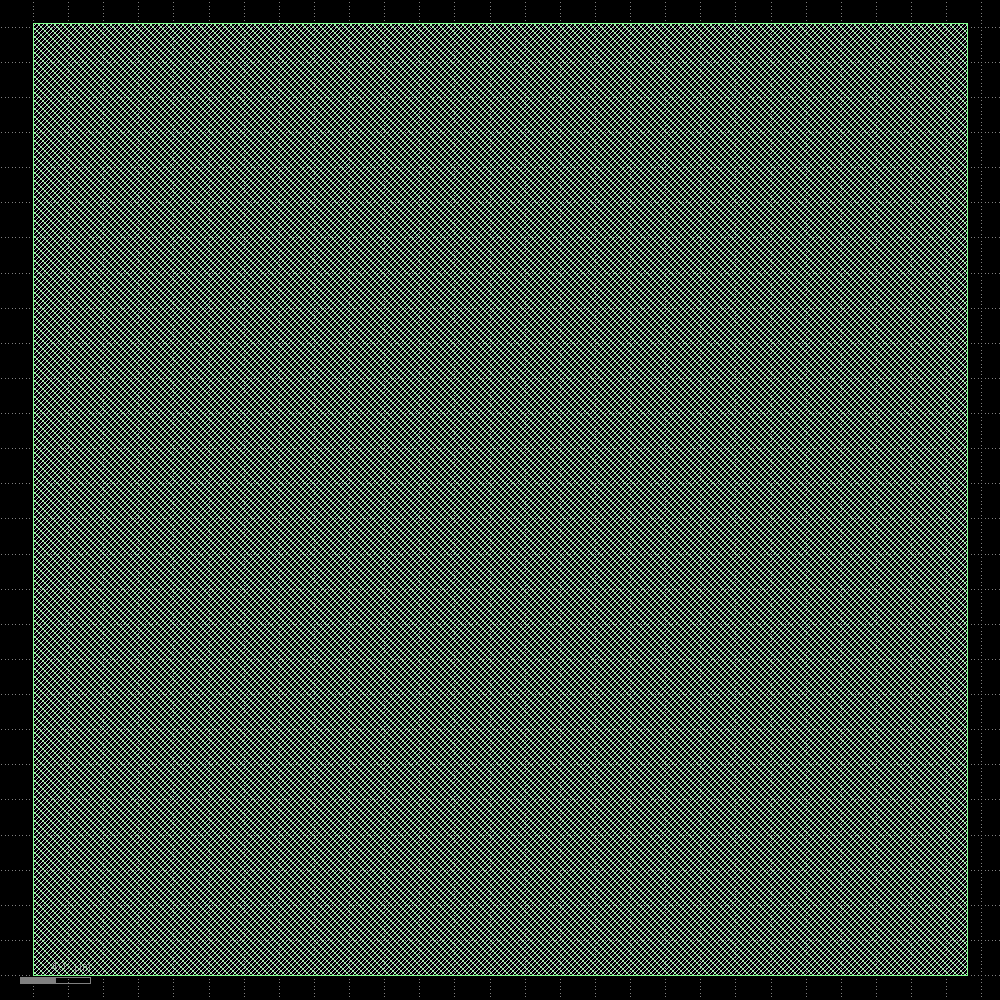

In [ ]:
display(floorplan)

### Tap/Endcap Cell Insertion

This places two kinds of cells on the floorplan:

* End cap/boundary cells: Added at the beginning and end of each row. True to
  their name, they "cap off" the core area of a design.
* Tap cells: Placed in a polka dot-ish fashion across the rows. Tap cells
  connect VDD to the nwell and the psubstrate to VSS, which the majority of cells
  do not do themselves to save area- but if you go long enough without one such
  connection you end up with the cell "latching-up"; i.e.; refusing to switch
  back to LO from HI.

  There is a maximum distance between tap cells enforced as part of every
  foundry process.

In [ ]:
TapEndcapInsertion = Step.factory.get("OpenROAD.TapEndcapInsertion")

tdi = TapEndcapInsertion(state_in=floorplan.state_out)
tdi.start()

─────────────────────────────────────────────── Tap/Decap Insertion ───────────────────────────────────────────────

[21:22:50] VERBOSE  Running 'OpenROAD.TapEndcapInsertion'…                                             ]8;id=491550;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=842402;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:50] VERBOSE  Logging subprocess to                                                              ]8;id=174377;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=967531;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=438016;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\openlane_run/]8;;\]8;id=675061;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\20]8;;\]8;id=438016;file:///content/openlane_run/20-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log\-openroad-tapendcapinsertion/openroad-tapendcapinsertion.log]8;;\…                   

Reading OpenROAD database at '/content/openlane_run/19-openroad-floorplan/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO TAP-0004] Inserted 382 endcaps.

[INFO TAP-0005] Inserted 3860 tapcells.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.nl.v
pnl,openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.pnl.v
def,openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.def
odb,openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.odb
sdc,openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:22:52] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=199689;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=709405;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:52] VERBOSE  Logging subprocess to ]8;id=930778;file:///tmp/openlane_klayout_tmp_m_xm_sah/klayout-render.log\..]8;;\]8;id=849933;file:///tmp/openlane_klayout_tmp_m_xm_sah/klayout-render.log\/tmp/openlane_klayout_tmp_m_xm_sah/]8;;\]8;id=815436;file:///tmp/openlane_klayout_tmp_m_xm_sah/klayout-render.log\klayout-render.log]8;;\…     ]8;id=380942;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=19614;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.63s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
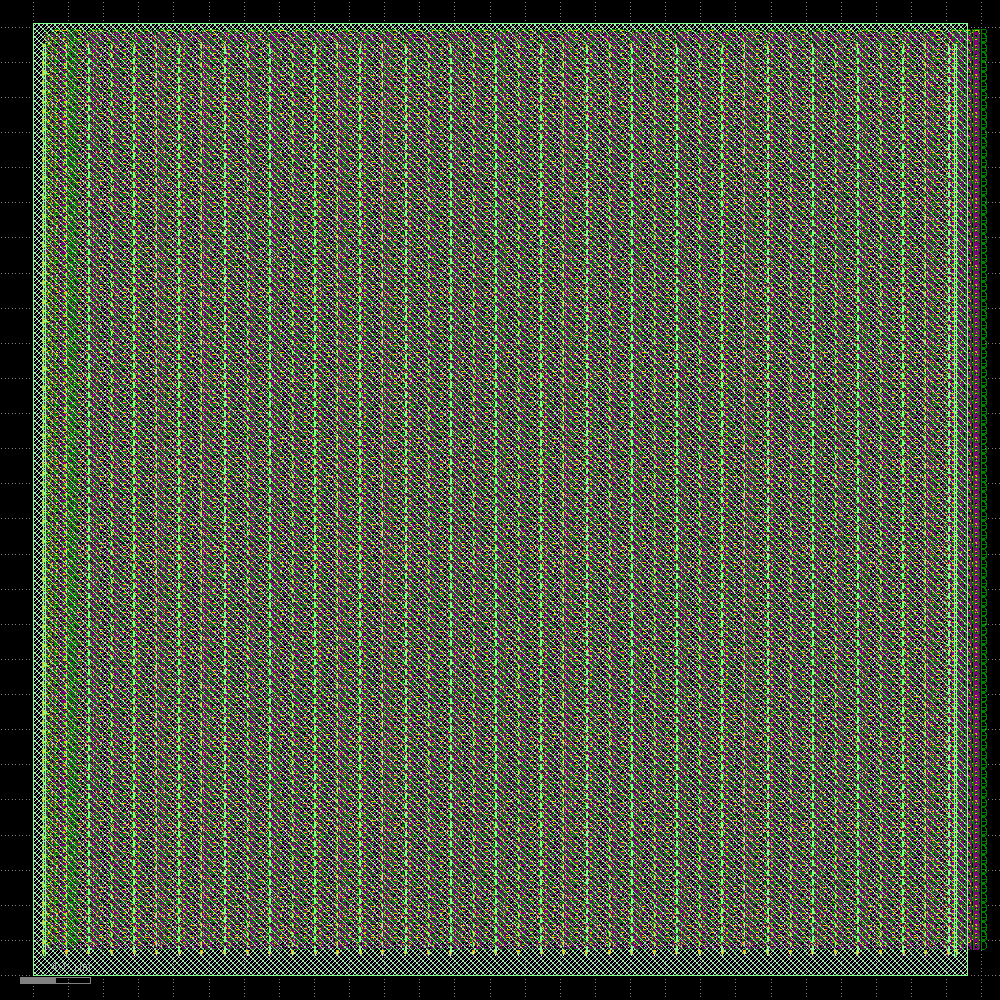

In [ ]:
display(tdi)

### I/O Placement

This places metal pins at the edges of the design corresponding to the top level
inputs and outputs for your design. These pins act as the interface with other
designs when you integrate it with other designs.

In [ ]:
IOPlacement = Step.factory.get("OpenROAD.IOPlacement")

ioplace = IOPlacement(state_in=tdi.state_out)
ioplace.start()

────────────────────────────────────────────────── I/O Placement ──────────────────────────────────────────────────

[21:22:54] VERBOSE  Running 'OpenROAD.IOPlacement'…                                                    ]8;id=525914;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=52879;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:54] VERBOSE  Logging subprocess to                                                              ]8;id=899001;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=26302;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=89785;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\openlane_run/]8;;\]8;id=439886;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\21]8;;\]8;id=89785;file:///content/openlane_run/21-openroad-ioplacement/openroad-ioplacement.log\-openroad-ioplacement/openroad-ioplacement.log]8;;\…                                 

Reading OpenROAD database at '/content/openlane_run/20-openroad-tapendcapinsertion/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] place_pins args: -min_distance 3

Found 0 macro blocks.

[INFO PPL-0010] Tentative 0 to set up sections.

[INFO PPL-0001] Number of slots           650

[INFO PPL-0002] Number of I/O             325

[INFO PPL-0003] Number of I/O w/sink      325

[INFO PPL-0004] Number of I/O w/o sink    0

[INFO PPL-0005] Slots per section         200

[INFO PPL-0006] Slots increase factor     0.01

[INFO PPL-0008] Successfully assigned pins to sections.

[INFO PPL-0012] I/O nets HPWL: 129952.65 um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/21-openroad-ioplacement/full_chain_stage4.nl.v
pnl,openlane_run/21-openroad-ioplacement/full_chain_stage4.pnl.v
def,openlane_run/21-openroad-ioplacement/full_chain_stage4.def
odb,openlane_run/21-openroad-ioplacement/full_chain_stage4.odb
sdc,openlane_run/21-openroad-ioplacement/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:22:56] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=188333;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=294108;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:56] VERBOSE  Logging subprocess to ]8;id=589114;file:///tmp/openlane_klayout_tmp_8mj8hv_2/klayout-render.log\..]8;;\]8;id=816153;file:///tmp/openlane_klayout_tmp_8mj8hv_2/klayout-render.log\/tmp/openlane_klayout_tmp_8mj8hv_2/]8;;\]8;id=168791;file:///tmp/openlane_klayout_tmp_8mj8hv_2/klayout-render.log\klayout-render.log]8;;\…     ]8;id=629356;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=752054;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.33s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
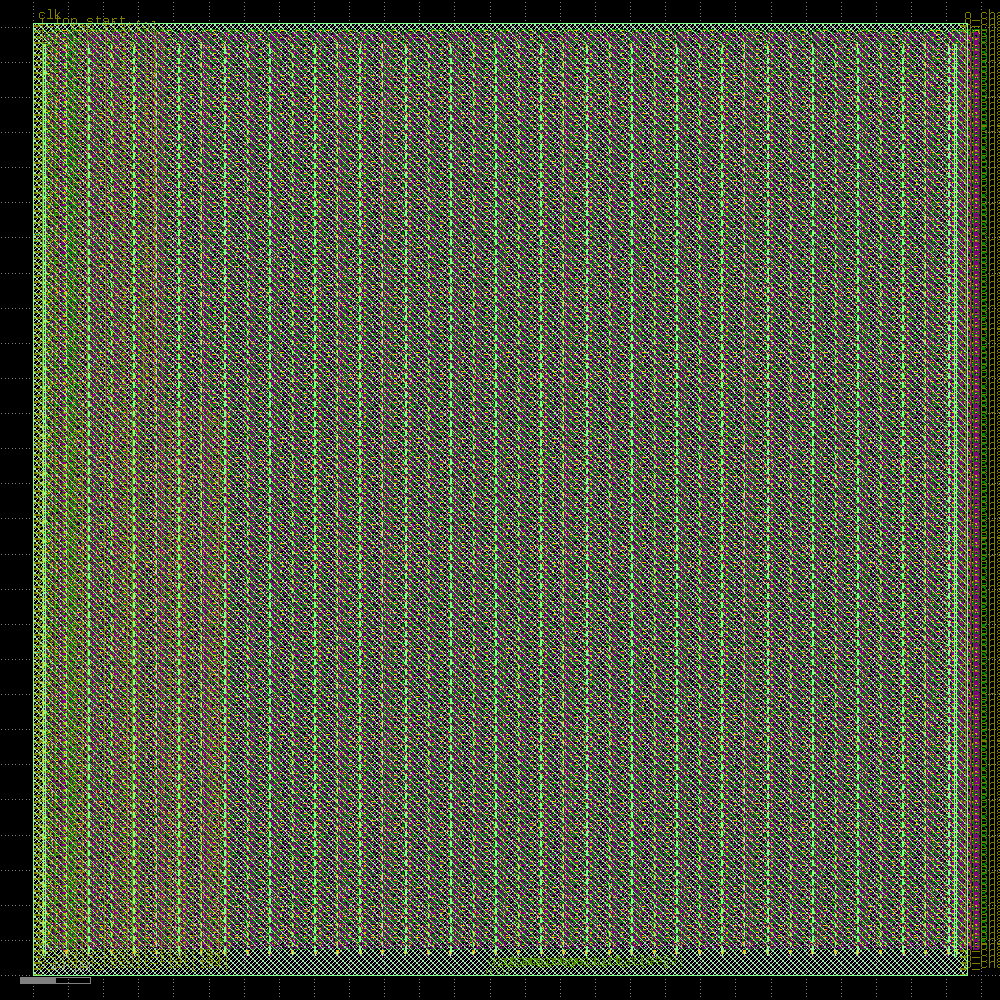

In [ ]:
display(ioplace)

### Generating the Power Distribution Network (PDN)

This creates the power distribution network for your design, which is essentially
a plaid pattern of horizontal and vertical "straps" across the design that is
then connected to the rails' VDD and VSS (via the tap cells.)

You can find an explanation of how the power distribution network works at this
link: https://openlane2.readthedocs.io/en/latest/usage/hardening_macros.html#pdn-generation

While we typically don't need to mess with the PDN too much, the SPM is a small
design, so we're going to need to make the plaid pattern formed by the PDN a bit
smaller.

In [ ]:
GeneratePDN = Step.factory.get("OpenROAD.GeneratePDN")

pdn = GeneratePDN(
    state_in=ioplace.state_out, # This should be the state after IOPlacement (which was after the new Floorplan)
    FP_PDN_VOFFSET=2,
    FP_PDN_HOFFSET=2,
    FP_PDN_VWIDTH=1.6,       # Correct for met5 min width
    FP_PDN_HWIDTH=1.6,       # Correct for met5 min width
    FP_PDN_VPITCH=25,        # Make pitch reasonably large, larger than the expected core dimension
    FP_PDN_HPITCH=25,        # Make pitch reasonably large
    FP_PDN_CORE_RING_VWIDTH=1.6,
    FP_PDN_CORE_RING_HWIDTH=1.6
)
pdn.start()

────────────────────────────────────── Power Distribution Network Generation ──────────────────────────────────────

[21:22:58] VERBOSE  Running 'OpenROAD.GeneratePDN'…                                                    ]8;id=981655;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=396081;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:22:58] INFO     'FP_PDN_CFG' not explicitly set, setting it to                                 ]8;id=106993;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=789161;file:///content/openlane_ipynb/openlane/steps/openroad.py#1174\1174]8;;\
                    /content/openlane_ipynb/openlane/scripts/openroad/common/pdn_cfg.tcl…                          

[21:22:58] VERBOSE  Logging subprocess to                                                              ]8;id=462430;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=231496;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=356434;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\openlane_run/]8;;\]8;id=195081;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\22]8;;\]8;id=356434;file:///content/openlane_run/22-openroad-generatepdn/openroad-generatepdn.log\-openroad-generatepdn/openroad-generatepdn.log]8;;\…                                 

Reading OpenROAD database at '/content/openlane_run/21-openroad-ioplacement/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting global connections...

[INFO PDN-0001] Inserting grid: stdcell_grid

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.sdc'…

[INFO PSM-0040] All shapes on net VPWR are connected.

[INFO PSM-0040] All shapes on net VGND are connected.

Format,Path
nl,openlane_run/22-openroad-generatepdn/full_chain_stage4.nl.v
pnl,openlane_run/22-openroad-generatepdn/full_chain_stage4.pnl.v
def,openlane_run/22-openroad-generatepdn/full_chain_stage4.def
odb,openlane_run/22-openroad-generatepdn/full_chain_stage4.odb
sdc,openlane_run/22-openroad-generatepdn/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:23:02] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=767396;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=856398;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:23:02] VERBOSE  Logging subprocess to ]8;id=736699;file:///tmp/openlane_klayout_tmp_em8q0gk1/klayout-render.log\..]8;;\]8;id=298856;file:///tmp/openlane_klayout_tmp_em8q0gk1/klayout-render.log\/tmp/openlane_klayout_tmp_em8q0gk1/]8;;\]8;id=335773;file:///tmp/openlane_klayout_tmp_em8q0gk1/klayout-render.log\klayout-render.log]8;;\…     ]8;id=329774;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=163748;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 3.54s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
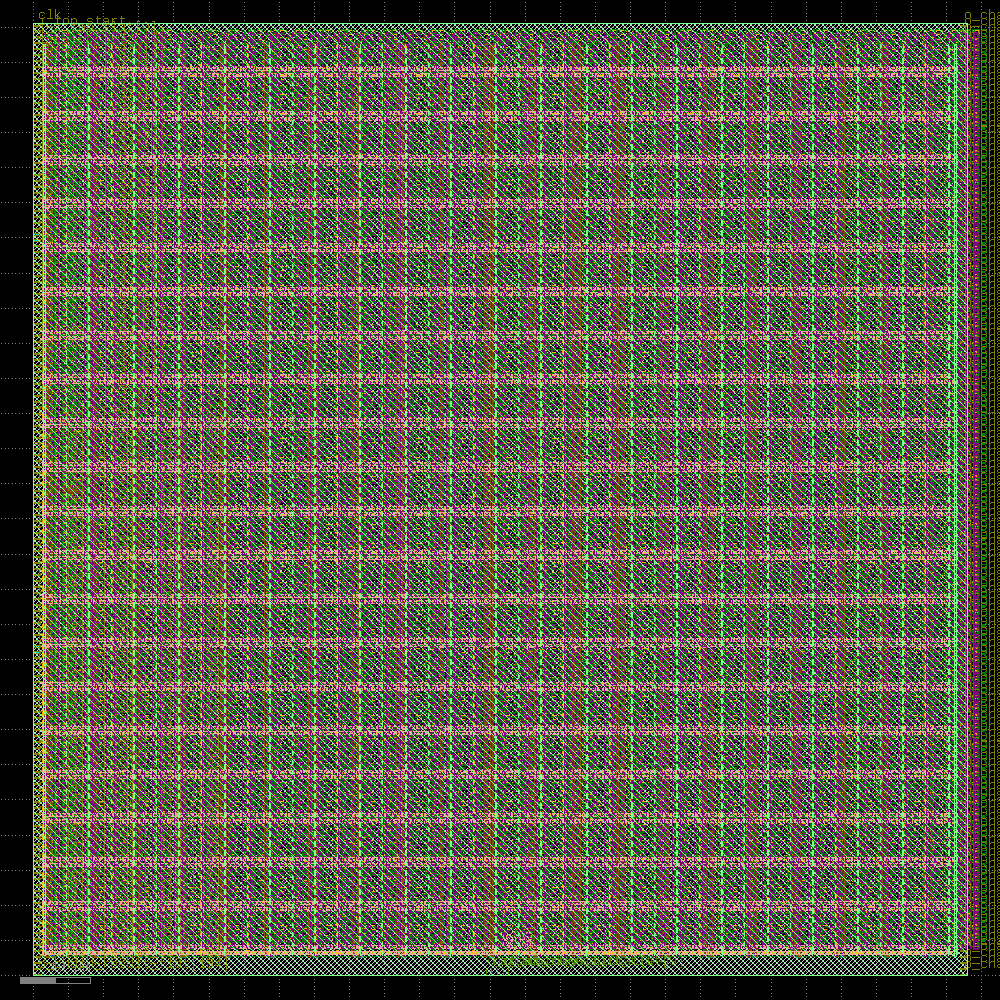

In [ ]:
display(pdn)

### Global Placement

Global Placement is deciding on a fuzzy, non-final location for each of the cells,
with the aim of minimizing the distance between cells that are connected
together (more specifically, the total length of the not-yet-created wires that
will connect them).

As you will see in the `.display()` in the second cell below, the placement is
considered "illegal", i.e., not properly aligned with the cell placement grid.
This is addressed by "Detailed Placement", also referred to as "placement
legalization", which is the next step.

In [ ]:
GlobalPlacement = Step.factory.get("OpenROAD.GlobalPlacement")

gpl = GlobalPlacement(state_in=pdn.state_out)
gpl.start()

──────────────────────────────────────────────── Global Placement ─────────────────────────────────────────────────

[21:23:04] VERBOSE  Running 'OpenROAD.GlobalPlacement'…                                                ]8;id=891661;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=472044;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:23:04] INFO     'PL_TARGET_DENSITY_PCT' not explicitly set, using dynamically calculated       ]8;id=50107;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=442810;file:///content/openlane_ipynb/openlane/steps/openroad.py#1260\1260]8;;\
                    target density: 61.916200…                                                                     

[21:23:04] VERBOSE  Logging subprocess to                                                              ]8;id=753884;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=699070;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=499872;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\openlane_run/]8;;\]8;id=40252;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\23]8;;\]8;id=499872;file:///content/openlane_run/23-openroad-globalplacement/openroad-globalplacement.log\-openroad-globalplacement/openroad-globalplacement.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/22-openroad-generatepdn/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

[INFO GPL-0002] DBU: 1000

[INFO GPL-0003] SiteSize: (  0.460  2.720 ) um

[INFO GPL-0004] CoreBBox: (  5.520 10.880 ) ( 525.780 530.400 ) um

[INFO GPL-0006] NumInstances:             17763

[INFO GPL-0007] NumPlaceInstances:        13521

[INFO GPL-0008] NumFixedInstances:         4242

[INFO GPL-0009] NumDummyInstances:            0

[INFO GPL-0010] NumNets:                  13588

[INFO GPL-0011] NumPins:                  45735

[INFO GPL-0012] DieBBox:  (  0.000  0.000 ) ( 531.600 542.320 ) um

[INFO GPL-0013] CoreBBox: (  5.520 10.880 ) ( 525.780 530.400 ) um

[INFO GPL-0016] CoreArea:            270285.475 um^2

[INFO GPL-0017] NonPlaceInstsArea:     6263.507 um^2

[INFO GPL-0018] PlaceInstsArea:      135492.448 um^2

[INFO GPL-0019] Util:                    51.319 %

[INFO GPL-0020] StdInstsArea:        135492.448 um^2

[INFO GPL-0021] MacroInstsArea:           0.000 um^2

[InitialPlace]  Iter: 1 CG residual: 0.00244533 HPWL: 275254450

[InitialPlace]  Iter: 2 CG residual: 0.00086300 HPWL: 182448168

[InitialPlace]  Iter: 3 CG residual: 0.00034137 HPWL: 178328005

[InitialPlace]  Iter: 4 CG residual: 0.00017246 HPWL: 173325094

[InitialPlace]  Iter: 5 CG residual: 0.00012075 HPWL: 167913632

[InitialPlace]  Iter: 6 CG residual: 0.00013044 HPWL: 164509348

[InitialPlace]  Iter: 7 CG residual: 0.00010865 HPWL: 162039786

[InitialPlace]  Iter: 8 CG residual: 0.00010424 HPWL: 161157484

[InitialPlace]  Iter: 9 CG residual: 0.00010385 HPWL: 159455747

[InitialPlace]  Iter: 10 CG residual: 0.00008987 HPWL: 159008138

[InitialPlace]  Iter: 11 CG residual: 0.00008835 HPWL: 157403878

[InitialPlace]  Iter: 12 CG residual: 0.00005385 HPWL: 157011215

[InitialPlace]  Iter: 13 CG residual: 0.00005270 HPWL: 155628232

[InitialPlace]  Iter: 14 CG residual: 0.00003180 HPWL: 155387632

[InitialPlace]  Iter: 15 CG residual: 0.00002149 HPWL: 154585759

[InitialPlace]  Iter: 16 CG residual: 0.00002282 HPWL: 154432561

[InitialPlace]  Iter: 17 CG residual: 0.00001851 HPWL: 154094505

[InitialPlace]  Iter: 18 CG residual: 0.00001733 HPWL: 154127926

[InitialPlace]  Iter: 19 CG residual: 0.00001084 HPWL: 153919090

[InitialPlace]  Iter: 20 CG residual: 0.00001331 HPWL: 154018443

[INFO GPL-0031] FillerInit:NumGCells:     16460

[INFO GPL-0032] FillerInit:NumGNets:      13588

[INFO GPL-0033] FillerInit:NumGPins:      45735

[INFO GPL-0023] TargetDensity:            0.619

[INFO GPL-0024] AvrgPlaceInstArea:       10.021 um^2

[INFO GPL-0025] IdealBinArea:            16.185 um^2

[INFO GPL-0026] IdealBinCnt:              16700

[INFO GPL-0027] TotalBinArea:        270285.475 um^2

[INFO GPL-0028] BinCnt:       128    128

[INFO GPL-0029] BinSize: (  4.065  4.059 )

[INFO GPL-0030] NumBins: 16384

[NesterovSolve] Iter:    1 overflow: 0.974 HPWL: 76551184

[NesterovSolve] Iter:   10 overflow: 0.944 HPWL: 80449368

[NesterovSolve] Iter:   20 overflow: 0.928 HPWL: 84206193

[NesterovSolve] Iter:   30 overflow: 0.920 HPWL: 87772790

[NesterovSolve] Iter:   40 overflow: 0.916 HPWL: 89306044

[NesterovSolve] Iter:   50 overflow: 0.919 HPWL: 89527541

[NesterovSolve] Iter:   60 overflow: 0.919 HPWL: 90120742

[NesterovSolve] Iter:   70 overflow: 0.919 HPWL: 91223204

[NesterovSolve] Iter:   80 overflow: 0.918 HPWL: 92382352

[NesterovSolve] Iter:   90 overflow: 0.918 HPWL: 93270004

[NesterovSolve] Iter:  100 overflow: 0.919 HPWL: 93855292

[NesterovSolve] Iter:  110 overflow: 0.919 HPWL: 94366723

[NesterovSolve] Iter:  120 overflow: 0.918 HPWL: 94979562

[NesterovSolve] Iter:  130 overflow: 0.917 HPWL: 95718894

[NesterovSolve] Iter:  140 overflow: 0.916 HPWL: 96646565

[NesterovSolve] Iter:  150 overflow: 0.914 HPWL: 97908088

[NesterovSolve] Iter:  160 overflow: 0.912 HPWL: 99821978

[NesterovSolve] Iter:  170 overflow: 0.907 HPWL: 102769422

[NesterovSolve] Iter:  180 overflow: 0.899 HPWL: 107150017

[NesterovSolve] Iter:  190 overflow: 0.886 HPWL: 113487790

[NesterovSolve] Iter:  200 overflow: 0.868 HPWL: 122118920

[NesterovSolve] Iter:  210 overflow: 0.846 HPWL: 133251700

[NesterovSolve] Iter:  220 overflow: 0.817 HPWL: 146640037

[NesterovSolve] Iter:  230 overflow: 0.788 HPWL: 159590989

[INFO GPL-0100] worst slack 7.36e-08

[INFO GPL-0103] Weighted 1341 nets.

[NesterovSolve] Iter:  240 overflow: 0.750 HPWL: 175505097

[NesterovSolve] Iter:  250 overflow: 0.712 HPWL: 191665939

[NesterovSolve] Iter:  260 overflow: 0.673 HPWL: 208139894

[NesterovSolve] Iter:  270 overflow: 0.633 HPWL: 220656783

[INFO GPL-0100] worst slack 7.35e-08

[INFO GPL-0103] Weighted 1345 nets.

[NesterovSolve] Snapshot saved at iter = 277

[NesterovSolve] Iter:  280 overflow: 0.590 HPWL: 225109668

[NesterovSolve] Iter:  290 overflow: 0.548 HPWL: 235632105

[NesterovSolve] Iter:  300 overflow: 0.512 HPWL: 243794975

[INFO GPL-0100] worst slack 7.32e-08

[INFO GPL-0103] Weighted 1345 nets.

[NesterovSolve] Iter:  310 overflow: 0.468 HPWL: 249223582

[NesterovSolve] Iter:  320 overflow: 0.424 HPWL: 253298939

[NesterovSolve] Iter:  330 overflow: 0.391 HPWL: 251574540

[NesterovSolve] Iter:  340 overflow: 0.354 HPWL: 253814013

[NesterovSolve] Iter:  350 overflow: 0.318 HPWL: 253499219

[NesterovSolve] Iter:  360 overflow: 0.296 HPWL: 252715717

[INFO GPL-0100] worst slack 7.31e-08

[INFO GPL-0103] Weighted 1345 nets.

[NesterovSolve] Iter:  370 overflow: 0.269 HPWL: 252585996

[NesterovSolve] Iter:  380 overflow: 0.247 HPWL: 252674539

[NesterovSolve] Iter:  390 overflow: 0.224 HPWL: 252920037

[INFO GPL-0100] worst slack 7.29e-08

[INFO GPL-0103] Weighted 1345 nets.

[NesterovSolve] Iter:  400 overflow: 0.203 HPWL: 253219903

[INFO GPL-0075] Routability numCall: 1 inflationIterCnt: 1 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 8.033333897590637

[INFO GPL-0065] OverflowTileCnt2: 46

[INFO GPL-0066] 0.5%RC: 1.1409

[INFO GPL-0067] 1.0%RC: 1.0711

[INFO GPL-0068] 2.0%RC: 1.0355

[INFO GPL-0069] 5.0%RC: 0.9822

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.1060

[INFO GPL-0078] FinalRC lower than minRC (1e+30), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:     1047.695 um^2

[INFO GPL-0046] TargetDensity:            0.619

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   135492.448 um^2

[INFO GPL-0051] TotalFillerArea:      27979.928 um^2

[INFO GPL-0052] TotalGCellsArea:     163472.376 um^2

[INFO GPL-0053] ExpectedGCellsArea:  164520.070 um^2

[INFO GPL-0054] NewTargetDensity:         0.623

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         164520.067 um^2

[INFO GPL-0057] NewNesterovInstArea: 136540.143 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.924 um^2

[INFO GPL-0059] NewTotalGCellsArea:  164520.067 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  410 overflow: 0.564 HPWL: 230323490

[NesterovSolve] Iter:  420 overflow: 0.542 HPWL: 236836249

[NesterovSolve] Iter:  430 overflow: 0.506 HPWL: 241962187

[NesterovSolve] Iter:  440 overflow: 0.470 HPWL: 244381426

[NesterovSolve] Iter:  450 overflow: 0.438 HPWL: 246682299

[NesterovSolve] Iter:  460 overflow: 0.413 HPWL: 247198363

[NesterovSolve] Iter:  470 overflow: 0.379 HPWL: 249098578

[NesterovSolve] Iter:  480 overflow: 0.347 HPWL: 249110552

[NesterovSolve] Iter:  490 overflow: 0.321 HPWL: 249938067

[NesterovSolve] Iter:  500 overflow: 0.294 HPWL: 250451673

[NesterovSolve] Iter:  510 overflow: 0.268 HPWL: 250688517

[NesterovSolve] Iter:  520 overflow: 0.244 HPWL: 251202853

[NesterovSolve] Iter:  530 overflow: 0.223 HPWL: 251922403

[NesterovSolve] Iter:  540 overflow: 0.201 HPWL: 252536275

[INFO GPL-0075] Routability numCall: 2 inflationIterCnt: 2 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 4.100000619888306

[INFO GPL-0065] OverflowTileCnt2: 33

[INFO GPL-0066] 0.5%RC: 1.0719

[INFO GPL-0067] 1.0%RC: 1.0363

[INFO GPL-0068] 2.0%RC: 1.0181

[INFO GPL-0069] 5.0%RC: 0.9666

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0541

[INFO GPL-0078] FinalRC lower than minRC (1.1060135), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      488.083 um^2

[INFO GPL-0046] TargetDensity:            0.623

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   136540.143 um^2

[INFO GPL-0051] TotalFillerArea:      27979.924 um^2

[INFO GPL-0052] TotalGCellsArea:     164520.067 um^2

[INFO GPL-0053] ExpectedGCellsArea:  165008.150 um^2

[INFO GPL-0054] NewTargetDensity:         0.625

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         165008.146 um^2

[INFO GPL-0057] NewNesterovInstArea: 137028.226 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.921 um^2

[INFO GPL-0059] NewTotalGCellsArea:  165008.146 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  550 overflow: 0.560 HPWL: 231141615

[NesterovSolve] Iter:  560 overflow: 0.539 HPWL: 236949658

[NesterovSolve] Iter:  570 overflow: 0.503 HPWL: 242221349

[NesterovSolve] Iter:  580 overflow: 0.468 HPWL: 244491538

[NesterovSolve] Iter:  590 overflow: 0.436 HPWL: 246442359

[NesterovSolve] Iter:  600 overflow: 0.410 HPWL: 247380286

[NesterovSolve] Iter:  610 overflow: 0.378 HPWL: 248843820

[NesterovSolve] Iter:  620 overflow: 0.345 HPWL: 248836491

[NesterovSolve] Iter:  630 overflow: 0.318 HPWL: 249773921

[NesterovSolve] Iter:  640 overflow: 0.290 HPWL: 250302793

[NesterovSolve] Iter:  650 overflow: 0.266 HPWL: 250721104

[NesterovSolve] Iter:  660 overflow: 0.243 HPWL: 251257024

[NesterovSolve] Iter:  670 overflow: 0.220 HPWL: 251696014

[NesterovSolve] Iter:  680 overflow: 0.199 HPWL: 252308331

[INFO GPL-0075] Routability numCall: 3 inflationIterCnt: 3 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 3.433334469795227

[INFO GPL-0065] OverflowTileCnt2: 31

[INFO GPL-0066] 0.5%RC: 1.0602

[INFO GPL-0067] 1.0%RC: 1.0304

[INFO GPL-0068] 2.0%RC: 1.0152

[INFO GPL-0069] 5.0%RC: 0.9607

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0453

[INFO GPL-0078] FinalRC lower than minRC (1.0541065), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      454.257 um^2

[INFO GPL-0046] TargetDensity:            0.625

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   137028.226 um^2

[INFO GPL-0051] TotalFillerArea:      27979.921 um^2

[INFO GPL-0052] TotalGCellsArea:     165008.146 um^2

[INFO GPL-0053] ExpectedGCellsArea:  165462.404 um^2

[INFO GPL-0054] NewTargetDensity:         0.627

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         165462.409 um^2

[INFO GPL-0057] NewNesterovInstArea: 137482.483 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.926 um^2

[INFO GPL-0059] NewTotalGCellsArea:  165462.409 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  690 overflow: 0.557 HPWL: 231840295

[NesterovSolve] Iter:  700 overflow: 0.536 HPWL: 237160427

[NesterovSolve] Iter:  710 overflow: 0.499 HPWL: 242439064

[NesterovSolve] Iter:  720 overflow: 0.465 HPWL: 244653730

[NesterovSolve] Iter:  730 overflow: 0.434 HPWL: 246147837

[NesterovSolve] Iter:  740 overflow: 0.406 HPWL: 247658398

[NesterovSolve] Iter:  750 overflow: 0.373 HPWL: 248667048

[NesterovSolve] Iter:  760 overflow: 0.342 HPWL: 248641393

[NesterovSolve] Iter:  770 overflow: 0.316 HPWL: 249610316

[NesterovSolve] Iter:  780 overflow: 0.287 HPWL: 250151104

[NesterovSolve] Iter:  790 overflow: 0.263 HPWL: 250702360

[NesterovSolve] Iter:  800 overflow: 0.240 HPWL: 251159057

[NesterovSolve] Iter:  810 overflow: 0.219 HPWL: 251711267

[NesterovSolve] Iter:  820 overflow: 0.198 HPWL: 252304606

[INFO GPL-0075] Routability numCall: 4 inflationIterCnt: 4 bloatIterCnt: 0

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 1.6000005006790161

[INFO GPL-0065] OverflowTileCnt2: 15

[INFO GPL-0066] 0.5%RC: 1.0281

[INFO GPL-0067] 1.0%RC: 1.0142

[INFO GPL-0068] 2.0%RC: 1.0062

[INFO GPL-0069] 5.0%RC: 0.9447

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0211

[INFO GPL-0078] FinalRC lower than minRC (1.0453087), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:      209.692 um^2

[INFO GPL-0046] TargetDensity:            0.627

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   137482.483 um^2

[INFO GPL-0051] TotalFillerArea:      27979.926 um^2

[INFO GPL-0052] TotalGCellsArea:     165462.409 um^2

[INFO GPL-0053] ExpectedGCellsArea:  165672.101 um^2

[INFO GPL-0054] NewTargetDensity:         0.627

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         165672.108 um^2

[INFO GPL-0057] NewNesterovInstArea: 137692.175 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.933 um^2

[INFO GPL-0059] NewTotalGCellsArea:  165672.108 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  830 overflow: 0.557 HPWL: 231815615

[NesterovSolve] Iter:  840 overflow: 0.535 HPWL: 237130881

[NesterovSolve] Iter:  850 overflow: 0.499 HPWL: 242456369

[NesterovSolve] Iter:  860 overflow: 0.465 HPWL: 244586358

[NesterovSolve] Iter:  870 overflow: 0.434 HPWL: 246109966

[NesterovSolve] Iter:  880 overflow: 0.407 HPWL: 247670389

[NesterovSolve] Iter:  890 overflow: 0.373 HPWL: 248653090

[NesterovSolve] Iter:  900 overflow: 0.343 HPWL: 248636974

[NesterovSolve] Iter:  910 overflow: 0.315 HPWL: 249564716

[NesterovSolve] Iter:  920 overflow: 0.287 HPWL: 250100879

[NesterovSolve] Iter:  930 overflow: 0.263 HPWL: 250814116

[NesterovSolve] Iter:  940 overflow: 0.241 HPWL: 251264580

[NesterovSolve] Iter:  950 overflow: 0.217 HPWL: 251825150

[INFO GPL-0075] Routability numCall: 5 inflationIterCnt: 0 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 1.7333338260650635

[INFO GPL-0065] OverflowTileCnt2: 15

[INFO GPL-0066] 0.5%RC: 1.0304

[INFO GPL-0067] 1.0%RC: 1.0153

[INFO GPL-0068] 2.0%RC: 1.0077

[INFO GPL-0069] 5.0%RC: 0.9459

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0229

[INFO GPL-0079] MinRC (1.0211147) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:      290.785 um^2

[INFO GPL-0046] TargetDensity:            0.627

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   137692.175 um^2

[INFO GPL-0051] TotalFillerArea:      27979.933 um^2

[INFO GPL-0052] TotalGCellsArea:     165672.108 um^2

[INFO GPL-0053] ExpectedGCellsArea:  165962.893 um^2

[INFO GPL-0054] NewTargetDensity:         0.629

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         165962.891 um^2

[INFO GPL-0057] NewNesterovInstArea: 137982.960 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.932 um^2

[INFO GPL-0059] NewTotalGCellsArea:  165962.891 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter:  960 overflow: 0.595 HPWL: 224525810

[NesterovSolve] Iter:  970 overflow: 0.555 HPWL: 232464529

[NesterovSolve] Iter:  980 overflow: 0.532 HPWL: 237716207

[NesterovSolve] Iter:  990 overflow: 0.495 HPWL: 242559840

[NesterovSolve] Iter: 1000 overflow: 0.463 HPWL: 244945479

[NesterovSolve] Iter: 1010 overflow: 0.433 HPWL: 246011864

[NesterovSolve] Iter: 1020 overflow: 0.404 HPWL: 247891811

[NesterovSolve] Iter: 1030 overflow: 0.372 HPWL: 248481972

[NesterovSolve] Iter: 1040 overflow: 0.337 HPWL: 248656001

[NesterovSolve] Iter: 1050 overflow: 0.310 HPWL: 249689719

[NesterovSolve] Iter: 1060 overflow: 0.284 HPWL: 250188755

[NesterovSolve] Iter: 1070 overflow: 0.261 HPWL: 250850941

[NesterovSolve] Iter: 1080 overflow: 0.238 HPWL: 251291164

[NesterovSolve] Iter: 1090 overflow: 0.216 HPWL: 251957745

[INFO GPL-0075] Routability numCall: 6 inflationIterCnt: 1 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 3.466667056083679

[INFO GPL-0065] OverflowTileCnt2: 31

[INFO GPL-0066] 0.5%RC: 1.0608

[INFO GPL-0067] 1.0%RC: 1.0307

[INFO GPL-0068] 2.0%RC: 1.0153

[INFO GPL-0069] 5.0%RC: 0.9566

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0457

[INFO GPL-0079] MinRC (1.0211147) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:      594.362 um^2

[INFO GPL-0046] TargetDensity:            0.629

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   137982.960 um^2

[INFO GPL-0051] TotalFillerArea:      27979.932 um^2

[INFO GPL-0052] TotalGCellsArea:     165962.891 um^2

[INFO GPL-0053] ExpectedGCellsArea:  166557.254 um^2

[INFO GPL-0054] NewTargetDensity:         0.631

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         166557.254 um^2

[INFO GPL-0057] NewNesterovInstArea: 138577.322 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.932 um^2

[INFO GPL-0059] NewTotalGCellsArea:  166557.254 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1100 overflow: 0.595 HPWL: 224527786

[NesterovSolve] Iter: 1110 overflow: 0.555 HPWL: 232470364

[NesterovSolve] Iter: 1120 overflow: 0.532 HPWL: 237680010

[NesterovSolve] Iter: 1130 overflow: 0.494 HPWL: 242622754

[NesterovSolve] Iter: 1140 overflow: 0.463 HPWL: 244920207

[NesterovSolve] Iter: 1150 overflow: 0.432 HPWL: 245983169

[NesterovSolve] Iter: 1160 overflow: 0.403 HPWL: 247731966

[NesterovSolve] Iter: 1170 overflow: 0.369 HPWL: 248751412

[NesterovSolve] Iter: 1180 overflow: 0.338 HPWL: 248755102

[NesterovSolve] Iter: 1190 overflow: 0.310 HPWL: 249760143

[NesterovSolve] Iter: 1200 overflow: 0.285 HPWL: 250242017

[NesterovSolve] Iter: 1210 overflow: 0.261 HPWL: 251067475

[NesterovSolve] Iter: 1220 overflow: 0.238 HPWL: 251643040

[NesterovSolve] Iter: 1230 overflow: 0.216 HPWL: 252142505

[INFO GPL-0075] Routability numCall: 7 inflationIterCnt: 2 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.5333336591720581

[INFO GPL-0065] OverflowTileCnt2: 7

[INFO GPL-0066] 0.5%RC: 1.0094

[INFO GPL-0067] 1.0%RC: 1.0047

[INFO GPL-0068] 2.0%RC: 0.9927

[INFO GPL-0069] 5.0%RC: 0.9478

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0070

[INFO GPL-0078] FinalRC lower than minRC (1.0211147), min RC updated.

[INFO GPL-0045] InflatedAreaDelta:       66.195 um^2

[INFO GPL-0046] TargetDensity:            0.631

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   138577.322 um^2

[INFO GPL-0051] TotalFillerArea:      27979.932 um^2

[INFO GPL-0052] TotalGCellsArea:     166557.254 um^2

[INFO GPL-0053] ExpectedGCellsArea:  166623.449 um^2

[INFO GPL-0054] NewTargetDensity:         0.631

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         166623.445 um^2

[INFO GPL-0057] NewNesterovInstArea: 138643.517 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.928 um^2

[INFO GPL-0059] NewTotalGCellsArea:  166623.445 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1240 overflow: 0.595 HPWL: 224527786

[NesterovSolve] Iter: 1250 overflow: 0.555 HPWL: 232500048

[NesterovSolve] Iter: 1260 overflow: 0.532 HPWL: 237722727

[NesterovSolve] Iter: 1270 overflow: 0.494 HPWL: 242657040

[NesterovSolve] Iter: 1280 overflow: 0.463 HPWL: 244947396

[NesterovSolve] Iter: 1290 overflow: 0.432 HPWL: 246026009

[NesterovSolve] Iter: 1300 overflow: 0.403 HPWL: 247758725

[NesterovSolve] Iter: 1310 overflow: 0.369 HPWL: 248769539

[NesterovSolve] Iter: 1320 overflow: 0.338 HPWL: 248764894

[NesterovSolve] Iter: 1330 overflow: 0.310 HPWL: 249728135

[NesterovSolve] Iter: 1340 overflow: 0.285 HPWL: 250313606

[NesterovSolve] Iter: 1350 overflow: 0.260 HPWL: 251098185

[NesterovSolve] Iter: 1360 overflow: 0.238 HPWL: 251621653

[NesterovSolve] Iter: 1370 overflow: 0.217 HPWL: 252170225

[INFO GPL-0075] Routability numCall: 8 inflationIterCnt: 3 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 1.5333335399627686

[INFO GPL-0065] OverflowTileCnt2: 12

[INFO GPL-0066] 0.5%RC: 1.0269

[INFO GPL-0067] 1.0%RC: 1.0136

[INFO GPL-0068] 2.0%RC: 1.0068

[INFO GPL-0069] 5.0%RC: 0.9466

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0202

[INFO GPL-0079] MinRC (1.0070382) violation occurred, total count: 1.

[INFO GPL-0045] InflatedAreaDelta:      269.831 um^2

[INFO GPL-0046] TargetDensity:            0.631

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   138643.517 um^2

[INFO GPL-0051] TotalFillerArea:      27979.928 um^2

[INFO GPL-0052] TotalGCellsArea:     166623.445 um^2

[INFO GPL-0053] ExpectedGCellsArea:  166893.276 um^2

[INFO GPL-0054] NewTargetDensity:         0.632

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         166893.273 um^2

[INFO GPL-0057] NewNesterovInstArea: 138913.348 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.925 um^2

[INFO GPL-0059] NewTotalGCellsArea:  166893.273 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1380 overflow: 0.595 HPWL: 224527786

[NesterovSolve] Iter: 1390 overflow: 0.555 HPWL: 232527582

[NesterovSolve] Iter: 1400 overflow: 0.532 HPWL: 237790922

[NesterovSolve] Iter: 1410 overflow: 0.494 HPWL: 242687476

[NesterovSolve] Iter: 1420 overflow: 0.463 HPWL: 245014630

[NesterovSolve] Iter: 1430 overflow: 0.432 HPWL: 246065841

[NesterovSolve] Iter: 1440 overflow: 0.403 HPWL: 247878513

[NesterovSolve] Iter: 1450 overflow: 0.369 HPWL: 248835904

[NesterovSolve] Iter: 1460 overflow: 0.338 HPWL: 248928175

[NesterovSolve] Iter: 1470 overflow: 0.309 HPWL: 249770298

[NesterovSolve] Iter: 1480 overflow: 0.285 HPWL: 250448791

[NesterovSolve] Iter: 1490 overflow: 0.262 HPWL: 251175167

[NesterovSolve] Iter: 1500 overflow: 0.236 HPWL: 251651274

[NesterovSolve] Iter: 1510 overflow: 0.216 HPWL: 252103565

[INFO GPL-0075] Routability numCall: 9 inflationIterCnt: 4 bloatIterCnt: 1

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0

[INFO GPL-0064] TotalRouteOverflowV2: 0.8000004291534424

[INFO GPL-0065] OverflowTileCnt2: 9

[INFO GPL-0066] 0.5%RC: 1.0140

[INFO GPL-0067] 1.0%RC: 1.0071

[INFO GPL-0068] 2.0%RC: 0.9947

[INFO GPL-0069] 5.0%RC: 0.9407

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0106

[INFO GPL-0079] MinRC (1.0070382) violation occurred, total count: 2.

[INFO GPL-0045] InflatedAreaDelta:      152.048 um^2

[INFO GPL-0046] TargetDensity:            0.632

[INFO GPL-0049] WhiteSpaceArea:      264021.968 um^2

[INFO GPL-0050] NesterovInstsArea:   138913.348 um^2

[INFO GPL-0051] TotalFillerArea:      27979.925 um^2

[INFO GPL-0052] TotalGCellsArea:     166893.273 um^2

[INFO GPL-0053] ExpectedGCellsArea:  167045.321 um^2

[INFO GPL-0054] NewTargetDensity:         0.633

[INFO GPL-0055] NewWhiteSpaceArea:   264021.968 um^2

[INFO GPL-0056] MovableArea:         167045.317 um^2

[INFO GPL-0057] NewNesterovInstArea: 139065.396 um^2

[INFO GPL-0058] NewTotalFillerArea:   27979.921 um^2

[INFO GPL-0059] NewTotalGCellsArea:  167045.317 um^2

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1520 overflow: 0.590 HPWL: 224982509

[NesterovSolve] Iter: 1530 overflow: 0.553 HPWL: 233070705

[NesterovSolve] Iter: 1540 overflow: 0.530 HPWL: 238550700

[NesterovSolve] Iter: 1550 overflow: 0.490 HPWL: 242815206

[NesterovSolve] Iter: 1560 overflow: 0.459 HPWL: 245415202

[NesterovSolve] Iter: 1570 overflow: 0.429 HPWL: 245942465

[NesterovSolve] Iter: 1580 overflow: 0.400 HPWL: 248262444

[NesterovSolve] Iter: 1590 overflow: 0.366 HPWL: 248815251

[NesterovSolve] Iter: 1600 overflow: 0.335 HPWL: 248872205

[NesterovSolve] Iter: 1610 overflow: 0.308 HPWL: 249646582

[NesterovSolve] Iter: 1620 overflow: 0.283 HPWL: 250305324

[NesterovSolve] Iter: 1630 overflow: 0.257 HPWL: 250801904

[NesterovSolve] Iter: 1640 overflow: 0.234 HPWL: 251337861

[NesterovSolve] Iter: 1650 overflow: 0.214 HPWL: 251921620

[INFO GPL-0075] Routability numCall: 10 inflationIterCnt: 0 bloatIterCnt: 2

[INFO GPL-0036] TileBBox: (    0    0 ) ( 6900 6900 ) DBU

[INFO GPL-0038] TileCnt:      77   78

[INFO GPL-0039] numRoutingLayers: 6

[INFO GPL-0040] NumTiles: 6006

[INFO GPL-0063] TotalRouteOverflowH2: 0.20000004768371582

[INFO GPL-0064] TotalRouteOverflowV2: 1.266667127609253

[INFO GPL-0065] OverflowTileCnt2: 15

[INFO GPL-0066] 0.5%RC: 1.0222

[INFO GPL-0067] 1.0%RC: 1.0112

[INFO GPL-0068] 2.0%RC: 1.0009

[INFO GPL-0069] 5.0%RC: 0.9398

[INFO GPL-0070] 0.5rcK: 1

[INFO GPL-0071] 1.0rcK: 1

[INFO GPL-0072] 2.0rcK: 0

[INFO GPL-0073] 5.0rcK: 0

[INFO GPL-0074] FinalRC: 1.0167

[INFO GPL-0079] MinRC (1.0070382) violation occurred, total count: 3.

[INFO GPL-0045] InflatedAreaDelta:      223.539 um^2

[INFO GPL-0046] TargetDensity:            0.633

Revert Routability Procedure. Target density higher than max, or minRC max violations.

[INFO GPL-0080] minRcViolatedCnt: 3

[INFO GPL-0047] SavedMinRC: 1.0070

[INFO GPL-0048] SavedTargetDensity: 0.6308

[NesterovSolve] Revert back to snapshot coordi

[NesterovSolve] Iter: 1660 overflow: 0.588 HPWL: 224978527

[NesterovSolve] Iter: 1670 overflow: 0.553 HPWL: 232696192

[NesterovSolve] Iter: 1680 overflow: 0.528 HPWL: 238196807

[NesterovSolve] Iter: 1690 overflow: 0.489 HPWL: 242559145

[NesterovSolve] Iter: 1700 overflow: 0.458 HPWL: 245168205

[NesterovSolve] Iter: 1710 overflow: 0.428 HPWL: 245789878

[NesterovSolve] Iter: 1720 overflow: 0.398 HPWL: 247912453

[NesterovSolve] Iter: 1730 overflow: 0.366 HPWL: 248707148

[NesterovSolve] Iter: 1740 overflow: 0.335 HPWL: 248643351

[NesterovSolve] Iter: 1750 overflow: 0.307 HPWL: 249727160

[NesterovSolve] Iter: 1760 overflow: 0.282 HPWL: 250276708

[NesterovSolve] Iter: 1770 overflow: 0.256 HPWL: 251044319

[NesterovSolve] Iter: 1780 overflow: 0.234 HPWL: 251638596

[NesterovSolve] Iter: 1790 overflow: 0.214 HPWL: 252195820

[NesterovSolve] Iter: 1800 overflow: 0.193 HPWL: 252685289

[NesterovSolve] Iter: 1810 overflow: 0.175 HPWL: 253205625

[NesterovSolve] Iter: 1820 overflow: 0.157 HPWL: 253771976

[INFO GPL-0100] worst slack 7.31e-08

[INFO GPL-0103] Weighted 1341 nets.

[NesterovSolve] Iter: 1830 overflow: 0.142 HPWL: 254428070

[NesterovSolve] Iter: 1840 overflow: 0.126 HPWL: 255115791

[NesterovSolve] Iter: 1850 overflow: 0.112 HPWL: 255891246

[NesterovSolve] Iter: 1860 overflow: 0.100 HPWL: 256146238

[NesterovSolve] Finished with Overflow: 0.099781

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/23-openroad-globalplacement/full_chain_stage4.nl.v
pnl,openlane_run/23-openroad-globalplacement/full_chain_stage4.pnl.v
def,openlane_run/23-openroad-globalplacement/full_chain_stage4.def
odb,openlane_run/23-openroad-globalplacement/full_chain_stage4.odb
sdc,openlane_run/23-openroad-globalplacement/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:24:51] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=104536;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=620165;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:24:51] VERBOSE  Logging subprocess to ]8;id=646133;file:///tmp/openlane_klayout_tmp_o17so462/klayout-render.log\..]8;;\]8;id=530585;file:///tmp/openlane_klayout_tmp_o17so462/klayout-render.log\/tmp/openlane_klayout_tmp_o17so462/]8;;\]8;id=764294;file:///tmp/openlane_klayout_tmp_o17so462/klayout-render.log\klayout-render.log]8;;\…     ]8;id=765772;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=873252;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 106.90s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
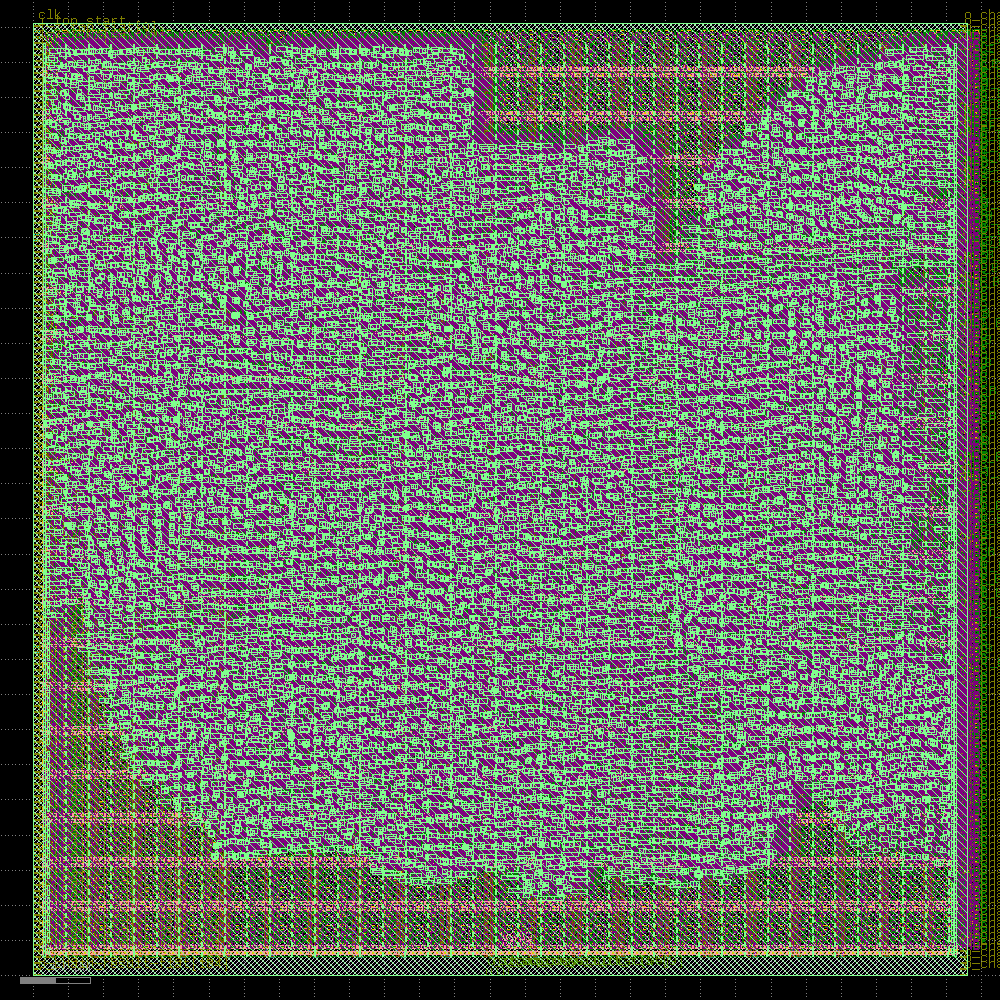

In [ ]:
display(gpl)

### Detailed Placement

This aligns the fuzzy placement from before with the grid, "legalizing" it.

In [ ]:
DetailedPlacement = Step.factory.get("OpenROAD.DetailedPlacement")

dpl = DetailedPlacement(state_in=gpl.state_out)
dpl.start()

─────────────────────────────────────────────── Detailed Placement ────────────────────────────────────────────────

[21:24:54] VERBOSE  Running 'OpenROAD.DetailedPlacement'…                                              ]8;id=604371;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=12687;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:24:54] VERBOSE  Logging subprocess to                                                              ]8;id=104344;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=919612;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=828559;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\openlane_run/]8;;\]8;id=757996;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\24]8;;\]8;id=828559;file:///content/openlane_run/24-openroad-detailedplacement/openroad-detailedplacement.log\-openroad-detailedplacement/openroad-detailedplacement.log]8;;\…                     

Reading OpenROAD database at '/content/openlane_run/23-openroad-globalplacement/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

Placement Analysis

---------------------------------

total displacement      29204.5 u

average displacement        1.6 u

max displacement            8.6 u

original HPWL          255359.9 u

legalized HPWL         285443.7 u

delta HPWL                   12 %

[INFO DPL-0020] Mirrored 3756 instances

[INFO DPL-0021] HPWL before          285443.7 u

[INFO DPL-0022] HPWL after           279301.0 u

[INFO DPL-0023] HPWL delta               -2.2 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/24-openroad-detailedplacement/full_chain_stage4.nl.v
pnl,openlane_run/24-openroad-detailedplacement/full_chain_stage4.pnl.v
def,openlane_run/24-openroad-detailedplacement/full_chain_stage4.def
odb,openlane_run/24-openroad-detailedplacement/full_chain_stage4.odb
sdc,openlane_run/24-openroad-detailedplacement/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:24:57] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=933275;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=202183;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:24:58] VERBOSE  Logging subprocess to ]8;id=837133;file:///tmp/openlane_klayout_tmp_8zwr2y1r/klayout-render.log\..]8;;\]8;id=296084;file:///tmp/openlane_klayout_tmp_8zwr2y1r/klayout-render.log\/tmp/openlane_klayout_tmp_8zwr2y1r/]8;;\]8;id=247298;file:///tmp/openlane_klayout_tmp_8zwr2y1r/klayout-render.log\klayout-render.log]8;;\…     ]8;id=949169;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=917178;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 3.04s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
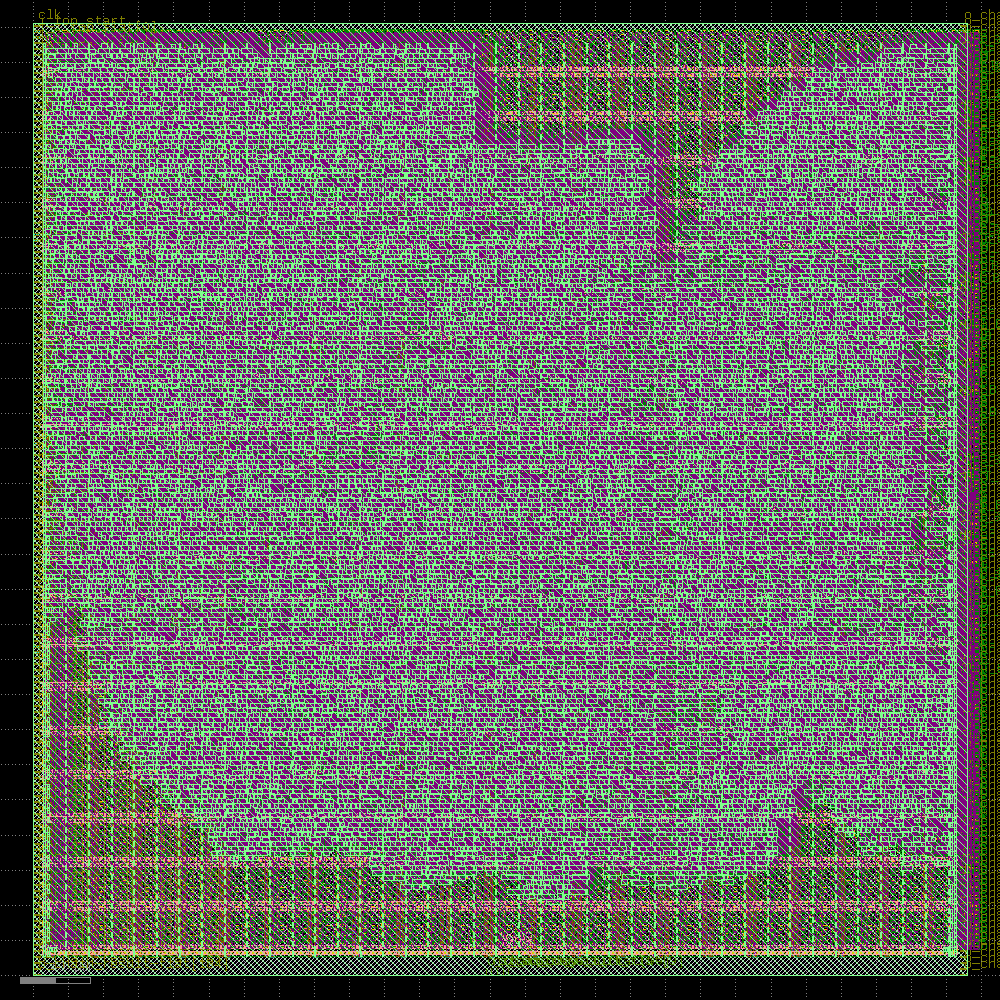

In [ ]:
display(dpl)

### Clock Tree Synthesis (CTS)

With the cells now having a final placement, we can go ahead and create what
is known as the clock tree, i.e., the hierarchical set of buffers used
for clock signal to minimize what is known as "clock skew"- variable delay
of the clock cycle from register to register because of factors such as metal
wire length, clock load (number of gates connected to the same clock buffer,)
et cetera.

The CTS step creates the cells and places the between the gaps in the detailed
placement above.

In [ ]:
CTS = Step.factory.get("OpenROAD.CTS")

cts = CTS(state_in=dpl.state_out)
cts.start()

────────────────────────────────────────────── Clock Tree Synthesis ───────────────────────────────────────────────

[21:25:01] VERBOSE  Running 'OpenROAD.CTS'…                                                            ]8;id=206449;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=946289;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:25:01] VERBOSE  Logging subprocess to ]8;id=988350;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\openlane_run/]8;;\]8;id=41846;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\25]8;;\]8;id=988350;file:///content/openlane_run/25-openroad-cts/openroad-cts.log\-openroad-cts/openroad-cts.log]8;;\…               ]8;id=68359;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=462663;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Reading timing models for corner nom_tt_025C_1v80…

Reading timing library for the 'nom_tt_025C_1v80' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading timing models for corner nom_ff_n40C_1v95…

Reading timing library for the 'nom_ff_n40C_1v95' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ff_n40C_1v95.lib'…

Reading timing models for corner nom_ss_100C_1v60…

Reading timing library for the 'nom_ss_100C_1v60' corner at                                                        
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__ss_100C_1v60.lib'…

Reading OpenROAD database at '/content/openlane_run/24-openroad-detailedplacement/full_chain_stage4.odb'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting RC values…

[INFO] Configuring cts characterization…

[INFO] Performing clock tree synthesis…

[INFO] Looking for the following net(s): clk

[INFO] Running Clock Tree Synthesis…

[INFO CTS-0050] Root buffer is sky130_fd_sc_hd__clkbuf_16.

[INFO CTS-0051] Sink buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0052] The following clock buffers will be used for CTS:

sky130_fd_sc_hd__clkbuf_2

sky130_fd_sc_hd__clkbuf_4

sky130_fd_sc_hd__clkbuf_8

[INFO CTS-0049] Characterization buffer is sky130_fd_sc_hd__clkbuf_8.

[INFO CTS-0007] Net "clk" found for clock "clk".

[INFO CTS-0010]  Clock net "clk" has 559 sinks.

[INFO CTS-0008] TritonCTS found 1 clock nets.

[INFO CTS-0097] Characterization used 3 buffer(s) types.

[INFO CTS-0200] 0 placement blockages have been identified.

[INFO CTS-0201] 0 placed hard macros will be treated like blockages.

[INFO CTS-0027] Generating H-Tree topology for net clk.

[INFO CTS-0028]  Total number of sinks: 559.

[INFO CTS-0029]  Sinks will be clustered in groups of up to 25 and with maximum cluster diameter of 50.0 um.

[INFO CTS-0030]  Number of static layers: 0.

[INFO CTS-0020]  Wire segment unit: 13600  dbu (13 um).

[INFO CTS-0204] A clustering solution was found from clustering size of 25 and clustering diameter of 50.

[INFO CTS-0205] Better solution may be possible if either -sink_clustering_size, -sink_clustering_max_diameter, or 
both options are omitted to enable automatic clustering.

[INFO CTS-0019]  Total number of sinks after clustering: 80.

[INFO CTS-0024]  Normalized sink region: [(1.37996, 4.16814), (37.3065, 38.1809)].

[INFO CTS-0025]     Width:  35.9266.

[INFO CTS-0026]     Height: 34.0127.

Level 1

Direction: Horizontal

Sinks per sub-region: 40

Sub-region size: 17.9633 X 34.0127

[INFO CTS-0034]     Segment length (rounded): 8.

Level 2

Direction: Vertical

Sinks per sub-region: 20

Sub-region size: 17.9633 X 17.0064

[INFO CTS-0034]     Segment length (rounded): 8.

Level 3

Direction: Horizontal

Sinks per sub-region: 10

Sub-region size: 8.9816 X 17.0064

[INFO CTS-0034]     Segment length (rounded): 4.

[INFO CTS-0032]  Stop criterion found. Max number of sinks is 15.

[INFO CTS-0035]  Number of sinks covered: 80.

[INFO CTS-0018]     Created 82 clock buffers.

[INFO CTS-0012]     Minimum number of buffers in the clock path: 2.

[INFO CTS-0013]     Maximum number of buffers in the clock path: 3.

[INFO CTS-0015]     Created 82 clock nets.

[INFO CTS-0016]     Fanout distribution for the current clock = 2:8, 3:6, 4:9, 5:6, 6:6, 7:5, 8:8, 9:8, 10:3, 11:4,
12:7, 13:1, 14:3, 15:2, 16:4, 18:1..

[INFO CTS-0017]     Max level of the clock tree: 3.

[INFO CTS-0098] Clock net "clk"

[INFO CTS-0099]  Sinks 630

[INFO CTS-0100]  Leaf buffers 73

[INFO CTS-0101]  Average sink wire length 813.83 um

[INFO CTS-0102]  Path depth 2 - 3

[INFO CTS-0207]  Leaf load cells 71

[INFO] Repairing long wires on clock nets…

[INFO RSZ-0058] Using max wire length 6335um.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/25-openroad-cts/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/25-openroad-cts/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/25-openroad-cts/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/25-openroad-cts/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/25-openroad-cts/full_chain_stage4.sdc'…

[INFO] Legalizing…

Placement Analysis

---------------------------------

total displacement       1168.1 u

average displacement        0.1 u

max displacement           11.5 u

original HPWL          284722.0 u

legalized HPWL         291759.6 u

delta HPWL                    2 %

[INFO DPL-0020] Mirrored 3803 instances

[INFO DPL-0021] HPWL before          291759.6 u

[INFO DPL-0022] HPWL after           285405.2 u

[INFO DPL-0023] HPWL delta               -2.2 %

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/25-openroad-cts/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/25-openroad-cts/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/25-openroad-cts/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/25-openroad-cts/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/25-openroad-cts/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/25-openroad-cts/full_chain_stage4.nl.v
pnl,openlane_run/25-openroad-cts/full_chain_stage4.pnl.v
def,openlane_run/25-openroad-cts/full_chain_stage4.def
odb,openlane_run/25-openroad-cts/full_chain_stage4.odb
sdc,openlane_run/25-openroad-cts/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:25:35] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=66206;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=514146;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:25:35] VERBOSE  Logging subprocess to ]8;id=790008;file:///tmp/openlane_klayout_tmp_l3s6xksh/klayout-render.log\..]8;;\]8;id=83385;file:///tmp/openlane_klayout_tmp_l3s6xksh/klayout-render.log\/tmp/openlane_klayout_tmp_l3s6xksh/]8;;\]8;id=185615;file:///tmp/openlane_klayout_tmp_l3s6xksh/klayout-render.log\klayout-render.log]8;;\…     ]8;id=261932;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=253849;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 34.52s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
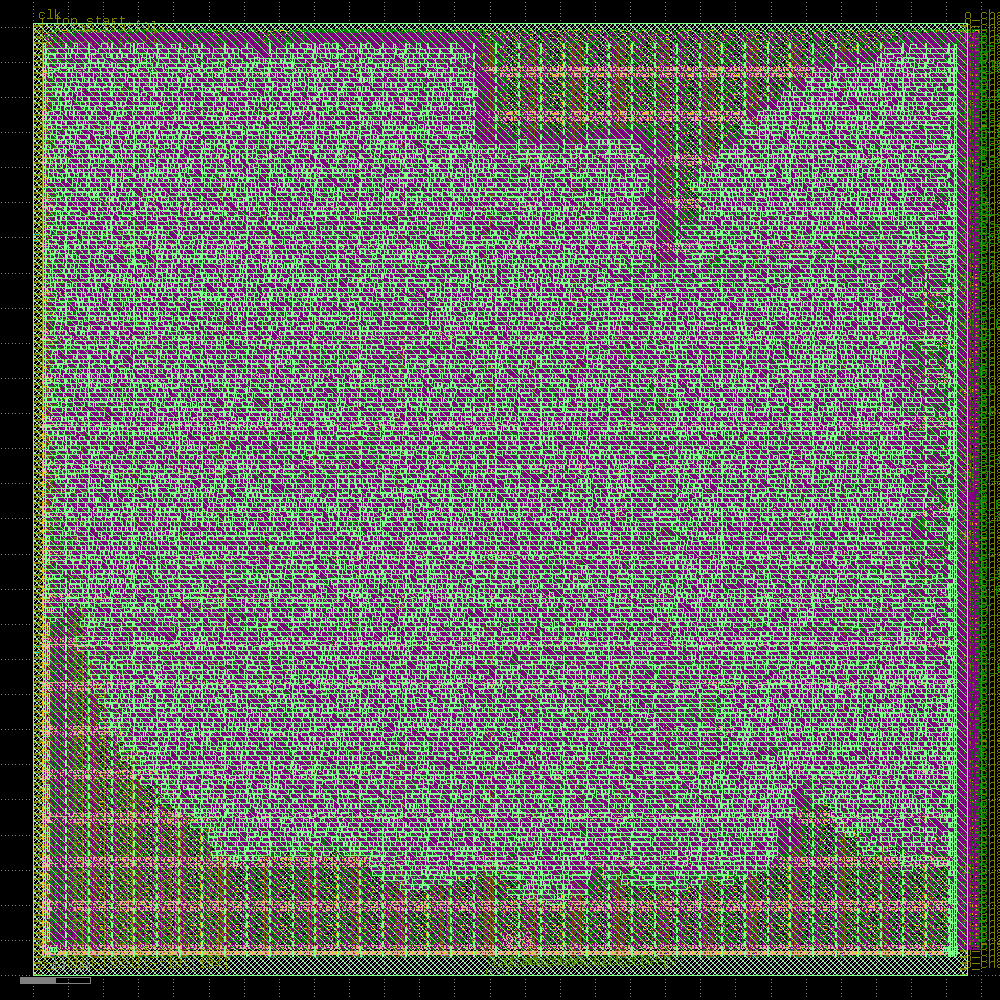

In [ ]:
display(cts)

### Global Routing

Global routing "plans" the routes the wires between two gates (or gates and
I/O pins/the PDN) will take. The results of global routing (which are called
"routing guides") are stored in internal data structures and have no effect on
the actual design, so there is no `display()` statement.

In [ ]:
GlobalRouting = Step.factory.get("OpenROAD.GlobalRouting")

grt = GlobalRouting(state_in=cts.state_out)
grt.start()

───────────────────────────────────────────────── Global Routing ──────────────────────────────────────────────────

[21:25:39] VERBOSE  Running 'OpenROAD.GlobalRouting'…                                                  ]8;id=942906;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=950758;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:25:39] VERBOSE  Logging subprocess to                                                              ]8;id=881565;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=415573;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=558254;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\openlane_run/]8;;\]8;id=716445;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\26]8;;\]8;id=558254;file:///content/openlane_run/26-openroad-globalrouting/openroad-globalrouting.log\-openroad-globalrouting/openroad-globalrouting.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/25-openroad-cts/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO] Setting signal min routing layer to: met1 and clock min routing layer to met1.

[INFO] Setting signal max routing layer to: met5 and clock max routing layer to met5.

-congestion_iterations 50 -verbose

[INFO GRT-0020] Min routing layer: met1

[INFO GRT-0021] Max routing layer: met5

[INFO GRT-0022] Global adjustment: 30%

[INFO GRT-0023] Grid origin: (0, 0)

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0088] Layer li1     Track-Pitch = 0.4600  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met1    Track-Pitch = 0.3400  line-2-Via Pitch: 0.3400

[INFO GRT-0088] Layer met2    Track-Pitch = 0.4600  line-2-Via Pitch: 0.3500

[INFO GRT-0088] Layer met3    Track-Pitch = 0.6800  line-2-Via Pitch: 0.6150

[INFO GRT-0088] Layer met4    Track-Pitch = 0.9200  line-2-Via Pitch: 1.0400

[INFO GRT-0088] Layer met5    Track-Pitch = 3.4000  line-2-Via Pitch: 3.1100

[INFO GRT-0019] Found 83 clock nets.

[INFO GRT-0001] Minimum degree: 2

[INFO GRT-0002] Maximum degree: 560

[INFO GRT-0003] Macros: 0

[INFO GRT-0043] No OR_DEFAULT vias defined.

[INFO GRT-0004] Blockages: 20451

[INFO GRT-0053] Routing resources analysis:

Routing      Original      Derated      Resource

Layer     Direction    Resources     Resources    Reduction (%)

---------------------------------------------------------------

li1        Vertical            0             0          0.00%

met1       Horizontal     121024         58591          51.59%

met2       Vertical        90105         58645          34.91%

met3       Horizontal      60512         40359          33.30%

met4       Vertical        36120         17791          50.74%

met5       Horizontal      12087          4864          59.76%

---------------------------------------------------------------

[INFO GRT-0101] Running extra iterations to remove overflow.

[INFO GRT-0197] Via related to pin nodes: 67694

[INFO GRT-0198] Via related Steiner nodes: 769

[INFO GRT-0199] Via filling finished.

[INFO GRT-0111] Final number of vias: 82754

[INFO GRT-0112] Final usage 3D: 293466

[INFO GRT-0096] Final congestion report:

Layer         Resource        Demand        Usage (%)    Max H / Max V / Total Overflow

---------------------------------------------------------------------------------------

li1                  0             0            0.00%             0 /  0 /  0

met1             58591         19903           33.97%             0 /  0 /  0

met2             58645         22893           39.04%             0 /  0 /  0

met3             40359          1180            2.92%             0 /  0 /  0

met4             17791          1228            6.90%             0 /  0 /  0

met5              4864             0            0.00%             0 /  0 /  0

---------------------------------------------------------------------------------------

Total           180250         45204           25.08%             0 /  0 /  0

[INFO GRT-0018] Total wirelength: 496199 um

[INFO GRT-0014] Routed nets: 13670

[INFO] Setting RC values…

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/26-openroad-globalrouting/full_chain_stage4.odb'…

Writing layout to '/content/openlane_run/26-openroad-globalrouting/full_chain_stage4.def'…

Format,Path
nl,openlane_run/25-openroad-cts/full_chain_stage4.nl.v
pnl,openlane_run/25-openroad-cts/full_chain_stage4.pnl.v
def,openlane_run/26-openroad-globalrouting/full_chain_stage4.def
odb,openlane_run/26-openroad-globalrouting/full_chain_stage4.odb
sdc,openlane_run/25-openroad-cts/full_chain_stage4.sdc


### Detailed Routing

Detailed routing uses the guides from Global Routing to actually create wires
on the metal layers and connect the gates, making the connections finally physical.

This is typically the longest step in the flow.

In [ ]:
DetailedRouting = Step.factory.get("OpenROAD.DetailedRouting")

drt = DetailedRouting(state_in=grt.state_out)
drt.start()

──────────────────────────────────────────────── Detailed Routing ─────────────────────────────────────────────────

[21:25:46] VERBOSE  Running 'OpenROAD.DetailedRouting'…                                                ]8;id=417402;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=335738;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:25:46] INFO     Running TritonRoute with 2 threads…                                            ]8;id=715005;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=947440;file:///content/openlane_ipynb/openlane/steps/openroad.py#1619\1619]8;;\

[21:25:46] VERBOSE  Logging subprocess to                                                              ]8;id=10003;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=411182;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=134653;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\openlane_run/]8;;\]8;id=563102;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\27]8;;\]8;id=134653;file:///content/openlane_run/27-openroad-detailedrouting/openroad-detailedrouting.log\-openroad-detailedrouting/openroad-detailedrouting.log]8;;\…                         

Reading OpenROAD database at '/content/openlane_run/26-openroad-globalrouting/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

[INFO ORD-0030] Using 2 thread(s).

[INFO DRT-0149] Reading tech and libs.

[21:25:47] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=96708;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=863226;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[21:25:47] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=565561;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=717584;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer mcon                                                                                     

[21:25:47] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=756431;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=699852;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[21:25:47] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=178216;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=145029;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via                                                                                      

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=107291;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=221804;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=212086;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=233068;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via2                                                                                     

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=688259;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=470979;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=514097;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=103704;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via3                                                                                     

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=985479;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=633532;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

[21:25:48] WARNING  [DRT-0349] LEF58_ENCLOSURE with no CUTCLASS is not supported. Skipping for      ]8;id=691707;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=441833;file:///content/openlane_ipynb/openlane/steps/openroad.py#235\235]8;;\
                    layer via4                                                                                     

Units:                1000

Number of layers:     13

Number of macros:     441

Number of vias:       29

Number of viarulegen: 25

[INFO DRT-0150] Reading design.

Design:                   full_chain_stage4

Die area:                 ( 0 0 ) ( 531600 542320 )

Number of track patterns: 12

Number of DEF vias:       0

Number of components:     17916

Number of terminals:      327

Number of snets:          2

Number of nets:           13670

[INFO DRT-0167] List of default vias:

Layer via

default via: M1M2_PR

Layer via2

default via: M2M3_PR

Layer via3

default via: M3M4_PR

Layer via4

default via: M4M5_PR

[INFO DRT-0162] Library cell analysis.

[INFO DRT-0163] Instance analysis.

[INFO DRT-0164] Number of unique instances = 271.

[INFO DRT-0168] Init region query.

[INFO DRT-0024]   Complete FR_MASTERSLICE.

[INFO DRT-0024]   Complete Fr_VIA.

[INFO DRT-0024]   Complete li1.

[INFO DRT-0024]   Complete mcon.

[INFO DRT-0024]   Complete met1.

[INFO DRT-0024]   Complete via.

[INFO DRT-0024]   Complete met2.

[INFO DRT-0024]   Complete via2.

[INFO DRT-0024]   Complete met3.

[INFO DRT-0024]   Complete via3.

[INFO DRT-0024]   Complete met4.

[INFO DRT-0024]   Complete via4.

[INFO DRT-0024]   Complete met5.

[INFO DRT-0033] FR_MASTERSLICE shape region query size = 0.

[INFO DRT-0033] FR_VIA shape region query size = 0.

[INFO DRT-0033] li1 shape region query size = 417566.

[INFO DRT-0033] mcon shape region query size = 0.

[INFO DRT-0033] met1 shape region query size = 59727.

[INFO DRT-0033] via shape region query size = 20160.

[INFO DRT-0033] met2 shape region query size = 12101.

[INFO DRT-0033] via2 shape region query size = 16128.

[INFO DRT-0033] met3 shape region query size = 12416.

[INFO DRT-0033] via3 shape region query size = 16128.

[INFO DRT-0033] met4 shape region query size = 4998.

[INFO DRT-0033] via4 shape region query size = 882.

[INFO DRT-0033] met5 shape region query size = 966.

[INFO DRT-0165] Start pin access.

[INFO DRT-0076]   Complete 1000 pins.

[INFO DRT-0078]   Complete 1063 pins.

[INFO DRT-0079]   Complete 100 unique inst patterns.

[INFO DRT-0079]   Complete 200 unique inst patterns.

[INFO DRT-0081]   Complete 265 unique inst patterns.

[INFO DRT-0084]   Complete 9034 groups.

#scanned instances     = 17916

#unique  instances     = 271

#stdCellGenAp          = 7356

#stdCellValidPlanarAp  = 63

#stdCellValidViaAp     = 5783

#stdCellPinNoAp        = 0

#stdCellPinCnt         = 45645

#instTermValidViaApCnt = 0

#macroGenAp            = 0

#macroValidPlanarAp    = 0

#macroValidViaAp       = 0

#macroNoAp             = 0

[INFO DRT-0166] Complete pin access.

[INFO DRT-0267] cpu time = 00:03:23, elapsed time = 00:03:21, memory = 207.72 (MB), peak = 249.54 (MB)

Number of guides:     86863

[INFO DRT-0169] Post process guides.

[INFO DRT-0176] GCELLGRID X 0 DO 77 STEP 6900 ;

[INFO DRT-0177] GCELLGRID Y 0 DO 78 STEP 6900 ;

[INFO DRT-0028]   Complete FR_MASTERSLICE.

[INFO DRT-0028]   Complete Fr_VIA.

[INFO DRT-0028]   Complete li1.

[INFO DRT-0028]   Complete mcon.

[INFO DRT-0028]   Complete met1.

[INFO DRT-0028]   Complete via.

[INFO DRT-0028]   Complete met2.

[INFO DRT-0028]   Complete via2.

[INFO DRT-0028]   Complete met3.

[INFO DRT-0028]   Complete via3.

[INFO DRT-0028]   Complete met4.

[INFO DRT-0028]   Complete via4.

[INFO DRT-0028]   Complete met5.

[INFO DRT-0178] Init guide query.

[INFO DRT-0035]   Complete FR_MASTERSLICE (guide).

[INFO DRT-0035]   Complete Fr_VIA (guide).

[INFO DRT-0035]   Complete li1 (guide).

[INFO DRT-0035]   Complete mcon (guide).

[INFO DRT-0035]   Complete met1 (guide).

[INFO DRT-0035]   Complete via (guide).

[INFO DRT-0035]   Complete met2 (guide).

[INFO DRT-0035]   Complete via2 (guide).

[INFO DRT-0035]   Complete met3 (guide).

[INFO DRT-0035]   Complete via3 (guide).

[INFO DRT-0035]   Complete met4 (guide).

[INFO DRT-0035]   Complete via4 (guide).

[INFO DRT-0035]   Complete met5 (guide).

[INFO DRT-0036] FR_MASTERSLICE guide region query size = 0.

[INFO DRT-0036] FR_VIA guide region query size = 0.

[INFO DRT-0036] li1 guide region query size = 31752.

[INFO DRT-0036] mcon guide region query size = 0.

[INFO DRT-0036] met1 guide region query size = 23824.

[INFO DRT-0036] via guide region query size = 0.

[INFO DRT-0036] met2 guide region query size = 11920.

[INFO DRT-0036] via2 guide region query size = 0.

[INFO DRT-0036] met3 guide region query size = 487.

[INFO DRT-0036] via3 guide region query size = 0.

[INFO DRT-0036] met4 guide region query size = 77.

[INFO DRT-0036] via4 guide region query size = 0.

[INFO DRT-0036] met5 guide region query size = 0.

[INFO DRT-0179] Init gr pin query.

[INFO DRT-0245] skipped writing guide updates to database.

[INFO DRT-0185] Post process initialize RPin region query.

[INFO DRT-0181] Start track assignment.

[INFO DRT-0184] Done with 43749 vertical wires in 2 frboxes and 24311 horizontal wires in 2 frboxes.

[INFO DRT-0186] Done with 4457 vertical wires in 2 frboxes and 6131 horizontal wires in 2 frboxes.

[INFO DRT-0182] Complete track assignment.

[INFO DRT-0267] cpu time = 00:00:10, elapsed time = 00:00:10, memory = 357.08 (MB), peak = 357.08 (MB)

[INFO DRT-0187] Start routing data preparation.

[INFO DRT-0267] cpu time = 00:00:00, elapsed time = 00:00:00, memory = 357.08 (MB), peak = 357.08 (MB)

[INFO DRT-0194] Start detail routing.

[INFO DRT-0195] Start 0th optimization iteration.

Completing 10% with 0 violations.

elapsed time = 00:00:24, memory = 391.80 (MB).

Completing 20% with 0 violations.

elapsed time = 00:00:50, memory = 492.38 (MB).

Completing 30% with 719 violations.

elapsed time = 00:01:20, memory = 589.57 (MB).

Completing 40% with 719 violations.

elapsed time = 00:01:49, memory = 595.41 (MB).

Completing 50% with 719 violations.

elapsed time = 00:02:16, memory = 595.66 (MB).

Completing 60% with 1404 violations.

elapsed time = 00:02:43, memory = 622.22 (MB).

Completing 70% with 1404 violations.

elapsed time = 00:03:18, memory = 628.66 (MB).

Completing 80% with 2114 violations.

elapsed time = 00:03:39, memory = 628.73 (MB).

Completing 90% with 2114 violations.

elapsed time = 00:03:58, memory = 640.59 (MB).

Completing 100% with 2888 violations.

elapsed time = 00:04:21, memory = 652.05 (MB).

[INFO DRT-0199]   Number of violations = 4528.

Viol/Layer         li1   mcon   met1    via   met2   met3   met4

Cut Spacing          0      5      0      0      0      0      0

Metal Spacing      126      0    779      0    238     26      0

Min Hole             0      0     25      0      0      0      0

NS Metal             4      0      0      0      0      0      0

Recheck              4      0   1095      0    512     26      3

Short                0      1   1492      4    188      0      0

[INFO DRT-0267] cpu time = 00:05:06, elapsed time = 00:04:22, memory = 838.25 (MB), peak = 838.25 (MB)

Total wire length = 322258 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 145604 um.

Total wire length on LAYER met2 = 158513 um.

Total wire length on LAYER met3 = 9791 um.

Total wire length on LAYER met4 = 8349 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 88328.

Up-via summary (total 88328):

------------------------

FR_MASTERSLICE        0

li1    44280

met1    43336

met2      561

met3      151

met4        0

------------------------

88328

[INFO DRT-0195] Start 1st optimization iteration.

Completing 10% with 4528 violations.

elapsed time = 00:00:11, memory = 838.25 (MB).

Completing 20% with 4528 violations.

elapsed time = 00:00:28, memory = 838.44 (MB).

Completing 30% with 3572 violations.

elapsed time = 00:00:43, memory = 849.01 (MB).

Completing 40% with 3572 violations.

elapsed time = 00:00:57, memory = 859.84 (MB).

Completing 50% with 3572 violations.

elapsed time = 00:01:11, memory = 859.93 (MB).

Completing 60% with 2727 violations.

elapsed time = 00:01:26, memory = 844.13 (MB).

Completing 70% with 2727 violations.

elapsed time = 00:01:42, memory = 844.13 (MB).

Completing 80% with 1694 violations.

elapsed time = 00:02:02, memory = 844.13 (MB).

Completing 90% with 1694 violations.

elapsed time = 00:02:21, memory = 844.13 (MB).

Completing 100% with 914 violations.

elapsed time = 00:02:29, memory = 844.13 (MB).

[INFO DRT-0199]   Number of violations = 919.

Viol/Layer        mcon   met1    via   met2   met3

Cut Spacing          2      0      1      0      0

Metal Spacing        0    269      0     80     11

Min Hole             0      7      0      0      0

Recheck              0      4      0      1      0

Short                0    499      1     44      0

[INFO DRT-0267] cpu time = 00:04:11, elapsed time = 00:02:31, memory = 844.90 (MB), peak = 878.40 (MB)

Total wire length = 319648 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 144294 um.

Total wire length on LAYER met2 = 157207 um.

Total wire length on LAYER met3 = 9778 um.

Total wire length on LAYER met4 = 8368 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 87924.

Up-via summary (total 87924):

------------------------

FR_MASTERSLICE        0

li1    44232

met1    42970

met2      571

met3      151

met4        0

------------------------

87924

[INFO DRT-0195] Start 2nd optimization iteration.

Completing 10% with 919 violations.

elapsed time = 00:00:07, memory = 844.90 (MB).

Completing 20% with 919 violations.

elapsed time = 00:00:20, memory = 844.90 (MB).

Completing 30% with 886 violations.

elapsed time = 00:00:33, memory = 844.90 (MB).

Completing 40% with 886 violations.

elapsed time = 00:00:48, memory = 844.90 (MB).

Completing 50% with 886 violations.

elapsed time = 00:01:02, memory = 844.90 (MB).

Completing 60% with 912 violations.

elapsed time = 00:01:18, memory = 844.90 (MB).

Completing 70% with 912 violations.

elapsed time = 00:01:33, memory = 844.90 (MB).

Completing 80% with 853 violations.

elapsed time = 00:01:50, memory = 844.90 (MB).

Completing 90% with 853 violations.

elapsed time = 00:02:03, memory = 844.90 (MB).

Completing 100% with 792 violations.

elapsed time = 00:02:17, memory = 844.90 (MB).

[INFO DRT-0199]   Number of violations = 805.

Viol/Layer        met1   met2   met3

Metal Spacing      164     64      6

Min Hole             4      0      0

Recheck             11      2      0

Short              525     29      0

[INFO DRT-0267] cpu time = 00:03:51, elapsed time = 00:02:18, memory = 846.70 (MB), peak = 878.40 (MB)

Total wire length = 318908 um.

Total wire length on LAYER li1 = 0 um.

Total wire length on LAYER met1 = 144182 um.

Total wire length on LAYER met2 = 156588 um.

Total wire length on LAYER met3 = 9801 um.

Total wire length on LAYER met4 = 8336 um.

Total wire length on LAYER met5 = 0 um.

Total number of vias = 87617.

Up-via summary (total 87617):

------------------------

FR_MASTERSLICE        0

li1    44232

met1    42663

met2      576

met3      146

met4        0

------------------------

87617

[INFO DRT-0195] Start 3rd optimization iteration.

Completing 10% with 805 violations.

elapsed time = 00:00:04, memory = 846.70 (MB).

Completing 20% with 805 violations.

elapsed time = 00:00:09, memory = 846.70 (MB).

Completing 30% with 624 violations.

elapsed time = 00:00:20, memory = 846.70 (MB).

Completing 40% with 624 violations.

elapsed time = 00:00:24, memory = 846.70 (MB).

Completing 50% with 624 violations.

elapsed time = 00:00:28, memory = 846.70 (MB).

Completing 60% with 452 violations.

elapsed time = 00:00:36, memory = 846.70 (MB).

Completing 70% with 452 violations.

elapsed time = 00:00:41, memory = 846.70 (MB).

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:39:48] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=754165;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=109610;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:39:48] VERBOSE  Logging subprocess to ]8;id=430072;file:///tmp/openlane_klayout_tmp_v_lo_s56/klayout-render.log\..]8;;\]8;id=22462;file:///tmp/openlane_klayout_tmp_v_lo_s56/klayout-render.log\/tmp/openlane_klayout_tmp_v_lo_s56/]8;;\]8;id=524275;file:///tmp/openlane_klayout_tmp_v_lo_s56/klayout-render.log\klayout-render.log]8;;\…     ]8;id=128610;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=542232;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 841.90s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
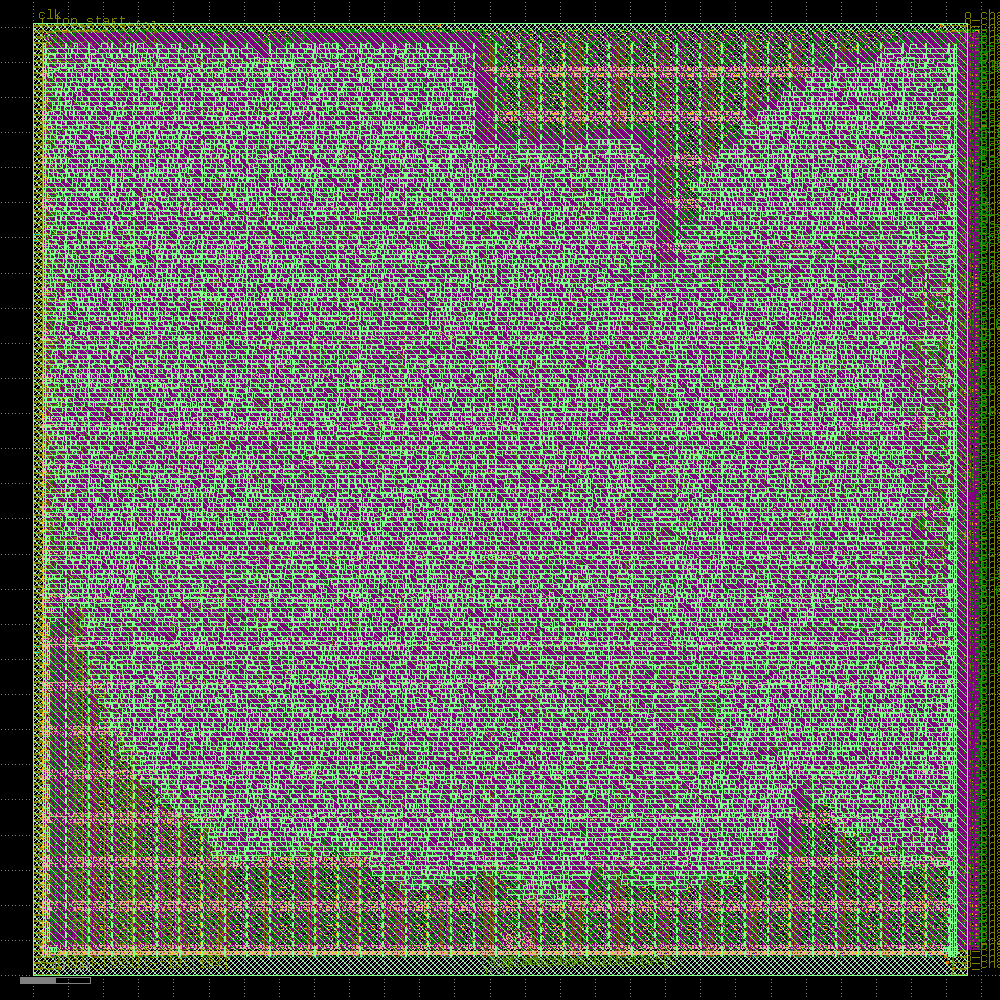

In [ ]:
display(drt)

### Fill Insertion

Finally, as we're done placing all the essential cells, the only thing left to
do is fill in the gaps.

We prioritize the use of decap (decoupling capacitor) cells, which
further supports the power distribution network, but when there aren't any
small enough cells, we just use regular fill cells.

In [ ]:
FillInsertion = Step.factory.get("OpenROAD.FillInsertion")

fill = FillInsertion(state_in=drt.state_out)
fill.start()

───────────────────────────────────────────────── Fill Insertion ──────────────────────────────────────────────────

[21:39:53] VERBOSE  Running 'OpenROAD.FillInsertion'…                                                  ]8;id=440115;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=913227;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:39:53] VERBOSE  Logging subprocess to                                                              ]8;id=384300;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=538149;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=749911;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\openlane_run/]8;;\]8;id=785247;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\28]8;;\]8;id=749911;file:///content/openlane_run/28-openroad-fillinsertion/openroad-fillinsertion.log\-openroad-fillinsertion/openroad-fillinsertion.log]8;;\…                             

Reading OpenROAD database at '/content/openlane_run/27-openroad-detailedrouting/full_chain_stage4.odb'…

Reading library file at '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lib/sky130_fd_sc_hd__tt_025C_1v80.lib'…

Reading design constraints file at '/content/openlane_ipynb/openlane/scripts/base.sdc'…

[INFO] Using clock clk…

[INFO] Setting output delay to: 20

[INFO] Setting input delay to: 20

[INFO] Setting load to: 0.033442

[INFO] Setting clock uncertainty to: 0.25

[INFO] Setting clock transition to: 0.1499999999999999944488848768742172978818416595458984375

[INFO] Setting timing derate to: 5%

sky130_ef_sc_hd__decap_12 sky130_fd_sc_hd__decap_8 sky130_fd_sc_hd__decap_6 sky130_fd_sc_hd__decap_4               
sky130_fd_sc_hd__decap_3 sky130_fd_sc_hd__fill*

[INFO DPL-0001] Placed 18107 filler instances.

Setting global connections for newly added cells…

[INFO] Setting global connections...

Writing OpenROAD database to '/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'…

Writing netlist to '/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'…

Writing powered netlist to '/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'…

Writing layout to '/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'…

Writing timing constraints to '/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'…

Format,Path
nl,openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v
pnl,openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v
def,openlane_run/28-openroad-fillinsertion/full_chain_stage4.def
odb,openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb
sdc,openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc


──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:39:55] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=244954;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=645352;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:39:55] VERBOSE  Logging subprocess to ]8;id=291762;file:///tmp/openlane_klayout_tmp_6cmivull/klayout-render.log\..]8;;\]8;id=536540;file:///tmp/openlane_klayout_tmp_6cmivull/klayout-render.log\/tmp/openlane_klayout_tmp_6cmivull/]8;;\]8;id=569528;file:///tmp/openlane_klayout_tmp_6cmivull/klayout-render.log\klayout-render.log]8;;\…     ]8;id=430108;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=894188;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.03s
#### Views updated:
* Verilog Netlist
* Powered Verilog Netlist
* Design Exchange Format
* OpenDB Database
* Design Constraints
#### Preview:
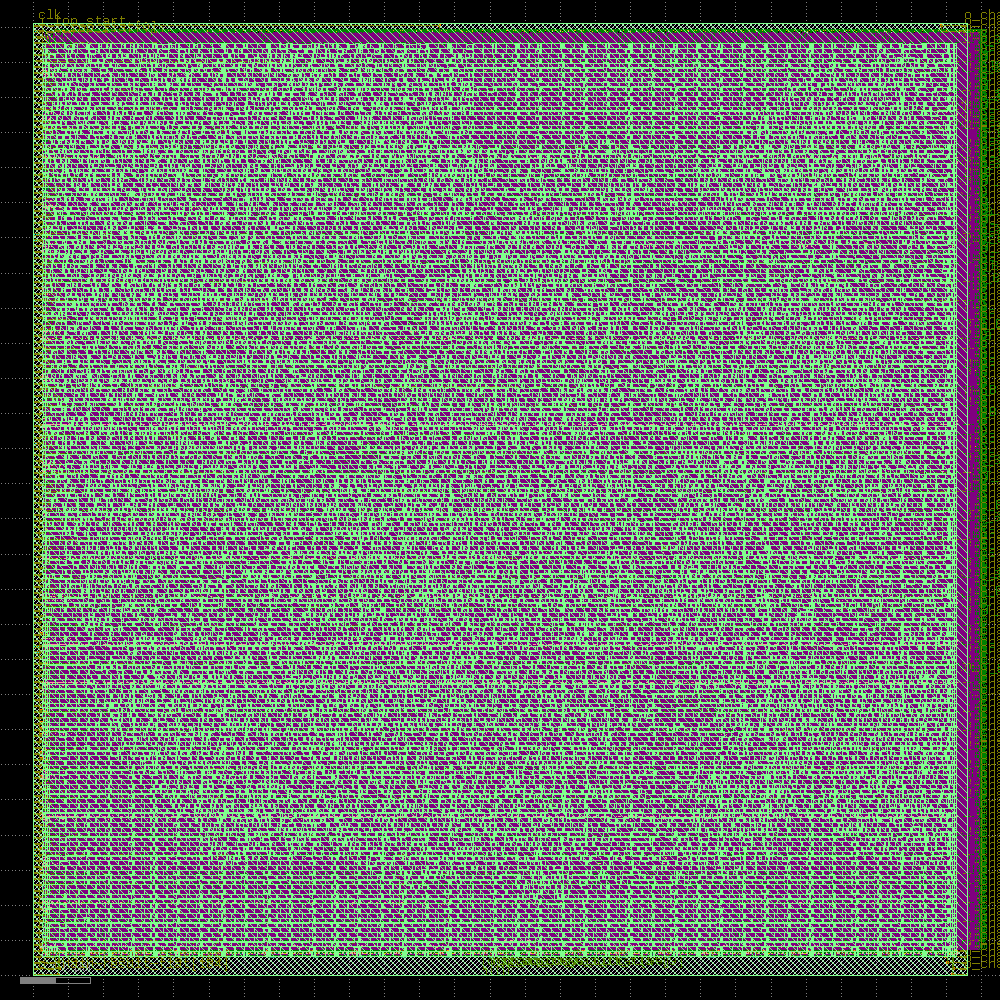

In [ ]:
display(fill)

### Parasitics Extraction a.k.a. Resistance/Capacitance Extraction (RCX)

This step does not alter the design- rather, it computes the
[Parasitic elements](https://en.wikipedia.org/wiki/Parasitic_element_(electrical_networks))
of the circuit, which have an effect of timing, as we prepare to do the final
timing analysis.

The parasitic elements are saved in the **Standard Parasitics Exchange Format**,
or SPEF. OpenLane creates a SPEF file for each interconnect corner as described in
the [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
section of the documentation.

In [ ]:
RCX = Step.factory.get("OpenROAD.RCX")

rcx = RCX(state_in=fill.state_out)
rcx.start()

─────────────────────────────────── Parasitic Resistance/Capacitance Extraction ───────────────────────────────────

[21:40:00] VERBOSE  Running 'OpenROAD.RCX'…                                                            ]8;id=828583;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=227354;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:40:00] INFO     Running RCX for corners matching nom_*                                         ]8;id=385328;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=329335;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/nom/rcx.log)…                                           

[21:40:00] VERBOSE  Logging subprocess to ]8;id=769012;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\openlane_run/]8;;\]8;id=23496;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\29]8;;\]8;id=769012;file:///content/openlane_run/29-openroad-rcx/nom/rcx.log\-openroad-rcx/nom/rcx.log]8;;\…                    ]8;id=888986;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=737381;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[21:40:00] INFO     Running RCX for corners matching min_*                                         ]8;id=89456;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=746631;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/min/rcx.log)…                                           

[21:40:00] VERBOSE  Logging subprocess to ]8;id=966356;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\openlane_run/]8;;\]8;id=447167;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\29]8;;\]8;id=966356;file:///content/openlane_run/29-openroad-rcx/min/rcx.log\-openroad-rcx/min/rcx.log]8;;\…                    ]8;id=281348;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=716230;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[21:40:11] INFO     Finished RCX for corners matching nom_*.                                       ]8;id=865769;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=491660;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[21:40:11] INFO     Running RCX for corners matching max_*                                         ]8;id=460390;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=364303;file:///content/openlane_ipynb/openlane/steps/openroad.py#1748\1748]8;;\
                    (/content/openlane_run/29-openroad-rcx/max/rcx.log)…                                           

[21:40:11] VERBOSE  Logging subprocess to ]8;id=434062;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\openlane_run/]8;;\]8;id=692690;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\29]8;;\]8;id=434062;file:///content/openlane_run/29-openroad-rcx/max/rcx.log\-openroad-rcx/max/rcx.log]8;;\…                    ]8;id=643430;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=970854;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

[21:40:11] INFO     Finished RCX for corners matching min_*.                                       ]8;id=274599;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=773261;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

[21:40:18] INFO     Finished RCX for corners matching max_*.                                       ]8;id=593420;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=517437;file:///content/openlane_ipynb/openlane/steps/openroad.py#1757\1757]8;;\

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': None, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': None, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 0, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.527273'), 'design__instance__utilization__stdcell': Decimal('0.527273'), 'floorplan__design__io': 325, 'design__io__hpwl': 129952650, 'design__power_grid_violation__count__net:VGND': 0, 'design__power_grid_violation__count__net:VPWR': 0, 'design__power_grid_violation__count': 0, 'design__instance__displacement__total': Decimal('1168.14'), 'design__instance__displacement__mean': Decimal('0.065'), 'design__instance__displacement__max': Decimal('11.46'), 'route__wirelength__estimated': 291760, 'design__violations': 0, 'antenna__violating__nets': 7, 'antenna__violating__pins': 8, 'route__net': 13670, 'route__net__special': 2, 'route__drc_errors__iter:1': 4528, 'route__wirelength__iter:1': 322258, 'route__drc_errors__iter:2': 919, 'route__wirelength__iter:2': 319648, 'route__drc_errors__iter:3': 805, 'route__wirelength__iter:3': 318908, 'route__drc_errors__iter:4': 25, 'route__wirelength__iter:4': 318697, 'route__drc_errors__iter:5': 0, 'route__wirelength__iter:5': 318678, 'route__drc_errors': 0, 'route__wirelength': 318678, 'route__vias': 88157, 'route__vias__singlecut': 88157, 'route__vias__multicut': 0}}

### Static Timing Analysis (Post-PnR)

STA is a process that verifies that a chip meets certain constraints on clock
and data timings to run at its rated clock speed. See [Corners and STA](https://openlane2.readthedocs.io/en/latest/usage/corners_and_sta.html)
in the documentation for more info.

---

This step generates two kinds of files:
* `.lib`: Liberty™-compatible Library files. Can be used to do static timing
  analysis when creating a design with this design as a sub-macro.
* `.sdf`: Standard Delay Format. Can be used with certain simulation software
  to do *dynamic* timing analysis.

Unfortunately, the `.lib` files coming out of OpenLane right now are not super
reliable for timing purposes and are only provided for completeness.
When using OpenLane-created macros withing other designs, it is best to use the
macro's final netlist and extracted parasitics instead.

In [ ]:
STAPostPNR = Step.factory.get("OpenROAD.STAPostPNR")

sta_post_pnr = STAPostPNR(state_in=rcx.state_out)
sta_post_pnr.start()

──────────────────────────────────────── Static Timing Analysis (Post-PnR) ────────────────────────────────────────

[21:40:18] VERBOSE  Running 'OpenROAD.STAPostPNR'…                                                     ]8;id=744362;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=434728;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:40:18] INFO     Starting STA for the nom_tt_025C_1v80 timing corner…                            ]8;id=133937;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=870571;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:40:18] INFO     Starting STA for the nom_ss_100C_1v60 timing corner…                            ]8;id=281447;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=351082;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:40:18] VERBOSE  Logging subprocess to                                                              ]8;id=679637;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=433030;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=370901;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=588192;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\30]8;;\]8;id=370901;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/sta.log\-openroad-stapostpnr/nom_tt_025C_1v80/sta.log]8;;\…                                  

[21:40:18] VERBOSE  Logging subprocess to                                                              ]8;id=710341;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=154382;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=347580;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=528294;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\30]8;;\]8;id=347580;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/sta.log\-openroad-stapostpnr/nom_ss_100C_1v60/sta.log]8;;\…                                  

[21:40:45] INFO     Finished STA for the nom_ss_100C_1v60 timing corner.                            ]8;id=858157;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=104784;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:40:45] VERBOSE  Logging subprocess to                                                              ]8;id=557922;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=663256;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=132634;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=633430;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=132634;file:///content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/nom_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[21:40:46] INFO     Starting STA for the nom_ff_n40C_1v95 timing corner…                            ]8;id=847126;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=909835;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:40:46] VERBOSE  Logging subprocess to                                                              ]8;id=60914;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=901532;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=558408;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=692064;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\30]8;;\]8;id=558408;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log\-openroad-stapostpnr/nom_ff_n40C_1v95/sta.log]8;;\…                                  

[21:40:47] INFO     Finished STA for the nom_tt_025C_1v80 timing corner.                            ]8;id=176265;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=151476;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:40:47] VERBOSE  Logging subprocess to                                                              ]8;id=922057;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=848167;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=468510;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=162868;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=468510;file:///content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/nom_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[21:40:48] INFO     Starting STA for the min_tt_025C_1v80 timing corner…                            ]8;id=310724;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=808419;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:40:48] VERBOSE  Logging subprocess to                                                              ]8;id=275868;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=526160;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=781111;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=397210;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\30]8;;\]8;id=781111;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/sta.log\-openroad-stapostpnr/min_tt_025C_1v80/sta.log]8;;\…                                  

[21:41:15] INFO     Finished STA for the min_tt_025C_1v80 timing corner.                            ]8;id=328801;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=269695;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:41:15] VERBOSE  Logging subprocess to                                                              ]8;id=626406;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=408318;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=868956;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=662397;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=868956;file:///content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/min_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[21:41:16] INFO     Finished STA for the nom_ff_n40C_1v95 timing corner.                            ]8;id=513290;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=171278;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:41:16] VERBOSE  Logging subprocess to                                                              ]8;id=571215;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=160888;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=311693;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=298230;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=311693;file:///content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/nom_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[21:41:17] INFO     Starting STA for the min_ss_100C_1v60 timing corner…                            ]8;id=403009;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=616933;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:41:17] VERBOSE  Logging subprocess to                                                              ]8;id=990997;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=319729;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=218625;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=667069;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\30]8;;\]8;id=218625;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/sta.log\-openroad-stapostpnr/min_ss_100C_1v60/sta.log]8;;\…                                  

[21:41:18] INFO     Starting STA for the min_ff_n40C_1v95 timing corner…                            ]8;id=180526;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=951279;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:41:18] VERBOSE  Logging subprocess to                                                              ]8;id=290991;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=336381;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=390191;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=273573;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\30]8;;\]8;id=390191;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/sta.log\-openroad-stapostpnr/min_ff_n40C_1v95/sta.log]8;;\…                                  

[21:41:43] INFO     Finished STA for the min_ss_100C_1v60 timing corner.                            ]8;id=169847;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=871213;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:41:43] VERBOSE  Logging subprocess to                                                              ]8;id=154188;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=553567;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=615218;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=436985;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=615218;file:///content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/min_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[21:41:45] INFO     Starting STA for the max_tt_025C_1v80 timing corner…                            ]8;id=559381;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=807009;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:41:45] VERBOSE  Logging subprocess to                                                              ]8;id=653071;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=221139;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=856030;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\openlane_run/]8;;\]8;id=211319;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\30]8;;\]8;id=856030;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/sta.log\-openroad-stapostpnr/max_tt_025C_1v80/sta.log]8;;\…                                  

[21:41:46] INFO     Finished STA for the min_ff_n40C_1v95 timing corner.                            ]8;id=428041;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=774851;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:41:46] VERBOSE  Logging subprocess to                                                              ]8;id=215163;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=733495;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=281315;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=966590;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=281315;file:///content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/min_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

[21:41:48] INFO     Starting STA for the max_ss_100C_1v60 timing corner…                            ]8;id=158052;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=242613;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:41:48] VERBOSE  Logging subprocess to                                                              ]8;id=794715;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=227380;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=298095;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\openlane_run/]8;;\]8;id=109623;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\30]8;;\]8;id=298095;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/sta.log\-openroad-stapostpnr/max_ss_100C_1v60/sta.log]8;;\…                                  

[21:42:15] INFO     Finished STA for the max_tt_025C_1v80 timing corner.                            ]8;id=78553;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=187022;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:42:15] VERBOSE  Logging subprocess to                                                              ]8;id=535976;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=341760;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=237010;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\openlane_run/]8;;\]8;id=795396;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\30]8;;\]8;id=237010;file:///content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log\-openroad-stapostpnr/max_tt_025C_1v80/filter_unannotated.log]8;;\…                   

[21:42:17] INFO     Starting STA for the max_ff_n40C_1v95 timing corner…                            ]8;id=368873;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=887313;file:///content/openlane_ipynb/openlane/steps/openroad.py#561\561]8;;\

[21:42:17] VERBOSE  Logging subprocess to                                                              ]8;id=8569;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=204970;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=919197;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\openlane_run/]8;;\]8;id=251419;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\30]8;;\]8;id=919197;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/sta.log\-openroad-stapostpnr/max_ff_n40C_1v95/sta.log]8;;\…                                  

[21:42:17] INFO     Finished STA for the max_ss_100C_1v60 timing corner.                            ]8;id=20263;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=864433;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:42:17] VERBOSE  Logging subprocess to                                                              ]8;id=598562;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=995937;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=588320;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\openlane_run/]8;;\]8;id=295070;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\30]8;;\]8;id=588320;file:///content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log\-openroad-stapostpnr/max_ss_100C_1v60/filter_unannotated.log]8;;\…                   

[21:42:35] INFO     Finished STA for the max_ff_n40C_1v95 timing corner.                            ]8;id=488953;file:///content/openlane_ipynb/openlane/steps/openroad.py\openroad.py]8;;\:]8;id=691721;file:///content/openlane_ipynb/openlane/steps/openroad.py#576\576]8;;\

[21:42:35] VERBOSE  Logging subprocess to                                                              ]8;id=370836;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=790749;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=976034;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\openlane_run/]8;;\]8;id=458076;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\30]8;;\]8;id=976034;file:///content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log\-openroad-stapostpnr/max_ff_n40C_1v95/filter_unannotated.log]8;;\…                   

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┳━━━━━━┳━━━━━━━┓
┃                      ┃       ┃       ┃      ┃       ┃ of   ┃       ┃      ┃       ┃      ┃ of    ┃      ┃       ┃
┃                      ┃       ┃ Reg   ┃      ┃       ┃ whi… ┃       ┃ Reg  ┃       ┃      ┃ which ┃      ┃       ┃
┃                      ┃ Hold  ┃ to    ┃      ┃ Hold  ┃ reg  ┃ Setup ┃ to   ┃       ┃ Set… ┃ reg   ┃ Max  ┃ Max   ┃
┃                      ┃ Worst ┃ Reg   ┃ Hold ┃ Vio   ┃ to   ┃ Worst ┃ Reg  ┃ Setup ┃ Vio  ┃ to    ┃ Cap  ┃ Slew  ┃
┃ Corner/Group         ┃ Slack ┃ Paths ┃ TNS  ┃ Count ┃ reg  ┃ Slack ┃ Pat… ┃ TNS   ┃ Cou… ┃ reg   ┃ Vio… ┃ Viol… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━╇━━━━━━╇━━━━━━━┩
│ Overall              │ -0.0… │ -0.0… │ -0.… │ 6     │ 6    │ 57.9… │ 77.… │ 0.00… │ 0    │ 0     │ 35   │ 3920  │
│ nom_tt_025C_1v80     │ 0.10… │ 0.10… │ 0.0… │ 0     │ 0    │ 66.8… │ 88.… │ 0.00… │ 0    │ 0     │ 13   │ 1633  │
│ nom_ss_100C_1v60     │ 0.52… │ 0.52… │ 0.0… │ 0     │ 0    │ 59.6… │ 77.… │ 0.00… │ 0    │ 0     │ 26   │ 3699  │
│ nom_ff_n40C_1v95     │ -0.0… │ -0.0… │ -0.… │ 2     │ 2    │ 70.1… │ 92.… │ 0.00… │ 0    │ 0     │ 12   │ 1209  │
│ min_tt_025C_1v80     │ 0.10… │ 0.10… │ 0.0… │ 0     │ 0    │ 67.6… │ 88.… │ 0.00… │ 0    │ 0     │ 10   │ 1490  │
│ min_ss_100C_1v60     │ 0.52… │ 0.52… │ 0.0… │ 0     │ 0    │ 60.5… │ 77.… │ 0.00… │ 0    │ 0     │ 19   │ 3549  │
│ min_ff_n40C_1v95     │ -0.0… │ -0.0… │ -0.… │ 2     │ 2    │ 70.6… │ 93.… │ 0.00… │ 0    │ 0     │ 10   │ 1188  │
│ max_tt_025C_1v80     │ 0.10… │ 0.10… │ 0.0… │ 0     │ 0    │ 65.4… │ 88.… │ 0.00… │ 0    │ 0     │ 15   │ 1703  │
│ max_ss_100C_1v60     │ 0.52… │ 0.52… │ 0.0… │ 0     │ 0    │ 57.9… │ 77.… │ 0.00… │ 0    │ 0     │ 35   │ 3920  │
│ max_ff_n40C_1v95     │ -0.0… │ -0.0… │ -0.… │ 2     │ 2    │ 68.7… │ 92.… │ 0.00… │ 0    │ 0     │ 14   │ 1285  │
└──────────────────────┴───────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┴──────┴───────┘

┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┓
┃                      ┃ Hold     ┃ Reg to   ┃          ┃          ┃ of which  ┃ Setup    ┃           ┃          ┃           ┃ of which ┃           ┃          ┃
┃                      ┃ Worst    ┃ Reg      ┃          ┃ Hold Vio ┃ reg to    ┃ Worst    ┃ Reg to    ┃ Setup    ┃ Setup Vio ┃ reg to   ┃ Max Cap   ┃ Max Slew ┃
┃ Corner/Group         ┃ Slack    ┃ Paths    ┃ Hold TNS ┃ Count    ┃ reg       ┃ Slack    ┃ Reg Paths ┃ TNS      ┃ Count     ┃ reg      ┃ Violatio… ┃ Violati… ┃
┡━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━┩
│ Overall              │ -0.0450  │ -0.0450  │ -0.0653  │ 6        │ 6         │ 57.9030  │ 77.3520   │ 0.0000   │ 0         │ 0        │ 35        │ 3920     │
│ nom_tt_025C_1v80     │ 0.1014   │ 0.1014   │ 0.0000   │ 0        │ 0         │ 66.8951  │ 88.8348   │ 0.0000   │ 0         │ 0        │ 13        │ 1633     │
│ nom_ss_100C_1v60     │ 0.5271   │ 0.5271   │ 0.0000   │ 0        │ 0         │ 59.6075  │ 77.4844   │ 0.0000   │ 0         │ 0        │ 26        │ 3699     │
│ nom_ff_n40C_1v95     │ -0.0440  │ -0.0440  │ -0.0646  │ 2        │ 2         │ 70.1010  │ 92.9743   │ 0.0000   │ 0         │ 0        │ 12        │ 1209     │
│ min_tt_025C_1v80     │ 0.1013   │ 0.1013   │ 0.0000   │ 0        │ 0         │ 67.6213  │ 88.8978   │ 0.0000   │ 0         │ 0        │ 10        │ 1490     │
│ min_ss_100C_1v60     │ 0.5263   │ 0.5263   │ 0.0000   │ 0        │ 0         │ 60.5513  │ 77.5836   │ 0.0000   │ 0         │ 0        │ 19        │ 3549     │
│ min_ff_n40C_1v95     │ -0.0439  │ -0.0439  │ -0.0647  │ 2        │ 2         │ 70.6895  │ 93.0178   │ 0.0000   │ 0         │ 0        │ 10        │ 1188     │
│ max_tt_025C_1v80     │ 0.1006   │ 0.1006   │ 0.0000   │ 0        │ 0         │ 65.4483  │ 88.7591   │ 0.0000   │ 0         │ 0        │ 15        │ 1703     │
│ max_ss_100C_1v60     │ 0.5270   │ 0.5270   │ 0.0000   │ 0        │ 0         │ 57.9030  │ 77.3520   │ 0.0000   │ 0         │ 0        │ 35        │ 3920     │
│ max_ff_n40C_1v95     │ -0.0450  │ -0.0450  │ -0.0653  │ 2        │ 2         │ 68.7048  │ 92.9217   │ 0.0000   │ 0         │ 0        │ 14        │ 1285     │
└──────────────────────┴──────────┴──────────┴──────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┴───────────┴──────────┘

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': None, 'mag_gds': None, 'klayout_gds': None, 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.527273'), 'design__instance__utilization__stdcell': Decimal('0.527273'), 'floorplan__design__io': 325, 'design__io__hpwl': 129952650, 'design__power_

### Stream-out

Stream-out is the process of converting the designs from the abstract formats
using during floorplanning, placement and routing into a concrete format called
GDSII (lit. Graphic Design System 2), which is the final file that is then sent
for fabrication.

In [ ]:
StreamOut = Step.factory.get("KLayout.StreamOut")

gds = StreamOut(state_in=sta_post_pnr.state_out)
gds.start()

─────────────────────────────────────────── GDSII Stream Out (KLayout) ────────────────────────────────────────────

[21:42:36] VERBOSE  Running 'KLayout.StreamOut'…                                                       ]8;id=944481;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=747161;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:42:36] VERBOSE  Logging subprocess to ]8;id=708775;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\openlane_run/]8;;\]8;id=776289;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\31]8;;\]8;id=708775;file:///content/openlane_run/31-klayout-streamout/klayout-streamout.log\-klayout-streamout/klayout-streamout.log]8;;\…     ]8;id=310310;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=665485;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Error processing line 1 of /usr/local/lib/python3.11/dist-packages/_numba_cuda_redirector.pth:

Traceback (most recent call last):

File "<frozen site>", line 201, in addpackage

File "<string>", line 1, in <module>

File "/usr/local/lib/python3.11/dist-packages/_numba_cuda_redirector.py", line 2, in <module>

import importlib.abc

File "/usr/lib/python3.11/importlib/abc.py", line 19, in <module>

from .resources.abc import ResourceReader, Traversable, TraversableResources

File "/usr/lib/python3.11/importlib/resources/__init__.py", line 3, in <module>

from ._common import (

File "/usr/lib/python3.11/importlib/resources/_common.py", line 2, in <module>

import pathlib

File "/usr/local/lib/python3.11/dist-packages/pathlib.py", line 10, in <module>

from collections import Sequence

ImportError: cannot import name 'Sequence' from 'collections' (/usr/lib/python3.11/collections/__init__.py)

Remainder of file ignored

Error processing line 1 of /usr/local/lib/python3.11/dist-packages/_rapids_dask_dependency.pth:

Traceback (most recent call last):

File "<frozen site>", line 201, in addpackage

File "<string>", line 1, in <module>

File "/usr/local/lib/python3.11/dist-packages/rapids_dask_dependency/__init__.py", line 3, in <module>

from .dask_loader import DaskFinder

File "/usr/local/lib/python3.11/dist-packages/rapids_dask_dependency/dask_loader.py", line 4, in <module>

import importlib.abc

File "/usr/lib/python3.11/importlib/abc.py", line 19, in <module>

from .resources.abc import ResourceReader, Traversable, TraversableResources

File "/usr/lib/python3.11/importlib/resources/__init__.py", line 3, in <module>

from ._common import (

File "/usr/lib/python3.11/importlib/resources/_common.py", line 2, in <module>

import pathlib

File "/usr/local/lib/python3.11/dist-packages/pathlib.py", line 10, in <module>

from collections import Sequence

ImportError: cannot import name 'Sequence' from 'collections' (/usr/lib/python3.11/collections/__init__.py)

Remainder of file ignored

[INFO] Clearing cells…

[INFO] Merging GDS files…

[INFO] Copying top level cell 'full_chain_stage4'…

[INFO] Checking for missing GDS…

[INFO] All LEF cells have matching GDS cells.

[INFO] Writing out GDS '/content/openlane_run/31-klayout-streamout/full_chain_stage4.klayout.gds'…

[INFO] Done.

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.52727

──────────────────────────────────────────── Render Image (w/ KLayout) ────────────────────────────────────────────

[21:42:38] VERBOSE  Running 'KLayout.Render'…                                                          ]8;id=718793;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=470673;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:42:38] VERBOSE  Logging subprocess to ]8;id=720866;file:///tmp/openlane_klayout_tmp_q52my66c/klayout-render.log\..]8;;\]8;id=581141;file:///tmp/openlane_klayout_tmp_q52my66c/klayout-render.log\/tmp/openlane_klayout_tmp_q52my66c/]8;;\]8;id=607478;file:///tmp/openlane_klayout_tmp_q52my66c/klayout-render.log\klayout-render.log]8;;\…     ]8;id=458766;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=458618;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

#### Time Elapsed: 2.53s
#### Views updated:
* GDSII Stream
* GDSII Stream (KLayout)
#### Preview:
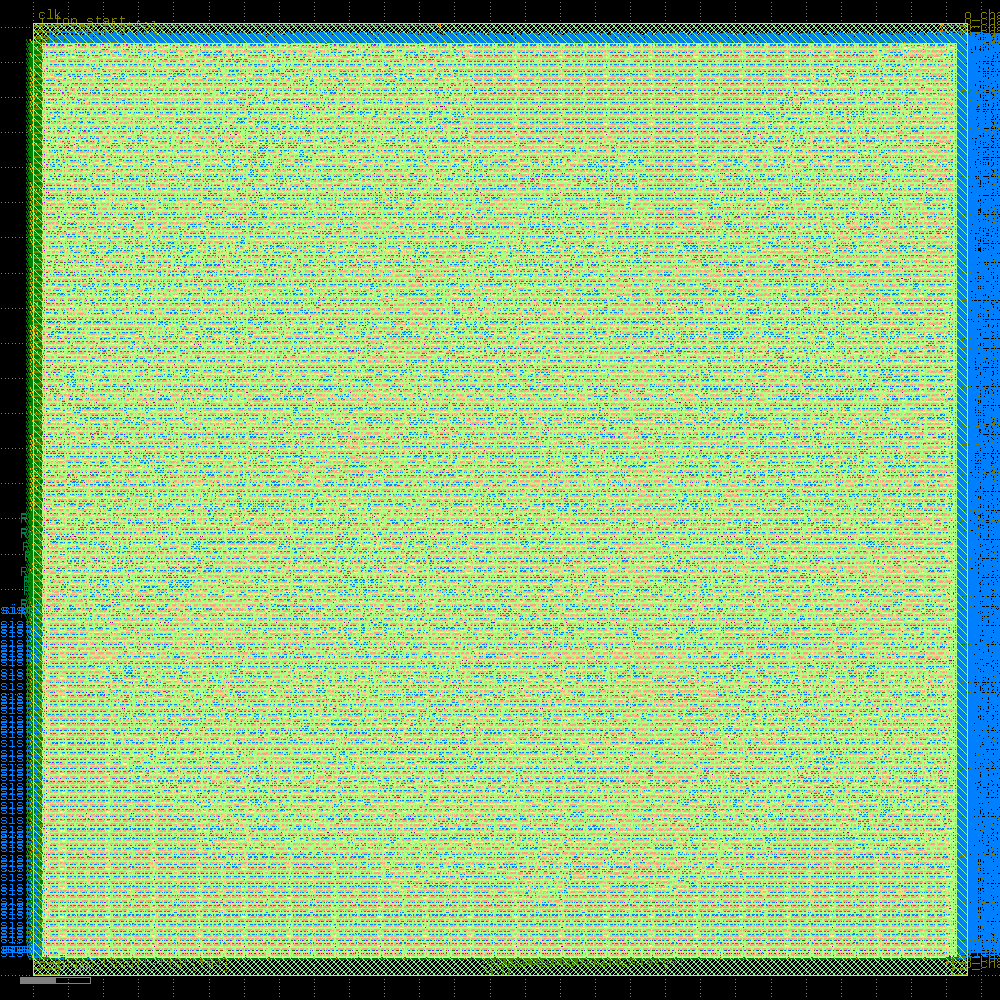

In [ ]:
display(gds)

### Design Rule Checks (DRC)

DRC determines that the final layout does not violate any of the rules set by
the foundry to ensure the design is actually manufacturable- for example,
not enough space between two wires, *too much* space between tap cells, and so
on.

A design not passing DRC will typically be rejected by the foundry, who
also run DRC on their side.

In [ ]:
DRC = Step.factory.get("Magic.DRC")

drc = DRC(state_in=gds.state_out)
drc.start()

─────────────────────────────────────────────── Design Rule Checks ────────────────────────────────────────────────

[21:42:44] VERBOSE  Running 'Magic.DRC'…                                                               ]8;id=96448;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=756218;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:42:44] VERBOSE  Logging subprocess to ]8;id=564539;file:///content/openlane_run/32-magic-drc/magic-drc.log\openlane_run/]8;;\]8;id=926968;file:///content/openlane_run/32-magic-drc/magic-drc.log\32]8;;\]8;id=564539;file:///content/openlane_run/32-magic-drc/magic-drc.log\-magic-drc/magic-drc.log]8;;\…                     ]8;id=214159;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=218712;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

Warning: Calma reading is not undoable!  I hope that's OK.

Library written using GDS-II Release 6.0

Library name: LIB

Reading "VIA_M1M2_PR_MR".

Reading "VIA_M3M4_PR".

Reading "VIA_M2M3_PR".

Reading "VIA_M1M2_PR".

Reading "VIA_L1M1_PR_MR".

Reading "VIA_via2_3_1600_480_1_5_320_320".

Reading "VIA_via3_4_1600_480_1_4_400_400".

Reading "VIA_via4_5_1600_480_1_4_400_400".

Reading "VIA_via5_6_1600_1600_1_1_1600_1600".

Reading "sky130_fd_sc_hd__inv_4".

Reading "sky130_fd_sc_hd__clkinv_4".

Reading "sky130_fd_sc_hd__inv_12".

Reading "sky130_fd_sc_hd__clkinv_8".

Reading "sky130_fd_sc_hd__bufinv_16".

Reading "sky130_fd_sc_hd__inv_8".

Reading "sky130_fd_sc_hd__clkbuf_4".

Reading "sky130_fd_sc_hd__inv_6".

Reading "sky130_fd_sc_hd__clkinv_2".

Reading "sky130_fd_sc_hd__clkinv_16".

Reading "sky130_fd_sc_hd__inv_16".

Reading "sky130_fd_sc_hd__clkbuf_8".

Reading "sky130_fd_sc_hd__clkbuf_16".

Reading "sky130_fd_sc_hd__buf_2".

Reading "sky130_fd_sc_hd__conb_1".

Reading "sky130_fd_sc_hd__dfrtp_2".

Reading "sky130_fd_sc_hd__a41oi_2".

Reading "sky130_fd_sc_hd__o311ai_2".

Reading "sky130_fd_sc_hd__o221a_2".

Reading "sky130_fd_sc_hd__o32ai_2".

Reading "sky130_fd_sc_hd__a311oi_2".

Reading "sky130_fd_sc_hd__o2111ai_2".

Reading "sky130_fd_sc_hd__a211oi_2".

Reading "sky130_fd_sc_hd__o2111a_2".

Reading "sky130_fd_sc_hd__and4b_2".

Reading "sky130_fd_sc_hd__o2bb2ai_2".

Reading "sky130_fd_sc_hd__a41o_2".

Reading "sky130_fd_sc_hd__a2111o_2".

Reading "sky130_fd_sc_hd__a221o_2".

Reading "sky130_fd_sc_hd__o221ai_2".

Reading "sky130_fd_sc_hd__and4bb_2".

Reading "sky130_fd_sc_hd__o41a_2".

Reading "sky130_fd_sc_hd__o22ai_2".

Reading "sky130_fd_sc_hd__nand3b_2".

Reading "sky130_fd_sc_hd__a2111oi_2".

Reading "sky130_fd_sc_hd__a22o_2".

Reading "sky130_fd_sc_hd__or4b_2".

Reading "sky130_fd_sc_hd__a32o_2".

Reading "sky130_fd_sc_hd__a31oi_2".

Reading "sky130_fd_sc_hd__o211ai_2".

Reading "sky130_fd_sc_hd__or4_2".

Reading "sky130_fd_sc_hd__o32a_2".

Reading "sky130_fd_sc_hd__o2bb2a_2".

Reading "sky130_fd_sc_hd__o311a_2".

Reading "sky130_fd_sc_hd__a2bb2o_2".

Reading "sky130_fd_sc_hd__a32oi_2".

Reading "sky130_fd_sc_hd__o211a_2".

Reading "sky130_fd_sc_hd__nor4_2".

Reading "sky130_fd_sc_hd__a31o_2".

Reading "sky130_fd_sc_hd__a22oi_2".

Reading "sky130_fd_sc_hd__and4_2".

Reading "sky130_fd_sc_hd__mux2_1".

Reading "sky130_fd_sc_hd__nor3b_2".

Reading "sky130_fd_sc_hd__a21boi_2".

Reading "sky130_fd_sc_hd__and3b_2".

Reading "sky130_fd_sc_hd__a211o_2".

Reading "sky130_fd_sc_hd__nand3_2".

Reading "sky130_fd_sc_hd__or3_2".

Reading "sky130_fd_sc_hd__nor3_2".

Reading "sky130_fd_sc_hd__o22a_2".

Reading "sky130_fd_sc_hd__or3b_2".

Reading "sky130_fd_sc_hd__nand4_2".

Reading "sky130_fd_sc_hd__a311o_2".

Reading "sky130_fd_sc_hd__and3_2".

Reading "sky130_fd_sc_hd__o21bai_2".

Reading "sky130_fd_sc_hd__o31ai_2".

Reading "sky130_fd_sc_hd__o21ai_2".

Reading "sky130_fd_sc_hd__o31a_2".

Reading "sky130_fd_sc_hd__nand2_2".

Reading "sky130_fd_sc_hd__o21a_2".

Reading "sky130_fd_sc_hd__and2_2".

Reading "sky130_fd_sc_hd__o21ba_2".

Reading "sky130_fd_sc_hd__a21o_2".

Reading "sky130_fd_sc_hd__or2_2".

Reading "sky130_fd_sc_hd__a21oi_2".

Reading "sky130_fd_sc_hd__nor2_2".

Reading "sky130_fd_sc_hd__inv_2".

Reading "sky130_fd_sc_hd__xor2_2".

Reading "sky130_fd_sc_hd__and2b_2".

Reading "sky130_fd_sc_hd__a21bo_2".

Reading "sky130_fd_sc_hd__xnor2_2".

Reading "sky130_fd_sc_hd__nand2b_2".

Reading "sky130_fd_sc_hd__tapvpwrvgnd_1".

Reading "sky130_fd_sc_hd__decap_6".

Reading "sky130_fd_sc_hd__fill_1".

Reading "sky130_fd_sc_hd__decap_4".

Reading "sky130_fd_sc_hd__decap_8".

Reading "sky130_fd_sc_hd__fill_2".

Reading "sky130_ef_sc_hd__decap_12".

Reading "sky130_fd_sc_hd__decap_3".

Reading "full_chain_stage4".

5000 uses

10000 uses

15000 uses

20000 uses

25000 uses

30000 uses

35000 uses

40000 uses

45000 uses

50000 uses

55000 uses

60000 uses

65000 uses

70000 uses

75000 uses

80000 uses

85000 uses

90000 uses

95000 uses

100000 uses

105000 uses

110000 uses

115000 uses

120000 uses

125000 uses

130000 uses

135000 uses

[INFO] Loading full_chain_stage4

DRC style is now "drc(full)"

Loading DRC CIF style.

No errors found.

[INFO] COUNT: 0

[INFO] Should be divided by 3 or 4

[INFO] DRC Checking DONE (/content/openlane_run/32-magic-drc/reports/drc_violations.magic.rpt)

[INFO] Saving mag view with DRC errors (/content/openlane_run/32-magic-drc/views/full_chain_stage4.drc.mag)

[INFO] Saved

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.lib')}, 'spice': None, 'mag': None, 'gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__instance__area__macros': 0, 'design__instance__utilization': Decimal('0.52727

### SPICE Extraction for Layout vs. Schematic Check

This step tries to reconstruct a SPICE netlist from the GDSII file, so it can
later be used for the **Layout vs. Schematic** (LVS) check.

In [ ]:
SpiceExtraction = Step.factory.get("Magic.SpiceExtraction")

spx = SpiceExtraction(state_in=drc.state_out)
spx.start()

───────────────────────────────────────────── SPICE Model Extraction ──────────────────────────────────────────────

[21:45:01] VERBOSE  Running 'Magic.SpiceExtraction'…                                                   ]8;id=29274;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=994969;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:45:01] VERBOSE  Logging subprocess to                                                              ]8;id=876998;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=277858;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\
                    ]8;id=123911;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\openlane_run/]8;;\]8;id=259;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\33]8;;\]8;id=123911;file:///content/openlane_run/33-magic-spiceextraction/magic-spiceextraction.log\-magic-spiceextraction/magic-spiceextraction.log]8;;\…                               

Magic 8.3 revision 483 - Compiled on Sun Jun  2 18:57:41 UTC 2024.

Starting magic under Tcl interpreter

Using the terminal as the console.

Using NULL graphics device.

Processing system .magicrc file

Sourcing design .magicrc for technology sky130A ...

2 Magic internal units = 1 Lambda

Input style sky130(): scaleFactor=2, multiplier=2

The following types are not handled by extraction and will be treated as non-electrical types:

ubm

Scaled tech values by 2 / 1 to match internal grid scaling

Loading sky130A Device Generator Menu ...

Loading "/content/openlane_ipynb/openlane/scripts/magic/wrapper.tcl" from command line.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/techlef/sky130_fd_sc_hd__nom.tlef.

This action cannot be undone.

LEF read, Line 78 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 79 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 112 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 114 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 115 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 121 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 122 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 123 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 156 (Message): Unknown keyword "MINENCLOSEDAREA" in LEF file; ignoring.

LEF read, Line 164 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 165 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 167 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 168 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 169 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 206 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 207 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 209 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 210 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 211 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 248 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 249 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read, Line 251 (Message): Unknown keyword "MAXIMUMDENSITY" in LEF file; ignoring.

LEF read, Line 252 (Message): Unknown keyword "DENSITYCHECKWINDOW" in LEF file; ignoring.

LEF read, Line 253 (Message): Unknown keyword "DENSITYCHECKSTEP" in LEF file; ignoring.

LEF read, Line 290 (Message): Unknown keyword "ANTENNAMODEL" in LEF file; ignoring.

LEF read, Line 291 (Message): Unknown keyword "ANTENNADIFFSIDEAREARATIO" in LEF file; ignoring.

LEF read: Processed 797 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_ef_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 278 lines.

> lef read /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef

Reading LEF data from file /root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/lef/sky130_fd_sc_hd.lef.

This action cannot be undone.

LEF read: Processed 56535 lines.

> def read /content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def -noblockage -labels

Reading DEF data from file /content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def.

This action cannot be undone.

Processed 4 vias total.

Processed 36023 subcell instances total.

Processed 327 pins total.

Processed 2 special nets total.

Processed 13670 nets total.

DEF read: Processed 242742 lines.

Moving label "_00210_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00284_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00304_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00309_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00337_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00637_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_00692_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_00814_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01380_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01385_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_01483_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01617_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01727_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01814_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01820_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01848_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_01886_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_01902_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_01954_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02004_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_02059_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02114_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_02247_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02301_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02392_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02532_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_02802_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_02869_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03058_" from metal3 to via3 in cell full_chain_stage4.

Moving label "_03078_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03093_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_03122_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_03174_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03207_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03224_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03225_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03277_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03321_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03386_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03404_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03421_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_03553_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_03581_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_03672_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_03845_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04004_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04039_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04050_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04090_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_04136_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_04223_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04246_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_04265_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_04469_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_05498_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_05603_" from metal1 to viali in cell full_chain_stage4.

Moving label "_05633_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_05653_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_05709_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_05785_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_06018_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06043_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06228_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06313_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06402_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06437_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06449_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06450_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_06716_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06737_" from metal3 to via2 in cell full_chain_stage4.

Moving label "_06835_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06868_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06884_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06916_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_06930_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_06947_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07161_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07207_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07240_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_07270_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07275_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_07379_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07415_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_07416_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_07465_" from metal1 to viali in cell full_chain_stage4.

Moving label "_07520_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08013_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08066_" from metal1 to viali in cell full_chain_stage4.

Moving label "_08223_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08494_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08620_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_08718_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08719_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08763_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_08771_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08816_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08866_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_08882_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08895_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08898_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08954_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_08987_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_08988_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09133_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_09145_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09242_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09271_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09407_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09428_" from metal1 to viali in cell full_chain_stage4.

Moving label "_09445_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09843_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_09859_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_09935_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_09942_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10077_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10088_" from metal1 to viali in cell full_chain_stage4.

Moving label "_10094_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10191_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10235_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_10252_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_10310_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_10316_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10453_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_10494_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10540_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10545_" from metal1 to viali in cell full_chain_stage4.

Moving label "_10550_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10600_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10741_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10772_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10855_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_10891_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_10918_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_10999_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_11037_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11135_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11178_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11262_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11331_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11385_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_11435_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_11520_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11557_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11722_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11756_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11759_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_11771_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_11912_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12096_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12117_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12154_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12286_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12291_" from metal1 to viali in cell full_chain_stage4.

Moving label "_12360_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_12366_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12376_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12439_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12444_" from metal2 to via1 in cell full_chain_stage4.

Moving label "_12481_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12519_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12580_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_12593_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12708_" from metal1 to via1 in cell full_chain_stage4.

Moving label "_12733_" from metal2 to via2 in cell full_chain_stage4.

Moving label "_12749_" from metal1 to via1 in cell full_chain_stage4.

Moving label "clk" from metal3 to via3 in cell full_chain_stage4.

Moving label "conv2_inst.conv2_inst.i_data_flat\[37\]" from metal1 to viali in cell full_chain_stage4.

Moving label "conv2_inst.conv2_inst.o_result_flat\[7\]" from metal1 to via1 in cell full_chain_stage4.

Moving label "conv3_inst.conv3_inst.o_result_flat\[12\]" from metal2 to via2 in cell full_chain_stage4.

Moving label "fc_relu_inst.o_fc_relu_result_flat\[17\]" from metal2 to via1 in cell full_chain_stage4.

Moving label "i_z_top_flat[1]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[117]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[179]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[189]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[190]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[191]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[193]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[194]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[197]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[198]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[199]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[1]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[200]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[203]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[204]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[205]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[207]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[208]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[20]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[210]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[214]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[215]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[218]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[225]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[226]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[229]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[232]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[233]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[234]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[236]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[237]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[239]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[240]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[248]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[250]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[251]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[254]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[255]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[32]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[33]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[34]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[35]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[36]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[37]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[3]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[4]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[52]" from metal3 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[58]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[62]" from metal1 to via1 in cell full_chain_stage4.

Moving label "o_chain_result_flat[66]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[6]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[7]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[85]" from metal1 to via1 in cell full_chain_stage4.

Moving label "o_chain_result_flat[91]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[93]" from metal1 to via1 in cell full_chain_stage4.

Moving label "o_chain_result_flat[97]" from metal2 to via2 in cell full_chain_stage4.

Moving label "o_chain_result_flat[98]" from metal2 to via2 in cell full_chain_stage4.

Moving label "relu1_inst.o_result_flat\[42\]" from metal1 to via1 in cell full_chain_stage4.

Moving label "relu2_inst.current_state" from metal1 to via1 in cell full_chain_stage4.

Moving label "relu2_inst.o_result_flat\[10\]" from metal1 to via1 in cell full_chain_stage4.

Moving label "relu2_inst.o_result_flat\[3\]" from metal1 to viali in cell full_chain_stage4.

Processing full_chain_stage4

Extracting sky130_fd_sc_hd__conb_1 into sky130_fd_sc_hd__conb_1.ext:

Extracting sky130_fd_sc_hd__decap_3 into sky130_fd_sc_hd__decap_3.ext:

Extracting sky130_fd_sc_hd__fill_2 into sky130_fd_sc_hd__fill_2.ext:

Extracting sky130_fd_sc_hd__decap_8 into sky130_fd_sc_hd__decap_8.ext:

Extracting sky130_ef_sc_hd__decap_12 into sky130_ef_sc_hd__decap_12.ext:

Extracting sky130_fd_sc_hd__tapvpwrvgnd_1 into sky130_fd_sc_hd__tapvpwrvgnd_1.ext:

Extracting sky130_fd_sc_hd__decap_6 into sky130_fd_sc_hd__decap_6.ext:

Extracting sky130_fd_sc_hd__fill_1 into sky130_fd_sc_hd__fill_1.ext:

Extracting sky130_fd_sc_hd__decap_4 into sky130_fd_sc_hd__decap_4.ext:

Extracting sky130_fd_sc_hd__dfrtp_2 into sky130_fd_sc_hd__dfrtp_2.ext:

Extracting sky130_fd_sc_hd__o21ba_2 into sky130_fd_sc_hd__o21ba_2.ext:

Extracting sky130_fd_sc_hd__nand2_2 into sky130_fd_sc_hd__nand2_2.ext:

Extracting sky130_fd_sc_hd__or2_2 into sky130_fd_sc_hd__or2_2.ext:

Extracting sky130_fd_sc_hd__xnor2_2 into sky130_fd_sc_hd__xnor2_2.ext:

Extracting sky130_fd_sc_hd__nand2b_2 into sky130_fd_sc_hd__nand2b_2.ext:

Extracting sky130_fd_sc_hd__o21ai_2 into sky130_fd_sc_hd__o21ai_2.ext:

Extracting sky130_fd_sc_hd__and4bb_2 into sky130_fd_sc_hd__and4bb_2.ext:

Extracting sky130_fd_sc_hd__nor2_2 into sky130_fd_sc_hd__nor2_2.ext:

Extracting sky130_fd_sc_hd__or3_2 into sky130_fd_sc_hd__or3_2.ext:

Extracting sky130_fd_sc_hd__o211a_2 into sky130_fd_sc_hd__o211a_2.ext:

Extracting sky130_fd_sc_hd__or3b_2 into sky130_fd_sc_hd__or3b_2.ext:

Extracting sky130_fd_sc_hd__nor3_2 into sky130_fd_sc_hd__nor3_2.ext:

Extracting sky130_fd_sc_hd__mux2_1 into sky130_fd_sc_hd__mux2_1.ext:

Extracting sky130_fd_sc_hd__xor2_2 into sky130_fd_sc_hd__xor2_2.ext:

Extracting sky130_fd_sc_hd__inv_2 into sky130_fd_sc_hd__inv_2.ext:

Extracting sky130_fd_sc_hd__a21o_2 into sky130_fd_sc_hd__a21o_2.ext:

Extracting sky130_fd_sc_hd__and2_2 into sky130_fd_sc_hd__and2_2.ext:

Extracting sky130_fd_sc_hd__o22a_2 into sky130_fd_sc_hd__o22a_2.ext:

Extracting sky130_fd_sc_hd__a22o_2 into sky130_fd_sc_hd__a22o_2.ext:

Extracting sky130_fd_sc_hd__inv_6 into sky130_fd_sc_hd__inv_6.ext:

Extracting sky130_fd_sc_hd__and2b_2 into sky130_fd_sc_hd__and2b_2.ext:

Extracting sky130_fd_sc_hd__o311ai_2 into sky130_fd_sc_hd__o311ai_2.ext:

Extracting sky130_fd_sc_hd__or4_2 into sky130_fd_sc_hd__or4_2.ext:

Extracting sky130_fd_sc_hd__o21a_2 into sky130_fd_sc_hd__o21a_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_8 into sky130_fd_sc_hd__clkbuf_8.ext:

Extracting sky130_fd_sc_hd__o31a_2 into sky130_fd_sc_hd__o31a_2.ext:

Extracting sky130_fd_sc_hd__a21oi_2 into sky130_fd_sc_hd__a21oi_2.ext:

Extracting sky130_fd_sc_hd__and3_2 into sky130_fd_sc_hd__and3_2.ext:

Extracting sky130_fd_sc_hd__or4b_2 into sky130_fd_sc_hd__or4b_2.ext:

Extracting sky130_fd_sc_hd__inv_8 into sky130_fd_sc_hd__inv_8.ext:

Extracting sky130_fd_sc_hd__nand3b_2 into sky130_fd_sc_hd__nand3b_2.ext:

Extracting sky130_fd_sc_hd__o311a_2 into sky130_fd_sc_hd__o311a_2.ext:

Extracting sky130_fd_sc_hd__buf_2 into sky130_fd_sc_hd__buf_2.ext:

Extracting sky130_fd_sc_hd__a21bo_2 into sky130_fd_sc_hd__a21bo_2.ext:

Extracting sky130_fd_sc_hd__o32a_2 into sky130_fd_sc_hd__o32a_2.ext:

Extracting sky130_fd_sc_hd__a31o_2 into sky130_fd_sc_hd__a31o_2.ext:

Extracting sky130_fd_sc_hd__o221a_2 into sky130_fd_sc_hd__o221a_2.ext:

Extracting sky130_fd_sc_hd__bufinv_16 into sky130_fd_sc_hd__bufinv_16.ext:

Extracting sky130_fd_sc_hd__and4_2 into sky130_fd_sc_hd__and4_2.ext:

Extracting sky130_fd_sc_hd__o22ai_2 into sky130_fd_sc_hd__o22ai_2.ext:

Extracting sky130_fd_sc_hd__o2bb2a_2 into sky130_fd_sc_hd__o2bb2a_2.ext:

Extracting sky130_fd_sc_hd__a2bb2o_2 into sky130_fd_sc_hd__a2bb2o_2.ext:

Extracting sky130_fd_sc_hd__nand3_2 into sky130_fd_sc_hd__nand3_2.ext:

Extracting sky130_fd_sc_hd__a221o_2 into sky130_fd_sc_hd__a221o_2.ext:

Extracting sky130_fd_sc_hd__a21boi_2 into sky130_fd_sc_hd__a21boi_2.ext:

Extracting sky130_fd_sc_hd__o21bai_2 into sky130_fd_sc_hd__o21bai_2.ext:

Extracting sky130_fd_sc_hd__a22oi_2 into sky130_fd_sc_hd__a22oi_2.ext:

Extracting sky130_fd_sc_hd__nand4_2 into sky130_fd_sc_hd__nand4_2.ext:

Extracting sky130_fd_sc_hd__a311o_2 into sky130_fd_sc_hd__a311o_2.ext:

Extracting sky130_fd_sc_hd__o211ai_2 into sky130_fd_sc_hd__o211ai_2.ext:

Extracting sky130_fd_sc_hd__and3b_2 into sky130_fd_sc_hd__and3b_2.ext:

Extracting sky130_fd_sc_hd__a211o_2 into sky130_fd_sc_hd__a211o_2.ext:

Extracting sky130_fd_sc_hd__clkinv_8 into sky130_fd_sc_hd__clkinv_8.ext:

Extracting sky130_fd_sc_hd__a31oi_2 into sky130_fd_sc_hd__a31oi_2.ext:

Extracting sky130_fd_sc_hd__o2111a_2 into sky130_fd_sc_hd__o2111a_2.ext:

Extracting sky130_fd_sc_hd__clkinv_4 into sky130_fd_sc_hd__clkinv_4.ext:

Extracting sky130_fd_sc_hd__a32oi_2 into sky130_fd_sc_hd__a32oi_2.ext:

Extracting sky130_fd_sc_hd__a41oi_2 into sky130_fd_sc_hd__a41oi_2.ext:

Extracting sky130_fd_sc_hd__inv_12 into sky130_fd_sc_hd__inv_12.ext:

Extracting sky130_fd_sc_hd__o31ai_2 into sky130_fd_sc_hd__o31ai_2.ext:

Extracting sky130_fd_sc_hd__and4b_2 into sky130_fd_sc_hd__and4b_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_16 into sky130_fd_sc_hd__clkbuf_16.ext:

Extracting sky130_fd_sc_hd__a32o_2 into sky130_fd_sc_hd__a32o_2.ext:

Extracting sky130_fd_sc_hd__nor4_2 into sky130_fd_sc_hd__nor4_2.ext:

Extracting sky130_fd_sc_hd__o221ai_2 into sky130_fd_sc_hd__o221ai_2.ext:

Extracting sky130_fd_sc_hd__clkbuf_4 into sky130_fd_sc_hd__clkbuf_4.ext:

Extracting sky130_fd_sc_hd__clkinv_2 into sky130_fd_sc_hd__clkinv_2.ext:

Extracting sky130_fd_sc_hd__o2bb2ai_2 into sky130_fd_sc_hd__o2bb2ai_2.ext:

Extracting sky130_fd_sc_hd__clkinv_16 into sky130_fd_sc_hd__clkinv_16.ext:

Extracting sky130_fd_sc_hd__nor3b_2 into sky130_fd_sc_hd__nor3b_2.ext:

Extracting sky130_fd_sc_hd__inv_16 into sky130_fd_sc_hd__inv_16.ext:

Extracting sky130_fd_sc_hd__a211oi_2 into sky130_fd_sc_hd__a211oi_2.ext:

Extracting sky130_fd_sc_hd__inv_4 into sky130_fd_sc_hd__inv_4.ext:

Extracting sky130_fd_sc_hd__a2111oi_2 into sky130_fd_sc_hd__a2111oi_2.ext:

Extracting sky130_fd_sc_hd__o41a_2 into sky130_fd_sc_hd__o41a_2.ext:

Extracting sky130_fd_sc_hd__a41o_2 into sky130_fd_sc_hd__a41o_2.ext:

Extracting sky130_fd_sc_hd__o32ai_2 into sky130_fd_sc_hd__o32ai_2.ext:

Extracting sky130_fd_sc_hd__a2111o_2 into sky130_fd_sc_hd__a2111o_2.ext:

Extracting sky130_fd_sc_hd__a311oi_2 into sky130_fd_sc_hd__a311oi_2.ext:

Extracting sky130_fd_sc_hd__o2111ai_2 into sky130_fd_sc_hd__o2111ai_2.ext:

Extracting full_chain_stage4 into full_chain_stage4.ext:

exttospice finished.

Using technology "sky130A", version 1.0.466-0-gbdc9412

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/33-magic-spiceextraction/full_chain_stage4.spice'), 'mag': None, 'gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__ins

### Layout vs. Schematic (LVS)

A comparison between the final Verilog netlist (from PnR) and the final
SPICE netlist (extracted.)

This check effectively compares the physically implemented circuit to the final
Verilog netlist output by OpenROAD.

The idea is, if there are any disconnects, shorts or other mismatches in the
physical implementation that do not exist in the logical view of the design,
they would be caught at this step.

Common issues that result in LVS violations include:
* Lack of fill cells or tap cells in the design
* Two unrelated signals to be shorted, or a wire to be disconnected (most
  commonly seen with misconfigured PDN)

Chips with LVS errors are typically dead on arrival.

In [ ]:
LVS = Step.factory.get("Netgen.LVS")

lvs = LVS(state_in=spx.state_out)
lvs.start()

─────────────────────────────────────────────────── Netgen LVS ────────────────────────────────────────────────────

[21:45:27] VERBOSE  Running 'Netgen.LVS'…                                                              ]8;id=367733;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=129655;file:///content/openlane_ipynb/openlane/steps/step.py#1088\1088]8;;\

[21:45:27] VERBOSE  Logging subprocess to ]8;id=550279;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\openlane_run/]8;;\]8;id=864236;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\34]8;;\]8;id=550279;file:///content/openlane_run/34-netgen-lvs/netgen-lvs.log\-netgen-lvs/netgen-lvs.log]8;;\…                   ]8;id=998101;file:///content/openlane_ipynb/openlane/steps/step.py\step.py]8;;\:]8;id=801666;file:///content/openlane_ipynb/openlane/steps/step.py#1268\1268]8;;\

Netgen 1.5.270 compiled on Sun Jun  2 19:00:27 UTC 2024

Warning: netgen command 'format' use fully-qualified name '::netgen::format'

Warning: netgen command 'global' use fully-qualified name '::netgen::global'

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Reading SPICE netlist file                                                                                         
'/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__decap_12.spice'...

Call to undefined subcircuit sky130_fd_pr__pfet_01v8_hvt

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_pr__nfet_01v8

Creating placeholder cell definition.

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_12.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_4.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_ef_sc_hd__fill_8.spice'...

Reading SPICE netlist file '/root/.volare/sky130A/libs.ref/sky130_fd_sc_hd/spice/sky130_fd_sc_hd.spice'...

Call to undefined subcircuit sky130_fd_sc_hd__nand2_2

Creating placeholder cell definition.

Call to undefined subcircuit sky130_fd_sc_hd__nor2_2

Creating placeholder cell definition.

Warning:  A case-insensitive file has been read and so the      verilog file must be treated case-insensitive to   
match.

Note:  Implicit pin HI in instance _26087_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26088_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26089_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26090_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26091_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26092_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26093_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26094_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26095_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26096_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26097_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26098_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26099_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26100_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26101_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26102_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26103_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26104_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26105_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26106_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26107_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26108_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26109_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26110_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26111_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26112_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26113_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26114_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26115_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26116_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26117_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26118_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26119_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26120_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26121_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26122_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26123_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26124_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26125_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26126_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26127_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26128_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26129_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26130_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26131_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26132_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26133_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26134_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26135_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26136_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26137_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26138_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26139_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26140_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26141_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26142_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26143_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26144_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26145_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26146_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26147_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26148_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26149_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26150_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26151_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26152_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26153_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26154_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26155_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26156_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26157_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26158_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26159_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26160_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26161_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26162_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26163_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26164_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26165_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26166_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26167_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26168_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26169_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26170_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26171_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26172_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26173_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26174_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26175_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26176_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26177_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26178_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26179_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26180_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26181_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26182_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26183_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26184_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26185_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26186_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26187_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26188_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26189_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26190_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26191_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26192_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26193_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26194_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26195_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26196_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26197_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26198_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26199_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26200_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26201_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26202_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26203_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26204_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26205_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26206_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26207_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26208_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26209_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26210_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26211_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26212_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26213_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin HI in instance _26214_ of sky130_fd_sc_hd__conb_1 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload0 of sky130_fd_sc_hd__inv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload1 of sky130_fd_sc_hd__clkinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload2 of sky130_fd_sc_hd__inv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload3 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload4 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload5 of sky130_fd_sc_hd__inv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload6 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload7 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload8 of sky130_fd_sc_hd__clkinv_2 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload9 of sky130_fd_sc_hd__clkinv_2 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload10 of sky130_fd_sc_hd__clkinv_2 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload11 of sky130_fd_sc_hd__clkbuf_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload12 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload13 of sky130_fd_sc_hd__clkbuf_8 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload14 of sky130_fd_sc_hd__clkbuf_4 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload15 of sky130_fd_sc_hd__clkbuf_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload16 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload17 of sky130_fd_sc_hd__bufinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload18 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload19 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload20 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload21 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload22 of sky130_fd_sc_hd__bufinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload23 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload24 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload25 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload26 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload27 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload28 of sky130_fd_sc_hd__clkinv_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload29 of sky130_fd_sc_hd__inv_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload30 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload31 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload32 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload33 of sky130_fd_sc_hd__bufinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload34 of sky130_fd_sc_hd__clkinv_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload35 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload36 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload37 of sky130_fd_sc_hd__bufinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload38 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload39 of sky130_fd_sc_hd__bufinv_16 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload40 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload41 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload42 of sky130_fd_sc_hd__clkbuf_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload43 of sky130_fd_sc_hd__clkinv_2 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload44 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload45 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload46 of sky130_fd_sc_hd__clkinv_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload47 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload48 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload49 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload50 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload51 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload52 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload53 of sky130_fd_sc_hd__clkinv_2 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload54 of sky130_fd_sc_hd__clkbuf_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload55 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload56 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload57 of sky130_fd_sc_hd__inv_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload58 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload59 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload60 of sky130_fd_sc_hd__clkinv_4 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload61 of sky130_fd_sc_hd__clkbuf_8 in cell full_chain_stage4

Note:  Implicit pin X in instance clkload62 of sky130_fd_sc_hd__clkbuf_4 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload63 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload64 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload65 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload66 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload67 of sky130_fd_sc_hd__inv_8 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload68 of sky130_fd_sc_hd__inv_12 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload69 of sky130_fd_sc_hd__inv_6 in cell full_chain_stage4

Note:  Implicit pin Y in instance clkload70 of sky130_fd_sc_hd__clkinv_8 in cell full_chain_stage4

Treating empty subcircuits as black-box cells

Generating JSON file result

Reading setup file /content/openlane_ipynb/openlane/scripts/netgen/setup.tcl

Model sky130_fd_pr__res_generic_po pin end_a == end_b

No property mult found for device sky130_fd_pr__res_generic_po

Model sky130_fd_pr__nfet_01v8 pin 1 == 3

No property mult found for device sky130_fd_pr__nfet_01v8

No property sa found for device sky130_fd_pr__nfet_01v8

No property sb found for device sky130_fd_pr__nfet_01v8

No property sd found for device sky130_fd_pr__nfet_01v8

No property nf found for device sky130_fd_pr__nfet_01v8

No property nrd found for device sky130_fd_pr__nfet_01v8

No property nrs found for device sky130_fd_pr__nfet_01v8

No property area found for device sky130_fd_pr__nfet_01v8

No property perim found for device sky130_fd_pr__nfet_01v8

No property topography found for device sky130_fd_pr__nfet_01v8

Model sky130_fd_pr__pfet_01v8_hvt pin 1 == 3

No property mult found for device sky130_fd_pr__pfet_01v8_hvt

No property sa found for device sky130_fd_pr__pfet_01v8_hvt

No property sb found for device sky130_fd_pr__pfet_01v8_hvt

No property sd found for device sky130_fd_pr__pfet_01v8_hvt

No property nf found for device sky130_fd_pr__pfet_01v8_hvt

No property nrd found for device sky130_fd_pr__pfet_01v8_hvt

No property nrs found for device sky130_fd_pr__pfet_01v8_hvt

No property area found for device sky130_fd_pr__pfet_01v8_hvt

No property perim found for device sky130_fd_pr__pfet_01v8_hvt

No property topography found for device sky130_fd_pr__pfet_01v8_hvt

No property value found for device sky130_fd_pr__diode_pw2nd_05v5

No property mult found for device sky130_fd_pr__diode_pw2nd_05v5

No property perim found for device sky130_fd_pr__diode_pw2nd_05v5

Comparison output logged to file /content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt

Logging to file "/content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt" enabled

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_1'

Circuit sky130_fd_sc_hd__fill_1 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or2_2'

Circuit sky130_fd_sc_hd__or2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__or2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2_2'

Circuit sky130_fd_sc_hd__nand2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nand2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_ef_sc_hd__decap_12'

Circuit sky130_ef_sc_hd__decap_12 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_ef_sc_hd__decap_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_4'

Circuit sky130_fd_sc_hd__decap_4 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__mux2_1'

Circuit sky130_fd_sc_hd__mux2_1 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__mux2_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__fill_2'

Circuit sky130_fd_sc_hd__fill_2 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Circuit sky130_fd_sc_hd__fill_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__tapvpwrvgnd_1'

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains 0 device instances.

Circuit contains 0 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__tapvpwrvgnd_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21a_2'

Circuit sky130_fd_sc_hd__o21a_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_8'

Circuit sky130_fd_sc_hd__decap_8 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xnor2_2'

Circuit sky130_fd_sc_hd__xnor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xnor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32a_2'

Circuit sky130_fd_sc_hd__o32a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o32a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21oi_2'

Circuit sky130_fd_sc_hd__a21oi_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor2_2'

Circuit sky130_fd_sc_hd__nor2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__nor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_6'

Circuit sky130_fd_sc_hd__decap_6 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 0 device instances.

Circuit contains 0 nets, and 4 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__decap_3'

Circuit sky130_fd_sc_hd__decap_3 contains 2 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   1

Class: sky130_fd_pr__pfet_01v8_hvt instances:   1

Circuit contains 4 nets.

Circuit sky130_fd_sc_hd__decap_3 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ba_2'

Circuit sky130_fd_sc_hd__o21ba_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o21ba_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3_2'

Circuit sky130_fd_sc_hd__or3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__or3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__dfrtp_2'

Circuit sky130_fd_sc_hd__dfrtp_2 contains 30 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  15

Class: sky130_fd_pr__pfet_01v8_hvt instances:  15

Circuit contains 21 nets.

Circuit sky130_fd_sc_hd__dfrtp_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21o_2'

Circuit sky130_fd_sc_hd__a21o_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__a21o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__xor2_2'

Circuit sky130_fd_sc_hd__xor2_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__xor2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2b_2'

Circuit sky130_fd_sc_hd__and2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__and2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3_2'

Circuit sky130_fd_sc_hd__and3_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__and3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31o_2'

Circuit sky130_fd_sc_hd__a31o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a31o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and2_2'

Circuit sky130_fd_sc_hd__and2_2 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__and2_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21ai_2'

Circuit sky130_fd_sc_hd__o21ai_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__o21ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_2'

Circuit sky130_fd_sc_hd__inv_2 contains 4 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   2

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2a_2'

Circuit sky130_fd_sc_hd__o2bb2a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2bb2a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21boi_2'

Circuit sky130_fd_sc_hd__a21boi_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21boi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 0 device instances.

Circuit contains 0 nets, and 7 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand2b_2'

Circuit sky130_fd_sc_hd__nand2b_2 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 9 nets.

Circuit sky130_fd_sc_hd__nand2b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__buf_2'

Circuit sky130_fd_sc_hd__buf_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__buf_2'

Circuit sky130_fd_sc_hd__buf_2 contains 6 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   3

Class: sky130_fd_pr__pfet_01v8_hvt instances:   3

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__buf_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o21bai_2'

Circuit sky130_fd_sc_hd__o21bai_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__o21bai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__conb_1'

Circuit sky130_fd_sc_hd__conb_1 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__conb_1'

Circuit sky130_fd_sc_hd__conb_1 contains 2 device instances.

Class: sky130_fd_pr__res_generic_po instances:   2

Circuit contains 4 nets, and 2 disconnected pins.

Circuit sky130_fd_sc_hd__conb_1 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2bb2o_2'

Circuit sky130_fd_sc_hd__a2bb2o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a2bb2o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22a_2'

Circuit sky130_fd_sc_hd__o22a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o22a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3_2'

Circuit sky130_fd_sc_hd__nand3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nand3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22o_2'

Circuit sky130_fd_sc_hd__a22o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a22o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and3b_2'

Circuit sky130_fd_sc_hd__and3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__and3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211o_2'

Circuit sky130_fd_sc_hd__a211o_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__a211o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4b_2'

Circuit sky130_fd_sc_hd__or4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__or4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3_2'

Circuit sky130_fd_sc_hd__nor3_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 10 nets.

Circuit sky130_fd_sc_hd__nor3_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand3b_2'

Circuit sky130_fd_sc_hd__nand3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nand3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a221o_2'

Circuit sky130_fd_sc_hd__a221o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a221o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31a_2'

Circuit sky130_fd_sc_hd__o31a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o31a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a31oi_2'

Circuit sky130_fd_sc_hd__a31oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a31oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a21bo_2'

Circuit sky130_fd_sc_hd__a21bo_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a21bo_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a211oi_2'

Circuit sky130_fd_sc_hd__a211oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a211oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_16'

Circuit sky130_fd_sc_hd__clkbuf_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  20

Class: sky130_fd_pr__pfet_01v8_hvt instances:  20

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32o_2'

Circuit sky130_fd_sc_hd__a32o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a32o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_8'

Circuit sky130_fd_sc_hd__clkbuf_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or3b_2'

Circuit sky130_fd_sc_hd__or3b_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__or3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4b_2'

Circuit sky130_fd_sc_hd__and4b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__and4b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nand4_2'

Circuit sky130_fd_sc_hd__nand4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nand4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221a_2'

Circuit sky130_fd_sc_hd__o221a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o221a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211a_2'

Circuit sky130_fd_sc_hd__o211a_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o211a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_8'

Circuit sky130_fd_sc_hd__clkinv_8 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_4'

Circuit sky130_fd_sc_hd__clkinv_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o22ai_2'

Circuit sky130_fd_sc_hd__o22ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o22ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor4_2'

Circuit sky130_fd_sc_hd__nor4_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__nor4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_12'

Circuit sky130_fd_sc_hd__inv_12 contains 24 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  12

Class: sky130_fd_pr__pfet_01v8_hvt instances:  12

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_12 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_16'

Circuit sky130_fd_sc_hd__inv_16 contains 32 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  16

Class: sky130_fd_pr__pfet_01v8_hvt instances:  16

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a22oi_2'

Circuit sky130_fd_sc_hd__a22oi_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__a22oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4_2'

Circuit sky130_fd_sc_hd__and4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__and4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_8'

Circuit sky130_fd_sc_hd__inv_8 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_8 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkbuf_4'

Circuit sky130_fd_sc_hd__clkbuf_4 contains 10 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   5

Class: sky130_fd_pr__pfet_01v8_hvt instances:   5

Circuit contains 7 nets.

Circuit sky130_fd_sc_hd__clkbuf_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_16'

Circuit sky130_fd_sc_hd__clkinv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_16'

Circuit sky130_fd_sc_hd__clkinv_16 contains 40 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  16

Class: sky130_fd_pr__pfet_01v8_hvt instances:  24

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311o_2'

Circuit sky130_fd_sc_hd__a311o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a311o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_6'

Circuit sky130_fd_sc_hd__inv_6 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_6 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__clkinv_2'

Circuit sky130_fd_sc_hd__clkinv_2 contains 5 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   2

Class: sky130_fd_pr__pfet_01v8_hvt instances:   3

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__clkinv_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o31ai_2'

Circuit sky130_fd_sc_hd__o31ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o31ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o221ai_2'

Circuit sky130_fd_sc_hd__o221ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o221ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a32oi_2'

Circuit sky130_fd_sc_hd__a32oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a32oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__bufinv_16'

Circuit sky130_fd_sc_hd__bufinv_16 contains 50 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  25

Class: sky130_fd_pr__pfet_01v8_hvt instances:  25

Circuit contains 8 nets.

Circuit sky130_fd_sc_hd__bufinv_16 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o211ai_2'

Circuit sky130_fd_sc_hd__o211ai_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 12 nets.

Circuit sky130_fd_sc_hd__o211ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111ai_2'

Circuit sky130_fd_sc_hd__o2111ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o2111ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2111a_2'

Circuit sky130_fd_sc_hd__o2111a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o2111a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__and4bb_2'

Circuit sky130_fd_sc_hd__and4bb_2 contains 16 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   8

Class: sky130_fd_pr__pfet_01v8_hvt instances:   8

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__and4bb_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 0 device instances.

Circuit contains 0 nets, and 6 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__inv_4'

Circuit sky130_fd_sc_hd__inv_4 contains 8 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   4

Class: sky130_fd_pr__pfet_01v8_hvt instances:   4

Circuit contains 6 nets.

Circuit sky130_fd_sc_hd__inv_4 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111o_2'

Circuit sky130_fd_sc_hd__a2111o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a2111o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 0 device instances.

Circuit contains 0 nets, and 8 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__nor3b_2'

Circuit sky130_fd_sc_hd__nor3b_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 11 nets.

Circuit sky130_fd_sc_hd__nor3b_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__or4_2'

Circuit sky130_fd_sc_hd__or4_2 contains 12 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   6

Class: sky130_fd_pr__pfet_01v8_hvt instances:   6

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__or4_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41o_2'

Circuit sky130_fd_sc_hd__a41o_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__a41o_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a41oi_2'

Circuit sky130_fd_sc_hd__a41oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a41oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311a_2'

Circuit sky130_fd_sc_hd__o311a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o311a_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o32ai_2'

Circuit sky130_fd_sc_hd__o32ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o32ai_2'

Circuit sky130_fd_sc_hd__o32ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o32ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o2bb2ai_2'

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains 0 device instances.

Circuit contains 0 nets, and 9 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o2bb2ai_2'

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 13 nets.

Circuit sky130_fd_sc_hd__o2bb2ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o311ai_2'

Circuit sky130_fd_sc_hd__o311ai_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__o311ai_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a2111oi_2'

Circuit sky130_fd_sc_hd__a2111oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 16 nets.

Circuit sky130_fd_sc_hd__a2111oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__a311oi_2'

Circuit sky130_fd_sc_hd__a311oi_2 contains 20 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:  10

Class: sky130_fd_pr__pfet_01v8_hvt instances:  10

Circuit contains 14 nets.

Circuit sky130_fd_sc_hd__a311oi_2 contains no devices.

Contents of circuit 1:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 0 device instances.

Circuit contains 0 nets, and 10 disconnected pins.

Contents of circuit 2:  Circuit: 'sky130_fd_sc_hd__o41a_2'

Circuit sky130_fd_sc_hd__o41a_2 contains 14 device instances.

Class: sky130_fd_pr__nfet_01v8 instances:   7

Class: sky130_fd_pr__pfet_01v8_hvt instances:   7

Circuit contains 15 nets.

Circuit sky130_fd_sc_hd__o41a_2 contains no devices.

Contents of circuit 1:  Circuit: 'full_chain_stage4'

Circuit full_chain_stage4 contains 36023 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   5

Class: sky130_fd_sc_hd__o2111ai_2 instances:   1

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  58

Class: sky130_fd_sc_hd__a21o_2 instances: 534

Class: sky130_fd_sc_hd__o32ai_2 instances:   1

Class: sky130_fd_sc_hd__clkbuf_16 instances:   9

Class: sky130_fd_sc_hd__a32oi_2 instances:   7

Class: sky130_fd_sc_hd__o31ai_2 instances:  10

Class: sky130_fd_sc_hd__or4_2 instances:   8

Class: sky130_fd_sc_hd__a31oi_2 instances:  31

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__buf_2 instances:  64

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  23

Class: sky130_fd_sc_hd__and3b_2 instances:  44

Class: sky130_fd_sc_hd__xor2_2 instances: 853

Class: sky130_fd_sc_hd__o221ai_2 instances:   3

Class: sky130_ef_sc_hd__decap_12 instances: 4471

Class: sky130_fd_sc_hd__dfrtp_2 instances: 559

Class: sky130_fd_sc_hd__and4_2 instances:  21

Class: sky130_fd_sc_hd__inv_2 instances: 304

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:   8

Class: sky130_fd_sc_hd__inv_8 instances:  15

Class: sky130_fd_sc_hd__clkbuf_4 instances:   4

Class: sky130_fd_sc_hd__clkbuf_8 instances:  77

Class: sky130_fd_sc_hd__or3_2 instances: 207

Class: sky130_fd_sc_hd__nand3_2 instances: 153

Class: sky130_fd_sc_hd__o21ba_2 instances: 172

Class: sky130_fd_sc_hd__conb_1 instances: 128

Class: sky130_fd_sc_hd__and2b_2 instances: 420

Class: sky130_fd_sc_hd__a21boi_2 instances:  46

Class: sky130_fd_sc_hd__a21bo_2 instances: 102

Class: sky130_fd_sc_hd__clkinv_2 instances:   5

Class: sky130_fd_sc_hd__clkinv_4 instances:   4

Class: sky130_fd_sc_hd__clkinv_8 instances:  11

Class: sky130_fd_sc_hd__and3_2 instances: 285

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 2088

Class: sky130_fd_sc_hd__decap_4 instances: 2102

Class: sky130_fd_sc_hd__decap_6 instances: 1924

Class: sky130_fd_sc_hd__decap_8 instances: 1758

Class: sky130_fd_sc_hd__or2_2 instances: 1147

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 1527

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:  16

Class: sky130_fd_sc_hd__mux2_1 instances: 279

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   1

Class: sky130_fd_sc_hd__a211oi_2 instances:   6

Class: sky130_fd_sc_hd__and2_2 instances: 941

Class: sky130_fd_sc_hd__or4b_2 instances:  11

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   9

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:  35

Class: sky130_fd_sc_hd__o22a_2 instances: 176

Class: sky130_fd_sc_hd__xnor2_2 instances: 1672

Class: sky130_fd_sc_hd__nor3b_2 instances:   4

Class: sky130_fd_sc_hd__o221a_2 instances:   2

Class: sky130_fd_sc_hd__o21bai_2 instances:  36

Class: sky130_fd_sc_hd__o211a_2 instances:  34

Class: sky130_fd_sc_hd__nand2b_2 instances: 288

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   8

Class: sky130_fd_sc_hd__a211o_2 instances:  28

Class: sky130_fd_sc_hd__o2111a_2 instances:   5

Class: sky130_fd_sc_hd__or3b_2 instances:  52

Class: sky130_fd_sc_hd__nor3_2 instances: 166

Class: sky130_fd_sc_hd__a32o_2 instances:   9

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 175

Class: sky130_fd_sc_hd__o31a_2 instances:  34

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  46

Class: sky130_fd_sc_hd__o21a_2 instances: 326

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:   3

Class: sky130_fd_sc_hd__o22ai_2 instances:   6

Class: sky130_fd_sc_hd__a22oi_2 instances:  10

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__o21ai_2 instances: 336

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 3860

Class: sky130_fd_sc_hd__a21oi_2 instances: 469

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances: 4105

Class: sky130_fd_sc_hd__fill_2 instances: 2041

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 1592

Circuit contains 13871 nets.

Contents of circuit 2:  Circuit: 'full_chain_stage4'

Circuit full_chain_stage4 contains 36023 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   5

Class: sky130_fd_sc_hd__o2111ai_2 instances:   1

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  58

Class: sky130_fd_sc_hd__a21o_2 instances: 534

Class: sky130_fd_sc_hd__o32ai_2 instances:   1

Class: sky130_fd_sc_hd__clkbuf_16 instances:   9

Class: sky130_fd_sc_hd__a32oi_2 instances:   7

Class: sky130_fd_sc_hd__o31ai_2 instances:  10

Class: sky130_fd_sc_hd__or4_2 instances:   8

Class: sky130_fd_sc_hd__a31oi_2 instances:  31

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__buf_2 instances:  64

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  23

Class: sky130_fd_sc_hd__and3b_2 instances:  44

Class: sky130_fd_sc_hd__xor2_2 instances: 853

Class: sky130_fd_sc_hd__o221ai_2 instances:   3

Class: sky130_ef_sc_hd__decap_12 instances: 4471

Class: sky130_fd_sc_hd__dfrtp_2 instances: 559

Class: sky130_fd_sc_hd__and4_2 instances:  21

Class: sky130_fd_sc_hd__inv_2 instances: 304

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:   8

Class: sky130_fd_sc_hd__inv_8 instances:  15

Class: sky130_fd_sc_hd__clkbuf_4 instances:   4

Class: sky130_fd_sc_hd__clkbuf_8 instances:  77

Class: sky130_fd_sc_hd__or3_2 instances: 207

Class: sky130_fd_sc_hd__nand3_2 instances: 153

Class: sky130_fd_sc_hd__o21ba_2 instances: 172

Class: sky130_fd_sc_hd__conb_1 instances: 128

Class: sky130_fd_sc_hd__and2b_2 instances: 420

Class: sky130_fd_sc_hd__a21boi_2 instances:  46

Class: sky130_fd_sc_hd__a21bo_2 instances: 102

Class: sky130_fd_sc_hd__clkinv_2 instances:   5

Class: sky130_fd_sc_hd__clkinv_4 instances:   4

Class: sky130_fd_sc_hd__clkinv_8 instances:  11

Class: sky130_fd_sc_hd__and3_2 instances: 285

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances: 2088

Class: sky130_fd_sc_hd__decap_4 instances: 2102

Class: sky130_fd_sc_hd__decap_6 instances: 1924

Class: sky130_fd_sc_hd__decap_8 instances: 1758

Class: sky130_fd_sc_hd__or2_2 instances: 1147

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 1527

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:  16

Class: sky130_fd_sc_hd__mux2_1 instances: 279

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   1

Class: sky130_fd_sc_hd__and2_2 instances: 941

Class: sky130_fd_sc_hd__a211oi_2 instances:   6

Class: sky130_fd_sc_hd__or4b_2 instances:  11

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   9

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:  35

Class: sky130_fd_sc_hd__o22a_2 instances: 176

Class: sky130_fd_sc_hd__xnor2_2 instances: 1672

Class: sky130_fd_sc_hd__nor3b_2 instances:   4

Class: sky130_fd_sc_hd__o221a_2 instances:   2

Class: sky130_fd_sc_hd__o21bai_2 instances:  36

Class: sky130_fd_sc_hd__o211a_2 instances:  34

Class: sky130_fd_sc_hd__nand2b_2 instances: 288

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   8

Class: sky130_fd_sc_hd__a211o_2 instances:  28

Class: sky130_fd_sc_hd__o2111a_2 instances:   5

Class: sky130_fd_sc_hd__or3b_2 instances:  52

Class: sky130_fd_sc_hd__nor3_2 instances: 166

Class: sky130_fd_sc_hd__a32o_2 instances:   9

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 175

Class: sky130_fd_sc_hd__o31a_2 instances:  34

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  46

Class: sky130_fd_sc_hd__o21a_2 instances: 326

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:   3

Class: sky130_fd_sc_hd__o22ai_2 instances:   6

Class: sky130_fd_sc_hd__a22oi_2 instances:  10

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances: 3860

Class: sky130_fd_sc_hd__o21ai_2 instances: 336

Class: sky130_fd_sc_hd__a21oi_2 instances: 469

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances: 4105

Class: sky130_fd_sc_hd__fill_2 instances: 2041

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 1592

Circuit contains 13871 nets.

Circuit was modified by parallel/series device merging.

New circuit summary:

Contents of circuit 1:  Circuit: 'full_chain_stage4'

Circuit full_chain_stage4 contains 13682 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   5

Class: sky130_fd_sc_hd__o2111ai_2 instances:   1

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  58

Class: sky130_fd_sc_hd__a21o_2 instances: 534

Class: sky130_fd_sc_hd__o32ai_2 instances:   1

Class: sky130_fd_sc_hd__clkbuf_16 instances:   9

Class: sky130_fd_sc_hd__a32oi_2 instances:   7

Class: sky130_fd_sc_hd__o31ai_2 instances:  10

Class: sky130_fd_sc_hd__or4_2 instances:   8

Class: sky130_fd_sc_hd__a31oi_2 instances:  31

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__buf_2 instances:  64

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  23

Class: sky130_fd_sc_hd__and3b_2 instances:  44

Class: sky130_fd_sc_hd__xor2_2 instances: 853

Class: sky130_fd_sc_hd__o221ai_2 instances:   3

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances: 559

Class: sky130_fd_sc_hd__and4_2 instances:  21

Class: sky130_fd_sc_hd__inv_2 instances: 304

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:   8

Class: sky130_fd_sc_hd__inv_8 instances:  15

Class: sky130_fd_sc_hd__clkbuf_4 instances:   4

Class: sky130_fd_sc_hd__clkbuf_8 instances:  77

Class: sky130_fd_sc_hd__or3_2 instances: 207

Class: sky130_fd_sc_hd__nand3_2 instances: 153

Class: sky130_fd_sc_hd__o21ba_2 instances: 172

Class: sky130_fd_sc_hd__conb_1 instances: 128

Class: sky130_fd_sc_hd__and2b_2 instances: 420

Class: sky130_fd_sc_hd__a21boi_2 instances:  46

Class: sky130_fd_sc_hd__a21bo_2 instances: 102

Class: sky130_fd_sc_hd__clkinv_2 instances:   5

Class: sky130_fd_sc_hd__clkinv_4 instances:   4

Class: sky130_fd_sc_hd__clkinv_8 instances:  11

Class: sky130_fd_sc_hd__and3_2 instances: 285

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 1147

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 1527

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:  16

Class: sky130_fd_sc_hd__mux2_1 instances: 279

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   1

Class: sky130_fd_sc_hd__a211oi_2 instances:   6

Class: sky130_fd_sc_hd__and2_2 instances: 941

Class: sky130_fd_sc_hd__or4b_2 instances:  11

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   9

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:  35

Class: sky130_fd_sc_hd__o22a_2 instances: 176

Class: sky130_fd_sc_hd__xnor2_2 instances: 1672

Class: sky130_fd_sc_hd__nor3b_2 instances:   4

Class: sky130_fd_sc_hd__o221a_2 instances:   2

Class: sky130_fd_sc_hd__o21bai_2 instances:  36

Class: sky130_fd_sc_hd__o211a_2 instances:  34

Class: sky130_fd_sc_hd__nand2b_2 instances: 288

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   8

Class: sky130_fd_sc_hd__a211o_2 instances:  28

Class: sky130_fd_sc_hd__o2111a_2 instances:   5

Class: sky130_fd_sc_hd__or3b_2 instances:  52

Class: sky130_fd_sc_hd__nor3_2 instances: 166

Class: sky130_fd_sc_hd__a32o_2 instances:   9

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 175

Class: sky130_fd_sc_hd__o31a_2 instances:  34

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  46

Class: sky130_fd_sc_hd__o21a_2 instances: 326

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:   3

Class: sky130_fd_sc_hd__o22ai_2 instances:   6

Class: sky130_fd_sc_hd__a22oi_2 instances:  10

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__o21ai_2 instances: 336

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__a21oi_2 instances: 469

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 1592

Circuit contains 13871 nets.

Contents of circuit 2:  Circuit: 'full_chain_stage4'

Circuit full_chain_stage4 contains 13682 device instances.

Class: sky130_fd_sc_hd__bufinv_16 instances:   5

Class: sky130_fd_sc_hd__o2111ai_2 instances:   1

Class: sky130_fd_sc_hd__a41o_2 instances:   2

Class: sky130_fd_sc_hd__a31o_2 instances:  58

Class: sky130_fd_sc_hd__a21o_2 instances: 534

Class: sky130_fd_sc_hd__o32ai_2 instances:   1

Class: sky130_fd_sc_hd__clkbuf_16 instances:   9

Class: sky130_fd_sc_hd__a32oi_2 instances:   7

Class: sky130_fd_sc_hd__o31ai_2 instances:  10

Class: sky130_fd_sc_hd__or4_2 instances:   8

Class: sky130_fd_sc_hd__a31oi_2 instances:  31

Class: sky130_fd_sc_hd__nand4_2 instances:   7

Class: sky130_fd_sc_hd__buf_2 instances:  64

Class: sky130_fd_sc_hd__a2bb2o_2 instances:  23

Class: sky130_fd_sc_hd__and3b_2 instances:  44

Class: sky130_fd_sc_hd__xor2_2 instances: 853

Class: sky130_fd_sc_hd__o221ai_2 instances:   3

Class: sky130_ef_sc_hd__decap_12 instances:   1

Class: sky130_fd_sc_hd__dfrtp_2 instances: 559

Class: sky130_fd_sc_hd__and4_2 instances:  21

Class: sky130_fd_sc_hd__inv_2 instances: 304

Class: sky130_fd_sc_hd__inv_4 instances:   2

Class: sky130_fd_sc_hd__inv_6 instances:   8

Class: sky130_fd_sc_hd__inv_8 instances:  15

Class: sky130_fd_sc_hd__clkbuf_4 instances:   4

Class: sky130_fd_sc_hd__clkbuf_8 instances:  77

Class: sky130_fd_sc_hd__or3_2 instances: 207

Class: sky130_fd_sc_hd__nand3_2 instances: 153

Class: sky130_fd_sc_hd__o21ba_2 instances: 172

Class: sky130_fd_sc_hd__conb_1 instances: 128

Class: sky130_fd_sc_hd__and2b_2 instances: 420

Class: sky130_fd_sc_hd__a21boi_2 instances:  46

Class: sky130_fd_sc_hd__a21bo_2 instances: 102

Class: sky130_fd_sc_hd__clkinv_2 instances:   5

Class: sky130_fd_sc_hd__clkinv_4 instances:   4

Class: sky130_fd_sc_hd__clkinv_8 instances:  11

Class: sky130_fd_sc_hd__and3_2 instances: 285

Class: sky130_fd_sc_hd__a2111o_2 instances:   2

Class: sky130_fd_sc_hd__decap_3 instances:   1

Class: sky130_fd_sc_hd__decap_4 instances:   1

Class: sky130_fd_sc_hd__decap_6 instances:   1

Class: sky130_fd_sc_hd__decap_8 instances:   1

Class: sky130_fd_sc_hd__or2_2 instances: 1147

Class: sky130_fd_sc_hd__a2111oi_2 instances:   1

Class: sky130_fd_sc_hd__nand2_2 instances: 1527

Class: sky130_fd_sc_hd__o311ai_2 instances:   1

Class: sky130_fd_sc_hd__nand3b_2 instances:  16

Class: sky130_fd_sc_hd__mux2_1 instances: 279

Class: sky130_fd_sc_hd__o2bb2ai_2 instances:   1

Class: sky130_fd_sc_hd__and2_2 instances: 941

Class: sky130_fd_sc_hd__a211oi_2 instances:   6

Class: sky130_fd_sc_hd__or4b_2 instances:  11

Class: sky130_fd_sc_hd__nor4_2 instances:   5

Class: sky130_fd_sc_hd__inv_12 instances:   9

Class: sky130_fd_sc_hd__inv_16 instances:   3

Class: sky130_fd_sc_hd__o32a_2 instances:  35

Class: sky130_fd_sc_hd__o22a_2 instances: 176

Class: sky130_fd_sc_hd__xnor2_2 instances: 1672

Class: sky130_fd_sc_hd__nor3b_2 instances:   4

Class: sky130_fd_sc_hd__o221a_2 instances:   2

Class: sky130_fd_sc_hd__o21bai_2 instances:  36

Class: sky130_fd_sc_hd__o211a_2 instances:  34

Class: sky130_fd_sc_hd__nand2b_2 instances: 288

Class: sky130_fd_sc_hd__a311oi_2 instances:   1

Class: sky130_fd_sc_hd__a221o_2 instances:   8

Class: sky130_fd_sc_hd__a211o_2 instances:  28

Class: sky130_fd_sc_hd__o2111a_2 instances:   5

Class: sky130_fd_sc_hd__or3b_2 instances:  52

Class: sky130_fd_sc_hd__nor3_2 instances: 166

Class: sky130_fd_sc_hd__a32o_2 instances:   9

Class: sky130_fd_sc_hd__o41a_2 instances:   1

Class: sky130_fd_sc_hd__a22o_2 instances: 175

Class: sky130_fd_sc_hd__o31a_2 instances:  34

Class: sky130_fd_sc_hd__o2bb2a_2 instances:  46

Class: sky130_fd_sc_hd__o21a_2 instances: 326

Class: sky130_fd_sc_hd__a41oi_2 instances:   1

Class: sky130_fd_sc_hd__o311a_2 instances:   3

Class: sky130_fd_sc_hd__o22ai_2 instances:   6

Class: sky130_fd_sc_hd__a22oi_2 instances:  10

Class: sky130_fd_sc_hd__and4b_2 instances:   4

Class: sky130_fd_sc_hd__tapvpwrvgnd_1 instances:   1

Class: sky130_fd_sc_hd__o21ai_2 instances: 336

Class: sky130_fd_sc_hd__a21oi_2 instances: 469

Class: sky130_fd_sc_hd__a311o_2 instances:   4

Class: sky130_fd_sc_hd__fill_1 instances:   1

Class: sky130_fd_sc_hd__fill_2 instances:   1

Class: sky130_fd_sc_hd__o211ai_2 instances:  14

Class: sky130_fd_sc_hd__clkinv_16 instances:   1

Class: sky130_fd_sc_hd__and4bb_2 instances:   4

Class: sky130_fd_sc_hd__nor2_2 instances: 1592

Circuit contains 13871 nets.

Circuit 1 contains 13682 devices, Circuit 2 contains 13682 devices.

Circuit 1 contains 13871 nets,    Circuit 2 contains 13871 nets.

Final result:

Circuits match uniquely.

.

Logging to file "/content/openlane_run/34-netgen-lvs/reports/lvs.netgen.rpt" disabled

LVS Done.

{'nl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.nl.v'), 'pnl': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.pnl.v'), 'pnl-sdf-friendly': None, 'pnl-npc': None, 'def': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.def'), 'lef': None, 'openroad-lef': None, 'odb': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.odb'), 'sdc': Path('/content/openlane_run/28-openroad-fillinsertion/full_chain_stage4.sdc'), 'sdf': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.sdf'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.sdf'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.sdf'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.sdf'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.sdf'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.sdf'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.sdf'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.sdf'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.sdf')}, 'spef': {'nom_*': Path('/content/openlane_run/29-openroad-rcx/nom/full_chain_stage4.nom.spef'), 'min_*': Path('/content/openlane_run/29-openroad-rcx/min/full_chain_stage4.min.spef'), 'max_*': Path('/content/openlane_run/29-openroad-rcx/max/full_chain_stage4.max.spef')}, 'lib': {'nom_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/nom_tt_025C_1v80/full_chain_stage4__nom_tt_025C_1v80.lib'), 'nom_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ss_100C_1v60/full_chain_stage4__nom_ss_100C_1v60.lib'), 'nom_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/nom_ff_n40C_1v95/full_chain_stage4__nom_ff_n40C_1v95.lib'), 'min_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/min_tt_025C_1v80/full_chain_stage4__min_tt_025C_1v80.lib'), 'min_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/min_ss_100C_1v60/full_chain_stage4__min_ss_100C_1v60.lib'), 'min_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/min_ff_n40C_1v95/full_chain_stage4__min_ff_n40C_1v95.lib'), 'max_tt_025C_1v80': Path('/content/openlane_run/30-openroad-stapostpnr/max_tt_025C_1v80/full_chain_stage4__max_tt_025C_1v80.lib'), 'max_ss_100C_1v60': Path('/content/openlane_run/30-openroad-stapostpnr/max_ss_100C_1v60/full_chain_stage4__max_ss_100C_1v60.lib'), 'max_ff_n40C_1v95': Path('/content/openlane_run/30-openroad-stapostpnr/max_ff_n40C_1v95/full_chain_stage4__max_ff_n40C_1v95.lib')}, 'spice': Path('/content/openlane_run/33-magic-spiceextraction/full_chain_stage4.spice'), 'mag': None, 'gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.gds'), 'mag_gds': None, 'klayout_gds': Path('/content/openlane_run/31-klayout-streamout/full_chain_stage4.klayout.gds'), 'json_h': None, 'vh': None, 'metrics': {'design__instance__count': 17534, 'design__instance__area': 142514, 'design__instance_unmapped__count': 0, 'synthesis__check_error__count': 0, 'design__die__bbox': '0.0 0.0 531.6 542.32', 'design__core__bbox': '5.52 10.88 525.78 530.4', 'flow__warnings__count': 1, 'flow__errors__count': 0, 'design__io': 327, 'design__die__area': 288297, 'design__core__area': 270285, 'design__instance__count__stdcell': 17534, 'design__instance__area__stdcell': 142514, 'design__instance__count__macros': 0, 'design__ins